# Entregável 1 - visão computacional

In [34]:
%matplotlib inline
import cv2
from matplotlib import pyplot as plt
import numpy as np
import time as t
print("OpenCV Version : %s " % cv2.__version__)

OpenCV Version : 4.4.0 


## Funções úteis

In [101]:
def plot_hists(img, plt):
    """
        Plota o histograma de cada um dos canais RGB
        img - imagem RGB
        plt - objeto matplotlib
    """
    plt.figure(figsize=(20,10)); 
    img_h = img[:,:,0]
    img_s = img[:,:,1]
    img_v = img[:,:,2]
    histo_plot(img_h, ['black',"r"],"R", plt);
    histo_plot(img_s, ['black',"g"],"G", plt);
    histo_plot(img_v, ['black',"b"],"B", plt);
    
    

def make_hist(img_255, c, label, plt):
    """ img_255 - uma imagem com 3 canais de 0 até 255
        c a cor do plot
        label - o label do gráfico
        plt - matplotlib.pyplot
    """
    hist,bins = np.histogram(img_255.flatten(),256,[0,256])
    cdf = hist.cumsum()
    cdf_normalized = cdf * hist.max()/ cdf.max()

    plt.plot(cdf_normalized, color = c[0])
    plt.hist(img_255.flatten(),256,[0,256], color = c[1])
    plt.xlim([0,256])
    plt.legend(label, loc = 'upper left')
    plt.plot()

def histo_plot(img, cor, label, plt):
    """
        img - imagem
        cor - cor
        plt - matplotlib.pyplot object

    """
    plt.figure(figsize=(10,5))
    make_hist(img, cor, label, plt)
    plt.show()
    plt.figure(figsize=(10,5))
    plt.imshow(img, cmap="Greys_r")#, vmin=0, vmax=255)    
    plt.title(label)

# Equalização de histograma

In [93]:
rintin = cv2.imread("RinTinTin.jpg")

In [88]:
rintin.shape

(240, 320, 3)

In [71]:
rintin_gray = cv2.cvtColor(rintin, cv2.COLOR_RGB2GRAY)

In [72]:
rintin_gray.shape

(240, 320)

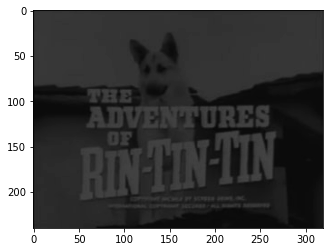

In [73]:
plt.imshow(rintin_gray, cmap="Greys_r", vmin=0, vmax=255)

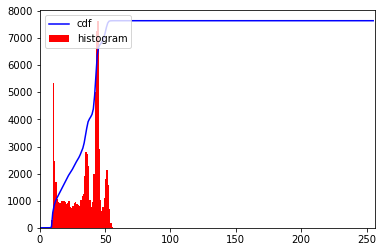

In [74]:

hist,bins = np.histogram(rintin_gray.flatten(),256,[0,256])

cdf = hist.cumsum()
cdf_normalized = cdf * hist.max()/ cdf.max()

plt.plot(cdf_normalized, color = 'b')
plt.hist(rintin_gray.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

## Atividade 1

Realize as seguintes atividades:

1. O histograma fornecido aproveita bem as faixas de cores?
2. Crie uma imagem derivada da imagem fornecida que use melhor a faixa dinâmica, ou seja, tenha o valor dos seus pixels distribuídos entre `0` e `255`. 
3. Plote a imagem pedida

In [75]:
# 2.
def eqreta(x):
    y = ((x - rintin_gray.min())*255)/(rintin_gray.max() - rintin_gray.min())
    return y

saida = np.zeros(rintin_gray.shape, dtype=np.uint8)


for i in range(rintin_gray.shape[0]): #vai percorrer as linhas, altura
    for j in range(rintin_gray.shape[1]): #vai percorrer as colunas, largura
        saida[i][j] = eqreta(rintin_gray[i][j])

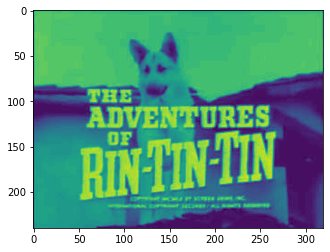

In [76]:
plt.imshow(saida)

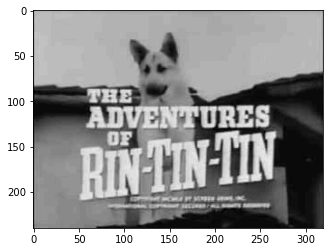

In [77]:
saida_rgb = cv2.cvtColor(saida, cv2.COLOR_GRAY2RGB)
plt.imshow(saida_rgb) #converti do cinza pro rgb

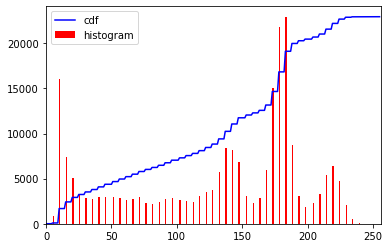

In [82]:
make_hist(saida_rgb,['b','r'], ('cdf','histogram'),plt)

No histograma acima, pode-se observar que alguns valores de x não foram representados nos pixels. 

## Atividade 2

Leia com a OpenCV a figura abaixo:

![](cena_canto_sala.jpg)

Separe os canais  R e B das imagens e analise seus histogramas.

1. A partir dos canais R e B e da análise do histograma é possível identificar a caixa vermelha e o creeper azul?

1. Crie uma imagem numpy em que somente os pixels da caixa vermelha estão brancos e faça seu plot aqui. Você vai precisar usar manipulação de canais RGB. Use o [ExemploFor.ipynb](ExemploFor.ipynb) .


<Figure size 1440x720 with 0 Axes>

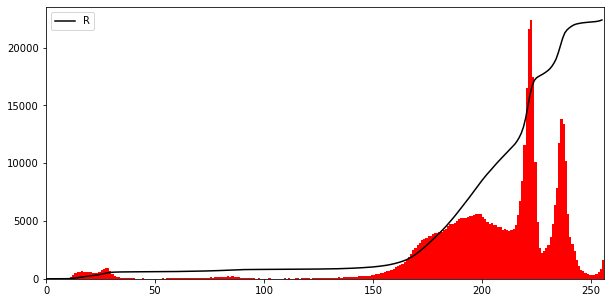

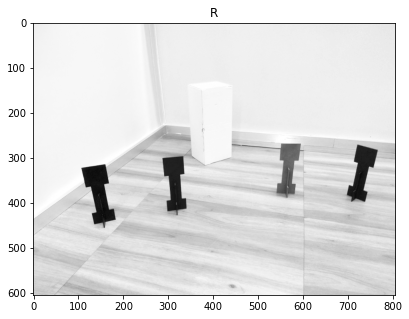

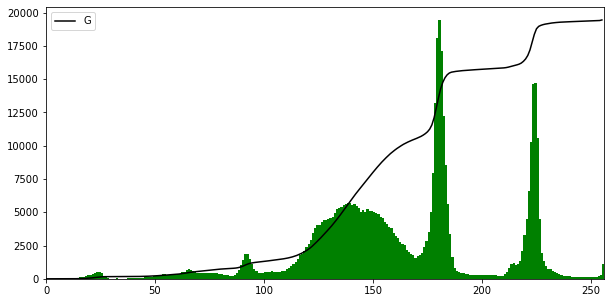

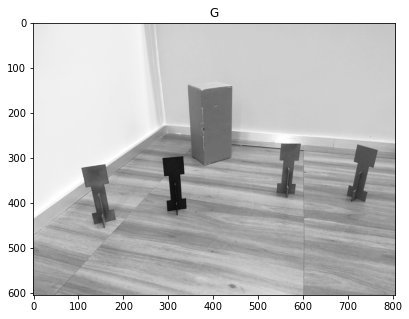

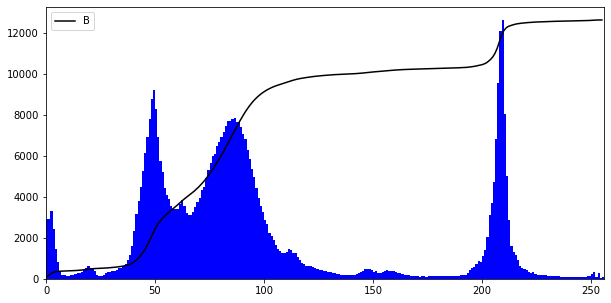

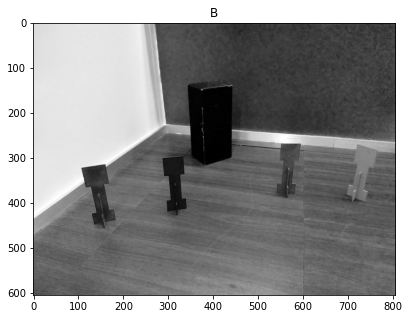

In [103]:
cena = cv2.imread("cena_canto_sala.jpg")
cena = cv2.cvtColor(cena, cv2.COLOR_BGR2RGB)
plot_hists(cena, plt);


In [167]:
caixa_R = cena.copy()
cena.shape 

(605, 806, 3)

In [168]:
for i in range(cena.shape[0]): #vai percorrer as linhas, altura
    for j in range(cena.shape[1]): #vai percorrer as colunas, largura
        if cena[i,j,0] > 230 and cena[i,j,0] <= 255:
            caixa_R[i][j] = 255

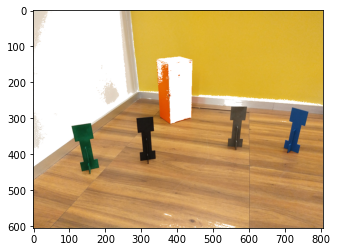

In [169]:
plt.imshow(caixa_R)

OBS: 
- Quanto mais a direita estiver no gráfico, significa que a cor R, G ou B é mais presente, mais intensa
- QUanto maior o pico e mais fino, é provável que tenha um objeto com uma cor mais uniforme
- Os picos mais largos, pode indicar a presenca de um objeto maior e com uma faixa de cores mais variada
- A area do histograma é de certa forma proporcional a área representada na imagem

### Interpretando os gráficos e imagens dos canis rgb

#### R 
Analisando o gráfico do canal R, nota-se três picos mais aparentes. Como a área do histograma é proporcional à área representada na imagem, podemos imaginar que esses picos reprentam 3 objetos na imagem. Fazendo uma análise da esquerda para direita, temos primeiro o pico de menor altura, porém com maior dispersão e área, podendo indicar cores mais variadas. O segundo tem uma dispersao menor, uma área grande e mais brilho. O trerceiro, assim como o segundo, tem baixa variancia, porem um pouco menor, e é o de maior brilho. 

Analisando agora a imagem do canal R, podemos observar que alguns objetos estão mais claros. Isso quer dizer que tais objetos, ou tem cor branca, ou possui uma maior presença da cor R. Comparando com a imagem original, nota-se que a geladeira, as paredes amarela e branca e o chão possuem uma coloração mais clara. Neste caso, isso se deve pois esses objetos possuem maior presenca/intensidade do vermelho, com exceçao da parede branca (branco é R+G+B - juncao de todas as cores). Os outros objetos escuros, indicam que ha pouca ou nenhuma presenca da cor vermelha.

Ao compararmos as duas análises, podemos tirar algumas conclusoes. É bem provável que o primeiro pico esteja representando o chão, porque possui grande área (é o objeto de maior área da img), e uma faixa de cores maior (maior variancia). O segundo pico, pode estar representando a parede amarela, pois possui uma área grande e maior do que a da geladeira, alémn de ter uma cor com menor brilho do que o laranja. Já o terceiro, representa a geladeira de cor laranja, que é o mais próximo da cor vermelha.


#### G
Seguindo a mesma análise feita para o canal R, podemos notar picos parecidos, um mais largo correspondente ao chao e outros dois mais altos corresbondente aos bonecos e à parede.

# Atividade 3


Abra a imagem `hall_box_battery_atividade3.png`  e a converta para tons de cinza de `0` a `255`.

Forneça como saída uma uma cópia da imagem  em que cada pixel  recebe o módulo da subtração entre o pixel que vem depois e o que vem antes dele (na horizontal).

Obs.: O conceito de *antes* e *depois* pode ser na horizontal ou na vertical

Apresente a imagem resultado, deve ficar parecida com a imagem `gabarito_atividade_3.png`.

<img src="gabarito_atividade_3.png" width=400>

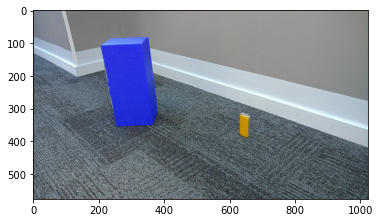

In [234]:
hallbox = cv2.imread("hall_box_battery_atividade3.png")
plt.imshow(hallbox)

In [235]:
hallbox = cv2.cvtColor(hallbox, cv2.COLOR_BGR2GRAY)

In [236]:
hallbox.shape

(576, 1024)

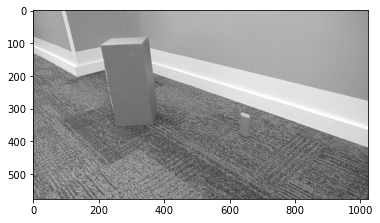

In [256]:
plt.imshow(hallbox, cmap = 'Greys_r')

In [238]:
import math
hb = hallbox.copy()

for i in range(hallbox.shape[0]): #vai percorrer as linhas, altura
    for j in range(hallbox.shape[1]-1): #vai percorrer as colunas, largura
            hb[i][j] = abs((hallbox[i][j+1])-(hallbox[i][j-1]))
#OBS: primeiro e ultimo pixel nao é possivel utilizar essa regra

<ipython-input-238-6b9c7b3ea8b7>:6: RuntimeWarning: overflow encountered in ubyte_scalars
  hb[i][j] = abs((hallbox[i][j+1])-(hallbox[i][j-1]))


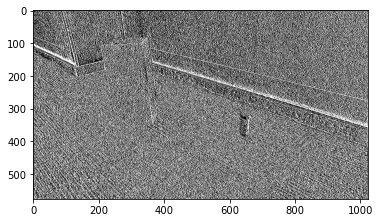

In [239]:
hb_rgb = cv2.cvtColor(hb, cv2.COLOR_GRAY2RGB)
plt.imshow(hb_rgb)

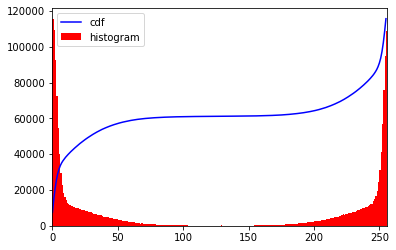

In [240]:
make_hist(hb_rgb,['b','r'], ('cdf','histogram'),plt)

In [241]:
gab = cv2.imread("gabarito_atividade_3.png")
gab_rgb = cv2.cvtColor(gab, cv2.COLOR_BGR2RGB)

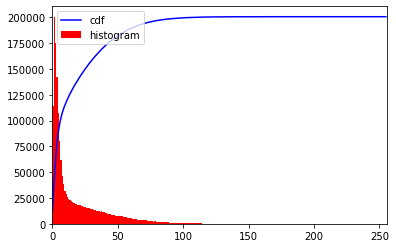

In [242]:
make_hist(gab_rgb,['b','r'], ('cdf','histogram'),plt)

In [254]:
hbv = hallbox.copy()

for i in range(hallbox.shape[0]-1): #vai percorrer as linhas, altura
    for j in range(hallbox.shape[1]): #vai percorrer as colunas, largura
        print(abs(int(hallbox[i+1][j])-int(hallbox[i-1][j])),abs((hallbox[i+1][j])-(hallbox[i-1][j])))
        hbv[i][j] = abs(int(hallbox[i+1][j])-int(hallbox[i-1][j]))

38 38
51 51
47 47
11 11
3 253
1 255
5 5
14 14
18 18
20 20
34 34
53 53
60 60
41 41
39 39
50 50
43 43
37 37
49 49
47 47
56 56
40 40
9 247
9 9
56 56
67 67
68 68
51 51
57 57
72 72
63 63
66 66
81 81
80 80
68 68
48 48
34 34
36 36
44 44
37 37
36 36
32 32
29 29
42 42
46 46
42 42
41 41
22 22
26 26
53 53
40 40
7 7
10 246
15 15
28 28
14 14
25 25
39 39
24 24
20 20
23 23
35 35
49 49
45 45
7 7
4 4
43 43
62 62
61 61
63 63
40 40
25 25
14 14
27 27
24 24
8 8
2 2
15 15
22 22
46 46
43 43
12 12
18 18
32 32
54 54
70 70
73 73
81 81
104 104
101 101
106 106
117 117
130 130
111 111
96 96
95 95
89 89
94 94
59 59
1 1
10 246
3 253
13 13
28 28
27 27
27 27
17 17
17 17
38 38
33 33
0 0
5 251
3 253
10 10
2 2
21 235
26 230
17 239
22 234
53 203
28 228
13 13
11 11
32 32
56 56
45 45
50 50
42 42
13 13
10 10
3 253
3 253
13 243
37 219
30 226
21 235
23 233
23 233
9 247
13 13
29 29
34 34
24 24
15 15
13 13
17 17
13 13
13 13
9 247
37 219
23 233
2 254
5 5
3 253
7 249
6 250
9 247
11 11
49 49
48 48
8 8
2 2
19 19
26 26
21 21
18 18
10

<ipython-input-254-0b6772f20c48>:5: RuntimeWarning: overflow encountered in ubyte_scalars
  print(abs(int(hallbox[i+1][j])-int(hallbox[i-1][j])),abs((hallbox[i+1][j])-(hallbox[i-1][j])))



39 39
43 43
51 51
30 30
39 39
75 75
86 86
91 91
99 99
88 88
71 71
40 40
56 56
62 62
63 63
68 68
45 45
34 34
37 37
30 30
27 27
32 32
56 56
58 58
60 60
88 88
93 93
83 83
96 96
109 109
113 113
88 88
79 79
70 70
56 56
55 55
44 44
38 38
58 58
75 75
54 54
36 36
40 40
61 61
66 66
65 65
93 93
102 102
83 83
104 104
94 94
101 101
123 123
101 101
81 81
77 77
60 60
45 45
34 34
38 38
41 41
44 44
65 65
89 89
87 87
61 61
42 42
30 30
37 37
82 82
98 98
70 70
65 65
71 71
70 70
73 73
71 71
33 33
7 7
53 53
79 79
77 77
88 88
90 90
50 50
41 41
32 32
50 50
58 58
52 52
35 35
35 35
50 50
80 80
80 80
52 52
45 45
29 29
25 25
51 51
74 74
73 73
66 66
67 67
64 64
60 60
61 61
30 30
27 27
45 45
44 44
27 27
20 20
55 55
90 90
88 88
82 82
87 87
84 84
86 86
109 109
99 99
53 53
23 23
17 17
49 49
42 42
24 24
44 44
74 74
69 69
70 70
77 77
80 80
66 66
52 52
52 52
34 34
29 29
33 33
35 35
31 31
38 38
68 68
79 79
85 85
72 72
84 84
88 88
57 57
50 50
51 51
78 78
82 82
58 58
46 46
63 63
53 53
37 37
32 32
37 37
51 51
56 56
56 56
7

1 255
0 0
2 254
1 255
7 7
7 7
4 252
9 247
2 2
2 2
2 2
4 4
4 252
5 251
5 5
1 1
3 3
1 255
6 250
4 4
7 7
2 2
2 254
4 4
6 6
0 0
4 252
7 7
5 5
5 251
1 255
3 253
1 1
1 1
2 254
2 254
3 3
1 1
1 255
2 254
3 3
6 6
2 2
7 249
5 251
1 255
2 254
4 252
0 0
4 4
1 255
1 255
0 0
3 253
2 2
3 3
0 0
5 5
6 6
0 0
0 0
2 254
1 1
2 254
1 255
4 252
1 1
0 0
6 250
4 4
2 2
2 2
4 4
0 0
1 255
1 1
2 254
1 255
2 2
4 4
1 1
4 252
0 0
5 5
3 253
0 0
5 5
0 0
3 253
3 3
2 2
2 2
7 7
5 251
2 254
1 1
4 252
3 253
4 4
2 254
4 4
4 4
2 2
1 1
2 2
2 2
9 247
9 247
6 250
1 1
3 3
1 1
4 4
1 255
3 253
2 254
0 0
3 253
7 249
1 1
2 2
4 252
3 253
4 4
5 5
9 9
1 1
4 252
2 254
4 252
2 254
1 1
3 3
3 3
0 0
4 252
2 2
2 2
3 3
4 4
1 255
1 1
3 3
9 247
2 254
8 8
4 4
1 255
1 1
7 7
1 255
4 252
2 254
0 0
1 255
3 3
3 3
2 2
3 3
2 2
3 253
3 3
4 4
7 249
3 253
1 1
0 0
2 254
4 252
2 254
0 0
3 253
0 0
5 5
3 3
5 251
1 255
8 8
4 4
3 3
3 3
3 253
0 0
2 2
2 2
0 0
3 3
4 252
4 252
2 2
6 6
7 7
7 7
2 254
2 254
1 1
6 250
1 255
0 0
3 3
6 250
4 252
2 254
0 0
6 250
4 252
0 0


9 247
1 255
0 0
3 253
3 253
2 254
5 251
1 255
4 4
1 1
2 254
3 3
2 2
4 252
6 250
4 252
8 248
2 254
6 6
4 4
3 3
4 252
2 254
0 0
1 255
4 4
11 11
3 3
1 255
1 1
1 255
2 2
3 253
7 249
1 1
1 255
0 0
4 4
1 1
3 253
2 2
4 4
1 1
2 254
5 5
3 3
0 0
1 1
2 254
2 2
1 1
3 3
4 4
6 250
7 249
3 3
5 5
0 0
3 253
4 252
3 253
4 4
6 6
2 254
2 254
4 252
1 1
6 6
3 253
9 247
5 251
0 0
2 254
3 253
1 255
3 253
11 245
7 249
5 5
3 3
2 2
6 250
3 253
3 3
1 1
2 254
2 254
3 253
5 5
4 4
1 1
0 0
7 7
4 4
2 254
2 254
4 4
2 2
3 253
0 0
0 0
1 1
2 2
3 253
3 253
3 3
3 253
3 253
1 1
6 250
3 3
4 4
2 2
3 253
1 1
1 1
0 0
8 8
0 0
3 253
1 255
2 254
3 253
5 5
1 1
2 2
0 0
7 249
4 252
1 255
5 5
4 252
4 252
5 5
3 3
3 253
5 251
5 5
0 0
3 253
0 0
4 252
4 4
2 2
3 253
1 1
1 1
9 247
1 255
1 255
10 246
10 246
3 253
2 2
1 1
10 10
9 9
5 5
0 0
8 248
3 253
3 253
0 0
1 255
1 255
2 2
6 6
5 5
1 1
1 255
4 4
4 4
0 0
2 254
8 248
5 251
1 1
4 4
7 7
2 2
3 253
2 254
1 1
3 3
3 3
7 249
3 253
0 0
6 6
6 6
5 251
1 255
7 7
3 253
9 247
0 0
0 0
0 0
1 255
1 1
1 255
4

1 255
1 255
2 254
1 1
2 2
1 1
0 0
2 254
1 255
8 248
5 251
1 255
0 0
3 3
2 254
7 249
3 253
3 253
2 254
2 254
7 249
1 255
5 251
11 245
3 3
2 2
3 3
0 0
3 253
3 3
1 1
1 255
6 6
2 2
7 249
0 0
4 4
2 254
1 255
4 4
2 2
2 254
4 252
2 254
1 255
0 0
1 255
2 254
3 3
4 252
1 1
4 4
3 253
3 253
0 0
1 255
6 250
1 255
2 2
0 0
3 3
3 3
7 7
4 4
2 2
3 253
1 255
3 3
2 2
2 2
0 0
1 255
3 3
2 254
3 253
1 255
3 253
0 0
0 0
9 247
3 3
7 7
6 250
1 255
2 2
0 0
3 3
1 255
5 251
5 5
5 5
2 254
7 249
5 251
3 3
2 2
3 253
2 254
2 2
1 255
3 253
0 0
4 4
1 1
5 251
3 3
5 5
2 2
4 252
3 253
1 1
2 2
1 1
0 0
2 254
6 250
0 0
7 7
5 5
3 3
3 3
1 1
0 0
1 1
10 10
4 4
7 249
2 254
0 0
3 3
4 252
6 250
1 1
3 3
3 253
0 0
1 255
4 252
6 250
2 2
2 2
2 2
3 3
3 3
0 0
3 253
1 1
0 0
1 1
4 252
4 252
5 5
1 1
2 254
5 5
1 1
5 251
3 3
1 1
2 254
3 3
3 3
2 254
1 255
0 0
5 251
2 254
8 8
2 2
2 254
1 1
6 250
4 252
2 254
0 0
3 3
2 2
4 4
1 255
3 3
1 1
3 253
1 255
1 1
3 3
1 255
2 2
2 2
0 0
1 255
1 255
2 2
0 0
1 255
2 254
8 8
4 4
2 2
9 9
12 12
2 2
5 251
7 249
5

1 255
3 253
3 253
0 0
1 1
2 254
6 6
8 8
3 3
1 255
3 253
2 254
4 252
0 0
1 1
3 253
0 0
3 3
2 2
3 253
1 255
1 255
1 1
2 2
1 255
2 2
1 255
4 252
4 252
3 3
0 0
5 251
3 253
2 254
2 254
1 1
1 1
1 255
7 7
6 6
1 255
2 254
2 2
4 252
2 254
4 4
5 5
2 254
3 253
1 255
1 1
2 2
3 253
4 252
1 255
2 254
2 254
3 253
2 2
1 255
2 2
1 1
2 254
3 253
2 2
3 3
1 1
1 1
1 1
5 5
0 0
7 7
5 5
3 253
1 1
5 5
3 3
3 253
3 253
1 1
0 0
2 254
4 252
4 4
5 5
1 255
3 253
2 2
1 255
3 253
0 0
4 4
1 1
4 252
1 255
0 0
4 4
1 1
4 4
4 252
1 255
3 3
2 254
4 4
3 3
5 5
1 1
0 0
1 1
5 251
1 1
1 255
2 254
2 2
6 6
1 255
1 255
2 254
5 251
1 255
0 0
3 253
2 254
4 252
4 252
1 1
3 253
2 2
8 8
0 0
1 255
7 7
5 5
1 255
3 253
3 253
3 3
3 3
6 250
2 254
4 4
3 3
5 5
4 252
5 251
7 7
5 5
2 254
2 2
3 3
4 4
3 253
5 251
5 5
2 254
5 251
1 255
6 6
1 1
2 254
2 2
4 4
3 3
1 255
5 5
1 1
2 254
3 253
2 254
4 252
1 1
3 3
2 2
7 249
2 254
5 5
1 255
2 254
0 0
3 3
5 5
4 252
5 251
4 4
1 255
4 252
4 4
3 3
1 255
5 251
6 250
0 0
1 1
2 254
3 3
3 253
1 255
2 254
1 255
1 25

1 1
2 2
1 1
3 3
3 3
2 2
3 253
8 248
1 1
3 3
1 255
1 1
2 2
0 0
0 0
1 255
1 255
1 1
1 1
2 2
1 255
0 0
5 5
0 0
2 2
6 6
1 255
2 254
1 255
1 1
3 3
1 1
1 1
3 253
0 0
2 2
6 6
6 6
4 252
8 248
3 3
6 6
4 252
4 252
3 253
5 251
9 247
3 253
0 0
1 255
0 0
4 252
3 253
0 0
3 253
5 251
4 252
2 2
4 4
1 1
3 3
2 2
5 251
4 252
2 254
1 255
0 0
2 2
2 2
2 2
1 255
3 3
2 2
0 0
3 3
1 1
2 254
0 0
0 0
7 249
3 3
5 5
1 255
5 251
3 253
2 254
5 251
0 0
0 0
0 0
2 2
6 6
6 6
1 255
3 253
5 5
2 2
2 2
1 1
2 254
0 0
4 4
5 251
2 254
3 3
6 6
3 3
1 255
5 251
0 0
4 4
9 9
4 4
3 253
1 255
1 255
2 254
3 3
2 2
2 254
3 3
1 1
1 255
6 250
4 252
3 3
1 1
2 254
1 255
1 255
3 3
1 255
2 254
3 253
2 2
1 1
2 254
2 2
2 254
1 1
2 2
0 0
2 2
1 255
5 251
3 253
4 4
4 4
1 255
2 2
9 9
1 255
5 251
7 249
2 2
4 4
3 253
1 255
6 250
3 253
3 3
0 0
3 253
0 0
3 253
2 254
5 5
2 2
1 1
2 2
1 1
0 0
6 6
5 5
4 4
2 254
3 253
1 1
1 1
1 255
3 253
3 253
1 1
1 255
0 0
3 253
3 3
0 0
3 253
2 2
4 252
0 0
7 7
4 4
3 3
2 2
2 254
5 251
3 253
0 0
4 4
0 0
3 253
3 3
1 1
4 252
2 

2 254
4 4
3 253
1 1
3 3
3 253
1 255
1 255
4 252
7 249
2 254
1 1
0 0
2 254
2 254
1 255
1 255
0 0
2 254
1 1
2 2
1 1
3 3
5 251
2 2
1 1
0 0
5 5
1 255
3 3
2 2
2 254
4 252
0 0
4 4
0 0
3 3
10 10
1 1
1 255
3 3
4 4
3 3
2 254
2 254
1 255
0 0
1 255
2 2
4 4
2 2
1 1
0 0
2 254
0 0
5 251
3 3
4 4
4 252
1 1
3 3
3 253
1 1
1 1
3 253
0 0
3 3
3 253
1 255
1 1
3 253
2 254
1 255
4 252
5 251
4 4
3 3
4 252
3 253
3 3
1 1
1 255
3 3
1 1
2 254
4 252
2 254
2 2
6 6
1 255
1 255
2 2
2 254
4 252
3 3
7 7
1 255
1 1
2 2
2 2
6 6
0 0
0 0
2 254
0 0
3 3
4 4
0 0
2 254
2 254
1 1
8 8
5 5
2 2
0 0
0 0
3 3
3 253
5 251
1 255
5 251
3 253
2 2
2 2
2 254
0 0
3 253
0 0
10 10
1 255
7 249
2 2
5 5
4 4
1 1
2 254
1 1
6 6
1 1
4 252
7 249
6 250
1 255
1 1
3 253
2 254
2 254
1 255
1 255
1 1
1 255
2 2
0 0
2 2
1 1
2 254
4 4
7 7
2 254
4 252
7 249
6 250
0 0
3 3
4 4
1 1
7 249
4 252
0 0
2 254
2 254
3 253
1 1
0 0
0 0
1 1
5 5
5 5
0 0
1 1
2 2
2 254
1 255
1 1
3 253
2 2
1 1
0 0
3 253
1 1
1 1
6 250
3 3
1 1
1 255
7 249
0 0
2 2
3 253
10 246
2 2
5 5
2 2
5 251
9 2

0 0
3 3
1 1
3 253
1 1
0 0
1 255
1 1
0 0
3 3
2 2
6 250
0 0
1 1
2 254
1 1
1 1
3 3
2 2
2 254
0 0
2 2
0 0
5 251
1 255
6 6
1 1
1 255
1 1
3 3
1 1
2 254
1 1
3 253
1 255
3 3
4 4
0 0
1 1
4 4
2 2
1 1
1 1
1 255
3 253
0 0
0 0
4 4
6 6
1 255
1 1
1 1
0 0
2 254
1 1
2 254
0 0
5 5
3 3
1 1
3 253
0 0
1 255
2 2
1 1
2 2
1 1
6 250
3 253
2 254
3 3
6 6
4 252
4 252
2 254
4 252
1 255
2 254
1 1
0 0
1 1
4 4
0 0
3 253
4 252
8 248
0 0
0 0
2 254
3 253
5 251
0 0
5 5
0 0
2 2
4 4
4 252
0 0
1 1
1 255
1 255
1 1
2 2
5 5
2 2
3 253
0 0
3 253
5 251
4 4
3 3
0 0
4 4
2 254
4 252
5 5
2 2
3 253
3 3
5 5
1 1
1 1
1 255
4 252
2 2
4 4
0 0
1 255
3 253
1 255
3 253
2 2
1 1
1 1
3 253
2 254
3 253
2 254
1 255
0 0
0 0
2 2
1 255
6 250
1 255
2 254
1 255
0 0
5 251
1 255
2 2
5 5
2 2
6 250
8 248
3 3
4 4
2 2
2 254
5 251
1 255
3 253
1 255
5 5
2 254
2 254
2 2
2 254
1 1
2 2
3 253
4 252
1 1
0 0
1 1
1 1
1 255
0 0
1 1
3 253
2 254
6 250
4 252
3 3
0 0
5 251
2 254
2 2
4 4
1 1
4 252
2 2
3 3
3 3
3 3
0 0
2 254
2 254
3 253
0 0
3 3
3 253
1 1
6 6
5 251
4 252
5 5


2 2
2 254
1 255
0 0
3 253
3 253
1 1
0 0
2 254
5 251
0 0
1 1
4 252
1 255
3 253
0 0
2 254
5 251
4 252
1 255
3 3
1 1
0 0
2 2
0 0
0 0
0 0
3 253
0 0
1 1
2 254
5 5
4 4
1 1
3 253
3 253
1 1
5 5
5 5
0 0
0 0
1 255
0 0
4 252
2 2
1 1
2 2
6 6
2 254
2 2
0 0
1 255
2 254
1 1
1 1
0 0
3 253
3 253
2 254
1 255
6 6
1 255
1 1
3 3
1 1
2 254
4 252
1 255
2 254
1 255
1 255
1 255
0 0
1 1
3 253
2 254
0 0
4 4
0 0
2 2
2 2
4 252
1 1
0 0
3 253
2 254
2 2
1 255
2 254
2 2
0 0
4 252
2 254
3 3
3 253
0 0
4 4
3 253
7 249
2 2
2 2
4 252
0 0
1 255
4 4
4 4
1 255
1 255
0 0
2 2
1 1
4 4
2 254
1 255
0 0
3 3
7 7
5 5
2 254
3 253
3 3
1 1
3 3
3 3
0 0
0 0
1 255
7 249
0 0
5 5
5 251
0 0
5 5
5 5
5 5
2 254
3 253
2 2
4 4
5 5
2 2
2 254
1 1
1 255
4 252
0 0
5 251
4 252
1 1
2 254
1 255
2 254
0 0
4 252
2 254
3 3
1 1
2 2
3 253
2 254
2 2
2 254
1 255
0 0
4 252
3 253
1 1
1 255
6 250
6 250
3 253
3 3
2 2
3 253
2 254
2 254
1 1
4 4
0 0
2 2
4 252
4 4
1 1
3 3
3 3
1 1
2 254
2 254
1 1
2 2
2 254
0 0
0 0
2 2
2 254
0 0
3 3
4 4
2 254
0 0
0 0
1 255
4 4
3 3
5 251


2 2
6 6
3 3
2 2
1 255
1 1
5 5
0 0
1 1
5 5
5 5
1 1
2 2
5 5
1 1
4 252
2 2
3 3
3 253
2 254
1 255
1 1
3 3
3 3
0 0
0 0
4 4
3 3
2 254
5 251
3 253
4 252
1 1
2 2
2 254
4 4
1 1
6 6
0 0
5 251
2 2
3 3
1 255
1 1
6 250
4 252
1 255
1 255
4 252
0 0
1 255
1 255
3 3
4 4
1 255
4 252
6 6
1 1
1 1
6 6
2 254
4 252
1 255
2 2
1 1
3 3
4 252
1 1
0 0
3 253
2 2
0 0
0 0
3 3
0 0
1 255
4 252
0 0
1 255
2 2
2 2
3 253
0 0
1 1
0 0
1 1
0 0
3 253
1 1
1 1
2 2
1 255
0 0
1 255
2 254
1 1
2 2
2 2
3 3
0 0
3 253
5 251
1 1
3 3
1 255
1 255
1 1
0 0
2 2
4 252
1 255
3 3
2 254
3 253
2 254
2 2
1 1
1 255
4 252
4 252
2 254
1 1
2 254
4 252
2 2
1 255
1 1
2 254
6 250
1 1
0 0
0 0
2 2
2 2
2 254
2 2
2 254
3 3
3 3
2 2
0 0
1 255
3 3
2 254
1 255
1 1
1 1
5 5
3 253
2 2
1 1
1 255
1 1
2 2
1 1
0 0
1 1
2 254
3 253
1 1
1 255
2 2
2 2
0 0
0 0
2 2
2 2
2 254
1 255
1 1
2 2
1 1
2 254
0 0
4 252
2 254
0 0
4 252
1 1
8 8
3 253
7 249
1 255
4 4
3 3
1 255
5 251
0 0
3 3
2 254
1 1
1 255
3 253
2 2
1 255
2 254
3 253
2 254
3 253
4 4
1 1
6 250
1 1
2 254
4 252
1 1
3 3
5 5


1 255
1 255
0 0
8 8
2 254
5 251
3 253
3 253
3 3
0 0
2 254
4 4
3 3
4 252
1 255
1 255
0 0
1 1
0 0
1 255
1 255
0 0
4 4
2 254
3 3
1 1
1 1
1 1
3 253
6 6
4 4
1 255
1 1
1 1
0 0
2 2
2 254
2 254
5 251
6 250
2 254
5 5
2 2
0 0
0 0
2 254
2 254
2 254
7 249
0 0
7 7
4 252
3 253
2 254
2 2
1 255
2 2
4 252
4 252
8 8
7 7
3 253
1 1
2 2
2 254
1 1
5 5
3 253
2 2
2 2
3 3
2 2
5 251
5 251
3 253
2 2
4 4
6 250
2 2
3 3
3 3
1 1
5 5
2 2
0 0
6 6
3 253
7 249
1 1
1 255
6 250
0 0
2 254
0 0
0 0
4 252
1 1
5 5
1 255
2 2
2 254
1 255
0 0
4 4
2 2
1 255
1 255
3 3
4 252
2 2
6 6
1 1
4 252
1 1
2 254
1 255
6 6
1 1
2 254
2 2
3 3
0 0
2 254
1 1
2 2
1 1
0 0
2 2
2 2
2 254
0 0
1 1
7 249
3 3
5 5
2 2
0 0
2 254
1 255
1 1
3 3
3 3
3 3
3 253
2 254
4 4
3 253
4 252
4 252
4 252
1 1
3 253
1 255
3 3
5 5
3 3
3 3
0 0
2 2
3 3
2 254
3 253
1 255
0 0
3 253
4 4
4 4
0 0
1 1
5 251
3 253
2 2
4 4
1 1
3 253
1 255
2 254
6 250
5 251
4 252
7 7
2 2
4 252
2 254
2 2
2 254
5 251
1 255
2 254
2 254
0 0
9 9
2 2
7 249
1 1
2 254
4 252
0 0
2 2
1 255
2 2
3 3
3 253
7 249
0 

5 5
3 253
7 249
0 0
1 1
4 252
3 253
4 4
1 1
3 253
2 254
1 255
3 3
3 253
4 252
1 1
5 5
1 255
4 252
2 2
2 254
1 1
2 254
6 250
1 1
1 255
5 251
2 2
2 2
0 0
3 253
0 0
8 8
2 2
2 254
1 1
1 255
5 251
3 3
3 3
0 0
1 1
3 253
10 10
3 3
1 1
0 0
3 253
0 0
7 249
4 252
3 253
1 255
2 254
1 1
7 7
4 252
2 2
5 5
4 252
3 253
3 253
1 1
3 3
1 255
7 249
24 232
10 246
4 4
4 4
1 255
0 0
1 1
4 4
2 2
2 2
1 255
14 14
21 21
4 252
5 251
0 0
1 255
3 3
4 4
1 1
2 254
6 250
5 5
7 7
0 0
2 254
4 4
5 5
2 254
5 251
1 1
5 5
3 3
4 252
2 2
0 0
3 3
6 6
2 254
2 254
2 2
4 4
6 6
2 254
2 254
7 7
5 5
4 4
3 3
5 251
2 254
0 0
11 245
3 253
5 5
2 254
0 0
0 0
0 0
1 255
3 253
5 5
3 253
0 0
3 3
2 254
1 1
3 3
2 2
2 2
3 253
3 253
2 254
3 3
1 255
8 248
2 2
1 1
1 1
0 0
3 3
0 0
3 253
2 254
6 6
1 1
0 0
4 4
1 1
3 253
2 254
2 2
0 0
1 1
2 254
1 1
2 2
3 3
0 0
4 252
2 254
1 255
4 4
3 3
2 254
3 253
1 1
2 254
0 0
3 3
5 5
7 7
2 2
7 249
0 0
3 253
1 1
3 3
1 1
6 6
9 9
4 4
3 253
1 1
2 2
0 0
2 2
5 5
2 2
2 2
0 0
5 251
4 252
2 2
1 1
3 253
3 253
1 255
6 250
2 2

3 3
2 254
0 0
1 1
2 2
2 254
3 253
2 2
2 254
11 245
0 0
6 6
0 0
1 255
7 249
9 247
1 255
2 254
0 0
7 7
2 254
0 0
0 0
2 254
1 1
5 251
5 251
2 2
4 252
0 0
1 1
6 250
1 255
0 0
2 254
4 4
5 5
2 254
1 255
2 254
3 253
3 253
1 1
1 255
10 246
1 255
5 5
2 2
1 1
1 1
5 251
2 254
6 6
1 255
4 252
4 252
2 254
2 254
2 254
2 2
5 5
2 2
2 254
3 253
0 0
4 4
2 2
2 2
4 4
2 254
5 251
6 6
5 5
2 254
1 1
2 254
1 255
1 1
0 0
6 250
5 251
5 5
2 2
3 3
2 2
1 255
2 254
4 4
8 8
0 0
2 254
0 0
2 2
5 5
2 2
2 2
0 0
3 3
1 255
4 252
3 253
4 252
4 4
4 4
3 253
2 2
12 12
0 0
5 251
1 1
5 5
3 253
5 251
3 253
3 3
1 1
1 1
1 255
2 2
1 255
1 1
3 3
2 2
0 0
0 0
0 0
3 253
2 2
3 3
0 0
5 251
2 2
4 252
6 250
3 253
3 3
3 3
6 6
6 6
1 1
2 254
5 251
1 1
8 8
1 255
6 250
7 7
0 0
1 1
3 3
2 254
2 254
3 253
4 252
2 2
3 3
1 1
1 255
5 251
9 247
3 3
6 6
3 3
0 0
1 255
9 9
2 2
2 2
3 253
4 4
3 3
4 252
7 249
0 0
6 6
4 4
1 1
8 248
3 3
4 4
5 251
10 246
2 254
4 252
3 253
0 0
9 247
2 254
4 4
1 255
3 3
6 6
7 249
5 251
7 7
3 253
2 254
0 0
3 253
4 252
1 1
2 254
0

4 4
5 251
4 252
3 3
3 253
2 2
3 253
3 3
4 4
2 254
5 251
1 255
6 250
1 255
2 2
6 250
0 0
1 255
4 252
3 253
2 2
2 2
3 253
2 2
1 255
2 254
1 1
1 1
1 255
2 254
1 255
6 6
2 2
2 254
3 3
5 251
1 255
5 5
3 253
2 254
1 255
0 0
2 2
2 254
3 253
2 2
0 0
1 1
4 4
2 254
1 255
0 0
1 255
2 254
1 1
0 0
1 255
0 0
0 0
1 255
2 254
3 253
3 253
1 255
2 2
2 2
2 2
2 2
1 1
6 6
1 255
1 1
1 1
6 250
2 254
2 254
2 254
1 255
2 254
3 253
0 0
5 5
0 0
4 252
2 2
5 251
1 255
6 6
1 1
6 250
8 248
1 255
1 1
1 255
6 250
8 248
2 254
3 253
1 1
3 3
1 255
2 2
3 3
1 1
2 254
1 1
1 255
1 255
2 254
4 252
1 255
1 1
0 0
1 1
1 1
1 1
5 251
5 251
2 254
0 0
3 253
7 249
5 251
2 2
3 3
4 252
2 254
0 0
0 0
4 252
7 249
1 255
1 1
2 254
1 255
2 2
3 3
1 255
1 1
0 0
1 1
1 255
2 2
3 253
5 251
2 2
1 1
1 255
0 0
3 253
3 253
3 3
1 255
2 254
5 251
2 254
6 250
3 253
4 4
4 252
3 253
1 255
2 254
4 252
5 251
1 1
3 253
3 253
2 2
3 253
6 250
0 0
1 1
3 3
2 254
5 5
8 8
1 255
6 6
6 6
3 253
0 0
1 255
7 249
3 3
10 10
0 0
7 7
3 3
6 250
3 253
1 255
1 1
1 1
4 252
6 

0 0
5 5
4 4
1 1
4 252
0 0
1 1
3 3
4 4
4 252
6 250
5 5
2 2
2 2
2 2
2 2
1 255
3 253
4 252
1 255
3 3
1 1
4 4
1 1
3 253
5 5
6 6
1 1
1 255
1 255
2 254
0 0
6 6
0 0
2 254
4 4
2 2
1 1
1 1
3 3
1 255
3 253
2 254
2 2
6 6
2 254
7 249
2 2
2 2
1 255
1 255
2 254
0 0
0 0
2 2
7 7
1 1
1 1
3 3
2 254
4 252
6 250
3 253
6 6
1 1
2 254
3 253
2 254
3 3
2 254
2 2
0 0
2 2
3 253
2 254
2 2
1 1
1 1
5 251
3 253
1 255
2 2
1 1
5 251
1 255
2 254
3 253
4 252
3 3
4 252
3 253
1 1
2 2
0 0
1 1
1 1
3 253
3 253
0 0
1 1
2 254
3 3
1 1
2 254
3 3
0 0
0 0
2 2
1 255
1 255
5 5
1 255
1 1
1 1
2 254
2 2
1 1
5 251
2 254
2 254
2 254
1 255
4 252
3 3
1 1
0 0
2 2
0 0
3 253
1 1
2 2
0 0
7 249
3 253
2 254
1 1
2 2
1 255
2 254
2 254
5 5
1 1
4 252
2 2
6 6
3 3
1 1
2 2
1 255
2 254
5 5
4 4
3 253
0 0
2 254
3 253
1 255
3 3
5 5
2 254
1 1
1 255
3 3
0 0
1 1
4 4
7 7
1 1
3 3
1 1
2 2
6 6
1 1
1 255
3 253
2 2
0 0
1 1
3 253
2 254
4 4
1 1
2 2
2 2
0 0
2 254
3 3
2 254
0 0
5 5
3 253
2 2
0 0
6 250
1 1
3 3
1 255
3 3
4 4
4 4
2 2
3 3
3 253
2 2
2 2
2 254
1 1
2 2
6 250


5 251
6 250
3 253
1 1
3 3
3 3
2 254
1 1
0 0
0 0
2 2
3 253
4 252
4 252
7 249
3 253
1 255
5 5
0 0
2 254
4 4
2 254
0 0
3 3
2 254
1 1
5 5
2 2
1 1
1 255
1 255
3 3
6 6
3 253
1 1
5 5
2 254
0 0
4 252
2 2
2 2
3 253
1 1
4 252
5 251
2 254
3 253
0 0
1 255
1 255
1 1
1 1
1 255
1 255
2 254
3 3
0 0
2 254
0 0
1 255
2 2
2 254
4 252
1 1
4 4
4 4
2 254
0 0
6 250
2 2
3 3
4 252
1 1
0 0
2 254
2 254
1 255
0 0
3 3
3 3
0 0
1 255
4 252
1 255
1 1
2 254
2 254
1 255
1 1
7 249
2 254
3 3
4 4
2 2
0 0
3 3
1 255
2 254
2 254
1 255
0 0
1 255
2 254
0 0
2 2
1 255
1 1
2 2
3 3
0 0
5 251
1 255
0 0
0 0
1 255
1 255
1 1
1 255
2 2
0 0
0 0
3 253
6 250
1 255
0 0
0 0
4 252
1 255
2 2
5 251
0 0
2 2
4 4
4 4
4 4
4 4
1 1
1 255
2 254
0 0
3 3
1 1
2 254
1 255
1 255
0 0
0 0
2 2
2 2
2 2
3 253
2 254
2 254
2 254
5 5
0 0
1 255
2 254
1 255
0 0
3 3
6 6
4 4
5 251
7 249
6 250
1 255
6 6
4 4
4 252
2 2
3 253
1 1
7 7
7 249
0 0
2 2
3 253
2 2
3 3
1 255
3 253
2 2
0 0
3 3
3 3
0 0
4 252
3 3
4 252
6 250
1 1
3 3
0 0
1 1
6 250
1 255
3 3
6 6
3 3
2 2
2 2
1 255
0 0


3 253
1 1
1 255
3 3
2 2
2 2
2 2
0 0
1 255
1 255
5 5
1 1
1 1
0 0
3 253
1 255
4 4
4 4
2 254
1 255
3 253
4 252
3 253
0 0
3 253
2 254
1 255
4 252
1 255
4 252
4 4
2 254
6 250
3 3
5 5
7 7
2 2
5 251
1 255
2 254
2 2
1 255
6 250
6 250
2 2
2 2
2 254
1 255
5 251
6 250
1 255
8 8
1 255
4 4
5 5
2 2
0 0
4 4
4 4
1 1
1 1
4 252
4 252
4 4
5 251
7 249
0 0
1 1
0 0
3 3
1 255
2 254
2 2
2 2
1 255
0 0
1 1
0 0
0 0
1 1
0 0
1 255
3 3
1 1
3 253
2 254
2 2
4 252
1 255
3 253
0 0
2 2
2 2
1 1
0 0
5 251
1 255
2 254
7 249
2 2
3 3
1 255
1 255
4 252
2 254
1 1
0 0
2 2
2 2
3 3
4 252
1 255
5 5
1 255
5 251
2 254
1 255
3 253
4 4
0 0
4 252
7 249
4 4
5 5
2 254
2 254
2 2
4 4
4 252
4 252
3 3
2 2
5 251
4 252
6 6
5 5
4 4
3 253
4 252
1 255
1 1
0 0
5 5
2 2
6 250
2 2
3 3
3 253
6 6
1 1
5 5
2 2
0 0
3 3
1 255
1 1
1 255
2 254
3 253
0 0
5 251
1 1
3 253
1 1
5 5
0 0
7 249
5 5
1 255
5 251
1 1
1 255
2 254
2 254
1 255
2 2
1 1
0 0
1 255
2 2
0 0
2 254
0 0
1 255
2 2
1 1
0 0
2 2
0 0
1 255
1 255
2 254
1 1
4 4
0 0
1 255
1 255
2 254
1 255
3 253
1 255
4 

1 1
1 255
3 253
5 5
2 2
1 1
4 4
4 4
2 2
3 3
2 2
3 253
2 2
4 4
6 250
2 254
4 4
4 4
10 10
3 3
0 0
0 0
5 251
10 246
5 251
2 2
5 5
2 254
6 6
2 2
2 2
6 6
1 1
4 4
2 2
7 249
1 1
2 2
1 255
2 2
2 254
0 0
10 10
1 1
5 251
4 252
6 250
4 252
0 0
3 253
1 255
5 5
1 255
5 251
5 5
9 9
10 10
2 2
1 255
0 0
9 9
5 5
1 1
4 4
3 3
0 0
1 255
5 5
1 1
6 250
1 255
3 3
0 0
3 253
2 254
3 253
3 3
0 0
6 6
5 5
3 253
6 250
1 1
2 2
1 255
0 0
3 253
0 0
0 0
3 3
8 8
8 8
2 254
10 246
9 247
6 250
4 252
4 252
0 0
2 2
7 249
6 250
1 255
3 3
8 8
4 4
2 2
4 4
2 2
2 2
2 2
1 1
1 255
2 2
0 0
9 247
4 252
1 1
2 2
3 3
1 1
1 1
1 1
0 0
8 248
7 249
3 253
0 0
6 6
3 3
3 253
2 254
8 8
1 1
2 254
8 8
0 0
2 254
6 6
7 7
3 253
0 0
3 253
6 250
5 5
3 253
10 246
2 2
1 255
5 251
4 4
2 254
2 254
5 5
1 1
5 251
4 252
2 254
9 247
12 12
12 12
1 1
0 0
10 246
3 253
9 247
4 252
11 11
7 7
0 0
3 253
4 252
8 8
0 0
1 255
4 4
2 254
3 253
1 1
1 255
7 7
1 1
3 253
4 4
0 0
6 250
6 250
5 251
2 254
2 2
1 1
1 255
2 254
1 1
0 0
5 251
4 4
1 255
2 2
3 3
3 3
3 253
3 253
0 0


1 1
2 2
0 0
4 252
0 0
6 6
1 1
2 254
2 254
1 255
1 1
1 1
1 1
1 1
2 2
3 3
1 1
0 0
1 255
1 255
2 2
2 2
1 255
0 0
2 2
2 2
0 0
2 254
5 5
3 3
1 255
1 255
5 251
2 254
6 6
2 254
4 252
2 2
0 0
2 254
2 2
1 1
0 0
3 3
1 255
7 249
1 255
2 2
3 253
1 255
4 4
5 251
6 250
1 255
1 255
1 255
2 2
1 1
4 252
1 1
3 3
3 253
0 0
1 1
2 2
2 254
3 253
0 0
4 4
0 0
1 1
4 4
6 6
0 0
5 251
2 254
3 3
4 4
2 254
3 253
2 2
3 253
5 251
6 250
3 253
1 1
1 1
8 248
10 246
4 4
10 10
1 255
6 250
6 250
2 254
3 3
2 2
0 0
0 0
2 254
1 1
3 3
1 255
5 251
1 1
2 2
3 3
6 250
1 1
5 5
2 2
2 2
2 2
0 0
2 254
2 2
5 5
0 0
1 255
1 255
4 252
0 0
5 5
1 255
0 0
10 10
0 0
2 254
2 254
12 244
5 251
0 0
1 1
7 7
13 13
5 5
4 252
7 249
2 254
5 251
4 252
3 253
3 253
1 255
2 254
3 253
3 3
3 253
5 251
2 2
1 1
4 4
1 255
12 244
5 251
4 4
2 2
2 2
5 5
2 2
2 254
1 255
0 0
1 1
2 2
2 254
4 252
8 248
3 253
3 3
6 250
10 246
6 250
9 247
3 253
1 255
3 253
2 254
2 254
5 251
3 3
4 4
8 248
2 254
2 254
0 0
5 5
3 253
2 2
2 254
3 253
2 2
8 8
0 0
6 250
2 2
1 255
1 255
1 1
7 

1 1
1 255
1 1
7 249
2 254
1 255
3 253
2 2
4 252
2 254
0 0
2 2
0 0
3 253
2 254
2 254
3 253
4 252
8 248
0 0
1 1
3 3
6 6
2 2
1 255
1 1
3 253
2 254
2 254
2 254
6 250
3 253
2 2
2 2
0 0
3 253
3 253
0 0
2 254
4 252
7 7
4 4
0 0
5 5
2 254
5 251
2 2
4 4
2 2
7 249
0 0
4 4
2 254
2 254
1 255
2 254
0 0
1 1
1 255
5 251
1 1
5 5
0 0
1 255
1 1
4 252
4 252
2 2
0 0
1 255
1 1
0 0
4 252
1 255
3 253
0 0
0 0
3 253
1 1
1 1
0 0
4 4
4 252
3 3
3 3
4 252
1 1
1 255
1 255
2 254
2 254
1 255
2 254
1 255
4 4
2 254
6 250
1 255
2 2
3 3
4 4
2 2
2 2
7 249
3 253
2 254
0 0
2 254
6 250
2 2
0 0
1 1
2 2
4 4
2 2
2 254
2 2
2 2
1 1
1 255
7 249
1 255
1 255
2 2
1 1
8 248
2 254
7 7
2 2
7 7
4 4
1 1
1 255
7 249
0 0
5 5
8 8
2 2
5 251
2 2
5 5
8 8
1 1
5 251
2 254
0 0
3 253
2 2
0 0
2 254
1 1
1 1
0 0
3 3
3 253
3 3
3 253
7 249
1 1
2 254
0 0
2 2
1 255
4 252
9 247
0 0
3 3
5 5
1 1
2 254
1 255
0 0
2 2
4 252
2 2
2 254
1 255
5 5
3 3
4 4
2 2
2 2
3 253
0 0
2 2
1 1
1 1
0 0
1 255
1 255
2 2
3 3
3 253
0 0
0 0
1 1
1 1
3 253
2 2
0 0
3 253
5 5
3 3
2 2
0 0


1 255
1 255
0 0
7 7
4 4
1 1
3 3
2 2
4 252
3 253
0 0
1 1
4 252
1 1
5 5
1 1
1 255
4 252
5 251
2 254
6 6
5 5
4 4
2 254
3 253
0 0
0 0
2 2
1 255
1 255
5 5
2 254
3 253
3 3
4 4
0 0
1 255
2 254
3 253
1 255
1 255
5 251
0 0
1 1
2 254
1 255
1 255
2 254
2 254
2 254
1 1
3 253
6 6
4 4
1 1
4 4
0 0
4 4
3 253
2 2
6 6
2 254
1 255
3 3
8 8
4 4
2 2
2 2
2 254
2 254
0 0
4 252
5 251
4 252
0 0
0 0
2 254
2 254
0 0
6 6
3 3
4 252
2 254
1 1
6 6
2 2
3 253
3 3
3 3
8 248
6 250
2 2
0 0
5 5
3 3
6 250
8 248
4 252
4 4
2 2
2 254
0 0
4 252
4 252
1 1
3 253
1 1
1 1
3 3
5 251
9 247
5 251
1 255
2 2
4 4
8 8
5 5
2 2
1 255
3 253
1 1
3 3
0 0
5 5
3 3
1 255
0 0
2 2
1 1
0 0
3 253
1 255
2 254
2 254
4 4
0 0
3 3
0 0
4 4
3 3
0 0
0 0
3 3
4 252
2 254
8 8
4 4
2 254
4 252
3 253
5 251
1 255
10 10
2 2
2 254
5 251
1 255
3 3
4 252
3 253
0 0
1 1
3 253
1 255
3 3
5 251
2 254
4 252
5 251
0 0
6 6
2 2
7 249
5 251
10 10
6 6
7 249
5 251
5 251
1 255
6 6
1 1
3 3
0 0
3 3
0 0
8 248
4 252
2 254
0 0
6 250
9 247
1 1
3 3
1 1
3 3
6 250
6 250
0 0
0 0
0 0
2 2
5 25

1 1
2 254
1 1
2 2
2 254
2 2
0 0
1 255
0 0
5 5
2 2
3 3
12 12
1 255
4 252
2 2
1 255
0 0
3 253
1 255
2 2
4 4
3 3
4 4
7 249
7 249
3 253
1 255
1 255
2 2
5 5
1 255
2 254
1 1
1 255
2 2
0 0
0 0
3 3
2 2
1 1
2 254
1 255
1 1
4 252
2 254
4 4
1 1
5 251
3 253
2 254
5 251
2 254
2 254
8 248
1 255
2 2
0 0
1 255
3 253
7 7
4 4
7 249
2 254
1 1
2 2
3 3
1 255
3 253
7 249
2 254
3 3
1 1
6 250
3 253
0 0
3 253
4 4
0 0
1 1
3 3
5 251
5 251
0 0
2 2
1 1
2 254
1 255
7 7
8 8
4 252
1 255
2 2
3 253
3 253
1 255
3 3
3 253
6 250
3 253
3 253
1 1
0 0
7 249
1 255
2 254
0 0
3 253
8 248
1 255
3 3
2 2
3 253
1 1
1 255
0 0
1 255
2 2
4 252
2 254
4 4
5 5
2 254
4 252
2 254
0 0
2 2
1 255
1 255
3 253
3 253
1 255
5 251
1 1
5 5
3 3
1 255
5 5
3 3
1 1
1 1
3 253
4 252
0 0
7 7
4 4
3 3
2 254
1 255
1 1
1 1
1 255
1 1
4 4
3 253
0 0
1 255
3 3
3 3
2 2
3 3
1 1
1 1
5 251
7 249
5 251
1 255
3 3
2 2
1 255
1 1
5 251
6 250
2 254
1 255
9 247
3 253
2 2
5 5
2 2
2 254
4 4
0 0
1 255
3 253
3 3
3 253
4 252
1 255
1 255
2 2
2 2
6 6
3 253
3 253
3 3
4 4
4 4
3 3
3 

2 2
3 3
3 3
2 254
2 254
2 254
2 2
7 7
1 1
0 0
1 255
0 0
5 5
5 5
4 4
2 2
1 255
4 252
1 255
0 0
2 2
0 0
1 255
4 252
6 250
1 255
3 3
1 255
5 251
2 254
2 254
2 2
2 2
1 1
4 4
1 255
2 254
1 1
2 254
2 254
3 253
4 252
2 254
1 255
2 254
1 1
0 0
4 4
3 3
0 0
1 1
0 0
1 1
1 1
4 252
1 1
2 2
1 1
2 254
2 2
3 253
11 245
1 1
5 5
1 255
1 1
3 3
2 2
1 255
1 255
1 1
0 0
1 255
6 6
5 5
2 2
0 0
2 254
2 254
2 254
1 255
2 2
2 254
1 1
0 0
1 255
3 3
1 255
1 255
1 255
4 4
3 3
1 1
3 3
3 253
4 252
2 2
4 4
3 3
2 2
2 2
1 1
2 2
2 2
2 254
1 255
0 0
2 2
4 4
5 251
1 1
2 2
5 251
1 1
1 1
2 254
2 2
1 1
2 2
1 255
4 252
1 1
7 7
4 4
2 254
5 5
1 1
3 253
3 253
2 254
5 5
3 3
2 2
3 253
2 254
3 3
0 0
3 253
4 252
2 2
0 0
2 254
3 3
6 6
1 1
7 249
5 5
5 5
3 3
2 254
2 254
3 253
2 2
3 253
2 2
2 2
1 1
1 1
0 0
4 252
4 252
1 255
3 253
0 0
2 254
6 6
2 254
0 0
3 3
1 1
2 254
1 255
2 2
7 7
5 5
2 2
2 254
2 254
6 6
6 6
1 1
5 5
0 0
3 253
2 254
0 0
3 253
2 254
3 253
2 254
2 2
6 6
4 4
1 255
1 255
5 251
1 1
1 255
1 255
3 3
4 4
0 0
1 255
1 1
1 255
4 4
0

3 3
7 249
8 248
3 3
1 1
6 250
2 254
2 254
5 251
1 255
2 2
1 1
2 2
0 0
0 0
3 3
1 255
5 251
1 1
0 0
0 0
1 255
3 253
2 254
3 253
3 3
6 6
4 4
1 255
3 253
0 0
0 0
1 1
3 253
4 252
2 254
3 253
1 1
2 2
2 254
3 253
1 1
0 0
0 0
4 4
1 1
6 250
1 1
0 0
4 252
2 254
1 255
4 4
0 0
0 0
3 253
3 3
4 4
0 0
2 2
5 251
4 252
1 255
1 255
0 0
1 255
2 2
1 1
2 254
3 253
0 0
6 6
8 8
0 0
4 252
0 0
1 1
3 3
3 3
1 1
2 254
2 254
3 253
4 4
3 3
0 0
2 2
1 255
0 0
4 4
1 1
1 1
0 0
1 1
6 250
1 1
0 0
1 255
1 255
1 1
1 255
1 255
2 2
1 255
2 254
4 252
3 253
1 1
4 4
7 7
0 0
5 251
1 1
0 0
5 251
0 0
3 3
1 255
4 252
4 252
1 255
2 254
0 0
0 0
1 1
2 2
1 1
1 255
1 1
4 252
2 254
2 254
1 255
1 1
0 0
4 4
1 255
1 1
2 2
1 255
1 1
4 252
2 2
2 2
3 253
0 0
1 255
3 3
0 0
4 252
0 0
3 3
2 2
0 0
0 0
1 255
4 252
0 0
3 253
2 2
3 3
2 254
2 254
1 1
2 254
0 0
4 4
5 5
1 255
3 253
0 0
3 253
0 0
2 254
3 253
1 255
2 2
1 1
4 252
3 253
3 253
1 1
0 0
1 255
0 0
4 252
5 251
0 0
2 2
1 1
1 255
5 251
0 0
6 6
7 249
1 255
0 0
2 2
2 2
1 255
0 0
3 3
0 0
0 0
1 255
0 

0 0
1 255
2 254
2 2
3 3
3 3
0 0
0 0
1 1
0 0
2 2
1 1
2 254
3 253
2 254
2 254
4 4
3 3
3 253
4 4
1 1
4 252
4 4
4 4
1 255
3 253
4 252
4 252
3 253
3 253
4 4
3 253
0 0
1 1
3 3
4 4
1 1
1 255
2 2
1 255
1 255
3 3
3 3
0 0
2 2
0 0
4 252
3 253
1 255
1 255
7 7
6 6
4 252
0 0
1 1
0 0
1 255
1 255
2 2
2 254
3 253
1 1
2 254
4 252
3 253
2 254
3 3
2 254
2 254
5 251
3 253
3 3
2 2
2 2
3 253
4 252
2 254
2 254
1 1
2 254
1 1
3 3
1 1
2 2
1 1
0 0
1 255
1 255
3 253
3 3
1 1
0 0
3 253
2 254
0 0
0 0
5 251
0 0
2 2
1 1
2 2
1 255
1 1
3 253
1 255
4 4
1 255
2 254
2 2
3 3
3 253
3 253
1 1
2 2
2 2
1 255
1 1
3 3
3 3
2 2
3 253
5 251
2 2
3 3
1 1
3 3
1 255
2 254
2 254
1 1
2 2
1 1
3 253
3 253
4 252
2 254
0 0
0 0
4 252
1 255
1 1
1 1
1 255
7 7
1 1
4 252
1 1
1 1
3 253
2 254
1 1
1 1
1 1
3 3
4 4
4 4
1 255
1 255
6 250
3 253
5 5
1 255
1 1
5 5
2 2
1 255
1 255
2 254
1 1
0 0
0 0
4 252
4 252
2 2
3 3
1 255
1 1
0 0
1 1
6 6
2 2
3 253
2 2
0 0
5 251
4 4
0 0
5 251
0 0
5 251
1 1
2 2
3 3
1 1
0 0
1 1
6 250
1 255
7 7
1 1
3 253
1 1
0 0
1 255
1 1
2 2


3 3
1 1
2 254
1 1
1 1
2 2
1 1
0 0
2 254
1 255
2 2
0 0
1 1
1 1
3 253
2 254
1 255
2 254
1 255
6 6
3 3
5 251
3 3
2 2
1 1
3 253
4 252
2 2
1 1
3 253
4 252
0 0
1 255
2 254
2 2
6 6
5 5
3 253
1 255
2 2
1 255
3 253
2 2
6 6
4 252
3 253
0 0
2 254
0 0
1 1
1 255
2 254
2 254
0 0
1 255
2 2
1 1
1 1
6 250
3 253
3 3
4 4
2 2
2 2
3 253
0 0
4 4
3 253
1 1
1 1
2 254
2 254
2 254
0 0
1 255
4 4
5 5
1 1
3 253
4 4
5 5
1 1
4 252
4 252
3 253
1 255
2 254
1 1
3 253
4 252
1 1
1 255
2 254
2 254
1 1
6 6
1 1
2 254
3 253
0 0
5 5
3 253
0 0
3 3
2 254
3 3
0 0
1 255
4 4
5 251
0 0
6 6
6 6
5 5
1 255
2 254
0 0
5 5
1 1
4 252
4 252
2 2
2 254
0 0
0 0
2 2
3 3
3 3
1 255
3 253
0 0
0 0
1 1
2 2
1 255
1 1
4 4
2 254
3 253
0 0
4 4
2 2
4 4
3 3
3 3
0 0
0 0
4 252
2 254
2 254
0 0
8 8
3 3
8 248
0 0
4 4
1 255
3 253
5 5
2 2
3 253
1 1
0 0
1 255
3 253
4 252
1 255
2 254
3 253
3 253
3 253
1 1
1 255
3 253
0 0
1 1
1 1
0 0
0 0
0 0
1 1
3 3
4 4
0 0
1 255
2 254
4 4
7 7
1 255
1 1
3 3
0 0
4 252
1 255
2 254
1 255
1 1
2 2
3 253
2 254
3 253
4 252
0 0
2 254
1 25

5 5
3 3
3 3
2 2
0 0
2 2
2 2
5 251
3 253
5 5
0 0
1 1
3 3
1 255
4 252
4 252
1 1
1 1
1 255
0 0
1 255
3 253
1 1
1 255
1 1
5 5
3 3
0 0
3 253
1 255
5 251
1 1
1 1
2 2
1 255
7 249
0 0
4 4
0 0
0 0
1 1
2 2
2 254
1 255
3 3
6 6
3 253
7 249
2 2
3 253
3 3
7 7
1 1
2 254
4 252
1 255
2 254
4 4
1 1
0 0
1 1
1 255
0 0
3 253
1 1
1 1
1 1
0 0
5 251
3 253
0 0
4 252
1 255
2 254
2 2
1 1
0 0
3 253
1 255
6 6
5 5
1 1
2 254
2 254
7 249
3 253
0 0
2 254
1 255
1 255
2 2
2 254
4 252
6 6
6 6
0 0
1 255
1 1
1 1
2 2
1 255
2 254
2 254
1 255
5 251
2 254
0 0
5 5
3 3
1 1
2 2
2 2
1 255
0 0
2 2
1 255
0 0
2 254
1 1
0 0
3 3
2 2
0 0
1 1
6 250
7 249
3 3
2 2
6 250
5 251
1 255
2 2
1 255
2 254
1 255
2 254
2 254
2 2
2 254
1 255
1 1
1 1
2 2
0 0
7 249
1 255
0 0
1 255
3 253
4 252
0 0
1 1
6 250
0 0
1 1
2 254
0 0
2 254
1 1
2 2
5 251
5 251
2 254
1 1
3 3
1 255
1 255
1 1
3 3
5 5
3 253
2 2
2 254
1 255
2 254
6 250
2 254
3 3
2 254
2 254
0 0
0 0
2 254
1 1
1 1
2 254
2 254
1 1
2 254
4 252
3 253
6 250
1 255
0 0
2 254
0 0
5 5
0 0
0 0
0 0
7 249
4 252
3 

3 3
1 255
3 253
5 5
1 1
4 252
1 255
3 253
2 254
3 3
0 0
3 253
1 255
0 0
2 2
0 0
4 4
1 255
1 1
1 1
0 0
0 0
1 255
4 4
2 2
3 253
2 254
3 3
0 0
3 253
1 1
2 2
3 253
1 255
5 5
1 1
4 252
2 254
1 1
1 1
0 0
0 0
1 255
1 1
1 1
5 5
1 1
2 254
1 255
2 254
0 0
1 255
0 0
1 255
5 251
0 0
1 1
4 252
2 254
4 252
2 254
3 3
5 5
2 2
0 0
3 3
2 254
2 254
0 0
1 1
4 252
0 0
0 0
3 253
0 0
0 0
1 1
1 1
5 5
3 3
2 254
3 253
1 1
8 8
3 3
5 251
3 253
1 255
1 1
2 254
0 0
2 254
4 252
1 1
3 3
4 4
3 253
2 2
3 253
3 253
4 4
5 5
2 2
1 255
2 254
6 250
0 0
0 0
0 0
1 1
2 254
1 255
4 252
1 255
0 0
1 255
3 3
4 4
2 2
3 3
2 2
2 2
2 254
1 255
3 253
1 1
2 2
4 252
6 250
0 0
1 1
0 0
3 3
3 3
3 3
1 1
3 253
3 3
1 1
0 0
1 255
7 249
3 253
5 5
2 2
2 254
1 255
1 255
0 0
4 4
1 1
4 4
6 6
3 3
2 2
2 254
0 0
0 0
7 249
3 253
3 3
2 2
5 251
2 254
2 2
2 2
0 0
3 3
1 255
1 255
1 255
0 0
6 6
5 5
3 253
0 0
4 4
0 0
2 254
2 254
1 1
0 0
0 0
3 3
0 0
3 253
7 7
3 3
1 255
0 0
3 253
2 2
3 3
3 253
2 254
1 1
3 3
1 1
1 1
1 1
1 1
1 1
3 253
1 255
1 1
1 1
2 254
5 251
1 

1 1
2 2
3 253
5 5
4 4
5 251
1 1
4 4
1 255
4 4
2 254
1 255
1 255
2 254
5 251
0 0
1 1
3 3
3 253
10 246
0 0
3 3
0 0
1 1
2 254
3 253
0 0
4 4
1 1
1 1
3 253
1 1
5 5
2 254
1 255
3 253
1 255
6 6
4 252
0 0
2 2
0 0
3 253
4 252
1 255
1 255
0 0
4 4
5 5
1 255
3 253
3 253
4 252
1 1
2 2
1 1
3 3
1 1
2 254
2 2
1 1
0 0
1 1
3 253
3 253
4 252
1 255
2 254
3 253
1 255
4 4
4 4
0 0
1 255
1 255
2 2
1 255
1 1
2 2
1 255
2 254
5 5
3 3
4 252
2 254
3 3
2 2
4 252
2 254
2 2
0 0
2 2
1 1
4 252
4 252
0 0
2 2
0 0
1 255
3 253
3 253
0 0
1 255
4 4
3 3
4 252
2 2
2 2
1 1
0 0
0 0
0 0
1 1
4 4
1 1
2 254
1 255
2 2
1 255
2 2
2 2
0 0
4 4
1 1
3 253
4 252
0 0
1 255
3 253
1 1
3 3
2 2
5 251
5 251
5 5
5 5
0 0
1 255
1 1
1 1
0 0
0 0
5 251
3 253
3 253
2 2
2 2
0 0
1 255
2 254
5 251
1 1
1 1
5 5
1 1
4 252
0 0
3 253
1 255
2 2
4 4
2 2
1 255
0 0
1 1
2 254
5 251
1 255
3 253
3 253
1 255
1 1
1 255
3 3
3 3
0 0
2 254
2 2
2 2
0 0
2 254
2 254
4 252
4 252
1 255
4 4
2 254
1 255
2 2
3 3
4 4
2 2
5 251
0 0
0 0
0 0
1 255
1 1
1 1
0 0
2 254
0 0
2 254
3 253
0 0

1 1
2 2
3 253
1 255
4 4
3 253
3 253
1 1
4 4
1 1
0 0
1 1
0 0
6 250
2 254
1 255
4 4
5 5
2 2
2 254
1 255
1 1
1 1
5 251
2 254
1 1
1 1
3 253
3 253
2 254
4 252
4 252
3 253
0 0
3 253
2 2
1 255
4 252
1 1
2 2
4 4
1 1
3 253
2 254
4 252
3 253
1 1
6 6
1 1
2 2
5 5
2 2
3 253
0 0
4 252
3 253
1 1
1 255
2 2
0 0
6 250
3 253
1 1
4 252
7 249
2 254
0 0
3 253
4 252
0 0
3 3
4 4
0 0
2 2
11 11
3 253
7 249
4 4
1 255
1 255
4 4
2 2
2 254
5 5
7 7
4 4
5 251
2 254
3 3
1 255
1 1
2 254
2 254
3 3
0 0
1 255
2 254
2 254
3 3
3 3
1 1
3 253
2 254
3 253
0 0
1 1
2 2
5 5
3 253
2 254
2 2
2 2
0 0
1 255
1 255
1 1
5 5
0 0
4 4
2 2
3 253
2 2
1 255
4 4
3 253
5 251
1 255
2 254
2 254
0 0
1 1
5 5
2 2
1 255
4 252
4 252
4 252
1 255
2 2
3 3
1 1
1 255
1 1
1 255
6 250
3 253
1 1
0 0
0 0
1 255
1 1
0 0
2 254
3 3
3 3
0 0
1 255
2 254
6 250
6 250
5 251
1 1
3 3
0 0
4 252
4 252
1 255
3 253
1 255
4 252
7 249
6 250
4 4
2 254
2 254
3 3
2 254
1 255
2 2
5 251
2 254
4 4
0 0
2 2
1 1
4 252
5 5
4 4
2 2
2 254
0 0
2 254
3 253
5 5
0 0
0 0
0 0
3 3
0 0
6 250
1 25

2 2
4 252
3 253
6 6
3 253
4 252
1 1
4 4
5 5
4 252
9 247
4 252
5 251
1 1
1 1
4 4
5 5
2 254
3 253
0 0
5 251
3 253
1 1
1 1
7 249
7 249
3 253
2 2
1 1
1 255
2 2
3 3
2 254
3 253
2 2
4 4
2 2
4 252
6 250
4 4
9 9
2 2
3 253
1 1
1 1
3 3
4 4
4 4
4 252
7 249
6 6
7 7
2 254
1 255
2 2
0 0
1 255
6 250
8 248
5 251
3 3
6 6
1 1
4 4
2 2
1 255
6 6
2 2
4 4
3 253
2 2
7 7
3 253
3 253
4 4
4 252
3 253
6 6
1 255
10 246
3 253
0 0
2 2
5 5
6 250
1 255
3 3
6 6
4 4
1 1
4 4
8 248
10 246
10 246
8 248
1 1
3 3
4 252
1 255
2 254
2 2
1 255
4 4
4 252
2 254
5 5
5 5
2 254
2 254
3 3
5 251
7 249
8 248
1 255
4 252
8 248
4 4
9 247
4 252
2 254
1 1
3 3
8 8
5 251
8 248
1 1
1 1
2 254
2 2
4 4
2 254
0 0
1 255
2 254
9 9
3 253
9 247
3 3
5 5
1 255
3 253
2 2
1 1
3 253
2 2
7 7
0 0
1 1
1 255
1 255
1 255
2 2
1 255
3 253
2 254
2 2
3 253
1 255
2 254
1 255
5 5
1 1
5 251
2 254
0 0
5 251
2 254
1 255
5 5
0 0
4 252
3 3
1 255
0 0
2 254
1 255
2 254
2 254
0 0
2 2
1 255
2 254
3 3
0 0
3 253
8 248
4 4
1 255
6 250
3 3
8 8
4 4
1 255
5 5
2 2
2 2
5 5
6 250
1 1

4 4
4 4
3 3
2 2
2 254
3 253
6 6
4 4
4 252
6 250
1 255
3 253
5 251
4 252
0 0
6 6
5 5
2 254
2 254
4 4
4 252
5 251
5 5
1 1
5 5
9 247
4 252
3 3
2 254
4 252
0 0
1 1
3 253
4 4
2 2
2 254
0 0
1 1
3 253
6 250
5 251
3 3
5 251
3 253
8 8
0 0
1 1
2 2
2 2
8 8
9 9
1 255
2 2
5 251
8 248
0 0
0 0
1 1
2 254
2 254
6 6
3 253
7 249
0 0
1 255
8 248
7 249
3 3
3 3
3 253
7 249
0 0
4 4
3 3
5 5
0 0
0 0
6 6
3 3
6 250
1 1
3 3
2 254
2 254
3 253
2 254
0 0
1 1
11 11
5 5
6 250
4 252
3 253
4 252
1 255
1 255
5 251
1 1
4 4
3 253
0 0
1 1
1 1
3 3
1 255
1 1
0 0
1 1
2 2
7 249
3 3
0 0
4 252
4 252
1 255
3 253
5 251
1 1
10 10
4 252
6 250
5 5
8 8
1 1
3 3
1 1
5 251
1 255
2 254
2 2
9 247
13 243
4 252
10 246
7 249
2 2
2 254
3 3
1 255
9 247
5 251
2 2
0 0
4 252
2 2
2 2
5 251
2 2
5 5
2 2
3 3
3 253
2 254
0 0
2 254
7 249
1 1
4 4
2 254
2 254
2 2
6 250
1 1
0 0
1 1
3 3
2 254
1 255
8 8
12 12
11 11
6 250
5 251
0 0
9 9
7 7
2 254
1 1
5 5
3 3
1 255
2 2
7 7
3 3
4 4
2 2
0 0
2 2
10 246
2 254
5 5
4 252
5 251
2 254
1 255
2 2
6 6
1 1
6 250
8 248
4 4
5

5 5
0 0
2 254
1 1
1 255
2 254
1 255
0 0
0 0
1 1
4 4
4 4
0 0
7 249
2 254
0 0
1 255
5 5
2 2
3 3
0 0
0 0
1 1
1 1
1 255
1 255
1 255
0 0
1 1
2 254
4 252
2 2
5 5
2 2
3 253
0 0
1 255
1 255
3 3
4 252
1 255
0 0
0 0
2 2
1 255
4 4
4 252
4 252
1 1
1 255
0 0
4 252
0 0
1 1
2 2
2 2
5 5
2 2
4 252
2 254
2 2
3 3
3 3
3 3
3 3
1 255
2 254
1 1
3 253
1 1
2 254
6 250
3 3
2 2
0 0
1 1
0 0
3 3
3 3
5 5
3 3
2 2
0 0
2 254
3 3
2 2
0 0
0 0
0 0
1 1
1 1
2 254
0 0
4 252
6 250
5 5
7 7
1 255
1 255
5 251
2 254
0 0
3 253
0 0
0 0
5 251
3 253
2 2
2 2
0 0
2 2
4 4
0 0
2 2
0 0
4 252
0 0
1 255
1 1
5 5
2 2
2 254
1 255
2 2
1 1
6 250
5 251
6 6
5 251
2 254
1 1
1 1
2 2
2 254
2 254
2 2
3 3
1 1
1 1
5 5
2 254
7 249
2 2
4 4
4 252
2 254
2 2
0 0
2 254
3 253
4 252
2 254
2 2
0 0
3 253
6 250
2 254
0 0
1 255
1 1
7 7
4 4
1 1
1 255
2 2
0 0
5 251
1 255
2 254
1 255
4 252
6 250
1 1
2 2
2 254
1 255
1 255
2 254
3 253
1 255
5 5
3 3
4 252
1 1
1 1
6 250
2 254
3 3
1 1
2 254
3 253
1 255
6 250
2 254
4 4
3 253
5 251
4 4
2 2
0 0
1 255
1 255
5 5
2 254
7 249
6 

1 255
2 254
4 252
2 254
0 0
2 254
1 1
2 254
3 3
3 3
3 3
0 0
2 254
4 4
0 0
5 251
1 1
0 0
1 1
1 1
1 255
1 1
2 2
1 1
0 0
3 3
1 1
1 255
3 253
1 255
4 252
1 1
4 4
3 3
2 2
2 2
1 255
3 253
1 255
1 1
1 255
1 255
3 253
6 250
3 3
1 1
6 250
4 252
1 1
1 1
3 3
0 0
2 254
3 3
2 2
2 254
6 250
2 254
2 2
5 5
1 1
2 254
2 254
5 251
4 252
2 2
1 1
1 255
1 255
2 254
1 255
3 3
6 6
3 253
2 254
1 1
2 254
5 251
1 1
3 3
1 255
4 4
7 7
2 2
1 255
3 3
2 254
3 253
4 252
3 253
3 3
1 1
0 0
0 0
3 253
2 254
5 5
4 4
3 253
2 254
2 2
1 255
0 0
1 1
1 255
5 251
0 0
0 0
3 253
2 254
2 254
6 6
4 4
1 1
4 252
2 254
2 2
2 2
2 254
6 250
2 254
0 0
0 0
2 254
1 255
4 252
2 254
2 254
5 251
2 254
1 255
0 0
2 2
2 254
1 255
0 0
1 1
2 2
3 253
0 0
0 0
2 254
4 252
0 0
8 8
0 0
2 254
0 0
2 254
0 0
3 3
4 4
0 0
3 253
1 255
3 253
3 253
3 3
5 5
4 4
5 251
0 0
1 255
0 0
6 6
1 1
1 255
3 253
3 253
4 4
3 3
1 1
1 1
1 1
3 253
2 254
1 255
0 0
1 1
1 1
3 3
0 0
0 0
4 4
0 0
1 255
0 0
0 0
1 1
4 4
3 3
6 250
3 253
3 253
0 0
1 255
5 251
2 2
1 1
2 254
0 0
4 4
4 4
4 

6 250
7 249
1 255
3 253
9 247
3 253
5 5
4 252
2 2
10 10
5 251
1 1
8 8
5 5
1 1
0 0
4 4
4 252
2 254
7 249
1 1
4 4
1 255
2 2
0 0
5 251
3 3
0 0
3 253
5 5
4 4
1 1
6 250
5 251
3 3
2 2
3 3
4 4
4 252
1 255
1 1
1 1
1 1
1 1
2 2
1 255
1 255
1 1
3 253
0 0
10 10
5 5
1 1
1 1
1 1
5 251
4 4
2 2
2 2
2 254
3 253
2 2
3 3
2 2
1 1
2 2
1 255
3 3
1 255
7 249
1 1
4 4
2 2
3 3
3 253
5 251
0 0
0 0
0 0
8 8
2 2
3 253
6 250
1 1
4 252
2 254
3 3
5 251
10 246
2 2
3 253
1 255
4 4
5 5
1 255
4 252
3 3
3 3
2 2
3 253
0 0
4 252
3 253
2 254
1 255
0 0
2 2
1 1
6 6
2 254
0 0
3 3
4 252
2 2
4 4
3 3
1 1
4 252
1 1
2 2
11 245
24 232
7 249
1 1
2 2
0 0
0 0
0 0
1 255
1 1
2 2
9 247
20 20
22 22
7 249
0 0
1 255
2 2
1 1
3 3
2 254
1 255
1 1
3 253
0 0
7 7
1 1
1 1
3 3
8 8
3 3
0 0
2 2
1 1
3 3
4 4
2 254
6 6
0 0
0 0
3 3
1 1
0 0
1 255
1 255
0 0
1 255
2 2
6 6
3 3
1 255
2 254
2 254
2 254
0 0
1 1
2 254
5 5
1 255
0 0
3 3
3 3
2 2
5 251
2 2
4 4
1 1
3 3
3 3
3 3
1 1
0 0
1 255
5 5
1 1
5 251
1 1
5 5
2 2
0 0
1 1
2 2
2 254
1 1
3 3
3 253
2 2
2 2
4 252
3 253
0

8 248
6 250
5 5
0 0
2 254
4 4
2 254
5 251
2 254
1 1
2 2
2 2
5 251
4 252
3 253
3 253
3 253
1 255
2 254
5 5
5 5
3 253
3 3
8 8
1 255
4 252
3 3
4 4
2 254
2 2
3 3
1 1
3 253
3 253
2 2
3 3
6 250
1 255
3 3
2 2
4 4
5 5
0 0
4 4
1 1
2 254
1 1
3 3
0 0
4 4
2 2
1 1
2 254
4 252
1 1
3 3
4 4
1 1
6 250
2 254
2 2
3 3
4 252
4 4
0 0
1 1
6 6
5 251
1 255
6 6
2 254
2 2
2 2
4 4
6 6
4 252
4 252
4 4
0 0
2 2
7 249
6 250
1 255
0 0
3 3
6 6
2 2
2 2
0 0
7 249
1 255
5 5
1 1
4 252
2 254
3 253
1 255
3 253
4 252
0 0
2 2
4 252
3 253
3 3
0 0
4 252
2 2
5 251
10 246
13 243
1 255
11 11
2 2
2 2
2 254
1 1
6 6
1 255
3 3
2 254
4 252
7 7
1 255
12 244
3 3
3 3
4 252
2 254
1 1
3 3
6 250
2 254
0 0
10 246
3 253
2 254
8 248
5 251
0 0
2 2
5 5
7 7
0 0
1 255
6 250
11 245
0 0
1 1
4 4
4 4
4 252
5 251
4 4
5 5
4 252
6 250
4 252
2 2
7 7
1 1
10 10
2 2
3 253
9 9
1 255
3 253
1 1
4 4
2 254
4 252
3 253
9 247
9 247
1 255
0 0
5 251
1 1
1 255
6 250
4 252
0 0
3 253
4 4
5 5
5 251
0 0
2 2
6 250
10 246
3 3
2 2
1 255
2 2
4 4
3 3
4 252
1 1
9 9
8 8
7 7
0 0
4 

4 252
3 3
2 2
1 1
3 3
2 254
0 0
2 2
2 2
1 1
0 0
4 252
0 0
4 252
2 254
0 0
5 5
2 2
3 3
1 255
2 254
4 4
0 0
1 255
2 2
1 255
2 2
1 1
5 251
1 1
6 6
4 4
0 0
2 254
1 1
1 1
1 255
10 246
4 252
2 2
3 3
8 248
3 253
3 3
0 0
1 1
1 255
3 253
4 4
2 254
2 254
4 4
3 3
2 254
2 2
2 2
2 2
5 5
0 0
4 4
0 0
5 251
3 253
2 254
4 4
2 254
5 5
4 4
3 253
7 249
2 254
4 4
2 254
3 253
0 0
1 255
2 254
0 0
2 2
4 252
1 1
0 0
2 2
2 2
2 254
1 255
1 255
5 5
1 1
1 255
6 6
1 1
4 4
5 5
6 6
5 5
2 2
0 0
3 253
2 254
2 2
0 0
4 252
4 252
4 4
0 0
8 248
2 254
2 254
6 250
7 249
4 252
1 1
1 1
3 3
1 1
0 0
0 0
10 246
3 253
1 1
4 4
1 1
6 250
0 0
3 3
9 9
4 4
1 255
1 1
1 255
5 251
4 252
1 255
11 245
12 244
3 253
1 1
2 2
4 252
1 1
2 254
0 0
1 255
6 250
4 252
2 254
1 255
3 3
4 4
2 2
0 0
0 0
3 3
1 255
4 252
1 255
0 0
5 251
5 5
5 5
1 255
1 255
5 5
5 5
6 6
1 255
2 254
1 1
2 2
2 2
3 3
5 251
5 251
1 255
1 255
10 246
2 2
5 5
7 249
2 254
1 255
0 0
2 254
6 250
2 2
4 4
2 2
1 255
0 0
4 252
7 249
5 251
8 248
5 251
3 3
0 0
1 255
2 2
0 0
10 246
2 254
2 

2 2
6 6
1 255
3 3
0 0
1 255
4 252
9 247
2 2
4 4
1 255
1 255
1 255
4 4
1 255
1 1
2 2
0 0
3 3
2 254
6 250
2 254
3 253
1 255
3 3
2 254
2 254
0 0
0 0
3 3
1 1
1 255
3 253
2 2
1 255
3 253
0 0
0 0
1 255
3 253
2 2
0 0
1 255
5 5
0 0
7 249
1 255
3 3
0 0
3 253
5 5
2 254
7 249
1 1
0 0
1 255
4 252
4 252
1 255
1 255
1 1
2 254
2 254
2 2
2 2
1 1
5 251
3 253
2 254
2 2
3 3
3 3
5 251
1 255
1 1
2 254
4 4
3 3
3 253
6 250
2 254
1 255
3 253
5 5
4 4
3 253
0 0
2 2
3 253
2 2
4 252
0 0
0 0
1 255
1 1
1 1
3 253
2 2
1 255
4 252
0 0
1 1
1 255
4 4
4 4
2 2
1 255
2 254
1 255
5 5
0 0
0 0
4 4
2 254
1 255
1 255
1 255
3 3
4 4
1 255
3 3
4 252
11 245
2 254
3 253
1 1
1 255
0 0
1 1
6 6
4 4
3 253
3 253
12 12
1 1
5 251
2 254
5 251
4 4
5 5
2 254
0 0
1 1
7 249
4 252
6 6
1 1
2 254
4 4
4 252
2 254
1 255
3 3
0 0
0 0
2 2
4 252
1 1
7 249
3 253
5 5
8 8
0 0
7 249
3 3
2 2
1 1
3 253
1 1
2 2
1 255
4 4
0 0
4 4
3 253
2 254
3 3
1 1
0 0
2 254
4 4
5 5
6 250
1 1
4 4
4 252
9 247
5 251
2 254
8 8
7 7
2 2
1 255
1 1
1 255
2 2
3 253
5 251
4 4
2 2
2 254

2 2
2 254
2 2
3 3
5 251
4 252
1 1
3 3
5 5
1 255
2 2
1 1
1 255
4 252
5 251
2 2
1 1
0 0
1 255
0 0
2 2
1 1
3 3
4 4
1 1
0 0
0 0
1 1
1 1
0 0
0 0
1 255
1 255
1 255
1 1
4 252
4 252
4 4
0 0
5 251
6 250
6 250
0 0
0 0
1 255
5 251
3 253
0 0
6 6
2 2
2 254
0 0
3 3
3 3
4 252
4 252
2 254
2 2
5 5
1 1
2 254
0 0
1 255
1 255
2 254
1 1
2 2
3 3
2 2
3 253
1 1
5 5
3 3
2 254
3 253
2 2
3 253
0 0
3 3
3 253
3 253
1 255
1 1
5 251
3 253
5 251
2 254
3 253
2 254
4 4
2 254
4 252
1 255
5 5
2 2
0 0
3 3
5 5
2 2
0 0
2 254
0 0
2 254
4 252
1 255
1 255
2 254
2 2
1 1
6 250
3 253
2 254
5 251
2 254
0 0
1 1
0 0
1 255
2 254
0 0
2 2
0 0
1 1
3 3
0 0
8 248
0 0
2 254
0 0
0 0
4 252
2 254
1 255
0 0
2 254
1 255
2 254
7 249
1 255
3 253
3 253
3 253
2 254
2 2
0 0
4 252
1 255
3 253
6 250
2 254
2 2
1 255
5 5
1 255
4 252
3 3
2 2
1 255
3 3
3 3
2 254
2 254
1 1
2 2
1 1
1 1
1 255
4 4
3 3
1 1
3 3
1 255
3 253
2 254
1 1
1 255
3 253
1 1
0 0
1 255
1 255
1 255
3 253
4 4
2 254
2 254
2 2
1 255
3 253
2 254
1 1
2 254
7 249
3 253
3 253
3 253
3 253
0 0
7 7


1 1
3 253
1 255
4 4
2 254
3 253
5 5
1 255
5 251
1 255
3 3
4 4
4 4
2 2
1 255
2 254
4 4
4 4
1 255
8 248
0 0
3 3
5 251
2 254
1 255
1 255
2 254
6 250
1 255
3 3
2 2
1 1
3 3
3 253
1 255
3 3
4 4
5 251
5 251
2 254
0 0
2 2
3 3
2 254
3 253
0 0
3 3
4 4
2 254
1 1
1 1
1 1
2 2
9 247
7 249
1 1
4 4
3 253
4 252
3 3
1 1
2 2
1 1
3 3
1 1
5 251
1 1
1 1
2 254
4 4
3 253
2 2
6 6
3 3
4 4
3 253
0 0
1 1
2 254
5 5
4 4
4 252
1 1
2 254
1 1
1 1
2 254
5 251
5 251
1 255
1 255
0 0
6 6
3 3
1 1
5 5
0 0
1 1
7 7
4 4
3 3
3 3
1 1
4 252
1 255
1 1
0 0
1 1
2 2
1 1
1 255
0 0
2 254
3 3
0 0
1 255
0 0
7 249
0 0
2 2
3 253
2 2
3 3
4 252
1 1
6 6
1 1
5 5
2 2
2 2
1 1
5 251
1 1
1 255
5 251
0 0
7 7
2 2
4 252
4 4
3 3
0 0
1 1
2 2
1 1
1 1
3 253
1 1
2 2
1 1
1 255
1 1
1 1
3 253
6 250
4 252
6 250
2 254
2 254
5 5
7 7
4 252
1 255
0 0
0 0
3 3
2 254
3 253
0 0
8 248
2 254
5 5
1 255
1 255
5 5
5 5
5 251
3 253
0 0
3 253
1 1
4 4
4 252
1 255
0 0
2 254
3 3
2 254
6 250
2 2
4 4
6 250
1 255
4 4
0 0
0 0
2 254
2 254
6 6
4 4
2 254
4 4
5 5
2 254
2 254
0 0
2 2
3 

1 1
4 4
6 6
1 255
2 2
3 253
11 245
2 2
3 253
6 250
3 3
4 4
4 4
2 2
5 251
0 0
1 255
3 253
3 253
3 253
3 253
5 251
2 2
4 252
12 244
2 2
11 11
4 4
3 253
1 255
8 248
4 252
2 2
0 0
2 254
2 254
4 4
3 253
0 0
3 3
7 249
2 2
14 14
10 10
5 5
4 4
2 254
6 250
9 247
0 0
4 252
0 0
4 4
4 4
2 2
0 0
5 251
6 250
2 254
3 253
5 5
3 3
2 254
5 251
2 254
6 6
5 5
4 4
4 4
5 251
2 254
0 0
5 251
2 2
3 3
8 248
2 2
5 5
1 1
0 0
0 0
4 4
1 1
4 252
1 255
1 255
4 4
1 1
0 0
3 3
2 254
2 254
1 1
6 6
2 2
4 252
1 255
2 254
4 4
4 4
4 4
0 0
3 253
2 2
0 0
2 2
0 0
1 255
2 2
1 255
4 4
3 3
6 250
2 2
4 4
1 1
1 1
2 2
3 253
0 0
2 2
4 252
1 255
5 5
1 1
1 1
1 1
1 1
3 3
2 254
3 253
3 253
4 252
2 254
3 253
3 253
4 252
0 0
3 3
1 1
1 255
1 1
0 0
2 2
3 253
5 251
3 3
4 4
1 255
5 251
0 0
3 3
8 8
15 15
7 249
23 233
4 4
1 255
1 255
2 2
1 1
1 1
3 3
1 1
0 0
4 4
33 33
6 6
2 254
5 5
0 0
1 1
3 3
4 252
7 249
1 255
0 0
2 254
3 3
0 0
2 254
0 0
1 1
3 253
1 255
1 255
0 0
1 255
3 253
6 250
5 5
5 5
1 255
1 1
3 253
2 254
3 3
3 3
4 4
3 253
9 247
1 255
2 254

2 2
1 1
1 255
4 252
8 248
6 250
1 255
2 2
6 250
3 253
4 4
5 5
3 3
5 251
6 250
6 250
3 253
2 2
2 254
7 249
3 253
3 3
3 3
4 4
2 254
6 250
5 5
11 11
1 1
1 1
5 251
6 250
2 2
5 5
9 9
3 3
15 241
10 246
5 5
3 3
1 255
4 252
5 251
1 1
1 255
8 248
0 0
2 2
2 2
1 255
5 251
1 255
0 0
2 2
0 0
3 253
2 254
7 7
7 7
6 250
2 254
9 9
1 1
1 255
4 252
5 251
3 253
6 250
2 2
3 253
4 252
1 1
2 2
5 5
2 2
4 252
7 249
3 253
3 3
2 2
3 253
2 254
1 255
1 1
3 3
2 2
1 1
2 254
3 3
3 3
11 245
3 253
5 5
7 249
5 251
2 254
8 248
8 8
13 13
1 1
4 252
5 5
0 0
4 252
4 4
8 8
3 3
3 3
5 5
11 11
1 255
3 253
5 251
5 251
1 255
0 0
3 253
5 251
7 249
3 3
1 255
1 255
3 3
6 250
1 255
5 5
5 5
3 3
1 1
3 3
1 1
2 254
5 5
2 2
0 0
1 255
1 255
2 2
0 0
5 251
2 2
9 9
8 8
8 248
7 249
1 255
5 251
0 0
2 2
4 252
2 254
1 255
4 4
7 7
8 8
3 3
6 6
5 5
3 253
1 255
9 9
11 11
5 5
6 6
1 255
0 0
5 5
4 252
4 252
4 252
2 2
1 1
5 251
3 253
4 252
9 247
10 246
7 249
1 1
3 3
0 0
5 5
5 251
2 2
6 250
1 255
0 0
1 255
2 2
2 2
1 1
1 1
1 255
3 253
1 1
6 6
6 6
2 2
1 255


6 6
3 253
1 255
3 3
6 250
5 251
5 5
0 0
5 251
1 255
4 4
1 1
4 252
3 253
3 3
7 7
4 4
1 255
1 1
7 7
4 4
0 0
1 255
1 255
2 254
3 253
2 254
1 1
3 3
2 254
1 255
0 0
1 255
7 249
1 1
3 253
2 254
1 1
2 254
0 0
5 251
5 251
2 2
1 1
5 5
7 7
1 1
1 255
0 0
0 0
2 254
1 1
0 0
5 5
5 5
3 253
3 3
4 4
2 254
0 0
1 255
5 251
1 255
4 4
4 4
3 253
0 0
6 6
2 2
1 255
0 0
2 254
1 1
2 2
2 2
4 4
3 3
1 255
5 251
2 254
3 3
3 253
5 5
5 5
0 0
1 1
1 255
3 253
2 254
0 0
2 254
1 255
1 1
1 1
5 5
4 4
1 1
0 0
3 253
2 2
1 255
6 250
1 255
1 1
0 0
10 246
5 251
1 255
3 253
3 253
4 4
2 2
3 253
7 249
0 0
4 4
1 255
2 2
0 0
1 1
3 3
0 0
5 251
2 2
5 5
1 1
1 255
4 4
2 2
8 248
2 254
3 3
2 254
2 254
0 0
1 255
2 254
0 0
5 251
2 254
0 0
9 9
7 7
7 7
6 6
0 0
4 252
0 0
4 4
3 3
2 254
1 1
6 6
7 7
7 7
4 252
6 250
2 254
3 253
2 2
8 8
1 1
4 252
0 0
4 4
3 3
2 254
2 254
1 1
5 251
2 254
4 4
6 6
1 1
4 252
3 253
0 0
0 0
1 255
1 1
2 2
3 3
7 7
1 1
3 3
0 0
0 0
3 253
5 251
1 255
1 1
4 4
2 2
4 4
1 1
1 255
0 0
4 4
1 1
4 252
0 0
3 253
7 7
7 7
10 246
9 247
4 

0 0
0 0
1 255
0 0
0 0
2 254
2 254
0 0
1 1
0 0
1 1
2 254
3 3
0 0
1 1
1 255
1 255
4 4
2 254
7 249
2 254
3 3
1 1
1 1
2 254
1 255
2 2
1 255
5 251
0 0
0 0
4 252
2 254
0 0
2 2
0 0
6 250
7 249
4 4
2 2
3 253
0 0
1 255
0 0
4 4
1 1
6 250
1 255
3 3
2 254
2 254
3 3
6 6
5 5
2 254
8 248
3 3
1 1
2 2
2 254
1 255
1 255
3 253
0 0
1 1
4 252
1 1
2 2
1 255
0 0
3 3
4 4
1 1
1 1
3 3
0 0
0 0
0 0
0 0
1 255
3 253
3 253
5 251
2 254
1 1
0 0
2 254
0 0
3 3
2 2
3 253
5 5
3 3
5 251
1 255
6 6
4 4
1 1
3 3
1 255
4 252
0 0
0 0
1 255
0 0
1 255
1 1
1 1
3 3
2 254
3 253
2 2
1 1
1 255
1 255
1 1
0 0
2 2
2 2
0 0
4 4
2 2
0 0
2 254
1 255
4 4
2 254
6 250
0 0
1 255
1 255
2 2
4 4
2 254
0 0
3 3
3 3
2 254
1 255
2 254
1 255
1 1
1 1
0 0
3 3
2 254
5 251
1 255
4 252
5 251
2 2
5 5
4 252
4 252
0 0
2 254
0 0
3 3
2 2
1 255
0 0
3 253
3 253
3 253
3 253
2 254
0 0
1 255
2 2
0 0
5 5
7 7
3 3
1 1
3 253
1 255
0 0
0 0
0 0
2 2
1 255
5 5
1 1
2 254
6 6
1 1
2 254
5 5
1 1
4 252
3 253
3 253
3 3
6 6
5 5
4 4
1 255
6 250
2 254
4 4
2 2
4 4
3 253
4 252
1 255
4 25

34 222
8 248
3 3
3 253
6 6
0 0
1 255
2 2
2 254
3 3
3 3
5 251
5 251
2 254
2 2
0 0
1 1
0 0
1 1
3 253
5 251
1 255
2 254
1 255
1 255
1 1
2 254
4 4
6 6
1 1
1 1
2 2
3 3
3 3
3 253
2 254
2 254
0 0
1 1
4 252
2 254
0 0
1 1
5 5
4 4
3 3
1 1
5 5
0 0
6 250
4 252
1 255
2 254
0 0
2 2
1 255
1 1
2 254
5 251
1 255
1 255
1 255
0 0
2 2
7 249
0 0
0 0
1 255
0 0
4 252
1 255
5 5
6 6
2 254
4 252
0 0
2 254
4 4
2 2
2 254
2 254
3 253
2 254
4 252
0 0
2 2
4 4
0 0
4 252
2 254
1 255
1 1
0 0
2 254
2 254
1 255
0 0
1 255
3 253
3 253
1 255
0 0
1 1
2 254
0 0
1 255
5 251
1 255
0 0
1 255
2 254
0 0
0 0
0 0
3 3
3 3
1 1
0 0
1 1
2 254
2 254
1 255
8 248
1 255
3 3
2 2
0 0
3 3
1 1
2 2
2 254
2 254
0 0
0 0
4 4
0 0
3 3
5 251
6 250
1 1
1 255
0 0
6 250
9 247
5 5
5 5
3 253
1 1
0 0
1 1
0 0
2 254
0 0
2 254
6 250
2 254
1 255
1 255
2 254
0 0
4 252
0 0
2 2
0 0
1 255
0 0
3 3
1 255
3 253
3 3
1 1
1 1
1 1
1 255
3 253
2 2
1 255
2 254
2 2
3 253
4 252
4 252
2 2
0 0
4 252
3 3
3 3
1 1
1 1
4 252
2 254
1 255
2 254
3 3
0 0
3 3
0 0
1 255
2 2
1 1
1 255
0 0

0 0
7 7
12 12
10 10
8 8
10 10
23 23
19 19
14 14
19 19
26 26
29 29
32 32
29 29
35 35
38 38
27 27
29 29
35 35
42 42
42 42
42 42
45 45
40 40
45 45
46 46
48 48
44 44
46 46
44 44
41 41
40 40
30 30
34 34
43 43
36 36
24 24
27 27
26 26
30 30
31 31
33 33
25 25
18 18
20 20
23 23
22 22
29 29
25 25
17 17
19 19
27 27
31 31
25 25
20 20
10 10
4 4
8 8
13 13
6 6
14 14
10 10
4 4
5 251
1 255
8 8
7 7
1 255
13 243
7 249
3 253
3 253
0 0
3 253
2 254
17 17
0 0
21 21
17 17
4 4
9 9
8 8
6 6
13 13
15 15
2 2
7 7
2 254
0 0
9 9
7 7
4 4
6 6
0 0
3 3
9 9
5 5
14 14
12 12
9 9
14 14
13 13
0 0
6 6
2 2
5 5
11 11
6 6
3 253
12 244
5 251
17 17
23 233
27 229
2 2
20 236
28 228
2 254
6 6
1 255
5 5
2 2
1 1
4 4
2 254
0 0
3 3
3 3
5 5
3 3
1 255
1 1
5 5
2 254
1 1
5 5
1 1
0 0
1 1
3 3
3 253
2 254
3 253
2 254
1 1
2 254
0 0
1 255
1 1
1 1
0 0
1 1
1 1
2 2
5 5
2 2
1 1
1 255
4 252
1 255
0 0
3 253
3 253
1 1
1 255
2 2
6 6
5 5
2 254
2 254
2 2
3 253
1 255
1 1
1 1
1 1
0 0
1 255
1 255
6 6
1 255
4 252
3 253
3 253
0 0
0 0
3 253
1 255
0 0
7 7
1 255
0 

1 255
3 3
2 2
0 0
0 0
4 252
4 252
0 0
0 0
0 0
4 252
1 255
4 4
1 1
1 1
2 254
3 253
1 1
2 254
4 4
1 255
1 1
4 4
2 2
3 253
4 252
3 253
2 254
1 255
1 1
3 3
1 1
1 255
1 1
1 1
8 248
7 249
5 5
1 1
4 252
0 0
1 255
3 3
8 8
4 4
1 255
2 254
5 251
1 255
3 3
2 2
0 0
2 254
3 3
2 2
1 1
4 4
0 0
2 254
0 0
0 0
1 255
4 252
2 254
3 253
0 0
3 253
1 1
0 0
2 254
6 6
2 2
5 251
4 252
2 2
3 253
1 255
2 2
2 254
3 253
4 252
9 9
19 19
35 35
30 30
28 28
31 31
27 27
23 23
12 12
18 18
27 27
22 22
19 19
6 6
1 1
4 4
1 1
3 3
10 10
3 3
9 9
1 1
3 253
6 250
2 2
2 2
4 4
4 4
7 249
0 0
2 254
8 248
1 1
7 249
5 5
3 3
7 249
1 255
8 8
7 7
1 1
1 255
2 2
1 255
7 7
11 11
4 4
2 254
4 4
4 4
6 6
3 3
10 246
13 243
1 255
4 4
7 7
1 1
3 3
1 255
4 252
6 6
4 4
4 4
2 254
9 9
10 10
3 253
1 255
3 253
8 8
13 13
13 13
5 5
5 5
12 12
9 9
6 6
16 16
10 10
3 3
7 7
10 10
3 3
7 7
3 253
4 252
5 5
3 253
6 6
10 10
7 7
0 0
8 8
4 4
8 8
6 6
2 2
12 12
8 8
5 5
5 251
10 246
3 253
2 2
3 3
4 4
0 0
8 248
21 235
3 3
2 2
26 230
33 223
1 1
2 2
15 241
12 12
11 245
20 2

4 252
2 254
1 1
7 7
1 255
7 249
6 250
6 250
8 248
0 0
7 7
4 4
6 250
1 255
2 254
3 253
2 254
1 255
4 4
4 4
1 1
0 0
4 252
0 0
4 4
3 3
2 254
1 255
5 5
0 0
6 250
1 1
6 6
3 3
5 251
8 248
7 7
23 23
34 34
52 52
61 61
38 38
13 13
7 7
3 253
5 251
5 251
2 2
0 0
4 252
1 255
0 0
2 2
1 1
10 246
7 249
3 3
1 255
0 0
1 255
1 255
3 253
4 252
5 251
4 4
3 3
4 252
0 0
4 252
6 250
0 0
5 5
2 2
5 251
2 254
3 253
2 254
3 3
3 253
2 2
0 0
2 254
2 2
7 7
2 2
3 253
1 1
0 0
6 6
2 254
0 0
5 5
5 251
7 249
2 254
1 255
2 254
3 253
2 254
1 1
2 2
2 2
3 253
5 251
2 2
2 2
1 1
3 253
3 253
2 254
3 253
0 0
5 5
1 1
7 249
1 1
3 3
2 254
1 255
0 0
4 4
2 2
3 253
2 254
10 246
33 223
0 0
7 7
0 0
2 254
3 253
1 255
1 255
1 1
1 255
4 252
29 29
33 33
8 248
2 254
1 1
2 254
1 1
1 1
4 252
5 251
3 253
1 1
2 254
2 2
1 255
5 251
1 1
1 1
1 255
8 8
2 2
1 1
3 3
2 2
3 253
3 253
1 255
2 2
7 7
1 1
1 255
3 253
2 2
4 4
2 254
4 252
1 255
3 253
0 0
1 255
1 255
1 255
1 1
6 6
1 255
2 254
6 6
3 3
1 1
3 3
3 3
2 254
5 251
2 2
1 1
2 254
1 255
2 254
2 254
5 5

14 242
5 251
2 2
3 3
3 3
3 3
3 253
5 5
1 1
5 251
1 1
1 1
3 253
2 2
3 253
3 253
8 248
2 2
7 7
1 255
0 0
0 0
2 254
5 251
4 4
5 5
1 1
3 253
3 3
7 7
3 3
3 253
2 2
5 5
1 1
3 253
5 251
3 253
4 4
5 5
2 2
2 254
2 2
1 1
0 0
5 5
3 253
6 250
1 255
5 5
3 253
8 248
5 5
5 5
8 248
1 255
2 2
2 2
3 3
2 2
0 0
1 255
3 253
2 2
8 8
9 9
2 2
1 255
2 254
1 255
3 3
6 6
10 10
8 8
0 0
6 250
2 254
4 4
3 253
6 250
1 1
3 3
6 6
7 7
0 0
5 5
0 0
1 255
8 8
7 7
5 5
3 253
6 250
5 5
2 2
4 252
11 245
10 246
3 3
1 1
5 251
2 2
1 255
1 255
1 255
1 255
4 4
5 5
3 3
0 0
1 1
4 4
4 4
7 7
6 6
4 4
2 2
4 252
5 5
12 12
7 7
2 2
10 10
2 2
8 248
5 251
6 6
5 5
2 2
7 249
0 0
0 0
1 1
2 2
1 1
2 254
2 254
0 0
6 6
10 10
9 9
5 5
4 252
4 252
2 254
2 2
7 7
4 4
6 250
6 6
3 3
3 253
1 1
0 0
2 2
2 2
1 1
1 255
5 251
2 2
1 1
2 254
3 3
5 5
3 253
1 255
5 5
2 2
2 2
0 0
0 0
1 255
6 250
11 245
5 5
25 25
31 31
49 49
54 54
40 40
27 27
16 16
4 4
4 252
3 253
8 248
1 1
8 8
2 2
2 254
3 3
0 0
2 254
1 1
1 255
2 2
4 4
2 254
0 0
3 3
0 0
0 0
7 7
0 0
5 251
1 1
7 7
1 25

0 0
5 5
3 3
6 250
2 254
7 249
3 253
2 254
4 4
5 5
3 3
2 254
5 251
1 1
2 254
2 2
3 3
1 255
3 3
6 6
5 251
1 1
6 6
6 250
3 253
4 4
2 254
0 0
3 3
2 254
0 0
1 255
6 250
2 2
3 3
3 3
6 6
2 2
1 255
7 249
3 253
4 4
3 253
3 253
4 252
2 254
1 255
1 255
3 253
5 251
9 247
5 251
2 2
1 1
6 250
4 252
3 253
0 0
1 1
2 2
6 250
2 254
3 3
3 3
0 0
2 254
1 1
5 5
2 2
8 248
3 253
1 255
1 1
0 0
1 1
2 2
1 1
3 3
3 3
0 0
1 255
1 1
0 0
0 0
1 255
1 255
7 7
4 4
3 253
0 0
6 6
7 7
6 250
2 254
3 253
2 2
3 3
1 1
0 0
4 4
4 4
2 2
3 253
3 253
1 1
4 4
2 254
4 252
5 251
7 7
6 6
5 251
3 253
4 4
3 3
2 254
0 0
2 254
4 252
4 4
3 3
3 3
0 0
4 4
5 5
7 249
1 1
7 7
7 249
6 250
0 0
1 1
3 253
2 2
7 7
3 3
3 253
7 249
1 255
3 3
1 255
2 254
6 250
1 255
3 3
2 2
1 255
3 3
4 4
7 7
7 7
5 251
5 251
1 255
2 2
5 251
4 252
5 251
0 0
6 6
3 3
10 246
9 247
4 252
7 249
3 3
9 9
0 0
2 254
3 3
2 2
1 255
7 249
3 253
1 1
9 9
3 3
4 252
8 248
1 1
5 5
4 252
3 253
10 10
4 4
2 254
5 251
0 0
0 0
2 2
5 251
8 248
4 4
2 2
1 1
6 6
1 1
4 4
1 255
4 4
2 254
11 245
7 24

0 0
0 0
4 4
4 4
4 4
1 1
0 0
4 4
7 7
1 1
2 2
0 0
2 254
1 255
0 0
1 255
0 0
1 255
4 252
2 254
3 253
3 253
1 255
2 2
1 1
1 255
2 254
3 253
1 1
1 1
0 0
4 4
1 1
2 254
3 253
1 255
2 2
2 2
4 4
1 1
1 255
2 2
2 254
1 255
1 1
2 254
2 2
0 0
3 253
4 252
5 251
2 254
3 253
1 255
1 255
3 3
3 3
5 251
1 1
1 255
3 253
2 254
1 1
1 1
1 1
9 247
3 253
1 255
6 250
5 5
3 3
2 254
3 3
1 1
0 0
1 1
5 251
0 0
2 254
1 255
2 2
5 251
1 1
3 3
3 3
2 2
3 253
2 2
0 0
0 0
2 2
1 255
4 4
2 2
2 254
0 0
1 1
2 2
3 3
1 255
4 252
1 1
4 4
4 4
2 2
1 1
3 253
5 251
3 3
1 255
3 253
1 1
2 2
2 254
4 252
3 3
4 252
5 251
2 2
3 3
1 255
2 2
9 9
1 1
0 0
1 255
0 0
0 0
2 254
3 3
3 3
4 252
1 255
2 254
1 1
3 3
1 1
1 255
3 253
1 1
2 2
2 2
2 2
4 4
2 2
2 2
2 2
1 1
1 255
2 2
3 3
2 2
5 251
2 254
3 253
0 0
1 255
2 254
3 253
2 254
1 255
3 253
3 253
0 0
0 0
1 255
2 254
2 254
4 252
3 253
1 1
0 0
1 255
0 0
4 252
6 250
2 254
2 2
7 7
3 3
0 0
4 252
0 0
1 255
2 254
0 0
0 0
0 0
2 2
2 2
1 255
5 251
3 253
0 0
5 5
1 255
2 254
0 0
0 0
2 254
2 2
3 253
5 251
2 254


6 6
3 3
2 2
2 2
5 5
6 6
4 4
3 3
5 5
2 2
0 0
1 255
0 0
0 0
0 0
3 3
1 1
4 252
9 247
5 251
3 3
1 1
8 8
5 5
2 254
5 251
1 255
0 0
0 0
1 255
1 1
9 9
6 6
4 4
2 2
1 1
4 4
8 8
4 4
0 0
5 5
1 255
2 2
4 4
0 0
2 2
4 4
3 253
0 0
5 5
2 254
1 255
2 254
5 5
5 5
2 254
1 255
2 2
3 253
1 1
4 4
1 255
2 254
29 227
12 244
15 15
16 240
33 223
20 236
2 2
4 4
8 8
9 247
21 235
5 5
1 1
1 255
2 254
4 252
9 9
8 8
2 254
6 6
8 248
7 249
1 1
2 254
0 0
0 0
1 1
3 253
1 1
2 2
3 3
0 0
1 1
0 0
5 251
4 252
1 255
0 0
3 253
1 255
3 3
2 2
0 0
1 255
3 253
0 0
1 255
0 0
3 3
1 1
1 1
0 0
1 1
1 1
2 254
1 1
1 255
0 0
0 0
1 255
1 255
1 255
1 1
3 3
2 2
3 3
0 0
0 0
6 6
2 2
2 254
1 1
0 0
2 2
3 3
3 253
3 253
4 4
0 0
3 253
4 252
3 253
2 254
1 255
2 2
1 255
1 255
4 252
4 252
1 255
3 3
1 1
4 252
5 5
1 1
5 251
0 0
1 1
0 0
3 3
3 3
4 252
2 254
1 1
1 255
2 2
1 1
0 0
0 0
0 0
1 1
3 253
1 255
3 3
1 1
4 4
1 255
2 254
0 0
4 252
1 1
1 1
4 4
3 3
2 2
1 1
4 252
3 253
1 255
2 254
5 5
2 254
0 0
5 5
1 255
2 254
1 1
1 1
2 2
2 254
0 0
3 3
5 251
0 0
3 3
5 25

1 255
1 255
0 0
4 252
1 1
1 255
5 5
3 3
2 2
3 3
5 5
2 2
2 254
2 254
1 255
3 3
1 1
1 1
2 254
3 253
5 251
3 253
3 253
3 253
3 253
1 1
6 6
1 255
7 7
8 8
4 4
1 255
5 251
4 4
3 253
6 250
3 253
19 19
59 59
51 51
28 28
4 4
1 1
9 9
1 255
2 2
0 0
4 4
11 11
2 2
3 3
6 6
4 4
2 2
4 4
9 9
7 7
5 5
3 253
2 2
6 6
2 2
3 3
0 0
0 0
4 252
5 251
4 252
4 4
6 6
3 3
1 1
7 7
12 12
4 4
2 2
3 3
5 251
7 7
10 10
0 0
2 2
7 7
4 4
5 5
7 7
2 2
5 5
6 6
1 1
2 2
5 5
1 255
4 4
8 8
3 3
2 254
1 255
5 5
2 2
12 12
11 11
2 2
6 6
6 6
2 2
4 4
6 6
13 13
9 9
2 2
8 8
1 255
3 253
9 9
7 7
9 9
6 6
2 2
6 6
1 1
1 255
3 253
3 253
1 255
1 1
4 4
4 252
4 252
3 3
2 2
2 2
3 253
6 250
4 4
0 0
6 250
2 2
6 6
3 3
8 8
4 4
1 255
1 1
3 3
3 3
9 9
6 6
4 4
4 4
5 5
4 252
7 249
22 22
2 254
40 216
25 231
5 5
7 7
6 250
12 244
14 242
6 6
4 4
6 250
1 255
3 253
2 2
1 1
1 255
1 255
0 0
10 10
6 250
7 249
4 4
1 1
0 0
2 2
2 254
1 255
1 255
4 252
3 253
2 2
2 2
2 2
1 1
2 2
2 2
0 0
2 2
0 0
2 254
0 0
4 4
5 5
3 3
0 0
1 255
5 5
1 255
3 253
5 251
1 255
2 2
2 254
3 253
1 

1 1
3 253
0 0
1 1
1 1
3 3
1 255
5 251
1 255
1 1
3 3
7 249
4 4
5 5
2 254
2 254
1 1
1 255
2 2
3 253
2 254
2 254
11 245
3 253
5 251
6 250
4 252
3 253
5 5
0 0
1 255
3 3
3 3
1 1
2 254
2 254
1 1
0 0
2 2
1 1
1 255
2 254
2 254
5 5
2 2
3 3
1 255
4 252
3 3
2 2
3 3
3 3
3 3
2 254
4 252
5 251
3 253
3 253
4 252
2 254
1 255
2 254
1 255
4 252
5 251
3 253
0 0
2 254
3 3
6 6
1 255
5 251
1 1
3 3
0 0
1 255
4 4
3 3
5 251
1 255
2 254
3 253
2 2
32 32
60 60
58 58
32 32
1 255
0 0
1 1
7 7
3 3
4 4
3 3
3 253
4 4
5 5
3 253
7 7
3 3
6 250
5 5
4 4
3 3
2 254
2 254
5 5
5 5
4 4
0 0
6 6
8 8
8 8
6 6
10 10
4 4
2 254
5 251
4 252
5 251
1 255
0 0
5 251
5 5
5 5
2 2
6 6
0 0
1 255
5 5
4 4
5 5
7 7
1 1
3 253
3 3
1 255
3 253
0 0
1 255
1 1
4 4
4 252
10 246
4 252
0 0
3 3
0 0
2 2
1 255
0 0
6 6
3 3
3 3
4 4
3 3
5 5
0 0
3 3
6 6
3 3
6 6
12 12
4 4
8 8
6 6
6 6
14 14
16 16
17 17
14 14
18 18
17 17
18 18
18 18
13 13
23 23
18 18
17 17
19 19
21 21
22 22
22 22
14 14
16 16
21 21
15 15
6 6
1 255
4 252
1 1
11 11
6 6
0 0
3 253
3 253
13 243
3 253
12 12

5 251
0 0
3 253
6 6
2 2
5 251
2 2
3 3
3 3
1 1
5 251
7 249
1 255
1 1
4 4
0 0
0 0
0 0
3 3
4 4
3 3
1 1
5 251
3 253
5 5
5 5
1 255
4 252
20 236
11 245
7 7
4 4
1 255
4 252
0 0
1 1
0 0
3 253
4 252
16 16
38 38
7 249
1 255
2 2
0 0
1 255
2 254
3 3
3 253
1 1
4 4
1 255
3 253
2 254
5 5
6 6
1 255
4 252
0 0
3 3
6 250
2 254
1 255
0 0
3 3
2 2
3 3
7 7
3 3
1 1
6 6
0 0
3 3
9 9
5 5
3 3
5 251
3 253
0 0
4 252
3 253
0 0
2 2
2 254
2 254
10 10
3 3
3 253
2 2
2 2
4 4
3 253
4 252
1 1
7 7
0 0
6 250
4 252
4 252
1 255
0 0
2 2
2 254
1 255
6 6
3 3
2 2
1 1
3 3
1 1
2 2
6 6
6 6
1 1
1 255
3 3
0 0
3 253
2 254
0 0
4 252
1 1
2 254
6 250
2 2
1 255
3 253
4 4
38 38
64 64
57 57
27 27
0 0
1 1
7 7
5 5
3 3
6 6
2 2
4 4
0 0
1 1
9 9
9 9
3 3
5 5
3 253
0 0
6 6
2 254
2 254
0 0
2 2
3 3
0 0
1 255
3 253
3 253
7 249
8 248
6 250
3 253
4 252
3 3
11 11
9 9
5 5
6 6
10 10
11 11
9 9
8 8
8 8
10 10
10 10
12 12
15 15
13 13
13 13
15 15
13 13
19 19
18 18
17 17
21 21
21 21
13 13
13 13
10 10
8 8
15 15
18 18
18 18
10 10
3 3
3 253
15 241
21 235
12 244
28 22

1 1
2 2
0 0
2 254
4 252
0 0
4 4
1 255
4 252
1 255
1 1
3 3
0 0
0 0
4 252
1 255
1 1
3 253
3 3
0 0
2 254
1 255
3 253
6 250
8 8
30 30
45 45
51 51
52 52
44 44
31 31
11 11
7 7
1 1
7 249
4 252
1 255
1 1
3 3
2 2
2 2
1 255
1 255
1 255
2 254
3 3
1 1
0 0
2 254
7 7
1 1
1 1
2 254
3 253
0 0
3 253
3 253
2 254
2 254
3 3
4 4
2 254
5 251
7 249
2 2
0 0
2 2
2 2
4 252
1 1
4 252
1 1
9 9
2 254
4 252
0 0
6 6
21 235
19 237
2 2
0 0
2 2
1 1
4 4
0 0
2 254
2 2
2 254
7 249
35 35
19 19
9 247
4 252
1 1
0 0
2 254
4 252
4 4
3 3
5 251
1 1
3 3
4 252
5 251
4 252
3 3
2 2
6 250
2 254
3 3
0 0
2 2
2 254
5 251
1 255
4 252
4 252
3 3
0 0
3 253
1 1
2 2
3 253
1 255
0 0
2 2
3 3
3 3
2 2
3 253
0 0
0 0
2 2
4 4
9 247
5 251
2 2
2 254
0 0
3 253
1 1
3 3
7 249
7 249
1 255
2 2
2 254
1 255
0 0
3 253
1 1
6 6
1 1
5 251
0 0
4 4
1 255
2 254
0 0
1 255
0 0
3 253
2 2
4 4
4 252
3 253
4 252
3 3
7 7
5 5
5 251
2 254
3 3
20 236
5 5
60 60
62 62
25 25
3 3
2 2
7 7
13 13
5 5
3 3
9 9
5 5
1 1
3 3
5 5
8 8
9 9
7 7
1 1
1 1
2 2
8 8
5 5
5 5
3 3
1 1
1 1
1 255
5 251

7 7
1 1
2 2
2 2
7 7
11 11
1 1
1 255
1 255
6 250
1 1
2 2
1 255
23 23
22 22
26 26
25 25
20 20
15 15
13 13
7 7
7 7
5 5
6 6
4 4
2 2
5 5
3 3
0 0
1 1
3 253
4 4
3 3
5 5
6 6
2 2
4 4
2 2
7 7
1 1
2 2
8 8
1 255
4 252
1 1
5 5
2 2
2 2
2 2
2 2
6 6
2 2
3 3
4 252
5 251
1 1
3 3
5 5
2 2
1 255
2 2
2 2
2 2
1 255
1 1
5 5
4 252
1 255
1 1
0 0
5 251
2 2
3 3
11 245
7 249
1 255
5 251
2 2
19 19
34 34
43 43
54 54
51 51
31 31
20 20
3 3
3 253
5 251
1 255
6 6
3 3
0 0
2 2
1 255
1 255
1 1
4 252
4 252
2 2
3 3
3 3
1 1
1 1
1 1
4 4
3 3
3 3
1 255
3 253
1 255
5 5
3 3
6 250
1 255
1 255
6 250
2 2
4 4
5 5
0 0
7 249
1 1
3 3
1 1
2 254
7 249
26 230
3 253
5 5
3 3
1 255
5 251
1 255
1 1
2 254
2 254
2 254
15 15
42 42
1 1
1 255
0 0
2 2
3 3
2 2
3 253
2 254
1 255
1 255
0 0
1 1
2 254
1 255
0 0
1 255
4 4
4 4
3 253
1 255
2 2
4 4
2 2
2 254
2 2
4 4
1 255
1 1
1 1
3 3
3 253
1 255
0 0
3 3
2 254
4 252
1 1
1 1
4 4
1 1
2 254
2 254
5 251
1 1
1 255
1 255
1 1
0 0
4 4
2 254
0 0
3 3
1 1
4 4
6 6
7 7
2 2
5 251
2 2
2 254
6 250
3 3
2 2
0 0
4 252
1 255
1 25

3 3
5 5
1 255
7 249
6 6
5 5
0 0
3 253
0 0
5 5
0 0
3 3
8 8
10 10
2 2
5 251
5 5
5 5
0 0
1 1
3 253
3 253
2 2
9 9
1 255
10 246
5 251
6 250
1 1
4 252
0 0
4 4
1 255
7 249
4 252
5 5
1 1
0 0
4 4
1 1
5 251
7 249
4 252
2 2
5 5
3 3
9 247
8 248
10 246
4 252
2 254
4 4
2 2
8 248
11 245
4 4
6 6
6 6
10 10
5 5
4 4
6 6
21 21
27 27
20 20
21 21
25 25
22 22
24 24
24 24
19 19
15 15
6 6
7 7
9 9
8 8
5 5
3 3
7 7
7 7
0 0
3 3
1 255
4 252
4 4
0 0
2 254
1 1
0 0
1 255
2 254
5 5
8 8
4 4
1 1
0 0
1 1
1 255
1 255
4 252
1 1
3 253
9 9
6 6
2 254
1 1
4 252
4 252
0 0
1 255
0 0
3 3
1 1
1 255
0 0
7 7
4 4
3 253
0 0
4 4
1 1
1 1
4 4
2 2
4 252
0 0
3 3
4 252
4 252
0 0
9 247
4 252
16 16
28 28
48 48
54 54
54 54
39 39
13 13
0 0
4 252
5 251
1 255
6 6
1 1
6 6
3 3
2 254
2 254
2 254
2 2
1 255
1 255
1 1
2 2
5 251
1 255
2 2
2 2
4 252
3 253
2 2
5 251
5 251
1 1
7 249
5 251
0 0
3 3
2 2
1 255
2 254
0 0
4 4
8 8
18 238
25 231
3 3
3 3
1 1
1 255
1 255
2 254
1 1
2 2
2 254
7 249
27 27
3 3
17 239
3 253
2 254
2 2
2 254
2 254
1 255
7 7
1 1
1 1
2 2
0 0


0 0
1 255
3 253
0 0
4 4
2 2
1 255
4 252
5 251
6 250
3 253
2 2
2 2
3 3
2 2
5 5
1 1
2 2
4 4
5 251
4 252
10 246
6 250
7 249
1 1
3 3
2 254
2 254
1 255
2 2
4 4
2 254
3 253
0 0
4 4
1 255
2 2
1 255
3 3
1 255
4 252
2 2
3 3
1 255
9 247
3 253
4 4
4 252
5 251
1 1
5 5
1 1
4 252
6 250
1 255
3 3
1 255
4 252
1 1
0 0
12 244
10 246
3 3
4 4
2 254
0 0
6 6
2 2
1 1
1 1
3 253
4 252
2 2
10 10
7 7
4 4
3 253
4 4
4 252
5 251
1 1
4 4
1 255
5 251
7 249
7 249
1 255
0 0
2 254
0 0
1 255
4 252
6 250
1 1
8 8
2 2
6 6
5 5
5 5
0 0
3 253
6 6
5 5
4 252
1 255
3 253
4 252
1 1
3 253
4 252
11 245
7 249
3 253
7 7
13 13
24 24
25 25
23 23
20 20
22 22
28 28
25 25
18 18
19 19
22 22
17 17
5 5
2 2
2 2
2 254
1 1
2 2
0 0
3 3
7 7
0 0
4 4
4 4
2 2
1 1
4 252
3 253
2 254
4 4
2 2
4 4
8 8
5 5
1 255
4 4
4 252
3 253
1 1
0 0
0 0
2 2
0 0
1 1
2 2
4 252
2 254
0 0
3 253
4 252
2 254
6 6
4 4
1 255
1 255
4 4
7 7
3 3
5 5
1 1
5 251
0 0
2 2
3 3
4 4
4 4
0 0
1 255
5 251
3 253
3 253
10 10
31 31
46 46
55 55
45 45
29 29
9 9
4 252
9 247
6 250
0 0
6 6
2 2
1 1
1 

2 254
3 253
8 248
4 252
6 6
2 2
3 253
1 255
2 254
7 7
2 2
1 1
1 255
5 251
3 253
2 2
4 4
2 2
3 3
4 4
4 4
3 3
2 2
1 255
8 248
1 255
1 1
0 0
1 255
4 4
1 255
6 250
1 255
5 5
1 255
3 253
2 2
3 253
5 5
1 255
13 243
5 251
7 249
3 253
3 3
8 248
6 250
0 0
8 8
4 4
3 3
5 5
3 253
5 251
2 2
2 254
1 1
2 2
6 6
5 5
5 5
3 253
1 1
3 3
2 254
0 0
4 252
3 253
2 2
8 8
7 7
5 5
7 7
1 1
3 253
1 1
2 254
6 250
1 255
1 1
1 1
2 2
4 4
6 250
8 248
7 249
2 254
6 250
5 251
2 254
2 2
2 2
1 1
5 5
3 3
1 255
3 3
4 4
5 251
2 254
3 3
1 255
4 4
4 4
4 252
1 1
1 255
0 0
3 3
9 9
8 8
3 253
4 252
4 252
2 254
0 0
0 0
0 0
9 247
5 251
6 250
6 250
9 247
8 248
4 252
2 254
2 254
6 6
1 1
2 254
1 1
3 3
3 253
5 5
9 9
2 2
1 255
4 4
0 0
2 254
1 255
1 1
2 254
4 252
5 251
4 252
1 255
4 252
8 248
1 1
1 255
2 254
3 3
1 1
0 0
0 0
6 250
3 253
1 255
56 200
62 194
52 204
34 222
7 249
1 255
0 0
6 6
17 17
23 23
22 22
24 24
26 26
19 19
17 17
18 18
24 24
25 25
23 23
16 16
10 10
7 7
4 4
1 1
2 2
4 4
3 253
2 254
1 1
1 255
6 6
1 1
4 4
1 255
1 1
3 253
6 250

3 3
2 2
0 0
7 7
0 0
4 4
4 4
0 0
3 3
4 252
3 253
0 0
1 1
5 251
8 248
3 253
4 4
2 254
3 3
3 3
0 0
3 3
5 5
4 4
1 1
3 3
3 3
2 2
3 3
7 7
9 9
0 0
2 254
4 4
0 0
7 249
3 253
5 5
4 4
0 0
3 3
5 5
3 3
4 4
0 0
0 0
2 254
3 3
3 3
3 3
6 6
3 253
6 250
1 255
3 3
6 6
3 3
3 253
2 2
1 255
2 254
4 4
1 255
0 0
2 254
1 1
2 254
1 255
4 252
4 252
3 253
1 1
2 2
2 254
5 5
2 2
0 0
3 253
4 4
7 7
2 254
0 0
3 3
4 4
1 1
7 7
4 252
1 255
2 2
0 0
2 2
0 0
2 254
6 6
5 5
4 4
5 251
5 251
1 1
6 250
2 2
1 255
4 252
4 4
5 251
2 254
3 3
0 0
7 249
5 5
0 0
5 251
0 0
3 3
6 6
7 7
3 3
4 252
1 1
2 254
2 254
4 252
2 254
1 255
0 0
8 8
0 0
7 249
3 253
2 254
7 249
2 2
9 9
5 5
2 2
7 7
3 3
1 1
7 249
2 254
3 253
7 249
1 255
3 3
7 249
4 252
4 4
0 0
0 0
1 1
3 253
7 249
0 0
2 254
0 0
1 255
1 255
6 250
5 251
4 4
2 2
4 4
4 4
2 254
2 254
5 251
9 9
8 8
1 1
4 4
3 3
0 0
4 4
3 3
3 253
4 252
0 0
2 254
6 250
1 1
7 7
1 255
10 246
7 249
1 1
4 4
6 6
3 3
1 1
3 3
2 2
1 255
1 1
1 1
3 253
2 2
7 7
7 7
3 3
1 255
0 0
1 255
5 5
1 1
0 0
5 5
4 4
8 8
10 10
3 3
23 23

6 6
2 2
4 252
1 1
5 5
0 0
3 253
1 1
2 2
4 252
6 250
0 0
0 0
1 1
3 253
3 253
0 0
3 3
1 255
1 1
4 4
3 3
3 3
1 255
6 6
1 255
5 251
5 5
0 0
1 1
4 4
1 255
5 251
2 2
2 254
8 248
3 253
1 255
5 5
2 2
4 252
1 1
3 253
2 254
3 253
7 249
7 249
5 251
6 250
7 249
3 253
4 4
1 255
2 254
2 2
2 254
6 250
6 250
6 6
2 2
2 2
2 254
6 6
8 8
5 5
2 254
2 2
3 253
7 249
4 252
3 253
1 1
7 249
3 253
1 1
3 253
2 2
0 0
5 251
6 250
1 255
1 255
1 1
1 255
2 2
3 3
3 253
2 254
1 255
3 253
1 255
3 3
2 254
2 254
2 2
5 5
2 254
7 249
1 255
1 255
7 7
3 3
2 254
2 254
6 250
8 248
4 252
3 253
1 255
1 1
6 250
2 2
0 0
2 254
4 252
4 252
8 248
4 4
0 0
2 2
4 4
2 254
2 2
4 252
1 255
6 250
5 251
2 254
3 253
1 255
1 1
1 1
4 252
2 254
8 248
8 8
7 7
5 5
0 0
2 254
5 5
6 6
1 1
1 255
4 252
3 253
6 6
2 2
4 4
1 1
2 254
3 3
0 0
3 3
5 5
3 253
4 252
1 1
8 248
5 251
4 4
1 255
5 251
2 254
6 250
5 251
1 255
1 1
2 2
2 254
5 5
4 4
3 3
4 4
3 253
2 254
6 6
6 6
1 255
2 2
2 2
6 250
2 254
5 251
8 248
3 253
5 5
3 3
0 0
5 5
2 2
1 255
2 2
12 12
2 254
11 245
6

11 245
1 255
2 2
1 1
4 252
8 248
2 254
5 251
1 1
5 251
1 1
2 2
1 255
5 251
7 249
3 253
2 254
3 253
1 255
6 250
0 0
4 4
1 1
1 1
1 255
1 255
1 255
3 253
1 255
1 255
3 253
1 1
1 1
0 0
2 254
5 251
3 3
2 254
1 255
3 3
2 2
4 4
4 252
2 254
4 4
3 3
3 253
3 253
0 0
1 1
1 1
2 2
5 251
4 252
5 5
3 3
3 3
2 2
1 1
1 255
1 255
0 0
0 0
1 255
1 255
2 2
1 1
3 253
3 253
2 254
6 250
3 253
1 255
3 253
2 254
7 249
0 0
2 2
4 252
0 0
5 5
3 3
4 4
7 7
2 2
0 0
9 247
3 253
1 255
0 0
0 0
1 255
1 1
0 0
3 3
2 2
1 255
5 5
0 0
5 251
3 253
1 255
3 253
1 1
3 3
5 5
7 249
1 255
2 254
1 255
4 252
0 0
1 255
1 1
0 0
6 250
8 8
11 11
2 2
6 250
4 4
2 2
0 0
6 6
1 1
1 1
2 2
6 6
1 255
3 253
2 254
2 2
1 255
3 253
2 2
2 254
0 0
5 5
0 0
5 251
2 2
4 4
1 255
6 250
5 251
2 2
4 252
1 255
1 255
1 1
0 0
0 0
6 6
8 8
0 0
2 254
2 2
1 255
1 255
2 254
0 0
7 7
3 3
3 253
6 6
3 3
3 3
5 251
6 250
3 3
1 1
3 253
5 251
7 7
9 9
3 3
1 255
1 1
9 247
5 251
2 254
2 254
3 3
11 245
10 246
4 252
0 0
5 5
3 253
12 244
7 249
1 1
2 2
1 1
3 253
1 255
4 252
4 252
3 

7 249
2 254
1 1
1 1
4 4
1 255
0 0
0 0
1 1
1 1
1 1
3 253
4 252
1 255
0 0
3 253
5 5
1 1
3 253
1 1
4 4
1 1
3 253
1 255
5 5
1 1
5 251
3 3
1 255
1 1
5 5
1 255
1 255
3 3
2 254
1 1
4 4
6 250
0 0
6 6
3 3
4 4
3 253
1 1
9 9
0 0
0 0
2 2
5 5
5 5
3 253
6 250
4 252
3 3
6 6
2 2
1 1
1 255
2 254
9 247
2 2
2 254
2 254
5 5
7 7
2 2
1 1
2 2
4 4
2 2
1 1
1 255
0 0
2 2
2 2
2 254
3 3
1 1
0 0
1 255
4 4
2 2
4 252
2 2
2 2
3 253
0 0
1 255
4 252
0 0
2 254
1 1
1 1
4 4
0 0
1 255
1 1
4 252
2 254
1 1
1 255
7 7
3 3
3 253
2 254
2 254
1 1
1 255
3 253
1 255
4 252
2 254
1 1
1 255
3 253
4 252
1 255
4 4
3 3
4 4
4 4
4 252
5 5
3 3
2 2
0 0
0 0
2 2
0 0
2 2
1 255
4 252
1 255
3 3
0 0
4 4
1 1
2 2
2 2
3 3
2 2
4 4
4 4
3 253
2 2
5 5
4 252
3 3
6 6
2 2
2 2
2 2
1 255
2 254
2 254
3 3
2 2
0 0
3 253
1 255
2 254
0 0
2 2
3 253
3 3
3 253
5 251
0 0
4 4
0 0
5 251
7 249
2 254
2 254
4 252
2 254
7 249
7 7
6 6
3 253
1 1
2 2
2 2
2 254
6 250
4 252
2 254
2 254
2 2
7 249
6 250
1 255
2 2
8 8
1 1
2 2
4 4
2 2
1 255
1 255
2 254
10 246
7 249
1 255
1 1
0 0
0 0

2 2
2 2
2 2
0 0
2 2
3 3
3 3
1 1
2 254
4 252
1 255
1 255
3 253
3 253
2 254
3 253
1 255
1 255
1 255
6 6
0 0
1 255
5 251
3 253
2 2
2 254
2 254
1 255
2 2
4 4
3 253
2 2
3 3
2 2
3 3
0 0
1 255
1 1
1 1
0 0
3 253
5 5
0 0
3 253
1 1
4 4
0 0
1 1
0 0
4 252
0 0
2 2
3 3
4 4
0 0
3 3
1 255
5 251
3 3
1 1
1 1
2 254
2 254
1 255
3 3
9 9
1 1
1 255
3 3
4 252
5 251
6 6
1 255
0 0
5 5
0 0
0 0
2 254
2 254
4 4
5 5
1 255
2 254
1 255
4 4
0 0
4 252
2 254
3 253
1 1
11 11
4 4
3 253
3 253
2 254
3 3
0 0
7 249
3 3
1 1
6 250
4 252
8 8
5 5
4 4
6 6
4 252
5 251
1 255
0 0
2 254
2 2
6 6
3 253
1 1
5 5
2 254
6 250
2 2
1 1
3 253
3 253
5 251
3 253
1 1
3 253
0 0
1 1
4 4
0 0
1 1
3 253
1 1
1 255
1 1
5 5
2 254
1 1
1 255
1 255
5 5
5 5
2 2
3 3
3 3
0 0
9 247
3 253
3 3
3 3
3 3
3 253
3 253
1 255
6 250
0 0
0 0
2 254
3 253
2 254
1 1
7 7
9 9
3 3
1 255
2 2
2 2
2 254
3 3
3 3
1 255
0 0
2 254
7 249
3 3
1 255
0 0
1 1
1 255
3 253
2 254
0 0
1 255
0 0
2 2
1 255
6 250
0 0
1 255
2 2
0 0
6 250
6 250
4 252
5 251
2 254
2 2
6 250
0 0
3 3
4 252
3 253
1 255


10 10
13 13
2 2
10 246
1 1
0 0
8 8
4 4
6 6
18 18
21 21
3 253
2 2
2 2
3 3
3 3
2 2
1 255
5 5
3 3
7 249
4 4
2 2
2 2
0 0
2 254
2 2
7 249
4 252
7 7
12 12
2 2
5 251
25 231
4 4
0 0
2 254
1 255
3 253
1 255
0 0
2 2
3 3
3 3
0 0
3 253
1 255
3 3
0 0
0 0
1 255
1 1
3 3
1 1
5 251
12 244
0 0
10 10
15 15
30 30
42 42
57 57
65 65
66 66
65 65
52 52
35 35
28 28
18 18
1 1
6 250
7 249
7 249
0 0
1 255
2 254
3 3
0 0
0 0
4 252
2 2
5 5
1 255
0 0
3 3
3 253
5 251
0 0
0 0
0 0
0 0
2 2
5 5
2 254
5 251
1 1
1 255
4 252
3 253
1 1
1 1
2 2
2 2
4 252
4 252
4 252
2 254
0 0
2 254
5 251
2 254
4 252
3 3
4 4
1 1
2 254
5 251
5 251
0 0
0 0
5 5
3 3
2 254
3 253
0 0
2 2
0 0
1 1
3 253
2 254
0 0
6 250
3 253
6 250
1 255
0 0
2 254
0 0
3 253
2 2
2 2
4 4
2 2
2 254
3 3
2 2
5 5
0 0
1 1
1 1
0 0
2 254
2 254
5 251
2 254
4 4
5 251
5 251
1 255
3 253
3 253
3 253
4 252
4 252
1 1
0 0
1 255
3 3
4 252
10 246
3 253
3 253
4 252
2 2
1 1
1 1
1 1
1 1
4 252
1 255
5 5
3 253
4 252
0 0
1 255
2 254
2 2
2 2
4 252
1 255
3 3
0 0
4 252
1 255
1 1
1 255
2 254
2 254


2 254
11 11
4 4
2 254
5 5
16 16
1 1
15 15
18 18
10 10
5 251
2 254
9 9
7 7
7 7
2 2
5 5
7 249
9 9
10 10
7 249
11 11
7 7
0 0
7 249
2 254
6 6
4 4
1 1
0 0
6 6
6 250
5 251
12 12
8 8
5 5
3 253
14 242
1 255
12 244
8 248
16 240
8 248
1 255
6 250
1 1
2 254
7 249
1 1
17 239
3 253
1 255
2 254
3 253
2 2
1 255
7 249
14 242
18 238
8 248
2 2
7 249
6 250
3 253
1 1
3 253
8 248
10 246
5 251
2 2
1 1
0 0
7 249
6 250
1 1
5 5
10 10
5 5
6 6
9 247
3 3
8 248
24 232
1 255
1 255
3 3
4 4
5 5
1 255
2 254
0 0
1 255
5 251
1 255
2 2
1 1
4 252
1 1
0 0
0 0
1 255
5 251
3 253
0 0
5 5
0 0
5 251
1 1
3 3
1 255
3 253
5 251
6 250
4 252
5 5
18 18
26 26
36 36
57 57
71 71
72 72
62 62
45 45
41 41
31 31
12 12
1 255
5 251
7 249
11 245
10 246
1 255
1 255
3 253
3 3
3 3
2 254
1 255
0 0
2 254
0 0
5 251
0 0
4 4
2 254
0 0
2 2
1 1
3 253
2 254
2 254
4 252
2 2
4 4
2 254
1 255
1 1
1 1
6 6
3 3
1 1
1 255
1 1
2 254
0 0
5 5
6 6
5 251
4 252
0 0
2 254
1 255
4 252
1 1
1 255
2 254
2 254
0 0
3 253
1 1
1 1
0 0
1 1
2 2
1 1
3 3
1 1
1 1
1 1
4 252
0 0
0 0


1 255
1 255
3 253
5 251
7 7
26 26
25 25
51 51
71 71
61 61
47 47
27 27
16 16
14 14
7 7
9 247
13 243
8 248
10 246
15 241
10 246
9 247
5 251
2 2
1 1
2 254
2 254
1 255
3 253
4 252
1 1
3 3
0 0
4 252
5 251
2 254
2 2
4 252
5 251
2 254
2 2
2 2
3 253
1 255
0 0
2 254
0 0
2 2
3 253
0 0
0 0
0 0
0 0
2 254
0 0
3 253
0 0
4 4
3 253
2 254
3 3
1 1
2 254
3 253
5 5
2 2
0 0
1 255
1 1
2 2
1 255
2 2
2 2
1 255
2 254
1 1
0 0
1 255
3 3
1 1
3 253
3 253
5 5
2 254
8 248
38 38
7 7
15 241
4 252
1 255
9 9
5 5
1 255
3 253
6 6
3 253
1 255
13 13
10 10
16 16
15 15
10 10
12 244
10 246
1 255
3 3
12 12
0 0
3 3
1 1
8 8
10 10
3 3
14 14
8 8
4 252
4 252
0 0
13 13
11 11
3 3
1 255
1 255
11 245
3 3
4 4
2 2
8 8
8 8
0 0
3 3
1 255
8 248
4 252
3 253
2 2
2 254
4 252
2 254
4 252
5 251
12 12
13 13
10 246
11 245
6 6
2 2
4 4
8 8
6 6
7 7
1 255
1 255
5 251
11 245
4 252
9 247
1 255
5 251
9 247
5 5
1 1
0 0
9 247
5 5
4 252
16 240
5 251
4 252
17 239
1 1
6 6
12 244
11 245
7 249
3 3
1 1
5 5
3 3
4 252
2 254
2 254
6 6
4 252
13 243
1 1
3 253
3 3
13 1

3 253
1 255
3 3
1 1
4 4
2 2
3 253
3 253
4 252
3 253
2 2
0 0
3 253
2 2
5 5
1 1
0 0
3 253
1 1
10 10
3 3
1 255
7 7
1 1
8 248
4 4
2 2
1 1
2 2
2 254
7 249
3 253
2 254
4 4
3 253
3 253
4 252
4 252
11 245
9 247
1 255
4 4
10 10
3 3
3 3
1 1
3 253
1 1
3 3
3 253
1 255
1 255
1 255
4 4
5 5
0 0
3 253
2 254
2 254
10 246
3 253
5 5
3 253
1 255
3 253
6 250
0 0
4 4
2 254
5 251
0 0
35 221
6 6
28 28
13 13
3 3
6 6
6 6
3 3
2 254
1 255
3 253
0 0
2 2
6 6
8 8
1 255
1 255
0 0
5 251
5 251
4 252
1 255
1 255
0 0
6 6
2 254
6 250
3 253
9 247
12 244
7 249
3 3
19 19
26 26
16 16
18 238
53 203
73 183
68 188
38 218
21 235
4 252
0 0
5 251
2 2
12 12
16 16
20 20
19 19
12 12
12 12
16 16
24 24
25 25
20 20
14 14
15 15
12 12
10 10
9 9
8 8
4 4
1 255
0 0
4 4
5 5
7 7
1 1
5 251
6 250
2 254
5 5
2 2
2 254
1 255
6 6
1 255
3 253
4 4
2 2
4 252
0 0
0 0
1 255
4 4
1 1
2 254
2 2
4 4
5 5
2 2
4 4
1 1
3 3
2 2
5 251
2 254
1 1
1 255
3 253
4 252
2 254
0 0
0 0
4 4
6 6
8 8
5 5
2 254
3 253
4 252
0 0
1 1
2 2
1 1
1 1
1 255
1 255
4 252
11 245
2 254
2 2
2

2 2
3 3
4 252
4 252
0 0
8 248
3 253
1 1
0 0
3 253
4 252
0 0
2 254
1 1
6 6
4 4
2 254
3 253
1 255
3 253
1 255
2 2
2 254
5 5
8 8
3 253
0 0
1 255
3 3
2 2
2 254
3 253
8 248
2 254
1 1
9 9
2 2
2 254
1 255
2 2
0 0
1 255
5 251
2 254
0 0
4 4
4 4
3 253
0 0
3 3
5 5
1 1
1 255
0 0
2 254
4 4
4 4
6 250
7 249
4 252
0 0
0 0
1 255
2 2
2 2
0 0
3 253
5 251
1 1
4 4
0 0
7 7
4 4
4 4
6 6
2 254
6 250
2 254
2 2
2 2
1 1
8 248
5 251
5 5
3 3
1 1
1 255
4 4
9 9
4 252
6 250
1 1
6 6
7 249
3 3
8 8
3 253
3 3
4 4
4 252
1 255
0 0
2 254
0 0
6 250
8 248
2 2
2 2
6 250
0 0
5 5
4 252
3 253
1 1
6 250
2 2
2 254
4 4
0 0
5 251
2 2
1 1
11 245
4 252
0 0
0 0
5 5
7 7
2 2
2 2
4 4
9 247
5 251
1 255
4 252
1 1
1 1
4 4
2 2
0 0
0 0
1 1
3 3
4 4
1 1
2 2
0 0
3 253
1 255
1 255
2 254
4 252
4 4
1 1
2 2
2 254
3 253
2 254
1 1
7 7
5 5
3 3
3 3
1 255
5 5
5 5
1 1
3 253
2 2
1 1
3 253
2 2
1 255
3 253
4 4
2 2
2 254
1 255
5 251
4 252
1 255
1 255
2 254
4 4
3 253
6 250
3 3
7 249
3 253
14 14
2 2
4 252
4 252
1 1
0 0
0 0
5 251
3 253
1 255
3 3
3 3
0 0
0 0
9 9
9 9

2 254
1 1
3 3
8 8
3 3
3 3
2 254
4 252
2 2
3 253
1 1
10 10
3 253
4 4
49 49
28 28
46 210
74 182
98 158
108 148
68 188
21 235
3 3
15 15
9 9
7 7
0 0
2 254
2 254
1 1
4 4
3 3
5 5
1 1
4 252
3 253
2 254
1 1
0 0
5 251
0 0
1 255
2 254
3 3
1 255
0 0
1 1
0 0
3 253
4 252
3 3
2 2
2 254
2 2
19 19
20 20
0 0
34 222
63 193
75 181
48 208
17 239
0 0
3 3
3 253
4 252
3 3
12 12
16 16
19 19
17 17
17 17
16 16
13 13
19 19
22 22
17 17
13 13
17 17
11 11
7 7
6 6
6 6
3 3
5 5
2 2
5 5
8 8
6 6
1 255
2 2
2 2
0 0
2 2
1 1
2 2
3 3
9 9
5 5
2 2
1 1
4 4
3 3
2 254
1 1
1 255
2 2
3 3
4 4
3 3
4 4
4 4
4 4
0 0
2 254
1 255
3 3
3 253
4 252
2 254
0 0
1 1
3 3
2 2
3 253
3 3
4 4
2 2
3 253
3 253
1 255
2 2
4 252
6 250
3 3
4 4
2 254
3 253
0 0
5 5
1 255
0 0
2 254
4 252
13 13
2 2
5 251
0 0
1 1
2 2
1 255
1 1
1 1
3 253
2 2
4 4
3 3
0 0
1 255
1 1
0 0
3 3
1 1
0 0
1 255
2 2
1 1
2 254
3 253
3 253
0 0
0 0
0 0
4 4
3 3
4 252
1 1
3 3
3 3
2 2
1 255
2 2
1 1
3 3
1 1
2 254
2 254
0 0
1 255
0 0
1 1
0 0
1 255
2 2
0 0
1 255
5 251
3 253
0 0
3 253
3 3
1 1
0 0
0 

2 254
3 253
5 5
7 7
2 2
0 0
2 254
1 1
6 6
1 1
3 3
0 0
2 254
2 2
1 255
4 252
2 2
7 7
2 2
3 3
0 0
2 254
8 8
2 254
1 255
3 3
1 255
1 255
6 6
1 1
1 1
4 252
6 250
3 3
2 2
1 255
1 255
1 1
2 2
4 252
1 255
1 255
1 255
2 2
2 2
3 253
4 4
11 11
4 4
4 252
2 2
1 255
6 250
5 251
1 1
2 254
1 1
4 4
2 2
3 3
1 255
7 7
1 1
6 250
5 251
4 252
4 4
4 4
1 1
1 1
6 6
0 0
0 0
4 4
1 255
1 1
1 255
4 4
7 7
4 252
5 251
3 253
6 6
0 0
0 0
1 1
2 254
5 5
1 1
0 0
1 1
3 3
0 0
1 255
5 5
9 9
2 2
3 3
3 3
6 6
9 9
4 4
1 255
2 2
9 9
7 7
4 4
4 4
7 7
3 253
0 0
8 8
6 6
0 0
7 249
7 249
2 2
1 1
8 248
9 247
0 0
1 1
0 0
0 0
5 251
4 252
0 0
4 4
10 10
8 8
6 6
9 9
3 3
6 250
6 250
5 251
8 248
1 1
3 3
4 252
1 1
1 1
4 252
2 254
1 255
2 254
5 251
2 254
3 3
2 254
3 253
4 4
4 4
3 3
3 253
4 252
2 254
1 255
9 9
6 6
2 254
7 249
5 251
3 3
1 1
4 4
4 4
1 1
2 254
4 252
3 253
4 4
0 0
4 252
4 4
5 5
3 3
2 2
3 3
1 1
5 251
1 255
6 6
2 2
7 7
1 255
6 250
2 254
3 253
4 252
1 255
4 252
9 247
5 251
0 0
6 250
1 1
5 251
4 252
1 255
1 1
2 2
1 255
5 5
7 7
5 251
2 

2 254
6 6
1 255
2 254
2 2
0 0
2 254
0 0
3 253
2 2
2 2
2 2
5 5
1 1
1 255
5 251
3 253
2 254
2 254
1 255
1 1
2 254
7 249
1 255
4 252
0 0
2 2
2 254
3 3
1 255
2 254
4 4
3 253
2 254
3 3
2 2
5 251
2 2
2 2
2 254
6 6
0 0
4 252
1 255
3 253
0 0
3 3
1 255
0 0
2 254
7 249
1 1
5 5
4 4
3 3
4 252
0 0
5 5
5 5
0 0
1 255
6 6
1 1
1 1
2 254
4 252
2 254
1 1
4 4
2 2
1 255
2 254
0 0
0 0
2 254
3 253
3 253
0 0
1 1
1 255
2 2
1 1
4 252
5 251
4 4
4 4
0 0
2 254
1 1
1 255
2 254
0 0
3 3
2 254
0 0
4 252
3 253
1 255
1 1
7 7
4 4
4 252
2 254
1 1
3 253
7 249
2 254
4 4
1 1
6 250
0 0
9 9
3 3
0 0
1 1
4 252
2 2
2 2
2 2
2 254
4 252
0 0
3 3
6 6
5 5
1 1
0 0
6 250
0 0
4 4
1 255
3 253
2 254
4 4
2 254
3 253
0 0
0 0
3 3
6 6
1 255
2 2
4 252
3 253
1 255
2 254
2 254
0 0
3 3
3 253
3 253
5 251
1 255
2 2
5 251
2 2
3 3
1 1
1 1
4 4
2 254
2 254
1 1
2 2
2 2
0 0
1 1
0 0
4 252
2 254
2 254
1 255
2 2
2 2
1 255
3 253
4 252
2 254
1 255
5 251
4 252
0 0
3 253
3 253
2 2
6 6
2 254
4 252
5 251
6 250
2 254
6 250
4 4
1 255
1 255
1 1
1 255
1 1
8 248
5 251


4 252
0 0
4 252
10 246
8 248
3 253
3 3
4 4
10 10
27 27
42 42
51 51
56 56
72 72
75 75
72 72
61 61
40 40
27 27
14 14
2 2
2 254
4 252
6 250
4 252
2 254
1 255
4 252
1 1
8 8
3 3
2 254
3 3
0 0
3 253
0 0
2 254
4 252
3 253
3 253
5 5
1 1
1 1
4 252
0 0
3 3
3 3
6 6
2 2
1 255
6 250
0 0
3 3
2 2
3 3
1 255
2 254
1 255
2 2
3 3
2 2
1 1
2 254
1 1
2 254
5 251
4 4
4 4
0 0
1 255
0 0
0 0
1 255
2 254
5 5
5 5
2 2
1 255
1 255
5 5
3 3
1 1
1 255
1 255
3 3
1 1
2 254
4 252
2 254
2 2
7 7
4 4
1 255
2 254
0 0
0 0
3 3
1 255
2 254
1 255
1 1
3 3
3 3
0 0
2 254
0 0
2 254
0 0
0 0
2 2
1 255
2 2
2 2
3 253
2 254
1 1
2 254
5 251
2 254
2 254
3 253
0 0
0 0
1 1
2 2
1 1
1 1
5 5
1 1
3 3
1 255
1 1
1 1
1 1
4 252
1 255
1 255
1 255
1 255
5 5
4 4
2 254
3 253
2 254
1 1
2 2
5 251
1 1
7 7
1 1
1 1
1 255
3 253
4 252
2 2
5 5
2 2
4 252
4 252
1 1
2 254
2 254
4 4
2 2
2 254
1 1
2 2
0 0
3 3
2 2
1 1
2 254
7 249
1 1
0 0
0 0
2 2
4 4
1 255
2 254
2 254
1 1
2 2
1 1
3 3
4 252
4 252
0 0
5 251
1 255
7 7
1 255
1 255
2 2
1 255
5 251
1 1
0 0
2 254
3 3
4 252
1

1 1
1 255
0 0
3 3
0 0
0 0
1 255
3 3
7 7
1 255
1 255
0 0
2 254
1 255
5 251
0 0
2 2
2 254
5 251
2 254
1 1
0 0
3 253
19 19
21 21
11 245
7 249
0 0
8 8
13 243
2 254
8 8
3 253
12 244
7 249
4 252
4 4
12 244
1 255
11 11
7 249
5 251
4 252
0 0
1 1
3 253
7 7
4 4
3 3
2 2
6 6
7 7
11 245
7 249
3 253
2 254
8 8
6 6
13 243
7 249
5 5
3 3
10 246
4 4
20 20
1 1
4 4
3 253
1 255
11 11
2 2
5 251
6 250
6 6
12 12
10 10
7 249
0 0
13 13
10 10
3 3
3 253
5 251
8 248
3 3
11 11
6 6
10 10
3 3
15 241
10 246
10 246
6 6
5 5
5 5
6 6
11 245
3 253
2 2
10 10
3 253
1 1
7 249
4 4
2 254
1 255
6 250
2 2
8 8
12 12
9 247
1 1
6 250
1 255
6 6
14 242
15 241
3 3
9 9
3 253
1 255
8 248
7 7
1 1
8 248
10 246
17 239
7 249
4 252
9 9
15 241
28 228
11 245
0 0
24 232
7 249
6 6
5 251
15 241
1 255
6 6
7 249
6 250
3 3
4 252
2 2
6 6
4 252
12 244
11 245
7 7
4 4
3 3
1 1
1 255
0 0
1 255
4 252
3 253
2 254
6 6
4 4
8 248
8 248
4 252
3 253
0 0
6 250
7 249
3 253
8 248
29 227
2 254
4 4
0 0
5 251
1 1
1 255
3 253
2 254
1 1
1 1
1 255
1 255
1 255
0 0
0 0
2 254

0 0
40 216
42 214
14 14
40 40
34 34
1 1
30 226
35 221
7 249
9 9
1 1
2 2
20 20
10 10
17 17
28 28
30 30
1 1
22 234
9 9
15 15
11 245
66 190
109 147
77 179
36 220
7 7
32 32
9 9
6 250
6 250
8 248
2 254
2 2
1 255
2 254
5 251
8 248
7 249
5 251
2 2
1 1
2 2
4 4
1 255
3 253
3 253
1 255
3 3
1 255
3 3
1 1
1 1
1 255
2 254
1 255
2 2
4 252
2 254
9 9
18 18
13 13
6 250
35 221
62 194
59 197
41 215
14 242
3 3
1 1
4 252
2 254
3 3
12 12
16 16
17 17
16 16
11 11
11 11
16 16
14 14
18 18
17 17
10 10
9 9
11 11
6 6
3 3
9 9
6 6
0 0
4 4
6 6
5 5
4 4
0 0
7 7
5 5
2 254
3 3
9 9
2 2
4 4
3 3
1 1
0 0
2 254
3 3
2 2
3 3
4 252
4 252
4 4
4 4
4 4
4 4
3 3
3 253
2 254
7 249
1 1
0 0
9 247
3 253
0 0
1 1
3 253
1 255
2 2
1 1
0 0
3 3
0 0
6 6
6 6
7 249
6 250
6 6
7 7
2 254
1 1
2 2
0 0
1 1
3 253
0 0
2 254
1 255
2 2
2 254
3 253
1 1
2 2
0 0
2 2
2 2
2 254
2 254
1 1
1 255
1 255
2 2
2 2
2 2
4 4
0 0
1 255
4 4
2 254
2 254
0 0
0 0
1 1
0 0
1 1
2 2
3 253
2 254
1 255
4 4
1 255
0 0
1 1
1 255
5 251
0 0
4 4
1 1
2 254
2 254
1 1
0 0
0 0
0 0
3 253
0 0


2 2
11 245
37 219
61 195
58 198
42 214
18 238
2 2
2 2
3 253
4 252
1 1
8 8
16 16
18 18
19 19
14 14
11 11
19 19
21 21
17 17
19 19
18 18
11 11
12 12
10 10
6 6
6 6
5 5
6 6
8 8
1 1
4 4
8 8
4 4
0 0
4 4
3 3
1 1
5 5
3 3
3 3
4 4
6 6
3 3
1 1
1 1
3 253
1 255
2 254
2 254
3 3
4 4
2 2
7 7
1 1
2 2
2 254
1 255
6 6
4 4
5 5
1 255
2 254
3 3
1 1
2 254
2 254
10 10
14 14
4 252
3 253
3 253
2 254
2 2
0 0
5 251
1 1
2 2
2 2
1 255
2 254
2 254
1 1
4 4
2 2
1 1
2 254
4 252
5 251
2 254
2 2
5 5
2 2
1 255
2 254
1 255
3 253
2 254
2 2
2 2
1 1
3 253
1 255
0 0
0 0
0 0
1 255
1 255
1 255
1 255
2 2
0 0
1 1
0 0
0 0
2 2
1 1
2 2
5 5
2 2
0 0
1 255
1 1
1 255
0 0
1 1
1 1
3 3
7 7
3 3
0 0
3 253
2 254
2 2
1 1
3 3
3 3
0 0
2 254
2 2
2 2
4 4
6 6
7 7
7 7
7 7
2 254
12 12
22 22
6 250
20 236
4 252
3 253
3 3
10 10
1 255
14 242
0 0
5 251
2 2
4 252
3 253
8 8
13 243
3 253
2 254
2 254
4 252
1 1
7 249
7 249
10 246
11 245
14 242
8 8
14 14
0 0
1 1
1 1
3 3
4 252
6 250
3 253
1 1
13 243
14 242
21 21
9 9
6 250
7 249
15 241
5 5
18 18
11 11
2 254
3 3
2 2

3 3
26 230
9 247
18 18
15 241
22 234
7 7
49 49
13 13
7 249
39 39
56 56
10 10
37 219
80 176
123 133
104 152
41 215
2 254
18 18
3 3
3 253
0 0
2 254
8 248
4 252
1 1
3 253
4 252
0 0
3 253
2 254
0 0
2 254
1 1
0 0
0 0
1 255
2 254
4 4
2 254
1 255
2 254
1 255
3 253
2 2
1 1
1 1
5 5
11 11
5 5
4 4
10 10
7 7
6 250
29 227
58 198
61 195
42 214
20 236
3 253
2 2
3 253
6 250
1 1
8 8
15 15
16 16
13 13
13 13
13 13
16 16
18 18
19 19
19 19
20 20
14 14
13 13
8 8
4 4
10 10
7 7
3 253
0 0
3 3
2 2
0 0
0 0
2 254
2 2
2 2
2 2
2 254
2 2
5 5
0 0
3 3
3 3
3 3
4 4
2 2
4 4
2 2
3 253
0 0
0 0
1 255
5 251
5 251
2 2
3 3
0 0
1 255
2 254
1 1
0 0
0 0
4 252
11 11
7 7
2 254
4 252
4 252
4 252
2 254
5 5
2 254
3 253
2 254
3 3
0 0
2 254
1 1
2 254
2 254
0 0
2 2
3 3
4 4
2 2
0 0
2 254
1 1
7 7
5 5
1 255
3 3
4 4
0 0
2 254
1 255
4 4
2 2
2 2
4 4
0 0
0 0
2 254
1 1
2 2
4 4
2 2
3 253
1 1
3 3
1 1
0 0
2 254
3 253
2 254
2 254
2 2
1 1
2 2
1 1
3 3
1 1
0 0
0 0
2 254
3 3
5 5
3 3
0 0
1 1
0 0
5 5
7 7
7 7
6 6
4 4
1 1
3 3
2 2
1 1
0 0
2 2
8 8
46 46
16 16

6 250
0 0
3 3
8 248
3 253
3 253
3 3
2 2
7 249
11 245
4 252
3 3
0 0
3 253
4 252
5 251
6 6
6 6
4 4
1 1
2 254
2 254
2 254
5 5
3 253
2 2
4 252
8 248
6 6
8 8
0 0
2 2
4 4
3 253
0 0
2 2
5 251
5 251
2 254
2 254
5 5
4 4
5 251
1 255
6 6
1 1
5 5
4 252
9 247
4 252
7 7
1 255
5 251
3 3
2 254
4 4
5 5
3 3
5 5
1 255
10 246
2 254
4 4
0 0
1 1
5 251
6 250
4 252
4 252
1 1
4 4
7 7
6 6
4 252
2 254
5 251
3 3
4 4
1 255
5 251
3 253
4 252
6 250
1 255
4 252
2 254
4 4
3 3
5 5
5 251
5 251
19 237
3 253
18 238
24 232
4 252
32 224
19 237
5 5
6 250
8 8
5 251
19 237
38 218
45 211
35 221
4 4
34 34
23 23
7 7
9 247
1 255
15 15
11 11
1 255
7 249
29 227
33 223
1 255
12 12
8 248
30 30
34 34
29 227
59 197
102 154
69 187
29 227
7 249
17 17
4 4
5 251
10 246
3 253
0 0
6 250
0 0
5 251
0 0
2 254
2 254
1 1
2 2
0 0
1 255
4 252
0 0
2 2
3 3
2 254
1 1
2 2
3 253
1 255
1 1
6 250
0 0
2 2
1 1
0 0
2 2
0 0
10 10
10 10
4 252
28 228
57 199
66 190
43 213
12 244
1 1
2 2
2 254
4 252
2 2
6 6
11 11
15 15
16 16
11 11
11 11
10 10
15 15
14 14
15 15
21 

3 253
1 1
4 4
2 254
2 254
0 0
2 254
4 252
0 0
3 3
4 4
4 252
0 0
0 0
2 254
2 2
0 0
2 2
0 0
4 4
5 251
6 250
1 255
6 250
6 250
7 249
7 249
0 0
1 1
3 3
3 253
1 1
4 4
1 255
1 1
2 2
1 255
1 1
1 255
2 2
1 1
5 251
1 1
1 1
5 5
1 1
3 3
2 2
9 247
7 249
5 251
1 1
1 255
3 253
1 255
3 253
6 6
1 1
5 251
3 253
1 1
7 7
1 1
1 1
5 251
6 250
0 0
0 0
1 1
3 253
6 250
5 251
3 253
4 4
1 1
1 1
0 0
9 247
2 254
3 253
1 1
3 3
0 0
6 6
4 4
1 255
5 5
1 255
2 2
1 1
3 253
3 3
4 4
4 252
5 251
2 2
6 250
1 255
6 6
2 2
6 250
6 250
3 253
2 254
2 254
2 254
0 0
7 7
2 2
0 0
4 4
2 2
6 250
5 251
1 1
2 2
1 1
2 2
3 3
6 6
4 252
9 247
0 0
3 253
6 250
2 2
6 6
0 0
2 2
2 2
3 3
0 0
0 0
1 255
1 1
4 252
1 1
1 1
1 1
1 1
7 249
4 252
4 252
1 1
3 3
0 0
7 249
4 252
2 2
2 2
0 0
0 0
2 2
7 7
0 0
0 0
1 1
1 255
2 254
8 248
0 0
6 6
1 1
4 4
2 254
10 246
2 254
5 5
0 0
4 252
7 249
5 251
6 250
2 254
0 0
5 5
1 1
1 255
1 1
1 1
3 3
4 4
0 0
5 251
2 254
3 3
1 1
4 4
2 254
6 6
2 2
3 253
3 253
3 3
2 2
6 6
1 1
1 255
5 251
3 253
5 5
1 255
2 254
4 252
4 4
0 0
1 1

4 4
6 6
2 254
2 254
1 1
3 3
4 4
2 254
4 252
0 0
2 254
5 251
6 250
3 253
1 255
3 3
2 2
2 254
2 2
1 1
3 253
1 1
0 0
3 3
2 2
5 5
1 1
0 0
1 1
1 1
2 2
3 253
0 0
2 2
1 255
1 255
6 6
1 1
2 254
1 255
3 3
1 1
0 0
2 254
3 3
5 5
2 2
1 255
0 0
3 3
5 251
3 3
5 5
4 252
0 0
4 4
4 252
4 252
1 1
5 5
1 255
2 254
1 1
1 255
1 1
1 1
3 253
6 250
1 255
5 5
5 5
5 5
4 4
5 5
5 5
3 3
3 253
2 254
6 6
2 254
5 251
3 3
1 255
3 253
1 1
2 254
3 3
5 251
5 251
3 3
2 254
2 254
0 0
1 255
1 255
2 254
6 6
8 8
4 4
0 0
0 0
2 2
1 1
1 255
2 254
2 2
3 3
6 6
3 253
6 250
0 0
0 0
3 3
2 2
0 0
5 251
4 252
1 255
3 253
1 1
1 1
7 249
2 254
2 254
2 254
6 6
6 6
2 2
0 0
1 255
4 252
7 249
4 252
6 6
3 3
1 1
2 2
4 4
3 3
4 252
2 2
4 4
0 0
0 0
4 4
3 3
2 254
1 255
8 8
5 5
2 2
2 2
2 2
7 7
0 0
7 249
1 1
5 5
2 2
2 2
3 3
1 1
3 3
1 255
5 251
2 254
0 0
5 251
1 1
8 8
1 255
3 253
4 4
0 0
2 254
2 254
5 5
4 4
1 255
1 1
6 6
1 255
2 2
7 7
1 255
5 251
1 255
0 0
6 6
0 0
1 255
5 251
4 252
0 0
1 1
2 2
4 252
2 254
4 252
2 2
2 2
5 251
2 2
3 3
2 2
2 2
4 252
2 254


2 2
3 3
0 0
1 1
2 254
0 0
1 1
1 1
0 0
0 0
0 0
1 1
1 1
2 254
1 1
1 1
1 255
1 1
1 255
7 249
4 252
1 255
4 4
1 1
2 254
1 255
0 0
3 3
2 2
1 1
1 255
4 252
1 255
0 0
2 2
1 255
1 1
3 3
2 254
2 2
3 3
0 0
3 3
1 255
4 252
4 252
0 0
2 254
0 0
0 0
5 251
5 251
2 2
2 254
2 254
1 255
4 252
1 255
0 0
1 255
1 255
2 2
4 4
3 3
1 255
5 251
5 251
1 255
0 0
2 254
4 4
1 1
3 253
2 254
1 1
5 251
0 0
2 2
4 252
3 253
4 4
4 4
4 252
2 254
3 3
4 4
3 253
2 254
3 253
1 1
2 2
3 3
0 0
3 3
3 3
2 254
4 252
5 5
7 7
5 251
2 2
3 253
1 255
6 6
1 255
1 255
7 7
6 6
3 253
2 254
4 4
0 0
1 1
3 253
3 253
4 252
2 2
3 3
0 0
1 255
3 253
6 250
1 1
1 1
1 1
3 3
4 4
2 2
2 254
2 2
3 3
1 255
5 5
1 1
1 255
4 4
1 1
4 4
5 5
1 255
3 3
2 254
8 248
5 251
3 253
5 5
0 0
4 252
1 255
3 253
2 2
1 1
2 254
3 3
2 254
1 255
2 254
4 252
4 4
3 3
0 0
2 254
0 0
2 254
2 254
2 2
4 4
2 2
5 5
2 2
1 1
3 3
1 1
1 1
0 0
2 254
2 254
3 253
4 252
5 251
3 3
2 2
7 249
7 249
2 2
2 2
0 0
1 255
2 254
2 254
3 253
1 1
3 3
2 2
4 4
6 250
2 2
4 4
6 250
4 252
1 1
2 2
2 2
5 251
1 

10 246
7 249
8 248
11 245
5 251
1 1
2 2
12 244
9 247
5 5
2 254
5 251
10 246
17 239
12 244
13 243
18 238
9 247
0 0
3 3
0 0
7 7
8 8
4 252
6 6
9 9
0 0
5 251
2 2
8 248
10 246
6 6
3 253
3 253
5 5
5 5
6 250
9 247
1 255
4 4
9 247
4 4
6 250
2 2
1 255
0 0
5 251
0 0
9 9
0 0
0 0
5 251
8 8
3 253
8 8
2 254
2 254
3 3
14 242
4 252
8 8
6 250
2 2
8 248
13 243
16 16
7 7
8 8
12 12
6 6
5 5
5 5
4 4
0 0
0 0
1 1
4 4
4 4
7 7
3 3
1 255
4 4
6 6
0 0
2 254
3 253
2 254
1 1
3 253
1 255
3 3
0 0
2 254
0 0
2 2
2 2
1 255
1 1
2 2
2 2
2 2
2 254
1 1
3 253
2 254
2 254
4 252
1 255
1 255
4 4
3 3
3 253
1 1
2 2
2 2
2 2
2 254
1 1
1 255
0 0
1 255
2 254
1 1
2 2
3 3
0 0
1 1
2 2
2 254
0 0
2 2
1 255
2 254
0 0
1 1
3 3
4 4
1 255
5 251
3 253
1 255
2 2
3 3
3 253
1 255
4 4
3 253
3 253
4 252
4 252
3 253
1 1
3 3
0 0
3 253
2 254
1 255
0 0
0 0
1 255
1 1
2 2
2 254
2 2
3 3
1 255
1 1
3 3
4 252
2 254
6 6
5 5
5 251
1 255
1 1
2 254
0 0
5 5
2 254
1 255
1 1
0 0
1 1
3 3
3 253
2 254
3 3
1 255
1 255
2 2
0 0
3 253
0 0
1 255
3 253
2 254
2 254
1 255
1 255

6 250
8 248
9 247
6 250
11 11
8 8
5 251
4 252
0 0
5 5
13 243
7 249
2 2
7 249
1 1
3 3
8 8
1 1
2 2
2 254
0 0
2 254
7 249
10 10
2 254
3 3
6 6
11 245
10 246
5 251
2 2
4 252
9 247
3 3
5 5
3 253
0 0
3 3
6 6
5 5
5 251
6 6
6 6
4 4
6 250
13 13
18 18
9 9
4 4
0 0
0 0
8 8
15 15
5 5
14 14
0 0
3 3
10 10
7 249
6 6
17 17
4 4
6 6
11 11
14 14
17 17
1 1
6 250
6 6
5 5
6 250
8 8
1 1
9 247
4 4
5 5
4 252
1 1
11 11
0 0
2 254
6 6
18 18
12 12
12 244
2 2
11 11
3 3
5 5
1 1
5 251
5 5
3 253
1 255
3 253
5 5
13 13
2 254
2 254
3 3
8 8
3 253
3 3
4 252
4 4
5 5
2 254
9 9
5 5
8 248
5 5
3 3
1 1
17 239
4 4
19 19
11 11
8 8
11 11
13 13
12 12
10 10
14 14
14 14
8 8
5 5
8 8
5 5
1 1
5 5
2 2
0 0
3 3
5 5
7 7
4 4
2 2
6 6
7 7
1 1
3 3
4 4
3 3
1 1
0 0
2 2
2 2
1 255
0 0
2 2
2 2
2 2
4 4
2 2
4 4
7 7
2 2
1 1
1 255
0 0
3 3
3 3
1 1
1 255
2 254
0 0
4 252
4 4
3 3
6 6
3 3
3 253
0 0
4 252
1 1
3 3
1 255
2 254
0 0
2 2
1 1
3 3
5 5
1 255
2 254
1 255
2 2
5 5
6 6
3 3
0 0
1 1
2 2
0 0
3 253
4 4
1 1
1 1
3 3
5 5
2 2
5 251
0 0
5 5
0 0
0 0
1 1
3 3
2 2
1 1
1

2 2
3 3
9 9
6 6
6 6
3 3
2 2
5 5
1 255
0 0
3 3
2 254
1 1
1 1
0 0
10 10
25 25
17 239
7 249
2 254
9 247
7 249
12 244
2 254
5 251
7 7
6 6
3 253
13 13
6 6
10 246
5 5
5 251
5 251
1 1
4 252
0 0
4 252
3 3
0 0
4 252
4 4
2 254
12 244
9 9
8 8
2 2
5 251
5 251
2 2
13 13
3 3
9 247
8 248
4 252
15 15
13 13
6 250
11 11
6 6
13 243
7 7
6 6
8 248
5 251
1 1
3 3
8 8
5 5
4 4
13 13
1 1
4 4
3 3
1 255
4 4
3 3
1 255
9 247
1 1
8 8
1 255
9 247
0 0
3 253
4 252
2 254
6 6
2 2
2 2
3 3
4 252
3 3
3 253
1 1
1 1
12 244
6 250
4 4
4 252
12 244
1 1
16 240
1 1
3 3
9 247
7 7
2 2
12 244
5 251
0 0
11 245
9 247
5 251
0 0
6 6
12 244
2 254
0 0
11 245
1 255
2 2
1 1
2 2
1 255
4 252
5 251
0 0
0 0
2 2
17 239
8 248
11 11
2 254
5 5
1 1
17 239
2 254
2 2
2 254
5 251
2 2
12 12
1 255
10 246
4 252
3 253
1 1
1 255
1 1
3 3
2 2
3 253
5 251
0 0
2 254
2 254
7 7
0 0
7 249
9 9
19 237
14 242
10 10
8 8
16 16
17 17
13 13
10 10
13 13
11 11
9 9
15 15
11 11
8 8
12 12
13 13
7 7
9 9
13 13
8 8
6 6
6 6
4 4
4 4
2 2
3 3
3 3
1 1
1 1
3 3
3 3
4 4
3 3
4 4
5 5
3 3
0

5 5
9 9
12 12
7 7
14 14
15 15
8 8
14 14
9 9
8 8
11 11
12 12
6 6
6 6
7 7
4 4
6 6
9 9
12 12
9 9
12 12
17 17
16 16
13 13
12 12
13 13
13 13
1 1
11 245
27 229
32 224
37 219
45 211
54 202
54 202
42 214
31 225
24 232
15 241
5 251
6 6
7 7
6 6
7 7
4 4
4 4
4 4
2 2
3 253
2 254
2 2
0 0
1 1
1 255
1 1
3 3
3 253
2 254
1 255
1 255
0 0
5 251
0 0
3 253
6 250
36 36
31 31
2 254
4 252
8 248
3 3
11 11
3 253
2 2
1 1
2 254
0 0
12 244
6 250
10 10
2 254
2 2
23 23
7 7
3 253
5 251
10 10
7 7
3 3
2 254
2 2
3 253
3 3
7 249
12 244
3 253
5 5
4 4
3 3
6 250
6 250
5 251
2 254
4 252
17 239
13 243
7 7
4 252
9 247
3 3
11 245
11 245
7 249
11 245
2 2
2 254
12 244
14 242
13 243
7 249
2 254
9 247
14 242
6 250
1 1
14 242
4 252
12 12
13 13
5 5
1 1
5 5
2 254
3 3
9 9
5 251
10 246
2 254
4 252
3 253
1 1
2 254
14 242
0 0
3 3
10 10
11 11
4 252
6 250
5 5
2 254
7 7
2 2
8 248
2 2
0 0
7 249
3 253
3 3
1 1
3 3
13 13
2 2
2 254
9 247
8 248
3 253
11 11
12 12
2 2
14 14
1 1
6 250
2 2
2 254
5 5
7 7
7 7
5 251
9 9
2 2
4 252
12 12
11 245
7 249
11 11


20 236
65 191
67 189
48 208
21 235
1 1
1 1
2 254
2 254
2 254
0 0
2 2
6 6
11 11
14 14
13 13
9 9
4 4
8 8
13 13
13 13
13 13
11 11
2 2
0 0
2 2
7 7
2 2
4 4
3 3
0 0
2 2
3 3
0 0
11 11
7 7
1 1
5 5
9 9
3 3
6 6
8 8
3 3
8 8
8 8
8 8
9 9
6 6
8 8
7 7
3 3
5 5
5 5
1 1
3 3
1 1
8 8
10 10
12 12
15 15
16 16
11 11
10 10
20 20
18 18
8 8
3 253
9 247
13 243
24 232
34 222
37 219
44 212
50 206
49 207
38 218
24 232
10 246
8 248
4 252
2 2
5 5
12 12
10 10
3 3
1 255
4 4
6 6
1 255
2 254
2 254
0 0
0 0
1 255
1 255
2 254
2 2
1 1
3 253
3 253
3 253
0 0
1 1
1 255
2 2
0 0
2 254
1 255
2 2
5 5
2 2
2 254
8 248
19 19
15 15
8 248
1 1
3 253
1 255
1 1
5 5
4 252
0 0
2 254
3 253
6 6
4 4
5 251
3 253
5 251
23 233
10 246
3 3
3 3
8 248
11 245
14 242
1 1
1 1
5 5
5 251
2 254
1 1
1 1
1 255
2 254
0 0
1 1
5 5
13 13
16 16
19 19
3 3
16 240
3 253
2 2
0 0
12 12
8 8
2 2
12 12
11 11
0 0
3 3
6 6
12 12
5 5
3 253
4 4
15 15
18 18
6 6
5 251
10 10
15 15
1 255
11 245
9 247
2 2
2 2
1 255
2 254
4 4
7 7
5 5
4 4
2 254
2 2
12 12
3 3
10 10
2 254
2 2
1 255
9 2

23 23
29 29
23 23
21 21
26 230
14 242
18 18
12 12
40 40
11 11
45 211
95 161
108 148
100 156
62 194
15 241
17 17
16 16
3 3
3 253
2 254
2 2
6 6
2 2
3 3
8 248
9 247
3 253
1 255
3 3
1 1
0 0
3 253
3 3
2 2
3 253
0 0
0 0
1 255
2 254
2 2
4 4
1 1
0 0
0 0
4 4
1 255
1 255
0 0
1 1
17 17
18 18
0 0
37 219
73 183
70 186
42 214
12 244
3 3
2 2
2 254
2 254
1 255
1 1
6 6
10 10
17 17
20 20
14 14
10 10
8 8
8 8
16 16
22 22
12 12
7 7
6 6
5 5
3 3
7 7
7 7
4 4
2 2
10 10
9 9
5 251
3 3
2 2
5 5
4 4
2 2
6 6
4 4
5 5
4 4
8 8
10 10
3 3
8 8
15 15
17 17
13 13
16 16
16 16
17 17
10 10
5 5
0 0
14 242
19 237
21 235
33 223
46 210
50 206
46 210
33 223
25 231
25 231
16 240
3 253
3 253
1 1
9 9
8 8
5 5
1 1
3 253
1 1
1 255
3 3
7 7
1 1
3 253
2 2
3 3
4 252
5 251
5 251
1 1
3 3
0 0
1 255
1 255
1 255
0 0
3 253
0 0
2 2
0 0
0 0
2 254
4 252
0 0
3 253
2 2
3 3
0 0
2 254
3 253
1 255
4 4
7 7
20 236
30 30
35 35
4 4
11 11
7 7
4 252
6 250
9 9
6 6
1 255
6 6
5 5
1 255
4 4
7 7
13 13
15 15
2 2
2 254
5 5
0 0
2 2
14 14
1 255
11 245
6 250
13 13
7 7
4 

9 9
1 1
11 245
3 253
1 1
1 1
4 4
1 255
1 1
3 253
1 255
9 9
5 5
1 1
3 253
6 250
6 250
0 0
2 2
9 9
3 3
8 248
11 245
3 253
0 0
0 0
0 0
6 250
3 3
6 6
1 1
2 254
3 3
1 255
9 247
2 254
6 6
5 5
1 1
2 254
0 0
0 0
5 251
1 1
5 5
0 0
2 254
4 252
7 249
5 5
1 255
2 2
4 4
1 255
5 5
2 254
5 251
3 253
2 2
4 4
2 2
1 1
5 251
6 250
4 4
3 253
30 226
25 25
36 36
39 217
50 206
52 204
47 209
9 247
26 26
19 19
24 232
59 197
49 207
21 235
11 11
9 9
26 230
11 11
16 16
14 14
2 254
33 223
15 241
24 232
48 208
52 204
29 227
11 245
15 15
7 7
7 7
11 245
14 242
22 234
32 224
14 14
26 26
3 253
14 242
32 32
13 13
16 16
44 44
31 31
6 6
18 238
26 230
8 8
27 27
5 5
3 253
3 253
26 26
50 50
54 54
12 244
55 201
25 231
9 9
26 26
4 252
6 6
15 15
41 215
10 10
55 55
31 31
2 254
13 13
11 11
34 222
75 181
76 180
40 216
5 5
21 21
9 9
2 254
1 1
3 253
2 2
7 7
2 2
0 0
8 248
5 251
3 253
0 0
2 254
0 0
3 3
3 253
4 252
4 4
2 2
2 254
4 252
1 255
1 255
1 1
0 0
1 1
1 255
1 255
2 2
2 2
2 254
1 255
9 9
24 24
22 22
5 251
45 211
76 180
73 183
43 

4 252
2 254
5 5
6 250
6 250
4 4
0 0
3 253
3 253
4 4
5 5
4 4
3 3
7 249
6 250
1 1
6 6
2 2
4 252
2 254
3 253
1 255
3 253
2 254
1 255
8 248
8 248
1 255
4 4
3 3
1 255
3 253
6 250
1 255
5 5
2 254
1 255
5 251
5 251
3 253
5 5
0 0
4 252
2 254
7 249
5 251
11 11
2 2
3 253
7 7
4 4
7 249
12 244
2 254
0 0
0 0
5 5
3 3
4 252
2 254
4 252
2 2
3 3
1 255
6 6
0 0
2 254
6 6
10 10
7 249
8 248
5 251
3 253
4 252
6 250
5 251
2 2
1 255
3 253
1 255
4 252
7 249
3 253
3 253
3 3
6 6
1 1
0 0
1 1
4 252
2 254
4 4
2 254
8 248
3 3
8 8
4 4
4 4
13 13
1 1
6 250
3 253
1 255
9 247
5 251
1 1
3 253
1 255
4 252
0 0
4 4
1 1
7 249
4 252
1 1
0 0
5 5
2 2
2 2
3 3
0 0
4 4
4 4
2 254
3 253
0 0
2 2
0 0
3 3
3 253
3 3
2 2
4 252
7 249
1 255
2 2
2 2
0 0
5 5
6 6
1 1
5 5
1 255
1 255
7 7
6 6
1 1
1 1
4 252
2 2
4 4
3 3
0 0
2 254
3 253
2 2
7 7
3 3
2 254
0 0
1 1
4 4
3 3
7 7
5 5
2 2
7 7
0 0
7 249
4 252
2 2
3 3
2 254
5 251
2 2
8 8
0 0
3 3
2 2
5 251
1 1
1 1
1 255
5 251
6 250
6 250
0 0
4 4
6 6
9 9
0 0
1 255
6 250
4 252
7 7
10 10
1 1
2 254
3 253
0 0
2 2

1 1
4 252
1 255
0 0
3 253
3 253
3 3
2 2
3 253
1 255
2 254
1 255
7 7
0 0
1 1
4 4
2 2
1 1
0 0
1 255
3 253
1 1
0 0
5 251
2 254
2 2
3 3
0 0
1 1
2 254
1 255
1 255
1 1
3 253
0 0
1 1
1 1
2 254
1 1
6 6
1 1
2 2
2 2
3 3
0 0
5 251
2 254
1 1
2 2
1 255
2 254
3 3
2 254
3 253
4 252
4 252
5 251
1 1
2 254
3 253
2 2
0 0
1 255
4 252
1 1
3 3
0 0
2 2
3 253
1 1
0 0
4 4
6 6
4 252
0 0
7 7
0 0
1 1
3 3
4 4
3 3
3 3
1 1
4 252
0 0
2 254
4 252
1 255
1 255
3 253
2 2
2 2
3 253
2 254
2 2
1 1
2 254
2 254
3 3
1 1
1 255
5 5
0 0
5 251
1 1
2 2
1 255
4 4
4 4
5 5
4 252
4 252
5 251
2 254
6 6
0 0
2 2
3 3
2 254
4 252
0 0
1 1
1 1
1 1
1 255
0 0
7 7
7 7
1 1
7 249
0 0
8 8
0 0
2 2
2 2
2 2
5 5
2 254
0 0
2 2
2 2
4 252
2 254
2 254
8 8
9 9
0 0
4 252
3 3
3 3
0 0
1 1
1 255
9 9
1 1
2 254
4 252
5 251
5 251
9 9
6 6
2 254
4 252
2 2
0 0
8 248
1 1
4 4
4 252
10 246
7 7
11 11
6 6
4 4
5 5
3 3
1 1
1 1
1 255
3 253
3 253
1 255
9 9
8 8
7 7
2 254
2 254
1 255
4 4
3 3
1 255
1 1
0 0
4 4
8 8
3 3
5 251
6 250
5 251
12 244
5 251
2 254
2 2
2 2
4 4
0 0
5 5
5 5


4 252
2 254
5 5
1 255
2 254
6 6
0 0
2 254
0 0
1 255
3 253
2 254
0 0
2 2
3 253
3 253
2 2
1 1
2 254
1 255
1 255
0 0
2 2
2 2
1 1
3 3
2 254
2 254
7 249
2 254
2 2
1 255
4 252
2 2
4 4
1 255
2 2
0 0
4 252
1 255
1 1
1 255
6 250
2 254
3 3
2 254
1 255
2 2
4 252
2 254
4 4
0 0
2 254
1 1
1 1
3 253
1 1
2 254
1 255
4 4
0 0
3 253
1 255
1 255
6 250
4 252
3 253
1 255
1 255
2 2
0 0
2 254
2 2
3 3
6 250
3 253
0 0
5 5
5 5
3 253
5 5
4 4
0 0
0 0
1 1
2 2
3 253
1 255
3 253
6 250
3 253
2 254
8 248
1 1
4 4
1 1
2 254
5 251
1 1
0 0
7 249
2 2
2 2
3 253
2 254
6 6
1 255
0 0
1 1
3 253
2 254
4 252
1 255
4 252
0 0
0 0
2 254
3 3
1 255
3 253
4 252
2 254
2 2
6 250
10 246
5 251
1 255
2 2
2 254
3 253
4 252
5 251
1 255
0 0
1 255
2 254
2 2
1 255
3 3
3 253
4 252
1 255
3 253
3 253
3 253
1 1
2 2
2 254
2 254
1 255
1 255
1 1
0 0
5 5
4 4
2 254
4 252
3 253
3 253
2 2
2 2
0 0
7 249
5 251
3 3
2 254
2 254
3 253
5 5
4 4
2 2
4 252
6 250
8 8
3 3
4 252
1 255
2 254
5 5
1 1
2 254
0 0
2 254
3 253
1 1
1 255
3 3
0 0
1 255
2 2
1 1
4 4
4 4
9 247
5 2

3 253
1 255
1 1
6 250
9 247
10 246
10 246
1 1
16 16
29 29
39 39
49 49
61 61
69 69
77 77
65 65
52 52
40 40
22 22
14 14
5 5
6 250
9 247
10 246
7 249
3 253
1 255
4 252
0 0
2 2
1 255
3 3
7 7
2 254
4 252
2 254
4 252
2 254
2 2
4 4
2 2
1 255
0 0
4 4
2 254
1 1
1 1
1 255
10 10
3 3
5 251
2 2
1 1
3 253
2 254
1 255
2 254
2 2
3 3
3 3
2 2
1 255
0 0
1 1
4 4
0 0
2 2
1 255
2 2
3 3
1 1
4 252
2 2
1 255
1 255
0 0
1 1
2 2
4 4
4 4
1 1
3 3
3 253
3 253
0 0
5 5
1 255
2 254
3 253
6 250
0 0
1 1
5 251
2 2
6 6
0 0
4 4
3 3
4 252
6 250
1 255
1 255
2 254
1 1
2 254
3 3
4 4
5 251
3 253
1 255
3 3
3 253
2 2
1 1
1 1
0 0
3 253
2 254
0 0
3 3
3 3
4 252
3 3
1 1
3 253
8 248
6 250
4 4
7 249
10 246
2 2
0 0
2 254
2 254
5 5
2 2
1 1
4 4
0 0
0 0
0 0
3 253
2 254
2 254
1 1
2 2
3 253
0 0
7 7
1 1
1 255
2 2
5 5
5 251
0 0
3 3
1 255
3 253
5 5
6 6
2 254
1 1
2 254
1 1
2 2
1 255
4 4
0 0
1 1
2 2
1 255
8 8
2 2
1 1
1 1
4 252
0 0
3 3
5 5
3 3
1 255
2 254
4 4
7 7
2 2
3 3
1 255
1 1
3 3
0 0
3 3
5 5
4 4
2 254
0 0
1 1
2 2
4 4
1 255
2 254
3 3
4 252
1 25

0 0
1 1
3 3
3 3
0 0
3 3
1 255
1 255
2 254
2 2
0 0
2 254
4 252
2 254
2 254
1 1
0 0
1 255
3 3
1 1
2 254
1 1
1 1
4 252
2 254
1 1
1 1
1 1
0 0
3 253
3 253
3 3
2 254
0 0
1 1
1 1
2 2
2 254
1 255
2 254
2 254
0 0
1 1
2 2
3 3
1 1
1 255
1 255
0 0
2 2
2 2
1 1
3 3
4 4
2 2
3 3
1 255
1 255
4 252
0 0
1 1
3 253
6 250
6 250
3 3
7 7
20 20
38 38
48 48
61 61
78 78
81 81
76 76
66 66
55 55
38 38
18 18
3 3
7 249
7 249
13 243
8 248
2 2
5 5
4 4
3 253
3 3
5 251
4 252
3 3
2 2
0 0
1 255
2 2
0 0
2 254
0 0
3 253
2 2
1 1
2 2
5 5
2 2
0 0
4 4
3 3
7 249
1 255
1 1
1 1
3 253
5 5
5 5
7 249
1 255
2 254
2 254
1 255
2 254
2 254
1 1
0 0
2 2
1 1
3 253
0 0
1 255
5 251
0 0
0 0
8 248
0 0
5 5
1 1
3 253
3 3
3 3
3 3
3 3
3 3
5 5
3 3
5 251
3 253
0 0
4 252
3 253
2 2
9 9
1 1
0 0
5 5
1 1
2 2
1 1
4 252
5 5
3 3
1 255
0 0
2 2
0 0
0 0
1 255
1 255
6 6
4 4
1 255
2 254
6 250
2 2
3 3
1 255
6 6
4 4
2 2
1 1
8 8
7 7
5 251
0 0
2 2
2 254
6 250
3 253
1 255
1 255
3 3
2 2
3 3
3 253
2 254
2 254
1 255
1 1
0 0
2 2
1 255
3 253
1 255
1 1
1 255
4 4
2 2
2 254
1

5 251
13 243
4 4
7 7
1 1
2 254
4 4
4 4
4 252
12 12
6 6
0 0
6 250
3 253
4 4
4 4
1 1
5 5
6 6
1 1
6 6
16 16
18 238
6 250
13 13
2 2
4 4
10 246
4 252
4 252
10 10
6 6
8 248
8 8
15 241
10 10
11 11
7 7
7 249
4 4
6 6
5 5
15 15
3 253
4 252
4 4
0 0
6 250
3 3
12 12
1 255
11 245
2 254
8 248
10 246
3 253
4 4
15 241
19 237
3 3
13 13
7 7
7 249
10 246
11 245
18 238
24 232
1 255
10 10
11 245
4 252
0 0
5 251
2 254
8 248
16 240
5 251
5 251
8 248
2 2
2 254
17 239
13 243
3 253
2 254
4 252
14 242
4 252
5 5
3 253
3 253
4 252
3 253
0 0
6 250
5 251
0 0
0 0
3 253
12 12
8 8
5 251
3 3
1 1
3 3
0 0
6 250
2 254
6 6
7 249
6 6
4 252
7 7
1 255
6 250
6 6
4 4
1 1
3 3
11 245
7 249
1 255
5 251
3 253
2 254
23 233
0 0
1 1
3 3
0 0
2 2
0 0
2 254
0 0
0 0
1 1
0 0
1 255
3 253
2 254
2 254
1 255
3 253
0 0
3 253
1 255
3 3
1 255
2 2
0 0
1 255
2 254
4 252
1 255
1 1
3 253
3 253
1 255
0 0
0 0
2 254
0 0
3 3
0 0
2 254
1 255
3 253
5 5
16 16
13 13
0 0
6 250
26 230
49 207
70 186
74 182
65 191
45 211
27 229
15 241
4 252
5 5
5 5
0 0
6 250
3 253

1 1
4 4
4 4
0 0
1 1
3 253
0 0
0 0
2 254
2 254
3 253
5 251
3 253
1 255
2 2
5 5
4 4
1 1
1 255
2 2
3 3
4 252
2 254
2 254
2 2
6 6
11 11
14 14
18 18
14 14
13 13
11 11
2 2
16 16
5 5
18 18
2 2
11 245
2 2
7 249
6 250
5 251
3 3
7 7
15 241
18 238
1 255
2 2
3 253
5 5
1 255
1 1
3 253
8 248
3 253
14 242
6 6
4 4
9 247
2 2
0 0
3 3
1 255
3 253
4 252
4 4
0 0
10 246
9 247
8 248
8 248
5 5
5 251
4 252
6 6
5 251
0 0
8 8
9 9
15 241
12 244
6 6
2 254
4 4
16 240
6 250
6 250
8 8
5 5
9 247
10 246
9 247
3 3
0 0
3 253
7 7
10 10
4 4
11 245
7 249
10 10
6 6
6 6
2 2
9 9
7 249
10 10
21 21
1 255
8 248
3 3
2 2
3 253
2 2
20 20
20 20
8 8
2 254
14 14
6 6
8 8
13 13
3 3
4 252
12 12
7 7
3 3
0 0
4 4
10 10
11 11
14 14
1 1
0 0
0 0
8 8
6 6
1 1
5 5
9 9
3 253
9 9
1 255
3 253
5 5
4 252
1 1
5 5
2 254
8 8
4 4
2 254
4 4
8 248
7 249
3 3
1 255
2 2
14 14
7 7
3 3
11 245
3 3
11 11
2 254
4 252
4 252
3 3
14 14
13 13
8 8
0 0
3 3
3 3
4 252
2 254
1 255
3 253
2 254
4 252
3 3
6 6
3 253
6 250
3 253
3 253
3 253
1 255
0 0
0 0
1 255
2 2
2 2
6 6
3 3
0 0

5 251
7 249
18 18
26 26
13 13
49 49
51 51
60 60
19 19
23 233
6 6
15 15
10 246
18 238
3 3
25 25
1 1
1 255
19 19
1 1
26 230
19 237
23 233
15 241
29 227
44 212
2 2
32 32
25 25
5 5
14 242
29 227
19 237
37 219
12 244
31 225
66 190
16 240
8 248
2 2
31 31
35 35
2 2
29 227
4 252
21 21
49 207
40 216
24 232
42 214
4 252
16 16
15 241
10 246
8 8
30 226
8 8
17 17
35 221
95 161
111 145
59 197
4 252
27 27
12 12
8 248
0 0
6 6
1 255
5 5
5 5
4 252
3 253
0 0
1 255
6 250
0 0
0 0
5 251
1 1
2 2
2 2
1 1
4 252
5 251
1 1
1 1
2 254
3 253
1 255
8 8
9 9
6 6
1 255
1 255
1 1
2 254
4 252
4 252
0 0
1 255
3 3
3 3
1 1
1 255
3 253
2 254
4 4
3 3
3 253
1 255
2 2
2 2
2 254
0 0
3 3
2 254
2 254
4 4
1 255
2 254
1 1
2 254
2 254
0 0
1 255
4 4
3 3
0 0
3 253
2 2
0 0
3 253
2 254
4 4
2 254
5 251
0 0
1 1
1 1
4 4
3 3
1 1
3 3
0 0
3 253
2 2
2 2
1 1
2 254
1 255
0 0
1 1
1 255
0 0
1 255
3 253
2 2
0 0
3 3
2 2
2 2
1 1
2 2
2 2
6 6
1 255
5 251
1 1
3 3
10 10
9 9
2 2
3 253
15 241
23 233
69 187
115 141
111 145
144 112
105 151
32 224
47 47
21 21


4 4
1 255
2 2
6 6
5 5
5 5
5 5
2 2
2 254
4 4
3 3
0 0
2 2
1 1
4 4
6 6
0 0
3 253
3 3
4 4
2 254
4 4
0 0
0 0
4 252
3 253
2 2
2 2
3 3
2 254
0 0
2 2
7 249
2 254
1 255
1 1
5 5
3 3
1 255
1 1
2 2
1 1
3 3
3 3
6 6
3 253
7 249
5 5
4 4
6 250
2 2
4 4
10 10
2 2
6 250
6 250
1 255
6 6
10 10
9 9
7 249
7 249
1 255
4 252
0 0
0 0
1 255
1 1
4 252
1 255
7 7
1 1
4 252
4 252
4 252
3 3
2 2
5 251
3 253
2 254
4 4
2 2
0 0
0 0
2 2
2 254
4 4
1 1
0 0
6 250
3 3
4 4
3 253
2 254
2 254
1 1
6 6
4 4
2 254
0 0
2 2
10 10
6 6
1 255
0 0
2 2
9 9
2 2
1 1
2 2
1 1
4 4
1 1
7 7
1 1
3 3
11 11
3 3
1 1
5 251
6 250
8 8
9 9
0 0
4 252
0 0
4 252
2 254
5 5
1 1
8 248
7 249
1 1
1 1
0 0
57 57
41 41
24 232
53 203
56 200
45 211
12 12
11 11
17 239
20 236
15 241
30 226
9 247
11 11
30 30
16 16
2 254
5 5
7 7
15 241
9 9
35 35
4 252
50 206
1 255
33 33
3 253
20 236
49 207
32 224
21 21
12 244
21 235
20 236
0 0
0 0
15 15
31 31
31 31
32 32
4 252
55 201
50 206
8 248
4 252
1 255
7 7
31 31
7 249
11 245
28 28
5 5
8 8
0 0
12 244
1 255
26 230
8 248
18 18
3 3
11 

1 255
2 2
1 1
0 0
4 252
0 0
1 1
4 4
3 3
9 247
8 248
3 253
2 2
2 2
2 2
1 255
3 253
1 255
1 1
0 0
0 0
1 255
6 250
5 251
2 254
4 4
0 0
1 1
3 3
3 253
3 3
3 3
4 252
1 255
2 254
2 254
2 254
2 254
1 1
3 3
2 254
1 255
5 5
1 255
0 0
3 3
3 253
5 251
1 255
3 3
1 1
0 0
3 253
2 2
5 5
2 254
3 253
3 253
4 4
4 4
0 0
1 1
2 2
6 250
2 254
2 2
0 0
3 253
4 4
2 2
1 1
1 255
1 255
2 2
1 1
1 1
6 250
3 253
7 7
1 1
6 250
1 1
0 0
2 254
3 3
1 255
4 4
3 3
3 253
0 0
1 255
2 254
0 0
1 255
4 4
1 255
0 0
2 2
2 254
7 7
3 3
3 253
1 255
5 251
4 252
9 9
5 5
1 255
2 2
4 4
2 2
4 252
0 0
6 6
10 10
1 1
0 0
0 0
6 250
5 251
5 251
1 255
3 3
3 3
3 3
2 2
4 252
5 251
3 253
2 2
4 4
0 0
5 251
1 255
6 6
0 0
6 250
1 1
3 3
5 5
2 254
1 1
2 2
0 0
7 249
5 251
3 3
4 4
2 2
0 0
2 254
1 255
7 249
0 0
5 5
0 0
5 251
8 248
7 249
6 250
2 254
2 254
1 255
4 4
6 6
3 253
4 252
0 0
7 7
8 248
3 253
3 3
2 2
1 1
8 8
5 5
0 0
4 4
0 0
2 254
1 255
9 247
7 249
0 0
5 5
3 253
1 255
2 2
4 4
3 3
3 253
7 249
2 254
5 5
1 1
4 252
2 254
6 250
1 1
1 1
0 0
1 255
2 254
3 

0 0
2 254
0 0
0 0
2 254
1 255
1 255
1 255
2 2
2 2
2 254
1 255
1 255
0 0
0 0
0 0
1 255
1 255
1 255
5 251
1 255
0 0
1 1
2 254
3 3
2 2
4 252
0 0
3 253
6 250
1 255
1 255
3 253
3 253
1 1
3 253
1 255
0 0
3 253
2 2
3 3
1 1
3 3
0 0
3 253
2 254
2 2
1 1
0 0
2 2
2 254
1 255
0 0
3 253
4 252
1 255
0 0
2 2
3 253
5 251
0 0
1 255
2 254
0 0
1 1
3 3
0 0
3 3
3 3
0 0
3 253
1 255
1 1
2 254
1 1
2 2
1 1
2 2
1 1
1 1
0 0
4 252
2 254
1 1
0 0
2 2
3 3
1 1
1 1
3 253
8 248
8 248
6 250
1 255
14 14
18 18
34 34
55 55
70 70
81 81
83 83
71 71
56 56
36 36
23 23
15 15
8 8
5 251
7 249
2 254
3 253
0 0
3 253
0 0
3 3
4 252
3 253
1 1
0 0
2 254
1 255
4 4
1 255
2 2
0 0
0 0
3 3
1 255
1 1
2 2
0 0
3 253
1 255
2 254
4 4
1 1
5 251
0 0
7 7
2 2
2 254
1 255
4 4
1 255
2 2
1 1
1 255
2 254
2 254
3 253
1 255
2 254
1 255
3 3
5 5
4 4
0 0
6 6
4 4
1 255
0 0
0 0
3 3
1 255
0 0
0 0
0 0
4 4
7 7
0 0
2 254
1 1
5 251
2 254
0 0
3 3
0 0
3 253
3 253
2 254
4 4
1 255
1 255
0 0
0 0
3 253
1 255
3 3
2 254
4 252
1 255
0 0
1 1
0 0
3 253
3 253
2 2
0 0
3 253
0 0


14 14
7 7
4 4
3 3
7 7
7 7
12 12
11 11
8 8
11 11
10 10
11 11
8 8
8 8
6 6
9 9
7 7
5 5
3 3
2 2
2 2
1 1
2 254
4 4
6 6
6 6
0 0
3 253
7 7
3 3
0 0
3 3
1 255
1 1
1 255
4 252
1 1
3 3
0 0
4 4
4 4
2 2
3 3
3 3
1 255
3 3
5 5
2 2
2 254
2 254
0 0
1 1
5 5
2 2
4 4
5 5
1 1
1 255
4 252
0 0
2 2
1 255
2 254
3 3
3 3
0 0
5 5
6 6
1 1
4 4
0 0
4 252
2 2
4 4
3 253
6 250
3 253
1 1
0 0
2 2
1 1
3 3
2 254
3 3
0 0
2 254
1 255
1 255
1 1
1 255
0 0
2 254
2 254
1 255
3 3
0 0
2 254
2 2
2 2
1 255
1 255
6 6
2 2
5 5
0 0
2 2
0 0
2 254
1 1
2 2
2 2
1 1
3 3
0 0
2 254
5 5
1 255
1 255
1 255
2 2
2 2
1 255
2 254
2 254
0 0
4 4
5 5
0 0
1 1
2 2
1 255
0 0
3 3
2 2
3 3
1 1
2 254
1 255
1 1
2 254
1 1
7 7
0 0
0 0
2 2
2 2
2 254
1 255
1 1
2 254
4 252
0 0
2 2
0 0
2 254
0 0
1 1
1 1
1 1
2 2
2 254
1 255
1 255
2 2
4 4
3 3
0 0
3 253
2 254
2 254
2 2
1 255
1 1
1 1
1 255
1 255
3 253
3 3
1 1
0 0
6 250
14 242
13 243
6 250
5 5
20 20
32 32
47 47
59 59
77 77
77 77
67 67
61 61
43 43
34 34
23 23
4 4
1 255
4 252
13 243
9 247
1 1
3 3
1 255
1 1
2 2
1 255
5 251
2

1 1
8 8
5 5
7 249
5 251
9 9
0 0
7 249
11 11
12 244
117 139
110 146
62 194
32 224
10 10
13 13
10 10
1 1
7 249
8 248
3 253
1 255
7 7
4 4
2 2
2 2
1 255
1 1
5 5
0 0
1 1
1 1
7 249
6 250
0 0
0 0
0 0
4 252
5 251
4 252
4 252
2 254
1 1
4 4
2 2
2 254
0 0
2 254
4 252
0 0
1 1
2 254
2 2
0 0
2 254
0 0
1 1
3 253
2 254
2 254
0 0
1 255
1 255
2 2
2 254
3 253
1 255
0 0
4 252
0 0
3 3
2 2
1 1
3 3
0 0
4 252
7 249
2 254
6 6
10 10
8 8
4 4
2 254
1 1
0 0
2 254
2 2
4 4
3 253
2 254
2 254
4 252
4 252
8 8
19 19
21 21
7 7
3 253
21 235
57 199
91 165
86 170
78 178
70 186
36 220
14 242
3 253
4 4
4 4
2 2
3 253
4 252
3 3
6 6
11 11
18 18
16 16
22 22
25 25
23 23
17 17
14 14
9 9
9 9
7 7
7 7
2 2
2 2
8 8
10 10
12 12
9 9
11 11
7 7
7 7
4 4
4 4
6 6
8 8
5 5
1 1
3 3
3 3
3 3
2 2
4 4
2 2
0 0
6 6
1 1
2 2
6 6
2 2
1 1
4 4
1 1
2 254
1 255
0 0
1 255
5 5
1 255
6 250
2 254
1 1
1 255
1 1
0 0
4 252
1 1
0 0
2 254
2 2
1 1
3 3
1 255
2 254
3 3
4 4
1 1
0 0
0 0
2 254
4 252
0 0
3 253
2 2
4 4
1 255
1 255
6 6
4 4
1 1
0 0
2 254
2 254
3 3
2 254
1 255
4

10 10
15 15
12 12
25 231
13 243
21 235
69 187
38 218
12 244
16 16
26 26
27 27
40 40
41 41
7 7
2 2
14 242
13 243
1 255
5 5
10 10
19 19
5 251
4 4
34 34
5 251
1 255
29 29
18 18
43 213
49 207
30 30
9 9
40 216
1 1
11 11
17 239
36 220
15 15
36 36
8 248
8 248
4 4
2 2
7 249
1 255
1 1
7 7
4 252
6 250
7 7
6 6
4 252
2 2
8 8
5 251
9 247
8 248
4 252
5 251
5 251
5 251
5 251
7 249
2 254
4 4
9 247
10 246
3 253
6 250
9 247
17 239
13 243
3 3
0 0
11 245
4 252
9 247
2 254
6 250
10 246
8 248
14 242
3 3
7 249
8 248
7 249
6 250
3 253
0 0
8 248
5 251
5 251
9 247
5 251
3 3
10 246
10 246
3 3
6 6
1 255
3 3
6 6
12 244
11 245
1 1
1 1
5 251
0 0
5 5
3 253
10 246
4 4
1 1
5 251
0 0
6 6
4 4
5 5
0 0
9 247
9 9
2 2
1 255
6 6
10 10
5 5
5 5
1 255
3 3
8 8
7 7
4 4
2 254
8 8
14 14
1 255
10 246
7 7
10 10
9 9
13 13
18 18
1 255
12 12
9 9
12 12
21 21
9 9
8 8
6 250
0 0
13 13
12 12
5 5
8 8
4 4
1 1
10 246
7 249
6 6
4 252
6 250
3 253
0 0
1 255
2 254
5 251
3 253
0 0
0 0
3 3
0 0
11 245
8 248
3 3
2 2
5 251
0 0
1 1
8 248
11 245
35 35
35 3

30 226
22 234
27 27
42 42
50 50
3 253
8 8
15 241
16 240
15 15
3 3
24 24
3 3
39 217
71 185
68 188
24 232
14 14
5 5
9 9
23 233
45 211
34 222
13 243
49 49
53 53
10 10
8 8
16 240
4 252
25 231
11 245
22 234
39 217
9 247
2 2
25 25
50 50
6 6
13 243
3 3
4 4
22 234
10 10
42 42
7 7
11 245
28 228
6 250
63 63
38 38
10 246
39 217
55 201
1 1
40 40
11 245
9 247
28 28
40 40
18 18
7 7
13 243
25 231
12 244
13 243
27 27
3 253
27 229
1 1
32 32
52 52
8 8
43 213
29 227
35 221
61 195
61 195
31 225
16 240
1 255
5 251
14 242
9 247
2 2
7 7
2 2
9 247
6 250
0 0
6 250
2 254
0 0
0 0
1 1
5 5
0 0
2 254
0 0
2 2
1 1
2 254
4 4
5 251
0 0
7 7
2 254
6 250
1 255
1 1
3 3
0 0
4 4
2 2
7 7
16 16
17 17
10 10
20 236
41 215
51 205
75 181
101 155
105 151
120 136
136 120
101 155
34 222
3 253
8 8
10 246
10 10
2 254
41 215
15 241
14 14
15 241
25 231
23 233
42 214
15 15
40 40
5 5
0 0
9 9
2 254
30 30
48 48
34 34
13 13
37 219
60 196
3 253
15 241
50 206
27 27
30 30
19 19
38 38
19 19
10 10
9 247
36 220
12 244
16 240
13 243
18 18
43 43
24 2

3 253
2 2
4 4
2 2
7 7
1 1
0 0
2 2
0 0
3 3
0 0
2 254
3 253
4 252
0 0
5 5
3 3
3 253
3 253
1 1
6 6
9 9
3 253
3 253
4 4
5 5
6 6
1 255
7 249
1 255
4 4
7 7
5 5
2 254
1 255
1 1
1 1
4 4
1 255
0 0
4 252
2 254
4 252
5 251
2 2
5 5
2 2
6 250
0 0
5 5
5 5
2 2
3 253
4 252
0 0
1 1
1 255
1 255
5 251
4 252
2 254
4 252
2 254
3 253
5 5
12 12
4 4
2 2
4 4
7 7
4 4
1 1
4 4
5 251
5 5
3 3
7 249
3 3
2 254
3 253
5 251
2 254
2 254
4 252
1 255
3 3
7 7
2 254
3 253
1 255
2 254
1 1
4 4
7 7
5 251
8 248
0 0
5 5
1 255
1 255
2 254
0 0
6 6
3 3
3 253
11 245
13 243
5 251
1 255
2 254
2 254
4 252
6 250
1 1
1 1
3 253
2 254
3 253
1 255
7 249
5 251
2 254
0 0
1 255
0 0
2 2
0 0
5 251
5 251
5 251
0 0
1 255
2 2
2 2
1 255
1 255
1 1
8 8
6 6
4 4
1 1
0 0
1 255
6 250
4 252
4 4
0 0
0 0
3 253
4 252
2 254
5 251
7 249
0 0
3 3
1 1
2 2
1 255
1 1
4 252
3 253
18 238
27 229
1 1
22 22
36 36
18 18
5 5
26 26
32 32
26 230
40 216
17 17
6 6
21 235
6 6
27 229
38 218
25 231
2 254
23 23
25 25
27 27
27 229
54 202
36 220
18 238
4 4
38 38
37 37
27 229
72 184


1 1
5 5
4 4
0 0
1 1
5 5
3 253
3 253
1 1
1 1
3 253
0 0
1 255
1 1
3 3
3 3
2 254
7 249
0 0
1 1
1 1
3 253
9 247
1 255
3 253
3 253
0 0
1 255
4 4
2 254
1 255
4 4
3 3
0 0
3 253
1 1
3 253
2 2
1 255
2 254
6 6
3 3
0 0
2 2
0 0
3 3
3 3
2 2
2 2
1 1
1 255
6 250
3 253
3 253
3 3
1 1
7 249
2 254
2 254
2 254
2 2
4 252
6 250
0 0
2 2
1 255
4 252
6 250
4 252
2 2
1 1
3 3
3 3
5 5
3 3
1 1
4 4
6 6
4 4
0 0
3 3
6 6
6 6
4 252
2 254
3 3
3 253
3 3
4 4
7 249
6 250
1 255
1 255
4 252
2 254
5 5
3 3
3 3
1 255
2 2
5 5
3 3
4 252
1 1
8 248
6 250
0 0
2 254
1 1
1 255
1 1
2 2
2 254
4 4
0 0
5 251
2 2
5 5
2 254
4 252
2 254
0 0
3 3
1 1
3 3
3 3
1 1
1 1
3 3
5 5
3 253
0 0
10 10
2 2
7 249
3 253
0 0
6 250
2 254
1 255
3 253
0 0
1 255
1 1
2 2
1 255
1 1
4 4
2 254
10 246
2 254
4 4
3 253
1 255
3 253
4 4
2 254
5 251
1 1
2 254
1 1
2 2
1 255
1 1
4 252
3 253
3 3
1 255
2 2
1 255
8 248
2 254
0 0
7 7
1 1
5 251
4 4
1 255
6 250
3 253
4 4
1 255
11 245
6 250
2 254
1 1
7 7
3 3
1 1
2 254
2 254
0 0
3 3
3 3
5 5
1 255
3 253
3 253
3 253
3 253
4 252
5 251


1 1
6 6
0 0
0 0
2 2
2 2
5 5
3 3
2 2
0 0
1 1
2 254
2 2
1 1
3 253
0 0
4 4
1 1
0 0
2 2
3 3
0 0
1 255
1 1
4 4
2 2
2 2
2 254
1 255
2 2
1 255
4 4
1 255
5 251
0 0
3 253
2 254
2 2
2 254
2 254
4 252
1 1
1 1
2 254
3 3
3 3
1 1
1 255
1 1
1 255
5 5
2 2
0 0
0 0
2 2
5 5
3 253
3 253
0 0
1 1
5 5
5 5
1 255
1 255
2 254
5 251
2 254
2 254
2 254
3 253
1 255
2 2
0 0
2 2
2 2
2 2
1 255
0 0
2 2
1 1
4 4
3 3
3 253
2 254
1 1
1 255
0 0
2 2
0 0
4 252
0 0
2 2
1 1
4 4
2 254
3 3
0 0
2 254
5 251
5 251
1 255
0 0
5 5
3 3
2 2
2 2
0 0
0 0
1 255
4 252
2 2
1 1
1 255
3 3
2 254
1 255
1 255
2 2
3 3
1 255
3 253
1 255
0 0
1 1
0 0
2 2
3 3
1 255
2 254
2 254
0 0
1 255
0 0
2 2
0 0
0 0
1 255
0 0
4 252
1 255
0 0
3 253
1 255
4 4
1 255
5 251
1 255
5 5
4 4
1 1
1 1
2 2
3 3
0 0
0 0
0 0
4 4
1 1
3 3
0 0
2 254
2 2
3 3
7 249
7 249
11 245
11 245
5 251
2 2
13 13
23 23
42 42
61 61
72 72
77 77
72 72
68 68
53 53
32 32
15 15
5 5
2 254
7 249
10 246
6 250
0 0
1 255
1 255
0 0
2 254
1 1
1 255
5 251
1 1
1 1
4 4
1 1
2 254
4 252
1 1
0 0
3 253
4 4
1 255
4 252

131 125
152 104
120 136
81 175
27 229
12 244
14 242
16 16
17 17
6 6
4 4
0 0
2 254
0 0
1 255
2 254
2 254
1 1
7 7
2 2
1 1
6 6
4 4
1 1
0 0
2 254
1 255
0 0
0 0
3 3
3 3
1 255
1 1
1 1
1 1
1 1
1 255
5 251
1 255
8 8
6 6
2 2
4 4
5 5
1 1
1 255
5 251
5 251
1 1
1 1
1 255
2 2
2 2
4 4
2 254
8 248
3 253
3 253
6 250
1 255
0 0
2 254
2 254
1 1
1 255
1 255
3 253
2 254
2 2
1 255
3 253
1 255
2 254
2 254
1 1
1 1
4 4
2 2
0 0
1 1
2 2
3 3
0 0
5 251
4 252
3 253
2 254
1 255
4 252
4 4
16 16
16 16
10 10
11 245
38 218
52 204
67 189
72 184
69 187
52 204
39 217
22 234
1 1
4 4
3 3
2 2
0 0
1 255
1 1
7 7
8 8
11 11
14 14
18 18
25 25
27 27
26 26
23 23
20 20
16 16
11 11
9 9
12 12
9 9
11 11
12 12
11 11
11 11
8 8
14 14
14 14
10 10
8 8
4 4
7 7
9 9
0 0
4 4
1 1
2 254
0 0
0 0
1 1
1 1
2 2
1 1
1 1
3 3
7 7
2 2
0 0
1 1
4 4
4 4
1 255
3 3
5 5
1 255
1 255
4 4
6 6
1 1
3 253
0 0
0 0
3 3
2 2
1 255
3 3
1 255
1 1
3 3
2 254
0 0
0 0
2 254
2 2
1 1
1 1
2 254
1 255
0 0
2 254
1 255
2 254
1 1
3 3
3 3
2 254
2 254
0 0
1 1
2 254
6 250
2 254
2 2
2 2
2

4 4
24 232
17 239
3 253
32 32
41 41
5 251
23 233
18 238
31 225
19 19
56 56
34 34
1 1
35 221
11 11
33 33
6 250
10 10
7 249
2 2
7 7
7 7
6 6
3 3
2 254
4 4
1 255
2 2
3 3
16 16
6 6
1 255
2 2
4 252
15 241
0 0
5 5
1 1
0 0
4 4
0 0
7 7
4 4
6 6
4 252
2 254
5 251
9 9
7 7
4 252
1 255
2 254
2 2
0 0
4 252
2 254
3 3
4 252
7 7
6 6
3 3
3 3
2 254
12 12
3 3
0 0
2 2
16 16
19 19
8 8
8 8
0 0
1 1
11 11
4 252
2 254
1 1
6 6
5 5
6 6
2 254
15 241
2 2
10 10
9 9
3 3
18 238
9 247
3 3
8 8
3 3
1 255
9 9
5 5
1 1
14 242
0 0
9 9
7 7
4 252
8 248
2 254
1 1
5 5
9 247
12 244
11 11
11 245
7 249
5 5
15 241
2 2
16 16
4 252
10 246
0 0
5 5
0 0
1 1
6 6
10 10
1 1
1 255
13 243
4 252
7 249
2 254
7 249
15 241
12 244
12 244
0 0
3 3
5 251
0 0
10 10
1 255
6 6
3 3
1 1
9 9
10 246
6 6
4 4
3 253
1 1
0 0
10 246
8 248
14 14
6 6
2 254
9 9
8 248
7 249
2 2
10 246
4 252
25 25
68 68
80 80
30 30
5 5
0 0
53 203
50 206
47 209
9 247
25 25
34 34
24 24
31 31
35 221
14 242
19 19
7 249
1 255
8 248
28 228
29 227
50 206
28 228
11 245
53 203
28 228
31 31
53 

29 227
3 253
28 228
38 218
28 228
11 245
26 26
55 55
3 253
58 198
7 249
3 3
13 243
4 252
26 26
28 28
28 228
40 216
35 221
9 247
22 234
4 252
32 32
27 27
35 35
51 51
36 36
7 249
26 230
2 2
10 10
49 49
31 31
2 254
16 16
24 24
22 234
18 238
23 23
53 53
40 40
42 42
2 254
43 213
44 212
16 16
49 49
52 52
34 34
44 212
46 210
20 236
17 239
1 1
24 24
17 17
7 249
37 219
2 254
77 77
49 49
37 37
18 18
11 11
21 235
18 238
14 14
0 0
1 1
1 255
15 15
19 237
43 213
66 190
7 249
12 12
2 2
29 29
44 44
38 38
47 47
4 4
24 232
7 7
33 33
2 2
9 247
21 235
52 204
24 232
10 10
11 245
15 241
31 31
12 12
2 254
12 12
1 1
1 1
12 244
7 249
11 11
4 4
2 254
5 251
3 253
1 1
11 245
8 248
3 253
7 249
9 9
9 9
7 7
5 5
4 252
2 2
7 249
1 1
12 244
9 247
7 249
4 4
7 7
2 2
13 243
10 246
5 5
8 248
4 252
5 5
1 255
3 253
5 251
2 254
4 4
2 254
2 2
0 0
13 243
2 2
11 245
19 237
6 250
1 255
13 243
13 243
3 253
4 4
1 1
4 252
14 242
6 250
9 247
8 248
2 254
2 2
4 252
4 252
7 7
1 1
9 247
4 252
0 0
9 9
5 251
3 253
2 254
0 0
1 1
7 249
2 2
7

3 3
2 254
1 255
2 254
0 0
1 255
1 1
5 5
0 0
0 0
5 251
2 254
2 254
1 255
5 5
3 3
1 1
1 255
3 253
4 4
2 2
1 1
7 7
1 1
1 1
2 2
1 255
5 251
0 0
10 246
10 246
2 254
0 0
0 0
2 254
3 253
7 249
2 2
1 255
3 253
5 5
2 254
5 251
1 255
1 1
2 254
2 254
1 255
1 1
0 0
0 0
7 7
5 5
3 3
2 254
4 252
0 0
1 1
1 1
2 254
6 6
3 3
1 1
6 6
5 251
6 250
2 254
3 253
1 1
0 0
6 250
1 255
1 1
4 4
1 255
7 249
2 254
3 3
0 0
3 253
3 253
5 5
5 5
2 254
2 254
4 252
9 247
8 248
3 253
5 5
8 8
0 0
7 249
1 255
1 255
2 254
3 3
3 3
0 0
12 12
3 3
6 250
1 1
4 252
2 254
3 3
5 251
2 254
3 253
2 254
1 255
4 252
2 254
5 251
2 254
3 253
10 246
1 255
6 6
4 252
5 5
7 7
34 222
29 227
0 0
28 228
33 223
18 18
23 23
12 244
59 197
51 205
27 229
9 9
12 12
18 18
11 11
35 221
56 200
35 221
7 7
38 38
57 57
43 43
7 249
9 9
30 30
22 22
18 18
4 252
21 235
17 239
41 215
26 230
29 29
45 45
39 39
26 26
6 250
50 206
56 200
32 224
17 239
8 8
11 11
16 240
31 225
4 252
23 233
24 232
14 14
48 48
29 29
12 244
17 239
16 240
40 216
74 182
21 235
63 63
56 56
38

3 3
7 7
1 1
5 251
1 255
4 252
1 255
3 3
2 2
5 5
6 6
1 1
0 0
3 3
2 2
1 1
3 3
0 0
1 1
3 3
0 0
0 0
0 0
3 3
0 0
3 253
1 255
0 0
4 252
5 251
0 0
1 1
2 254
1 1
5 251
3 253
5 251
9 247
2 254
2 2
4 4
3 253
1 255
3 3
3 3
0 0
1 255
7 249
4 4
2 254
3 253
1 255
1 1
0 0
3 253
5 5
2 2
2 2
6 6
0 0
3 3
8 8
3 3
3 3
0 0
3 253
2 254
1 255
3 253
7 249
1 255
0 0
1 1
0 0
1 255
3 3
3 3
1 1
2 254
2 254
3 253
3 253
2 254
8 248
0 0
4 4
1 1
1 255
1 1
11 245
10 246
8 8
11 11
1 255
2 254
1 255
4 252
4 4
3 3
1 1
2 2
1 1
2 254
3 3
0 0
2 2
7 7
2 254
1 1
1 255
3 3
5 251
0 0
1 1
1 1
3 3
1 1
1 1
5 251
3 253
0 0
2 2
3 253
2 254
2 2
11 11
6 6
1 255
1 255
2 2
1 255
0 0
5 5
8 8
8 8
0 0
2 254
3 3
0 0
4 252
4 252
1 255
1 1
2 2
1 255
1 1
2 254
5 251
5 251
7 249
5 251
2 2
3 3
3 3
0 0
2 2
6 250
3 253
2 254
7 249
1 255
3 3
1 1
3 3
1 1
0 0
4 4
0 0
1 255
1 255
6 6
1 1
1 1
4 4
2 254
1 255
0 0
5 251
8 248
2 254
1 1
3 3
7 7
11 11
2 2
5 251
8 248
5 251
3 3
2 2
2 2
1 255
7 249
2 254
1 255
10 246
1 255
7 7
2 2
2 2
2 2
0 0
0 0
0 0
3 3
3 3

1 1
2 2
5 5
6 6
2 2
1 1
2 2
3 3
2 2
1 1
1 1
0 0
4 252
1 1
0 0
1 255
1 255
1 255
4 252
1 1
3 3
1 1
2 254
1 1
0 0
2 254
0 0
1 1
2 2
1 1
1 255
3 253
3 253
1 1
2 254
1 255
4 4
4 4
4 4
3 3
2 2
1 1
1 1
3 3
3 253
2 254
1 255
2 2
2 2
0 0
1 255
3 3
1 255
2 254
4 252
2 254
1 255
0 0
2 2
3 253
0 0
2 2
1 1
2 254
2 2
3 3
3 253
6 250
0 0
2 254
1 255
15 15
16 16
3 253
8 248
18 238
39 217
53 203
72 184
78 178
71 185
45 211
27 229
14 242
2 2
2 2
1 1
0 0
2 254
2 254
1 255
3 3
9 9
11 11
16 16
22 22
22 22
24 24
25 25
18 18
10 10
12 12
10 10
7 7
6 6
11 11
13 13
11 11
10 10
6 6
13 13
9 9
4 4
2 2
6 6
7 7
6 6
8 8
5 5
5 5
3 3
2 2
6 6
3 3
3 3
4 4
1 1
4 4
8 8
7 7
2 2
5 5
3 3
6 250
4 252
2 2
1 1
0 0
3 3
2 2
0 0
1 255
1 1
0 0
2 2
0 0
4 252
1 255
0 0
1 1
2 2
4 4
2 2
0 0
2 254
2 2
2 2
1 255
1 255
0 0
2 254
0 0
2 2
3 253
1 255
1 1
2 254
1 255
0 0
1 255
1 255
0 0
1 1
2 2
2 2
1 1
1 1
2 2
2 2
1 255
5 5
1 1
1 1
1 1
2 2
4 4
2 254
2 254
1 1
2 254
2 254
3 253
1 1
4 4
1 1
2 2
2 2
1 255
1 1
1 1
2 2
2 2
0 0
1 1
2 254
5 251
1 1

0 0
0 0
6 6
0 0
5 5
3 253
8 8
5 5
12 244
1 255
8 8
4 252
3 253
12 12
6 250
4 252
5 5
6 6
5 5
12 244
9 247
1 1
2 254
4 252
5 5
1 1
2 2
5 251
1 1
7 7
8 248
19 237
3 253
11 245
10 246
13 243
3 253
15 15
2 254
3 3
3 253
4 252
9 247
3 253
2 254
13 243
5 251
17 17
3 253
15 241
1 1
16 240
20 236
14 242
17 239
2 254
8 248
15 241
11 245
5 5
5 5
12 244
1 1
3 3
6 250
13 243
7 249
10 246
6 250
3 253
2 2
8 248
4 252
6 6
2 254
10 10
4 4
1 255
5 251
1 255
3 3
13 13
13 13
13 243
2 2
5 251
12 244
5 5
5 251
1 1
6 6
4 252
3 3
3 253
9 247
6 250
3 3
6 250
12 244
12 12
22 234
18 238
39 217
81 175
64 192
30 226
2 2
39 39
32 32
58 58
60 60
1 1
2 2
15 241
63 193
31 225
10 246
9 247
13 243
22 234
11 245
5 251
2 254
49 49
58 58
28 28
30 30
17 239
19 237
53 203
72 184
46 210
35 221
7 249
16 240
9 9
26 26
16 16
4 252
25 231
25 231
7 249
26 26
38 38
21 21
28 28
4 4
22 234
26 230
1 255
6 6
0 0
18 18
18 18
3 253
25 25
9 9
49 207
56 200
74 182
97 159
118 138
98 158
55 201
16 240
5 251
3 3
14 14
12 12
2 2
1 1
2 2
1 255

32 32
7 7
35 35
42 42
1 255
22 22
49 49
36 36
12 12
12 12
36 36
27 229
39 217
34 222
26 230
23 233
39 39
32 32
1 1
32 224
23 233
1 1
18 238
34 222
47 47
26 26
17 239
25 231
38 218
5 5
37 37
23 233
3 253
11 11
1 255
35 35
24 24
22 22
17 239
20 236
26 230
49 207
6 250
19 237
55 201
60 196
7 249
87 87
93 93
16 240
65 191
46 210
23 233
21 21
50 50
19 19
42 214
3 253
31 31
35 35
13 13
6 6
57 57
68 68
68 68
28 28
25 25
9 9
32 224
33 33
47 47
12 244
26 230
6 250
8 248
2 254
17 239
1 1
7 249
32 224
11 245
10 246
71 185
32 224
63 63
47 47
56 56
34 34
2 254
62 194
80 176
28 228
22 234
17 239
10 10
6 6
8 248
18 18
36 220
44 212
28 28
52 52
26 26
13 13
9 9
10 10
36 220
76 180
77 179
18 238
35 35
59 59
49 49
15 241
11 245
9 247
11 245
33 223
30 226
37 37
33 33
4 252
19 237
8 248
31 31
24 24
50 206
53 203
52 204
60 196
28 28
52 52
56 56
17 17
43 213
10 246
19 19
9 247
5 251
3 3
1 255
4 4
0 0
9 247
7 7
6 250
17 239
5 251
11 245
9 247
6 6
9 9
3 253
8 248
10 246
12 244
7 249
3 3
8 248
1 1
7 7
3 253
19 

29 227
29 227
17 17
48 48
44 44
48 48
26 26
33 33
16 240
61 195
6 250
53 53
55 55
60 60
12 12
13 243
25 231
30 30
31 31
50 50
57 57
10 10
1 255
27 229
15 241
3 3
35 221
26 230
49 49
1 255
26 230
12 244
15 241
24 232
27 229
49 49
59 59
31 31
6 250
9 247
23 233
20 236
3 3
19 19
36 36
63 63
14 14
80 176
75 181
42 214
26 230
9 247
6 250
28 28
33 33
8 8
37 219
10 10
42 42
17 239
23 23
38 38
38 38
15 15
16 16
40 216
14 242
34 34
75 75
54 54
37 37
26 26
28 228
41 215
29 29
14 14
9 9
47 47
22 22
11 245
11 11
13 13
24 24
39 39
1 255
20 236
43 213
7 7
41 41
38 38
31 31
0 0
51 205
20 236
45 45
21 235
69 187
50 206
23 233
12 244
23 233
11 245
4 4
7 7
34 34
45 45
5 251
9 247
28 228
33 223
36 36
7 7
53 203
64 192
37 219
7 249
38 38
48 48
34 222
4 252
20 236
26 230
6 6
10 10
4 4
19 19
24 24
29 29
33 33
22 22
24 24
45 45
29 29
28 228
56 200
52 204
16 240
15 15
19 19
53 53
65 65
16 16
0 0
39 217
5 251
3 3
36 220
39 39
11 11
46 210
49 207
32 224
16 240
2 2
2 2
26 26
59 59
70 70
11 11
13 13
13 243
18 238

6 250
1 255
3 253
0 0
9 247
32 32
10 10
8 8
27 27
24 24
1 1
21 235
41 215
1 255
9 9
12 244
6 250
16 16
26 230
25 231
17 17
7 7
19 237
4 4
22 22
1 255
27 229
45 211
69 187
24 232
27 27
20 20
2 2
7 7
3 253
15 241
25 231
13 13
24 24
10 246
13 243
13 243
10 10
34 34
31 31
15 15
18 18
29 29
13 243
24 232
35 221
42 214
31 225
36 220
29 227
43 213
23 233
17 239
66 190
54 202
34 222
15 241
31 31
41 41
22 22
17 239
42 214
45 211
19 237
5 5
36 36
38 38
22 22
16 16
23 23
17 17
31 225
8 248
11 11
40 40
21 21
22 22
34 34
20 236
13 243
0 0
27 27
46 46
41 41
15 241
56 200
71 185
64 192
38 218
19 19
67 67
47 47
53 53
27 27
25 231
28 228
26 230
28 228
14 242
33 33
23 23
11 245
18 238
12 12
11 11
37 219
8 8
21 21
20 20
10 246
59 197
64 192
44 212
53 203
15 15
107 107
90 90
6 6
22 234
44 212
49 207
17 239
8 248
9 247
16 240
26 230
45 211
33 223
14 14
43 43
16 16
26 230
57 199
40 216
4 252
45 45
12 12
22 234
13 13
43 43
13 13
1 255
39 39
63 63
38 38
21 21
7 249
44 212
51 205
23 23
20 20
1 255
8 8
7 249
5 

5 5
5 251
3 253
2 254
0 0
0 0
4 252
2 2
3 253
6 250
4 4
0 0
5 251
0 0
5 5
4 4
1 255
1 1
9 9
6 6
5 5
6 250
3 253
3 3
5 5
4 252
4 252
8 8
6 250
7 249
0 0
1 1
10 10
1 255
2 2
2 2
14 242
5 251
1 1
1 1
4 252
4 4
0 0
1 255
6 6
1 1
7 249
1 1
1 1
3 3
2 2
1 1
1 255
10 10
1 255
7 249
12 244
42 214
37 219
2 254
39 39
86 86
45 45
10 246
18 238
7 249
19 237
11 11
19 19
13 243
4 4
15 15
3 3
15 15
4 4
15 241
5 251
31 31
16 16
32 224
32 224
29 29
46 46
22 22
5 251
10 10
11 245
42 214
24 232
22 234
20 236
18 238
13 243
1 1
15 15
19 19
18 18
2 2
27 229
8 248
14 242
23 233
10 10
29 29
25 25
50 50
53 53
50 50
14 14
13 13
0 0
48 208
11 245
23 23
28 28
16 16
15 241
50 206
57 199
17 239
23 23
31 31
20 20
4 4
27 229
27 229
15 241
21 235
30 226
4 252
6 250
2 254
5 5
17 239
34 222
22 234
11 245
14 242
40 40
90 90
54 54
10 10
37 219
78 178
30 226
9 247
17 239
10 10
26 26
7 7
18 238
33 223
29 227
44 212
22 234
16 240
2 2
2 254
12 244
63 63
14 14
40 216
29 227
1 1
23 23
18 18
24 24
32 32
35 221
55 201
33 223
21 23

1 1
0 0
0 0
1 1
0 0
2 254
2 254
1 255
4 4
1 255
0 0
2 2
1 255
3 253
0 0
2 2
3 3
1 1
2 2
2 254
1 1
0 0
3 253
0 0
2 2
2 254
2 2
2 2
1 255
1 255
1 1
3 3
3 3
3 3
1 1
2 2
2 254
1 255
1 255
2 254
0 0
4 4
4 4
6 6
1 1
1 255
2 2
0 0
1 1
3 3
5 5
2 2
2 254
1 255
2 254
2 254
0 0
0 0
1 255
1 255
0 0
2 2
3 3
2 2
1 1
0 0
2 254
2 254
1 1
0 0
0 0
0 0
0 0
3 253
2 2
4 4
1 255
1 1
0 0
1 255
1 1
6 6
0 0
3 253
0 0
3 253
7 249
2 254
1 255
2 254
1 255
2 254
0 0
1 1
0 0
2 2
2 254
0 0
5 251
2 254
1 255
3 253
2 254
0 0
1 255
2 254
2 254
1 255
1 255
3 253
8 248
2 254
3 3
1 1
1 255
3 3
4 4
3 253
4 252
11 245
15 241
7 249
1 255
18 18
36 36
46 46
69 69
80 80
83 83
73 73
52 52
49 49
39 39
14 14
7 249
3 253
2 2
0 0
2 254
2 2
1 1
2 254
0 0
3 3
1 255
0 0
0 0
1 1
1 1
2 254
2 2
3 253
5 251
5 5
3 253
8 248
7 7
8 8
3 253
9 247
4 252
3 3
4 4
5 5
0 0
4 252
2 254
1 1
2 2
3 253
1 255
7 249
2 2
3 3
2 254
6 6
2 254
5 251
0 0
4 252
2 2
1 1
5 251
0 0
0 0
1 255
1 1
5 251
2 254
0 0
2 254
4 252
1 255
3 3
3 253
3 3
1 255
1 255
1 1
1 1


2 254
3 3
2 2
0 0
2 2
3 3
2 2
2 2
1 1
0 0
6 6
6 6
0 0
1 255
4 4
5 5
2 2
0 0
1 1
5 251
1 255
0 0
1 255
2 254
1 1
1 1
0 0
2 2
0 0
1 255
2 2
3 3
2 2
1 255
3 3
0 0
3 253
1 1
1 255
0 0
2 254
1 255
1 255
2 2
4 4
1 255
3 253
0 0
2 2
0 0
1 1
0 0
2 254
2 254
0 0
1 1
2 2
3 253
0 0
1 1
2 254
1 1
1 1
0 0
1 255
4 252
1 1
2 254
3 253
1 255
1 1
1 1
1 255
1 255
3 3
5 251
6 250
1 255
0 0
3 253
1 255
0 0
4 252
6 250
5 251
1 1
3 3
1 1
4 4
2 2
3 253
2 2
3 253
1 255
1 1
1 255
0 0
4 252
1 255
2 2
1 255
0 0
1 1
1 255
1 1
2 254
2 254
3 3
3 3
1 1
6 250
3 253
0 0
1 255
2 2
0 0
0 0
0 0
0 0
3 253
3 253
1 1
0 0
3 253
1 255
2 254
3 253
2 2
3 3
1 255
3 253
1 255
2 2
3 3
3 3
3 3
3 253
2 254
1 255
0 0
3 3
2 2
0 0
0 0
2 254
0 0
1 255
0 0
0 0
0 0
2 2
2 2
1 1
0 0
1 1
3 3
0 0
2 2
3 3
2 2
1 255
1 255
2 2
1 255
3 253
1 255
0 0
2 254
1 255
1 1
3 3
2 2
2 2
1 255
2 2
8 248
11 245
11 245
4 252
9 9
15 15
24 24
54 54
78 78
68 68
58 58
61 61
57 57
45 45
36 36
22 22
5 5
4 252
3 253
6 250
7 249
7 249
3 253
3 3
4 252
3 3
7 7
2 2
1 25

40 216
22 234
4 252
2 2
3 3
2 2
0 0
1 255
1 255
1 255
0 0
1 1
5 5
9 9
10 10
11 11
14 14
17 17
19 19
18 18
16 16
12 12
10 10
9 9
8 8
6 6
9 9
10 10
6 6
8 8
12 12
8 8
3 3
6 6
8 8
10 10
5 5
8 8
4 4
4 4
7 7
4 4
5 5
3 3
4 4
3 3
3 3
7 7
9 9
8 8
6 6
3 3
2 254
3 253
2 2
3 253
2 254
2 2
1 1
2 2
4 4
4 4
2 2
0 0
1 255
3 3
4 4
5 5
1 1
3 3
1 1
2 2
3 3
0 0
3 3
3 3
3 3
2 2
1 1
1 255
1 255
1 255
0 0
2 2
2 2
1 255
0 0
1 255
3 3
4 4
2 2
1 255
4 252
1 255
1 1
0 0
1 255
1 255
0 0
2 254
3 3
3 3
0 0
3 253
4 252
1 255
1 255
2 254
2 254
1 255
2 254
3 253
2 254
1 1
3 253
0 0
2 2
2 2
0 0
2 254
3 253
2 254
5 251
1 1
5 5
0 0
2 254
1 1
2 254
0 0
2 2
5 5
2 2
3 253
2 254
1 255
5 251
1 255
3 3
1 255
1 255
5 251
1 1
4 4
2 2
8 8
2 254
7 249
2 254
1 1
3 3
6 6
4 4
7 7
4 4
1 255
3 253
1 1
5 5
1 1
0 0
0 0
1 255
1 1
2 2
1 255
1 255
6 6
2 2
6 250
4 4
6 6
4 252
1 255
2 2
3 253
0 0
1 255
1 255
1 1
3 3
1 255
1 255
1 1
0 0
0 0
0 0
1 1
1 255
2 254
4 252
1 255
3 3
0 0
1 255
3 3
2 2
2 254
2 254
4 252
3 253
1 1
1 255
4 252
1 255
2 25

0 0
1 1
1 255
0 0
2 2
2 254
0 0
2 254
0 0
1 1
2 254
4 252
1 1
6 6
3 3
4 252
2 254
0 0
0 0
1 1
1 255
6 250
4 252
2 254
3 253
2 2
0 0
3 253
1 255
2 2
2 2
2 254
4 252
1 255
1 255
2 254
3 253
1 1
6 6
2 2
4 4
1 1
4 252
4 252
1 1
5 5
7 7
6 6
5 251
11 245
29 227
50 206
62 194
64 192
62 194
54 202
34 222
22 234
12 244
3 3
3 3
1 1
1 255
2 254
1 255
0 0
1 1
2 2
5 5
9 9
12 12
15 15
18 18
17 17
18 18
15 15
11 11
12 12
9 9
9 9
6 6
5 5
7 7
7 7
2 2
8 8
10 10
5 5
3 3
5 5
2 2
2 2
4 4
5 5
8 8
9 9
4 4
2 2
0 0
4 4
6 6
5 5
8 8
6 6
12 12
9 9
5 5
2 2
3 253
3 253
1 255
2 254
1 255
1 1
1 255
0 0
2 2
2 2
1 255
0 0
2 2
1 255
0 0
3 253
1 255
2 2
1 1
0 0
0 0
0 0
2 2
1 255
0 0
1 255
2 2
2 254
1 255
1 1
2 254
2 254
1 255
3 3
1 1
0 0
0 0
1 255
2 2
1 1
2 2
2 254
1 1
3 3
5 5
5 5
2 2
1 255
1 1
3 3
1 1
1 1
3 3
1 1
4 252
1 255
0 0
1 255
3 253
0 0
2 2
2 2
1 1
6 6
3 3
4 252
1 255
0 0
0 0
0 0
3 253
2 254
2 2
4 4
4 4
2 254
1 255
2 2
2 2
0 0
5 251
2 2
6 6
1 255
1 1
1 1
5 251
1 1
3 3
0 0
2 254
4 252
5 251
2 254
6 250
5 251
0 0


19 237
12 244
12 244
68 188
91 165
88 168
105 151
113 143
84 172
49 207
1 255
9 9
6 250
1 1
2 254
6 250
1 1
2 2
1 255
0 0
6 250
2 254
1 1
2 254
1 255
6 6
3 3
2 2
8 8
1 255
6 250
1 1
2 254
1 255
3 3
3 3
2 254
1 1
3 3
0 0
2 254
2 254
1 1
1 255
1 255
4 252
5 251
2 254
0 0
0 0
4 4
1 255
2 254
3 3
0 0
0 0
0 0
1 255
0 0
1 1
1 255
2 254
4 252
0 0
2 2
1 255
0 0
3 253
1 255
4 4
5 5
0 0
1 1
2 254
3 253
1 255
0 0
0 0
3 253
3 3
4 4
1 255
1 255
1 1
1 1
1 255
2 254
0 0
3 253
5 251
3 3
3 3
2 254
2 254
2 254
3 3
5 5
3 3
4 4
4 4
11 11
11 11
10 10
4 4
18 238
26 230
38 218
59 197
62 194
54 202
39 217
24 232
8 248
1 1
1 1
2 2
1 1
2 254
2 254
1 255
2 254
1 1
4 4
7 7
10 10
12 12
15 15
14 14
17 17
14 14
11 11
10 10
8 8
6 6
4 4
6 6
8 8
6 6
9 9
9 9
7 7
8 8
2 2
3 3
10 10
7 7
4 4
1 1
6 6
7 7
3 3
1 255
2 254
2 2
0 0
0 0
7 7
6 6
3 3
5 5
4 4
7 7
6 6
1 1
3 253
1 255
3 3
2 2
3 3
4 4
4 4
5 5
4 4
0 0
1 255
1 255
0 0
1 1
2 2
2 2
1 255
4 4
1 255
5 5
5 5
2 254
0 0
3 3
2 2
2 254
2 2
3 3
2 2
2 2
2 254
2 254
3 3
3 3
4 252
4 

5 5
7 7
0 0
3 253
8 248
3 253
2 2
7 249
18 238
7 249
7 7
4 252
7 249
4 4
2 254
4 252
2 254
5 251
3 253
3 253
2 254
9 247
4 252
3 253
7 249
1 255
10 246
7 249
4 252
9 247
10 246
8 248
9 247
8 8
9 9
0 0
5 251
4 4
3 3
2 254
14 14
3 253
10 246
0 0
9 9
4 252
0 0
1 1
3 253
6 250
10 10
5 251
2 2
6 6
15 15
5 5
10 10
4 4
0 0
7 7
4 252
1 255
10 10
4 4
11 245
1 1
10 10
3 3
16 16
6 6
7 7
1 255
0 0
7 7
3 253
18 18
12 12
8 248
15 241
0 0
3 253
7 249
0 0
2 254
6 250
1 1
1 255
7 7
7 7
3 253
2 2
3 3
6 6
6 250
9 247
2 2
6 250
8 248
1 1
42 42
26 26
28 228
26 230
15 15
6 6
16 240
39 217
3 3
26 230
64 192
25 231
23 233
28 28
4 252
8 248
14 14
8 8
14 242
38 218
48 48
92 92
64 64
26 26
10 246
52 52
77 77
26 26
24 24
24 24
2 254
29 29
9 9
21 21
17 17
1 255
10 10
35 221
40 216
19 237
26 26
65 65
51 51
50 50
22 22
16 16
23 233
12 244
25 25
9 247
8 248
31 31
1 1
19 237
12 244
46 46
49 49
30 30
25 25
25 231
53 203
44 212
20 236
19 237
3 3
3 253
26 230
31 225
15 241
54 202
108 148
24 232
10 10
12 244
55 201
33 223

45 211
28 228
6 250
12 12
9 9
4 4
32 32
43 43
7 249
33 223
4 252
45 45
56 56
14 242
7 249
9 9
35 221
3 253
3 253
0 0
27 229
50 206
31 225
21 235
13 13
14 242
34 222
24 24
16 240
26 230
42 42
64 64
21 21
10 246
15 241
15 241
11 245
35 35
20 236
20 236
10 246
54 202
22 22
10 10
48 208
14 242
54 54
16 16
28 228
13 243
12 12
28 228
17 239
26 26
35 35
4 4
22 22
2 2
40 216
1 1
34 34
14 242
28 228
35 35
62 62
9 247
25 231
63 193
69 187
4 252
2 2
58 58
93 93
109 109
73 73
1 255
14 242
25 231
69 187
55 201
3 253
2 254
42 214
10 246
35 35
31 225
4 252
32 32
1 1
44 44
106 106
42 42
7 7
10 246
4 252
0 0
5 5
3 3
8 248
38 38
40 40
1 1
13 243
46 210
11 245
35 35
25 25
5 251
2 254
7 7
11 11
14 242
21 235
12 244
1 255
3 3
2 2
4 4
6 6
5 251
11 11
0 0
8 248
8 8
6 6
1 1
4 4
2 254
6 250
0 0
6 6
3 253
3 3
6 250
9 9
24 24
17 17
3 3
9 9
3 3
11 11
18 18
4 4
11 245
12 244
3 3
1 255
4 4
8 248
8 8
15 15
12 12
6 6
7 249
1 255
1 255
2 2
9 9
7 7
1 255
1 1
1 255
8 8
10 10
6 6
5 5
2 2
5 251
2 254
13 13
3 3
0 0
8 8
4 4

48 48
34 34
13 13
4 4
8 8
0 0
4 252
1 255
6 250
5 251
1 1
2 2
1 255
1 255
0 0
4 4
0 0
2 2
7 7
3 3
3 3
3 253
3 253
0 0
1 255
2 254
7 249
5 251
2 2
3 3
1 255
4 4
7 7
2 2
2 254
2 254
0 0
2 254
0 0
5 5
3 3
2 2
2 254
2 254
2 254
4 252
5 5
4 4
1 255
5 5
8 8
2 254
3 253
2 2
2 2
2 2
1 1
0 0
3 253
2 2
5 5
4 4
6 6
1 255
2 254
3 253
5 251
0 0
3 253
1 1
1 255
2 254
2 2
7 7
0 0
3 253
3 253
1 255
2 254
3 253
3 3
3 253
5 251
1 1
2 2
2 2
1 1
2 254
1 1
3 3
2 2
1 1
2 254
1 255
1 255
6 250
3 253
3 253
3 3
1 1
7 7
9 9
3 253
2 2
7 249
8 248
0 0
0 0
7 249
0 0
2 254
3 253
5 5
3 253
1 1
8 8
1 255
4 4
2 2
8 248
5 5
1 1
6 250
3 253
6 250
2 2
4 4
0 0
1 255
6 250
1 255
0 0
1 1
5 5
0 0
2 254
5 5
1 1
9 247
6 250
0 0
3 3
5 5
5 5
4 4
2 2
2 254
3 253
8 248
1 255
1 1
1 1
0 0
3 3
0 0
4 252
3 253
4 4
3 3
4 252
5 251
10 246
5 251
2 254
6 6
8 8
2 2
1 255
10 246
15 241
9 247
18 238
27 229
6 250
17 17
32 32
3 253
44 212
11 245
48 48
50 50
11 11
15 15
10 246
35 221
36 220
30 226
15 241
25 25
52 52
18 18
3 3
19 19
5 5
15 241
2

5 5
0 0
4 252
4 4
3 3
0 0
2 2
2 254
0 0
0 0
1 255
2 2
1 1
1 255
5 251
4 252
1 255
0 0
3 253
1 1
3 3
5 5
3 253
3 253
4 4
1 1
0 0
3 253
4 252
0 0
0 0
3 3
4 4
0 0
2 254
0 0
0 0
1 255
2 2
1 255
4 252
1 255
5 251
6 250
6 250
8 248
3 253
3 3
19 19
32 32
49 49
61 61
62 62
71 71
74 74
60 60
51 51
36 36
25 25
12 12
2 254
5 251
8 248
9 247
4 252
3 253
6 250
0 0
1 255
3 3
6 6
3 3
2 254
3 3
5 5
4 4
4 252
7 249
1 1
1 1
3 253
5 251
1 1
0 0
0 0
3 3
4 252
3 253
1 1
4 252
3 3
1 255
2 254
0 0
1 255
2 2
2 254
2 254
1 255
1 1
1 1
1 1
0 0
1 255
0 0
2 254
7 7
3 3
2 254
2 254
2 254
0 0
0 0
5 5
4 4
1 1
2 2
3 253
1 255
1 255
1 255
4 252
1 1
1 255
4 4
3 3
3 3
3 3
3 253
0 0
2 2
2 254
2 254
8 248
7 249
3 253
2 254
5 251
10 246
2 254
3 3
6 6
3 3
4 4
5 5
3 3
6 250
0 0
3 3
4 252
8 8
6 6
6 6
3 3
2 2
3 3
5 5
3 253
3 3
7 7
5 251
4 252
2 254
8 248
2 2
3 253
7 249
6 6
1 255
0 0
4 4
1 1
7 7
1 1
2 254
4 252
5 251
6 6
1 255
4 252
1 1
7 249
2 254
2 2
0 0
3 3
7 7
5 5
1 255
4 252
8 248
7 249
2 254
5 251
2 254
1 255
5 5
2 254
3

1 255
4 4
2 254
0 0
1 1
1 1
2 2
0 0
3 3
3 3
2 254
1 1
1 1
2 254
2 254
3 3
3 3
1 255
3 253
1 255
0 0
0 0
2 2
1 255
2 254
1 1
4 4
1 1
2 254
5 5
2 2
2 254
5 5
3 3
2 254
2 254
1 255
2 2
1 1
1 255
1 255
2 2
3 3
0 0
0 0
2 2
2 2
1 1
3 253
2 254
1 255
1 1
3 253
1 255
1 1
4 252
1 1
4 252
3 253
1 255
0 0
2 2
6 6
4 4
2 2
0 0
2 254
1 1
1 255
1 1
5 251
4 252
1 255
2 254
3 253
1 255
1 1
3 3
1 1
4 252
0 0
0 0
0 0
0 0
1 1
0 0
2 254
2 254
3 3
7 7
2 2
5 5
4 4
5 251
2 254
0 0
3 253
1 255
1 255
2 254
6 250
2 254
4 252
8 248
5 5
16 16
29 29
34 34
52 52
70 70
71 71
73 73
66 66
50 50
36 36
31 31
10 10
3 253
6 250
5 251
2 254
0 0
4 252
2 2
0 0
3 3
8 8
0 0
2 254
3 3
6 6
1 1
2 2
0 0
0 0
5 5
2 2
2 2
1 1
1 1
7 7
1 1
1 255
0 0
3 253
2 2
2 2
5 5
4 4
7 249
2 254
5 5
3 253
3 253
2 2
4 252
0 0
0 0
3 3
2 2
0 0
0 0
6 250
2 254
1 255
4 4
7 7
0 0
3 3
2 2
4 4
1 1
3 3
0 0
0 0
0 0
4 252
4 252
4 252
5 5
6 6
3 3
5 5
6 6
3 3
2 254
3 3
7 7
2 2
3 253
2 254
0 0
4 252
5 251
3 253
3 3
2 254
4 252
1 1
4 252
5 251
2 254
2 254
3 253
6 

3 253
0 0
1 1
3 3
2 254
1 255
0 0
1 1
1 1
3 253
2 254
5 251
2 254
1 1
2 2
0 0
2 2
3 3
4 4
4 4
0 0
5 5
4 4
4 252
2 254
2 254
5 251
3 253
4 252
2 254
0 0
2 2
2 254
2 254
1 1
0 0
5 251
2 254
0 0
0 0
2 2
2 2
0 0
3 3
1 255
0 0
5 5
1 1
4 252
2 254
2 2
0 0
5 251
6 250
4 252
1 255
0 0
1 1
5 5
3 3
0 0
1 1
6 6
0 0
5 251
2 254
2 2
3 3
2 254
2 2
1 255
2 254
1 255
2 2
1 255
1 255
4 4
2 254
0 0
0 0
6 250
2 254
3 3
7 7
2 254
3 253
1 1
2 2
0 0
3 253
2 254
4 252
1 255
1 1
1 1
0 0
3 253
1 255
3 3
1 1
2 2
2 2
2 254
3 253
1 1
4 4
1 1
2 254
3 253
1 255
5 251
3 253
1 255
2 254
2 254
1 1
1 1
3 253
4 4
7 7
5 5
2 2
3 3
1 1
0 0
1 1
2 2
1 1
5 251
2 2
2 2
2 2
2 254
1 255
0 0
1 1
1 255
5 251
3 253
2 254
0 0
5 5
3 3
1 255
2 2
3 253
1 255
1 255
2 2
2 254
2 254
3 3
1 255
1 255
1 1
4 4
4 252
11 245
4 252
5 251
1 255
13 13
26 26
36 36
51 51
69 69
73 73
64 64
54 54
51 51
44 44
26 26
15 15
4 4
7 249
6 250
8 248
7 249
3 253
0 0
1 255
4 252
5 251
2 2
6 6
2 2
2 2
3 253
3 253
1 1
4 4
2 254
1 255
2 254
2 254
10 246
2 254
10 1

3 3
0 0
1 255
1 255
1 1
1 1
1 1
1 1
3 253
1 255
0 0
2 2
3 253
3 253
1 255
5 251
1 1
0 0
7 249
4 252
0 0
2 254
1 255
2 2
3 3
2 2
2 254
1 255
0 0
0 0
2 254
3 253
3 3
10 10
16 16
15 15
1 1
2 254
19 237
34 222
52 204
65 191
62 194
55 201
40 216
25 231
9 247
2 2
2 2
2 2
1 1
1 255
2 254
2 254
2 254
0 0
2 2
3 3
9 9
13 13
16 16
18 18
16 16
15 15
12 12
13 13
13 13
7 7
5 5
8 8
7 7
6 6
9 9
7 7
8 8
9 9
6 6
4 4
0 0
3 3
5 5
5 5
7 7
9 9
3 3
4 4
8 8
7 7
8 8
8 8
1 1
1 1
4 4
0 0
5 251
1 1
3 3
3 3
2 2
3 3
4 4
4 4
3 3
0 0
0 0
2 254
2 254
1 255
1 1
0 0
3 3
3 3
1 1
0 0
1 255
1 255
4 4
6 6
4 252
2 254
2 2
1 255
3 253
1 255
0 0
1 255
0 0
4 252
0 0
0 0
1 255
1 255
1 255
1 255
0 0
8 8
5 5
0 0
1 255
0 0
0 0
6 250
4 252
1 255
1 255
1 1
4 252
3 3
7 7
3 3
4 4
1 255
4 4
1 1
2 254
3 253
1 1
1 1
0 0
0 0
3 3
2 2
2 254
1 255
2 254
1 255
1 1
2 254
1 1
2 2
5 251
3 3
2 2
4 252
2 254
1 255
3 3
5 5
4 4
3 253
4 252
5 251
7 249
6 250
1 255
1 1
2 254
2 2
2 2
0 0
2 254
3 253
0 0
1 1
1 1
0 0
1 1
3 253
1 255
0 0
0 0
2 2
2 254
2 2


1 255
8 8
5 5
3 253
6 250
1 1
14 242
13 243
3 253
15 15
22 22
8 248
0 0
4 4
10 246
33 223
5 251
13 243
2 2
9 9
11 245
16 16
34 34
8 248
28 28
48 48
3 3
6 6
41 41
28 28
51 205
42 214
14 242
56 56
85 85
4 4
13 243
17 239
47 209
25 231
17 17
62 62
64 64
4 4
9 9
32 32
26 26
26 26
6 6
1 255
8 248
10 10
43 43
16 16
4 4
25 25
6 250
22 234
21 235
52 204
2 254
16 240
7 249
2 254
19 237
25 231
12 244
30 226
3 3
71 71
41 41
11 245
16 16
54 54
14 242
26 230
1 1
55 201
37 219
27 27
9 9
25 231
18 238
46 46
20 20
20 20
75 75
49 49
30 226
91 165
33 223
23 23
13 243
31 225
18 238
23 23
4 252
31 225
29 227
11 11
18 18
10 10
33 33
19 19
16 240
52 204
12 244
41 41
28 228
19 237
44 44
11 245
22 234
10 246
19 19
21 21
18 18
12 12
47 47
27 27
40 216
22 234
5 251
23 23
23 233
55 201
20 236
28 228
84 172
13 243
41 41
40 40
50 50
30 30
21 21
50 50
34 34
12 244
2 254
11 245
37 219
33 33
30 30
6 6
3 253
18 18
50 50
1 1
11 245
33 33
42 42
46 46
8 8
7 7
20 20
5 5
10 10
2 254
43 213
87 169
50 206
52 204
81 175
63 19

12 244
6 6
5 251
5 251
11 11
4 4
1 255
3 3
9 247
11 11
1 1
5 251
5 5
4 4
1 1
6 250
4 4
1 255
7 7
3 253
10 246
4 252
6 250
0 0
5 5
5 251
9 247
1 255
5 5
1 255
12 244
0 0
5 251
6 250
1 255
2 2
0 0
1 1
10 246
5 251
0 0
8 248
4 252
7 249
15 241
4 4
4 4
3 253
3 253
5 5
3 3
6 250
5 5
4 252
0 0
5 251
7 249
1 255
8 248
5 251
2 254
1 1
3 3
6 6
4 4
2 254
21 235
20 236
21 21
8 8
4 252
50 50
30 30
26 230
10 246
78 178
60 196
1 255
27 229
41 215
29 227
6 250
2 254
2 2
31 225
46 210
41 215
30 30
3 3
27 229
11 245
49 207
37 219
4 4
37 37
62 62
39 39
10 10
38 218
72 184
8 8
7 7
57 199
49 207
17 239
5 5
19 237
0 0
16 16
7 7
12 12
10 246
60 196
29 227
31 31
27 27
18 18
70 186
29 227
15 15
22 22
30 30
11 11
12 12
14 14
0 0
21 235
36 220
22 234
2 2
77 179
7 249
66 66
12 12
27 27
14 14
6 250
15 241
21 235
40 40
18 238
16 240
8 248
34 222
21 235
18 18
76 76
49 49
5 251
19 19
32 32
15 15
32 224
27 229
39 39
40 40
7 249
10 10
27 27
15 15
14 14
38 218
27 229
4 4
11 245
31 31
4 4
39 217
4 4
24 24
13 13
34 34
8 

32 32
5 5
17 239
5 5
9 247
31 225
3 3
1 1
19 237
12 244
15 241
35 221
4 252
4 4
10 10
4 252
13 243
14 14
12 12
0 0
26 230
6 6
29 29
11 245
32 224
17 17
20 20
19 237
39 217
0 0
17 17
4 4
5 251
23 23
12 12
7 249
10 10
41 41
12 12
31 225
21 21
3 253
17 239
17 239
7 7
28 28
11 11
19 237
22 234
21 235
35 221
26 230
4 252
32 32
7 7
3 3
0 0
16 240
12 244
4 4
15 15
12 12
14 14
11 11
2 2
1 1
26 230
24 232
7 249
22 22
77 77
38 38
3 3
1 255
21 235
16 16
11 11
34 222
53 203
2 254
13 13
35 35
64 64
76 76
32 32
34 222
20 236
16 240
6 6
35 35
22 22
30 226
31 225
28 228
17 239
46 46
45 45
9 247
17 239
12 244
12 244
15 15
23 233
23 233
20 20
18 238
20 236
16 16
34 34
24 24
46 46
51 51
2 254
15 241
11 245
5 251
28 228
52 204
20 236
28 228
26 230
21 235
2 2
8 8
36 36
25 25
7 7
10 246
35 221
6 250
13 13
20 236
26 230
6 6
10 246
6 6
12 12
48 48
84 84
40 40
38 218
40 216
13 243
33 223
22 234
5 5
11 11
23 23
19 19
4 4
8 248
5 5
8 8
4 252
7 7
0 0
4 4
1 255
3 3
0 0
6 6
8 248
7 7
8 8
2 2
8 248
13 243
16 240
3 2

9 9
3 3
5 251
1 1
1 255
7 249
2 254
11 11
0 0
8 248
5 251
2 2
2 2
0 0
1 255
0 0
1 255
1 1
2 254
0 0
1 255
1 255
3 253
3 253
1 1
0 0
2 254
1 1
5 251
3 253
3 253
0 0
45 45
48 48
2 2
1 255
0 0
14 242
30 30
58 58
46 46
30 30
39 39
3 253
49 207
31 225
7 249
14 242
26 230
48 208
22 22
40 40
23 233
41 215
31 225
8 248
19 19
19 237
45 211
42 214
10 246
15 241
29 227
15 15
30 30
66 66
10 10
43 213
17 17
3 3
41 215
17 239
7 7
16 16
20 20
5 5
15 241
20 236
2 2
36 220
50 206
20 236
5 5
12 12
33 223
8 248
15 15
23 23
2 2
34 222
6 250
62 62
61 61
33 33
16 16
4 252
2 2
65 65
27 27
25 231
10 10
7 7
9 247
13 243
26 230
15 241
10 10
14 14
39 217
56 200
26 230
28 28
55 55
10 10
32 224
30 226
12 244
15 15
31 31
1 255
66 190
51 205
16 240
21 21
11 11
5 251
37 37
40 40
11 245
13 243
13 243
4 252
32 32
5 5
32 224
16 240
8 8
24 232
33 223
2 254
10 10
22 234
34 222
8 248
2 2
4 252
9 9
1 1
28 228
16 240
3 253
9 247
14 242
41 215
36 220
22 22
27 229
23 233
5 251
30 30
6 6
33 223
20 236
31 31
64 64
31 31
9 9
7 7


2 254
2 2
1 1
1 1
1 1
1 255
3 253
0 0
0 0
1 1
1 1
1 1
2 2
3 3
2 2
2 2
4 4
2 2
3 253
2 2
1 1
2 2
1 1
0 0
1 1
2 2
1 1
5 251
4 252
2 254
1 255
2 254
0 0
2 2
2 2
1 255
2 254
2 2
2 254
2 254
1 255
3 3
6 6
3 3
1 255
1 255
3 253
0 0
5 5
2 2
3 253
3 253
2 254
1 255
1 255
3 3
1 1
1 1
2 2
2 254
1 255
5 251
0 0
2 2
1 255
2 2
1 255
2 254
1 1
1 255
1 1
2 2
1 255
1 1
1 1
4 4
1 1
1 255
1 1
1 255
5 251
8 248
1 255
3 253
0 0
4 252
5 251
5 5
0 0
0 0
1 255
4 4
4 4
0 0
3 253
3 253
2 2
1 1
1 1
0 0
1 255
3 3
1 1
4 252
2 254
0 0
1 1
6 250
4 252
4 4
2 254
3 253
4 4
1 1
3 253
1 255
5 251
2 254
4 252
6 250
6 6
1 255
1 255
2 2
1 255
1 1
4 4
4 252
6 250
1 1
0 0
4 252
2 2
0 0
3 253
2 254
2 2
4 4
1 1
2 254
1 1
2 254
6 250
7 249
4 252
4 4
8 8
22 22
36 36
45 45
59 59
67 67
70 70
64 64
60 60
43 43
35 35
26 26
5 5
4 252
4 252
9 247
4 252
2 2
0 0
2 2
2 2
2 2
2 2
1 255
4 252
6 250
1 255
0 0
0 0
5 5
1 1
1 255
3 253
3 3
0 0
2 254
2 2
4 4
0 0
7 249
4 252
1 1
3 3
5 5
1 255
3 253
7 249
5 251
2 254
2 254
4 4
2 254
0 0
1 1
3 25

3 253
1 255
1 255
4 252
1 255
1 255
2 2
1 1
0 0
5 5
1 255
1 1
7 7
16 16
10 10
8 248
7 249
20 236
47 209
51 205
50 206
45 211
35 221
20 236
10 246
0 0
1 1
1 1
0 0
0 0
1 1
1 255
1 255
1 255
0 0
5 5
6 6
8 8
9 9
11 11
13 13
13 13
14 14
12 12
11 11
11 11
7 7
8 8
10 10
11 11
9 9
4 4
5 5
8 8
6 6
9 9
13 13
15 15
13 13
12 12
12 12
8 8
4 4
3 3
6 6
1 1
3 3
3 3
2 2
7 7
6 6
3 3
6 6
4 4
0 0
0 0
3 3
1 1
5 5
8 8
4 4
2 2
1 255
2 2
0 0
0 0
0 0
1 1
1 255
2 254
2 2
0 0
2 2
1 1
2 2
4 4
3 3
5 5
3 3
3 253
4 252
2 2
2 2
4 4
3 3
2 2
1 1
2 254
2 254
3 253
0 0
0 0
2 254
2 254
2 254
6 250
5 251
1 255
1 1
3 253
4 252
1 255
2 254
2 254
2 254
2 2
5 5
0 0
2 2
3 3
1 1
2 2
4 4
3 3
4 4
1 1
1 255
3 3
0 0
2 2
2 2
3 253
2 254
1 255
1 1
2 2
3 3
1 255
1 1
3 3
0 0
6 250
4 252
1 1
3 3
5 5
2 2
1 255
1 255
4 252
2 254
0 0
1 1
2 254
4 4
1 1
0 0
0 0
5 251
3 253
1 255
3 3
0 0
1 1
2 2
2 254
1 1
3 3
1 255
0 0
4 4
3 253
1 255
1 1
4 252
3 3
2 2
3 3
4 252
0 0
3 3
2 254
2 2
3 3
2 254
3 3
0 0
2 254
0 0
3 253
2 254
7 249
3 253
1 255
3 253


2 2
30 30
12 12
1 255
15 241
0 0
32 224
126 130
152 104
96 160
91 165
75 181
84 172
68 188
30 226
19 237
23 233
12 244
6 6
3 3
3 253
2 254
1 255
6 6
4 4
1 1
0 0
2 2
1 1
1 1
1 1
2 2
1 1
4 252
2 254
1 255
1 255
1 255
1 255
4 252
3 253
1 255
1 255
2 2
4 4
1 1
3 253
2 254
3 253
4 252
0 0
0 0
0 0
1 1
1 255
3 253
1 255
0 0
0 0
1 255
0 0
2 2
0 0
3 3
2 2
4 252
3 253
0 0
6 6
1 1
3 253
1 1
0 0
2 254
1 1
1 1
0 0
2 2
3 253
2 254
1 255
3 253
1 1
4 4
2 2
0 0
1 1
0 0
0 0
3 253
1 1
2 254
2 254
1 1
2 254
2 254
4 4
3 3
0 0
2 2
2 2
3 3
2 2
2 254
3 253
1 255
2 254
2 254
2 2
3 253
6 250
4 252
0 0
1 255
10 246
9 247
2 2
5 5
5 5
1 1
8 248
21 235
29 227
46 210
54 202
55 201
42 214
20 236
5 251
3 3
3 3
2 2
2 2
1 255
2 254
2 254
0 0
1 255
1 1
2 2
4 4
6 6
7 7
9 9
11 11
13 13
13 13
13 13
13 13
13 13
8 8
6 6
6 6
7 7
6 6
4 4
6 6
7 7
4 4
5 5
13 13
16 16
13 13
15 15
14 14
10 10
8 8
3 3
3 3
6 6
4 4
4 4
6 6
4 4
3 3
6 6
3 3
2 254
0 0
2 254
1 1
1 1
2 2
2 2
2 2
5 5
6 6
5 5
1 1
5 5
4 4
0 0
1 1
1 255
2 254
4 252
0 0
5 5
6 6

28 28
16 16
42 214
21 235
42 214
21 235
90 90
19 19
8 248
29 227
18 238
21 235
62 194
63 193
32 224
3 3
9 9
1 1
30 30
0 0
30 226
2 254
0 0
15 241
5 251
6 250
8 248
6 6
2 254
5 251
2 254
4 252
11 245
5 251
4 252
11 245
3 253
5 251
0 0
3 253
13 243
7 249
10 246
1 1
3 3
7 249
5 251
10 246
1 255
1 255
2 254
3 253
5 251
3 253
8 248
9 247
6 6
4 4
6 250
8 248
2 254
18 238
1 255
4 252
6 250
14 242
3 253
0 0
2 254
7 249
0 0
6 6
3 253
0 0
2 254
6 6
3 253
13 243
4 252
4 252
1 255
1 1
4 4
3 253
3 3
4 4
10 246
9 9
11 11
1 255
21 21
6 6
0 0
5 251
16 16
13 13
4 4
14 14
5 5
6 250
6 250
3 253
1 1
10 10
7 7
5 5
8 8
6 250
3 3
8 8
16 16
6 6
7 249
3 3
10 10
9 9
6 6
0 0
6 6
4 4
4 4
3 253
2 254
3 3
2 254
3 3
3 253
1 255
1 1
2 254
1 1
3 3
3 253
9 247
2 254
17 17
8 8
12 244
3 3
3 3
1 1
9 9
1 255
10 246
2 2
2 254
3 253
1 255
1 1
1 1
6 250
2 2
4 252
7 249
2 254
2 2
0 0
1 255
8 248
7 249
26 230
2 254
14 14
50 206
4 252
37 37
10 10
17 239
31 225
4 252
2 254
11 245
4 4
11 245
8 248
12 12
14 14
7 249
1 1
26 26
15 24

95 161
24 232
33 33
34 222
36 220
23 23
34 34
19 19
3 3
16 16
3 253
20 20
1 1
21 21
39 39
3 253
1 255
18 18
19 237
2 2
81 81
49 49
44 212
21 235
62 62
37 37
1 1
1 255
22 22
22 22
9 9
26 230
51 205
5 251
22 22
18 238
58 198
60 196
8 248
48 48
36 36
2 2
1 255
16 240
17 239
20 236
55 201
62 194
50 206
32 32
98 98
53 53
1 255
27 27
11 11
8 8
17 239
34 222
10 246
33 33
30 30
25 231
41 215
10 10
14 14
1 255
36 220
16 240
29 227
39 217
66 190
18 238
27 27
32 224
20 236
20 20
39 39
27 27
5 5
18 238
14 14
23 23
38 38
53 53
13 13
10 246
13 13
21 235
41 215
34 34
20 20
8 248
3 253
17 17
40 40
2 2
5 251
0 0
25 231
12 244
33 33
16 240
31 225
10 246
11 11
41 215
51 205
37 37
36 36
22 22
16 16
1 255
45 45
57 57
12 244
13 243
8 8
12 244
18 238
7 249
15 15
27 27
8 248
43 213
65 191
39 217
16 16
37 37
2 2
22 234
24 24
31 31
7 7
20 236
4 252
36 36
16 16
25 25
1 1
18 238
30 226
18 238
36 36
21 21
5 251
28 28
54 54
8 248
24 232
8 8
19 19
40 40
6 6
25 231
20 236
23 23
6 6
45 211
8 8
21 21
11 11
24 24
10 246

2 254
4 4
5 5
0 0
1 255
1 1
2 254
7 249
4 252
0 0
3 253
6 250
3 3
1 1
1 1
5 251
1 255
3 3
3 253
3 3
4 4
2 2
3 3
1 255
4 252
6 250
3 253
1 255
1 255
1 255
1 255
2 2
0 0
4 4
1 255
6 250
2 254
2 2
2 254
0 0
2 2
1 255
5 5
1 255
4 252
2 254
9 9
5 5
4 4
22 22
46 46
57 57
63 63
68 68
78 78
80 80
65 65
53 53
23 23
8 8
0 0
1 1
2 2
8 248
6 250
6 250
1 255
5 5
1 1
2 2
8 8
1 1
8 248
8 248
1 1
7 7
1 255
1 255
2 254
5 5
2 2
2 254
1 255
0 0
8 8
2 254
1 1
8 8
5 5
3 253
4 252
4 252
6 250
5 251
6 250
1 255
3 253
3 3
8 8
5 5
3 3
2 2
7 7
5 5
4 4
1 1
2 254
2 254
1 1
2 2
3 3
6 6
2 254
6 6
2 254
2 2
3 3
7 249
18 238
6 250
0 0
14 14
40 40
5 251
49 207
26 230
13 243
18 238
3 3
1 1
14 14
60 60
20 20
4 252
1 1
28 28
65 65
9 9
1 255
16 16
2 254
2 2
4 252
7 249
30 30
41 41
13 13
3 253
20 20
60 60
53 53
31 31
11 245
25 25
2 254
52 204
44 212
20 236
9 9
20 20
25 25
23 233
12 12
28 28
46 46
59 59
5 5
45 211
16 240
31 225
77 179
25 231
15 15
0 0
57 199
29 227
19 19
49 49
46 46
19 19
22 22
41 41
54 54
21 21
38 218
30 2

5 5
1 255
1 255
0 0
3 253
4 252
4 4
4 4
3 253
4 252
1 1
4 4
3 253
3 253
7 249
4 252
0 0
2 2
1 1
1 255
0 0
0 0
7 249
6 250
1 1
1 255
5 5
2 254
5 251
1 1
1 255
0 0
11 11
12 12
4 4
3 3
3 3
1 255
4 252
4 252
1 255
1 1
1 1
1 255
4 4
3 3
0 0
2 254
3 253
4 4
2 254
2 2
3 3
4 252
4 252
2 254
3 253
1 255
1 1
2 254
5 251
5 251
0 0
2 254
1 255
2 2
0 0
5 251
2 2
0 0
8 248
9 247
2 254
1 1
6 250
6 250
6 6
5 5
0 0
1 255
0 0
1 255
1 1
3 253
2 2
2 2
4 252
0 0
3 253
6 250
1 255
0 0
0 0
4 4
4 4
3 253
3 253
0 0
2 254
2 254
4 4
1 1
2 254
2 2
3 3
1 1
1 1
3 3
3 3
3 3
1 1
6 250
3 253
2 254
2 254
9 247
4 252
3 3
1 1
4 252
8 248
5 251
4 252
12 244
14 242
1 255
10 10
32 32
54 54
61 61
65 65
67 67
67 67
57 57
47 47
30 30
11 11
4 4
5 5
2 254
2 254
3 3
1 1
5 251
3 253
4 252
7 249
4 252
2 2
2 254
4 252
1 255
2 2
1 1
4 4
2 254
4 252
0 0
3 3
3 3
1 255
1 1
4 4
5 5
6 6
2 2
4 252
2 254
5 251
1 255
2 2
9 247
1 255
4 4
9 9
5 5
3 253
3 253
2 2
3 3
6 250
1 1
3 3
1 1
1 255
4 252
3 3
9 247
17 239
13 243
13 243
25 231
8 8
28 28


0 0
2 254
2 254
0 0
2 254
1 255
1 255
0 0
0 0
6 250
12 244
6 250
2 254
3 3
3 3
2 254
3 253
0 0
1 255
3 253
1 1
1 255
2 2
2 2
1 1
2 2
0 0
2 2
3 253
4 252
1 255
2 2
0 0
3 253
0 0
4 4
1 1
2 2
0 0
1 255
4 252
1 255
3 253
1 255
2 2
2 254
2 254
2 2
1 1
0 0
2 2
0 0
5 251
3 253
3 253
6 250
5 251
5 251
4 252
0 0
1 1
3 253
0 0
3 253
2 254
2 254
1 1
2 2
1 255
1 1
1 255
3 3
4 4
2 2
4 4
8 8
12 12
21 21
18 18
9 9
7 249
30 226
50 206
63 193
69 187
63 193
42 214
26 230
7 249
1 1
1 1
0 0
0 0
0 0
0 0
0 0
2 254
1 255
1 255
1 1
0 0
5 5
7 7
9 9
11 11
11 11
13 13
11 11
9 9
10 10
6 6
6 6
8 8
9 9
9 9
6 6
3 3
4 4
3 3
1 1
2 2
6 6
7 7
5 5
5 5
5 5
8 8
13 13
11 11
11 11
13 13
8 8
6 6
7 7
3 3
3 3
6 6
7 7
5 5
3 3
6 6
2 2
4 252
1 1
2 2
3 3
2 2
2 2
1 255
6 250
0 0
1 1
4 4
3 3
1 1
1 1
0 0
4 4
2 2
6 6
0 0
1 255
1 1
0 0
2 2
2 254
1 1
2 2
1 255
0 0
4 4
5 5
3 3
3 3
0 0
1 255
2 2
4 4
3 3
1 1
0 0
0 0
2 254
2 254
0 0
3 3
4 4
1 1
2 254
1 255
4 252
2 254
1 255
1 255
2 254
4 4
1 1
3 3
6 6
2 2
2 2
4 4
2 2
3 3
0 0
2 254
1 1
4 4
2 

16 16
3 253
39 217
12 12
50 50
16 16
24 232
5 5
18 18
19 19
44 44
54 54
17 239
33 223
22 22
16 16
40 216
22 234
2 2
9 247
15 241
7 249
32 224
1 255
37 219
21 235
58 198
27 229
5 251
24 232
27 27
85 85
64 64
37 37
28 228
41 215
55 201
60 196
24 232
5 5
2 254
58 198
59 197
15 15
8 8
2 2
32 32
16 16
58 58
4 4
11 11
9 9
47 209
35 221
16 240
26 230
3 253
2 254
5 251
31 225
3 253
49 49
42 42
50 50
0 0
2 2
30 226
65 191
5 5
30 226
45 211
25 25
33 33
16 16
39 39
43 213
83 173
28 228
48 48
22 234
61 61
48 48
26 26
62 62
52 52
28 28
8 248
2 254
0 0
13 13
22 234
47 209
11 245
8 8
14 14
58 58
47 209
41 215
4 4
20 236
13 13
20 20
46 46
63 63
51 51
38 38
26 26
11 11
15 15
23 233
22 234
55 201
144 112
131 125
150 106
137 119
47 209
14 242
5 251
14 14
2 2
5 251
2 254
0 0
2 2
2 254
1 255
2 2
7 7
7 7
2 2
5 5
8 8
3 253
5 251
5 251
3 253
3 253
3 253
2 2
1 1
1 1
2 2
3 253
2 254
0 0
0 0
1 1
4 4
4 252
10 246
4 252
0 0
5 251
6 250
2 254
2 2
3 3
1 1
1 255
2 254
3 253
2 2
3 3
2 254
0 0
2 2
1 255
1 255
3 3
4 4
4

13 243
22 22
11 11
7 7
10 10
7 7
6 6
4 4
5 251
16 16
7 7
4 4
3 253
3 253
6 6
5 5
7 7
2 254
4 252
2 254
8 8
5 251
7 7
17 17
3 3
0 0
1 255
2 254
6 6
7 7
6 250
9 247
6 250
4 252
6 250
7 249
0 0
7 7
3 253
3 3
9 9
5 5
0 0
3 3
10 10
1 255
8 248
5 251
3 3
1 1
8 248
9 9
5 5
12 244
6 6
11 11
3 253
8 248
4 4
12 12
0 0
4 252
17 239
9 247
3 3
8 248
6 250
6 250
5 251
2 254
1 255
8 8
5 5
4 252
0 0
10 246
13 243
4 252
6 250
0 0
1 255
2 2
1 255
6 250
5 251
3 3
1 255
4 252
10 10
16 16
9 247
2 254
14 14
12 12
11 245
7 249
1 1
0 0
5 251
9 247
5 251
3 3
2 2
4 4
11 245
13 243
4 4
4 4
3 3
8 8
6 6
6 6
3 3
7 7
4 4
0 0
5 5
0 0
5 5
5 251
12 244
1 255
4 252
7 249
4 252
6 6
5 5
6 250
4 4
2 254
7 7
6 6
2 254
5 251
8 248
1 1
5 5
1 255
6 6
33 223
6 250
4 4
19 19
83 83
5 251
58 198
7 249
49 207
30 226
41 215
15 241
20 20
9 247
55 201
9 9
9 9
22 22
37 219
54 202
40 216
6 6
16 16
5 5
23 23
2 2
18 18
60 60
20 236
28 228
30 30
1 1
13 243
4 4
43 43
42 42
4 252
10 10
13 13
19 19
30 226
28 228
78 178
37 219
10 10
32 32
55 5

0 0
42 42
13 243
52 204
52 204
53 203
25 25
26 26
15 241
13 243
9 247
10 246
34 34
20 20
45 211
13 243
53 53
93 93
42 42
54 202
46 210
15 15
1 255
33 223
9 247
13 13
14 14
28 28
19 19
60 60
45 45
56 200
38 218
4 4
7 249
40 216
39 217
54 202
32 224
12 12
23 23
6 6
36 220
5 251
32 32
17 17
8 248
16 240
2 254
21 235
24 232
12 244
16 16
11 245
21 235
15 241
5 5
14 14
15 15
25 25
13 13
18 18
25 25
7 249
10 246
43 213
29 227
14 14
33 223
25 231
23 23
14 14
7 7
42 42
17 239
65 191
21 235
4 4
10 10
6 6
0 0
19 19
14 14
10 246
23 23
7 7
18 238
7 7
20 20
10 246
7 249
10 10
11 245
21 235
17 239
6 6
40 40
0 0
66 190
34 222
31 225
31 225
18 18
16 240
23 233
77 77
24 24
33 223
20 236
32 224
36 220
23 233
12 12
20 20
27 229
64 192
82 174
41 215
17 17
15 241
48 48
23 23
28 228
9 247
11 245
26 230
33 223
22 234
19 237
0 0
51 205
50 206
23 233
18 18
36 36
0 0
20 20
41 41
9 9
30 226
2 2
14 14
0 0
27 27
1 255
29 227
38 218
1 255
46 210
15 15
24 24
17 239
2 254
14 242
8 248
5 5
5 5
2 254
3 253
10 246
1 1
6 

0 0
1 255
1 255
2 254
4 4
3 3
0 0
1 255
1 255
3 253
2 2
0 0
3 253
3 253
1 255
2 254
2 254
4 252
1 1
0 0
0 0
1 255
3 3
0 0
5 251
2 254
1 1
0 0
2 254
1 1
5 5
4 4
4 4
6 6
8 8
6 6
2 254
15 241
27 229
44 212
53 203
58 198
57 199
51 205
42 214
26 230
7 249
1 1
1 1
2 2
0 0
1 255
1 255
2 254
1 255
0 0
1 255
1 1
3 3
5 5
7 7
10 10
13 13
14 14
15 15
15 15
12 12
10 10
9 9
5 5
5 5
5 5
4 4
5 5
4 4
8 8
4 4
3 3
8 8
7 7
12 12
14 14
13 13
11 11
3 3
4 4
8 8
4 4
1 1
4 4
1 255
4 4
5 5
2 2
7 7
5 5
2 2
1 255
2 2
6 6
0 0
1 1
1 1
2 254
2 2
0 0
0 0
4 4
3 3
2 2
3 3
3 253
1 255
2 254
2 2
3 3
1 255
2 254
0 0
1 255
5 251
2 254
2 2
2 254
1 255
6 6
4 4
4 4
2 2
2 2
3 3
4 252
3 253
4 4
2 254
2 254
1 1
0 0
3 253
1 1
3 3
1 255
1 255
0 0
3 3
0 0
1 255
2 254
1 255
1 255
2 254
2 254
1 1
3 3
2 2
2 2
1 1
1 255
3 3
2 254
1 255
1 1
0 0
4 4
1 255
1 255
4 252
3 3
3 3
4 4
3 3
0 0
5 251
1 255
2 254
2 2
2 2
1 255
1 1
0 0
1 1
2 2
3 3
4 4
0 0
1 1
1 255
0 0
0 0
2 254
4 252
2 254
4 4
0 0
3 253
1 255
2 254
2 254
3 3
5 5
3 253
0 0
0 0
5 2

72 72
68 68
46 210
26 230
23 233
40 216
27 229
3 3
25 25
11 11
21 235
17 239
14 14
5 251
4 4
21 235
38 218
33 33
30 226
61 195
45 45
3 3
18 238
3 3
34 34
19 19
8 248
12 12
14 14
5 251
14 242
10 246
44 44
35 35
0 0
2 2
9 247
21 21
2 2
59 197
40 216
10 246
20 20
53 53
25 25
28 28
73 73
64 192
52 204
4 252
2 254
35 221
31 225
28 228
37 219
38 218
60 196
38 218
17 239
17 239
13 243
5 5
3 253
26 26
23 23
58 58
62 62
7 7
64 64
14 14
13 243
12 12
18 18
3 253
23 233
42 42
7 249
44 212
30 226
40 216
16 16
14 14
38 218
19 237
28 28
8 248
61 195
6 6
3 253
28 228
16 16
12 12
25 25
22 22
10 246
31 31
26 26
1 1
17 17
4 4
24 232
3 3
88 88
12 12
58 198
24 232
5 251
7 7
14 14
15 15
45 45
63 63
22 22
8 8
3 253
0 0
25 25
23 23
3 3
35 35
3 3
76 180
24 232
17 17
17 239
1 255
44 44
25 231
2 254
18 18
36 220
14 14
64 64
62 62
35 35
31 225
37 219
22 234
51 205
68 188
16 240
58 58
37 37
29 29
28 228
37 219
31 225
19 237
22 234
37 219
0 0
20 20
61 61
26 230
3 3
87 87
56 56
19 19
7 7
2 254
18 238
32 224
18 238
2

3 3
7 249
5 251
9 9
1 1
3 3
5 5
0 0
10 10
9 9
0 0
6 250
1 255
1 255
3 3
3 3
5 251
4 252
11 11
17 17
4 4
12 244
9 247
8 8
4 4
8 8
0 0
4 252
10 10
1 255
12 244
9 247
1 1
0 0
4 252
4 252
12 244
4 4
4 4
4 252
4 4
14 242
3 253
4 252
4 252
2 254
15 241
9 247
0 0
4 4
4 4
8 8
1 1
12 244
5 5
1 1
6 250
5 251
0 0
1 255
1 1
7 249
19 237
6 6
1 255
13 243
9 247
6 250
13 243
19 237
5 251
3 253
5 5
8 8
11 245
6 250
0 0
2 254
2 254
1 255
1 1
5 251
0 0
5 251
6 250
4 252
4 252
1 255
8 248
14 242
5 251
3 3
2 254
0 0
6 250
1 1
11 11
15 241
38 218
62 194
39 217
39 39
75 75
64 64
76 76
44 44
6 250
77 179
57 199
49 49
72 72
45 45
22 22
29 227
13 243
18 18
0 0
10 246
1 255
11 11
13 13
6 250
17 239
41 215
46 210
6 6
12 12
4 4
9 9
20 20
22 22
33 223
15 241
17 17
17 17
23 23
21 235
62 194
33 33
33 33
25 231
6 6
23 23
44 44
14 14
41 215
15 241
13 243
27 27
12 12
23 233
4 252
32 224
32 224
2 2
43 213
49 207
3 3
14 242
29 29
40 40
47 47
4 252
5 5
13 243
33 223
28 28
37 37
38 38
15 241
18 18
21 21
31 225
35 35
33 33


28 228
5 5
4 4
39 217
25 231
22 234
28 28
21 21
69 187
42 214
7 249
34 34
37 37
10 10
23 233
33 223
23 23
54 54
69 69
32 32
5 251
3 253
50 50
37 37
52 204
20 236
21 21
48 48
1 1
16 16
2 2
16 240
9 247
16 16
23 23
5 5
18 18
10 10
18 238
26 230
29 227
37 219
76 180
54 202
24 24
43 43
9 247
20 236
9 9
12 12
33 33
6 6
4 252
8 8
15 241
14 242
10 10
21 21
25 231
11 11
19 19
30 226
19 19
40 40
13 13
15 241
21 235
1 255
15 15
13 13
32 32
32 32
16 240
6 250
5 251
20 236
13 13
22 22
28 228
25 25
33 33
6 6
50 206
31 225
35 35
39 39
24 232
17 17
72 72
32 32
33 223
6 250
9 247
25 25
16 16
62 194
83 173
18 238
39 217
4 252
32 32
33 223
6 6
58 58
35 35
7 249
19 237
23 233
30 226
5 5
14 14
10 10
24 232
14 242
25 231
17 239
36 36
1 255
17 239
43 213
29 227
33 223
59 197
47 209
42 214
57 199
48 208
4 252
41 41
8 8
12 12
14 14
23 23
80 80
64 64
2 254
8 8
2 254
2 2
24 232
81 175
56 200
22 234
26 230
29 29
6 250
2 254
42 42
33 33
1 1
39 217
9 247
38 38
5 5
1 1
14 14
2 2
6 250
0 0
2 2
3 253
2 254
4 252
6 6


1 255
3 253
4 252
4 252
3 3
1 1
2 2
8 8
1 1
3 253
3 3
3 3
2 254
6 250
18 238
26 230
30 226
1 255
35 35
23 233
8 8
36 36
22 22
14 14
29 29
37 37
28 28
54 202
64 192
3 3
13 13
6 250
53 203
33 223
12 12
12 12
31 31
17 17
5 251
2 2
31 31
43 43
49 49
11 11
15 241
13 243
55 201
75 181
30 226
14 14
31 31
29 227
59 197
20 236
43 213
69 187
20 20
48 48
1 255
24 24
67 67
73 73
9 9
70 186
61 195
19 237
4 252
25 231
44 212
44 212
19 19
2 254
64 192
67 189
93 163
35 221
15 15
24 24
17 17
5 5
3 3
12 12
40 40
8 8
5 5
32 32
48 48
12 12
33 223
76 180
21 235
62 62
44 44
1 1
41 215
62 194
6 250
13 13
25 231
27 229
5 5
18 18
1 1
11 245
5 251
39 39
39 39
16 16
20 236
35 221
16 16
10 10
4 4
49 207
66 190
4 252
47 47
37 37
1 1
54 202
81 175
9 247
25 25
30 226
56 200
38 218
15 15
6 250
18 238
30 226
24 232
7 7
47 47
42 42
5 5
37 219
12 244
16 16
5 251
14 242
5 5
45 45
58 58
18 18
8 8
16 16
10 10
18 238
17 239
12 12
15 241
38 218
37 219
24 232
43 213
64 192
18 238
11 245
21 235
18 238
13 13
12 244
22 22
41 41


2 2
3 253
1 255
1 255
2 2
3 3
2 2
1 1
1 255
0 0
3 253
2 254
2 254
0 0
0 0
0 0
0 0
2 2
4 4
2 2
3 3
4 252
4 252
2 2
0 0
3 3
2 2
0 0
1 255
3 253
1 1
2 2
3 3
3 3
0 0
3 3
1 255
1 255
3 3
1 1
1 255
1 255
1 1
1 1
1 255
4 252
0 0
1 255
2 2
3 3
2 254
0 0
5 5
4 4
0 0
2 254
2 254
1 1
0 0
3 3
0 0
3 253
0 0
5 251
2 254
0 0
3 3
1 255
2 254
1 1
1 255
2 254
0 0
0 0
3 253
5 5
1 1
2 254
0 0
0 0
5 251
5 251
1 255
1 1
2 254
3 253
1 1
0 0
0 0
1 1
2 2
5 5
3 3
1 255
3 253
6 250
1 255
2 254
3 253
0 0
3 3
3 3
0 0
2 254
0 0
0 0
0 0
1 255
3 253
3 253
1 255
0 0
2 254
1 255
1 1
2 254
1 255
4 4
4 4
2 254
2 254
0 0
3 253
4 252
2 2
3 3
1 1
4 4
1 255
1 1
4 4
0 0
6 250
3 253
1 1
1 1
4 4
0 0
1 255
6 6
0 0
3 253
5 251
1 255
2 254
1 255
1 1
0 0
1 1
0 0
4 252
4 252
1 255
1 1
2 254
2 254
0 0
3 253
5 251
1 255
3 3
0 0
1 255
3 3
3 3
6 250
3 253
6 6
0 0
5 251
5 251
2 254
0 0
4 4
4 4
1 1
0 0
1 255
4 252
2 2
3 253
2 254
1 1
2 254
1 1
4 4
3 3
5 251
6 250
2 2
2 254
0 0
1 1
3 253
2 254
2 2
1 255
32 32
1 255
2 2
40 40
22 22
40 40
19

2 254
1 255
1 255
0 0
3 3
2 254
2 254
3 253
2 254
1 1
2 254
1 255
2 2
0 0
1 255
2 2
3 253
6 250
4 4
1 1
2 2
4 4
0 0
1 255
2 254
0 0
2 254
2 254
4 252
2 254
1 255
0 0
0 0
3 3
0 0
6 250
1 255
0 0
1 1
1 255
2 254
0 0
0 0
1 1
2 254
3 3
0 0
2 254
2 2
3 253
1 255
3 3
1 1
2 254
3 253
4 252
2 2
5 5
9 9
7 7
13 13
14 14
10 10
2 2
12 244
22 234
41 215
63 193
64 192
60 196
45 211
33 223
15 241
5 251
3 3
2 2
1 1
0 0
0 0
1 255
0 0
3 253
3 253
1 255
1 255
0 0
3 3
8 8
8 8
6 6
10 10
15 15
14 14
16 16
17 17
15 15
11 11
7 7
4 4
2 2
3 3
5 5
4 4
1 1
7 7
10 10
13 13
18 18
8 8
11 11
13 13
11 11
7 7
7 7
8 8
8 8
6 6
6 6
6 6
7 7
7 7
1 1
3 3
5 5
6 6
6 6
0 0
2 2
2 254
3 253
0 0
2 254
6 250
5 251
0 0
0 0
2 254
3 3
3 3
2 2
0 0
2 2
5 5
2 2
1 1
1 255
2 2
3 3
4 4
1 1
0 0
1 1
0 0
3 253
3 253
0 0
1 255
2 2
4 4
2 2
2 2
2 2
0 0
2 254
2 2
3 3
0 0
0 0
0 0
1 1
0 0
1 255
5 5
2 2
3 253
1 255
0 0
1 1
3 253
4 252
2 254
3 3
0 0
1 1
1 1
1 255
1 1
3 3
3 253
5 251
1 1
3 3
1 255
2 254
3 3
2 2
2 2
0 0
2 2
4 4
2 2
2 2
3 253
3 3
4 4
2 2

9 9
11 245
12 244
1 1
19 19
9 247
20 236
33 33
39 39
16 16
31 31
17 17
24 232
22 234
5 5
3 253
3 3
25 25
39 39
42 42
2 2
44 212
5 251
1 255
43 43
40 40
36 36
28 28
17 17
20 20
32 32
39 39
29 29
6 250
75 181
85 171
7 7
33 33
22 234
18 18
3 3
22 22
57 57
24 24
26 26
15 241
34 222
41 215
64 192
31 225
53 203
38 218
18 238
31 225
16 240
22 234
1 1
31 31
18 18
69 69
13 13
49 207
65 65
75 75
27 229
26 230
29 227
26 230
42 214
39 39
51 51
25 231
19 19
25 231
4 4
60 60
8 8
8 8
23 23
52 52
27 27
34 34
46 46
18 238
74 182
30 226
0 0
44 212
36 220
49 49
72 72
45 45
3 3
18 18
28 28
27 27
2 254
19 237
6 6
17 239
28 228
11 245
28 28
22 22
11 245
3 253
5 5
20 236
63 193
35 221
40 40
79 79
37 37
35 221
34 222
90 166
37 219
30 30
37 37
28 28
26 230
32 224
16 240
14 242
19 19
11 11
5 251
4 4
23 233
39 39
67 67
29 227
9 247
8 248
8 248
11 245
14 242
25 231
37 37
38 38
59 197
23 233
2 2
5 5
14 242
22 234
6 250
33 33
50 50
7 7
0 0
16 240
32 224
38 38
32 32
1 255
5 5
12 244
24 232
53 203
57 199
25 231
38 21

2 254
0 0
1 255
14 14
6 6
12 244
17 239
6 250
3 3
3 253
18 238
6 250
2 2
2 2
1 1
2 254
2 254
1 255
6 250
6 250
2 2
8 8
6 6
3 253
10 246
1 255
8 248
2 254
4 4
0 0
1 255
4 252
4 4
1 255
9 9
59 59
82 82
22 22
58 198
18 238
14 242
17 239
7 249
48 208
36 220
71 71
52 52
18 18
0 0
6 6
6 250
74 182
40 216
0 0
35 221
39 217
38 218
34 222
16 240
41 215
56 200
7 249
57 57
51 51
1 1
17 239
13 243
53 203
74 182
46 210
9 247
10 246
6 6
9 247
26 230
24 232
6 6
21 235
8 248
8 8
36 220
46 210
19 237
7 7
61 61
4 252
15 241
15 15
62 194
75 181
34 222
17 239
39 217
2 2
49 49
51 51
71 71
28 28
3 253
50 50
55 55
16 16
13 13
29 29
55 55
6 250
12 244
15 15
12 244
27 229
17 17
25 231
15 241
15 15
27 27
28 28
7 249
3 253
3 3
38 218
54 54
56 56
7 249
2 254
26 230
7 249
1 255
32 224
25 231
3 3
19 237
20 236
24 24
21 21
56 200
35 221
49 49
74 74
23 233
30 226
64 192
55 201
27 27
34 34
21 235
19 237
10 10
11 245
8 8
1 255
9 247
3 253
52 204
17 239
39 39
5 5
3 253
75 75
66 66
30 30
18 18
5 5
8 248
16 16
109 109
25 

9 247
4 252
9 9
3 3
8 248
1 1
7 7
7 7
4 4
1 255
5 251
2 2
5 251
17 239
8 248
4 252
4 252
3 3
0 0
0 0
4 252
1 255
2 2
1 255
9 247
13 243
13 243
3 253
9 247
3 253
1 1
16 240
12 244
9 247
1 1
2 254
7 7
2 254
1 255
5 251
3 253
2 254
4 4
1 255
9 247
11 11
8 8
6 250
7 249
2 2
1 255
4 252
0 0
8 8
12 12
1 1
5 251
8 8
11 11
4 4
3 253
4 252
2 254
2 2
4 4
7 7
0 0
2 254
2 2
11 245
6 250
7 7
5 5
1 1
2 2
3 3
3 3
2 254
6 250
3 253
8 248
4 252
5 251
36 220
12 244
45 45
56 56
48 48
19 19
10 246
17 239
67 189
32 224
77 179
34 222
27 27
17 239
25 231
37 219
48 48
38 38
21 235
20 236
19 237
12 12
37 219
4 252
45 45
38 38
33 33
46 210
82 174
29 29
5 251
59 197
15 241
1 1
9 247
21 21
4 4
1 255
22 234
27 27
24 24
54 202
17 239
24 232
38 218
23 23
40 40
64 64
55 55
6 250
1 255
24 232
2 254
38 38
57 57
0 0
0 0
53 53
18 238
55 201
25 231
36 220
45 45
32 32
14 242
28 228
14 14
14 14
20 236
11 245
28 228
38 218
9 247
15 15
64 64
23 233
53 203
10 10
11 11
11 245
16 16
32 32
39 39
27 229
7 249
78 178
84 172
31 31
1

3 253
8 248
2 2
14 242
5 251
1 255
11 245
2 254
4 252
4 252
5 5
5 5
8 248
7 249
7 249
1 255
3 3
9 247
8 248
11 245
0 0
9 247
4 252
4 4
4 252
5 5
14 14
2 254
10 246
4 252
4 4
2 254
5 5
0 0
5 251
6 250
5 251
2 2
5 251
6 250
8 8
6 6
4 4
11 245
7 249
5 251
2 2
3 3
1 255
1 255
2 254
10 246
9 247
9 9
8 8
0 0
10 246
4 252
1 255
5 5
4 252
5 5
9 9
10 10
6 6
7 7
1 1
10 10
1 255
0 0
3 3
1 255
8 8
9 9
8 8
8 8
1 1
8 8
3 3
5 251
14 14
9 9
5 5
7 249
8 8
2 254
4 252
2 2
3 3
10 246
8 8
7 7
9 9
2 254
15 241
6 250
8 8
12 12
0 0
5 5
1 1
2 254
4 252
4 252
0 0
3 3
9 247
6 6
0 0
8 248
2 2
6 6
1 255
3 253
5 251
1 1
2 254
4 252
6 6
4 4
3 253
3 3
3 253
0 0
0 0
2 254
1 1
4 252
3 253
7 7
5 5
8 248
11 11
2 254
45 211
29 227
9 9
32 32
44 44
42 42
121 121
84 84
10 10
4 4
20 236
6 250
17 239
26 26
1 1
7 249
2 254
28 28
54 54
24 232
20 20
29 227
85 171
37 219
30 226
41 41
69 69
4 252
35 35
93 93
71 71
35 35
51 51
10 246
38 218
28 228
35 35
16 16
0 0
64 64
34 34
7 7
17 17
64 192
88 168
76 180
34 222
2 254
9 247
25 25
3

93 163
34 222
7 249
3 3
30 30
41 41
13 13
15 15
23 233
35 221
19 237
59 197
15 241
46 46
42 214
2 254
24 24
42 214
71 185
10 246
9 247
8 8
18 18
24 24
50 50
23 23
29 29
35 35
44 212
66 190
34 222
29 29
1 255
12 244
38 38
78 78
5 251
4 4
58 58
5 5
36 220
9 9
15 241
26 230
27 27
5 5
3 3
6 250
2 2
6 6
0 0
0 0
7 7
3 3
3 3
1 1
2 2
7 7
3 253
4 252
13 13
11 11
12 12
5 5
3 253
3 3
14 14
8 8
3 3
5 5
1 255
1 1
11 11
8 248
1 255
13 13
17 17
14 14
6 250
1 1
9 247
9 9
11 11
1 1
7 7
6 6
10 10
2 2
8 248
9 247
7 249
6 6
6 6
6 6
11 245
6 250
8 8
7 7
0 0
2 2
10 10
3 3
5 5
5 251
0 0
7 249
5 251
2 254
5 5
3 253
3 3
1 1
5 251
5 251
0 0
14 242
3 253
7 7
1 255
8 248
14 242
8 248
8 248
6 250
2 2
6 250
7 249
3 3
16 240
16 240
2 254
7 7
8 248
3 3
1 1
3 253
4 4
8 8
11 245
6 250
12 244
2 2
14 14
2 2
1 255
2 254
3 3
5 251
5 251
0 0
5 5
4 4
1 1
0 0
6 6
4 252
3 253
5 5
9 9
3 3
1 255
3 253
5 5
7 249
4 4
5 5
1 255
1 1
0 0
1 255
1 255
0 0
4 4
4 4
3 253
4 4
8 8
2 254
3 3
3 253
25 25
17 17
9 247
24 24
10 246
38 218
45 21

29 29
31 225
43 213
6 250
53 203
12 12
63 63
32 32
14 242
66 190
7 249
19 237
17 17
37 37
20 236
74 182
44 212
6 250
27 27
2 2
26 26
1 255
28 228
19 237
26 230
30 226
53 53
56 56
14 242
18 238
8 248
9 9
14 14
38 218
36 220
12 244
3 3
1 255
28 228
62 194
77 179
9 247
26 230
22 22
62 62
13 13
16 240
41 41
87 87
113 113
34 34
1 255
3 3
6 250
10 246
6 6
25 231
2 254
9 9
9 247
47 47
30 226
55 201
29 29
2 254
11 245
12 12
68 68
54 54
47 47
29 29
35 221
56 200
59 197
21 235
68 188
33 223
23 23
25 25
28 28
12 12
25 25
36 220
69 187
31 225
82 82
32 32
27 229
40 40
78 78
33 33
0 0
57 199
24 232
34 34
14 242
2 254
0 0
4 252
8 248
11 11
4 252
2 254
5 251
7 249
7 249
2 254
1 1
0 0
12 244
7 249
13 243
7 249
0 0
2 2
0 0
1 255
0 0
4 252
5 5
7 7
10 246
10 10
12 244
24 232
7 249
13 243
9 247
3 253
4 4
12 244
5 251
0 0
10 246
10 246
7 249
6 250
4 4
0 0
6 6
6 250
6 250
2 2
15 15
6 6
8 248
6 250
1 1
6 6
8 248
9 247
10 246
4 4
3 3
8 8
0 0
11 245
6 250
3 3
2 2
3 253
8 8
4 252
5 251
13 13
5 5
4 252
4 4
15 15


14 14
5 5
30 226
50 206
18 238
45 45
59 59
22 22
3 3
2 2
25 25
51 51
66 66
25 25
40 216
15 241
9 247
12 244
1 1
46 210
33 223
33 33
33 33
38 218
49 207
10 246
29 227
20 20
33 33
40 216
70 186
29 227
13 13
37 37
65 65
34 34
10 246
13 13
42 42
42 42
10 246
80 176
73 183
44 212
53 53
1 1
84 172
15 241
7 249
14 14
17 17
9 9
33 33
16 240
21 235
23 23
19 19
39 39
6 250
4 252
32 224
69 187
6 6
69 69
31 31
10 10
5 5
1 1
29 227
32 224
4 4
14 14
18 18
19 19
1 255
2 2
12 244
4 252
1 1
9 247
17 239
41 41
46 46
27 27
10 10
14 14
9 9
38 38
68 68
25 25
37 37
20 236
68 188
44 212
7 249
5 251
35 221
48 208
0 0
5 251
31 225
33 223
37 219
2 2
55 55
9 9
13 243
3 3
14 242
5 5
24 24
48 208
29 227
34 222
36 220
19 237
30 226
50 206
29 227
8 8
35 35
51 51
13 13
23 23
13 243
6 6
32 32
11 245
7 249
15 241
19 19
32 32
9 247
61 195
22 234
15 15
42 214
24 232
8 8
10 10
15 15
18 238
9 9
10 10
3 253
6 250
14 14
9 9
12 244
3 3
1 1
8 8
4 4
3 3
4 252
2 2
4 4
2 2
1 1
4 4
5 5
8 8
2 2
4 252
1 1
9 9
7 7
5 251
6 250
5 5
5 2

42 214
76 180
37 219
4 252
21 21
38 38
25 25
17 239
0 0
15 15
28 228
41 41
20 20
8 8
24 24
1 1
73 183
76 180
16 240
5 251
38 38
64 64
44 44
43 213
28 228
21 21
25 25
7 7
24 232
52 204
40 216
26 26
5 5
18 18
52 52
27 27
14 14
62 194
82 174
1 1
21 21
19 237
1 255
6 6
28 228
19 19
51 51
54 54
14 14
9 9
10 10
30 226
11 245
28 228
59 197
24 232
18 238
14 242
14 242
21 235
31 225
32 224
14 242
34 34
29 29
11 245
22 234
8 248
38 38
33 33
14 242
15 241
27 27
68 68
52 52
33 33
48 208
30 226
59 59
56 56
16 16
57 199
61 195
12 244
12 12
29 29
29 29
16 240
74 182
21 235
97 97
42 42
0 0
56 200
4 4
79 79
24 24
17 239
33 223
2 2
19 19
4 4
16 16
3 253
42 214
47 209
24 232
13 13
33 33
65 65
93 93
50 206
84 172
1 1
7 249
33 223
21 235
18 18
32 32
19 19
21 235
19 237
0 0
17 17
7 7
15 15
21 21
24 24
8 8
2 2
20 236
44 212
31 225
4 4
15 241
20 236
3 253
7 7
8 248
4 4
12 12
29 227
3 253
15 241
60 196
35 221
3 3
69 187
56 200
8 248
12 12
45 45
27 229
76 180
0 0
3 3
8 8
7 7
13 13
20 20
95 95
47 47
39 39
33 33


68 188
38 218
0 0
25 231
24 232
5 5
9 9
2 254
20 236
17 239
13 243
3 253
6 250
11 245
41 215
31 225
0 0
2 2
8 8
6 6
11 11
21 21
50 50
20 20
29 227
53 203
30 226
10 246
32 32
26 26
39 217
25 231
9 9
28 28
33 33
5 251
16 240
3 253
6 250
12 244
25 25
43 43
12 244
9 9
65 65
28 228
48 208
34 222
18 238
34 34
18 18
38 218
43 213
19 237
21 21
21 21
26 26
26 26
45 45
10 246
4 4
54 54
41 41
50 50
55 55
18 238
56 200
41 215
29 227
18 238
13 243
36 36
1 255
27 27
3 3
19 237
20 20
40 40
32 32
1 1
30 30
12 12
0 0
18 18
7 249
19 237
33 33
14 242
67 189
49 207
27 229
11 11
36 36
4 4
47 209
10 246
65 65
50 50
64 64
57 57
10 246
12 12
2 254
39 217
32 224
21 235
3 3
43 43
41 41
28 28
15 15
13 243
12 244
38 38
34 34
1 1
4 4
9 9
7 249
17 17
4 4
45 211
44 212
17 239
43 43
25 25
51 205
55 201
33 223
27 27
28 28
20 236
46 210
36 220
11 11
53 53
90 90
27 27
62 194
25 231
8 248
15 15
25 231
46 210
19 237
16 240
10 10
1 1
27 229
40 216
43 213
1 1
44 44
42 42
49 49
45 45
6 250
25 231
46 210
102 102
137 137
27 27

3 253
2 2
2 254
1 1
2 254
3 253
1 255
0 0
4 252
2 2
1 255
4 252
0 0
3 253
0 0
3 253
4 252
1 255
2 2
4 4
3 3
2 2
1 255
3 3
0 0
6 250
2 254
2 2
1 1
1 1
1 1
0 0
8 8
0 0
2 254
6 6
4 252
2 254
1 1
0 0
7 249
1 1
2 2
4 252
20 20
1 255
3 253
25 25
65 65
45 45
20 20
28 228
53 203
63 193
40 216
17 17
51 51
50 50
28 28
11 11
38 218
74 182
29 227
32 32
32 32
11 245
2 2
12 244
5 251
1 1
1 255
10 10
19 19
7 7
18 18
14 14
7 7
41 215
57 199
10 246
31 225
56 200
59 197
30 226
24 24
11 11
29 227
37 219
2 2
2 2
7 249
7 7
12 244
65 191
1 255
14 14
20 20
55 55
6 250
4 4
52 52
53 53
1 1
42 214
28 228
41 215
35 221
62 194
60 196
0 0
5 5
14 14
4 4
15 241
2 2
17 17
10 10
16 240
25 231
30 226
20 236
24 24
34 222
40 216
18 238
38 218
31 225
2 254
14 242
49 207
22 234
32 224
39 217
1 255
36 36
27 229
48 208
45 45
74 74
17 17
20 236
34 222
17 239
34 34
29 29
52 204
64 192
86 170
48 208
30 30
3 3
15 15
14 14
10 246
12 244
36 220
63 193
26 230
40 216
18 238
25 25
27 27
17 239
30 226
18 238
45 211
29 227
12 244
56 20

9 9
4 4
0 0
3 253
5 251
2 254
2 254
0 0
3 3
6 6
2 2
1 1
1 1
2 254
11 11
14 14
2 2
1 255
0 0
2 2
2 254
1 255
2 2
1 1
3 253
3 253
0 0
2 254
2 2
2 2
2 254
2 2
2 2
2 254
2 254
0 0
1 1
0 0
2 2
1 1
3 253
4 252
6 250
3 253
1 255
2 2
1 255
3 3
6 6
0 0
4 4
3 3
2 254
2 2
3 3
3 3
4 4
1 1
0 0
2 2
0 0
2 2
2 254
2 254
1 255
1 255
2 254
2 254
2 254
1 255
1 1
1 1
0 0
2 2
1 1
1 255
0 0
0 0
1 255
1 255
8 248
2 2
4 4
3 253
2 2
2 2
0 0
2 254
8 8
4 4
2 254
2 254
10 246
22 234
21 235
14 242
28 228
36 36
72 72
43 43
47 47
58 58
8 8
18 238
19 237
7 249
15 15
20 20
21 21
30 30
4 252
24 232
11 11
48 48
19 19
11 245
26 230
25 231
4 252
10 10
24 24
46 46
12 12
9 9
41 41
39 39
36 36
28 28
23 23
24 24
26 26
14 242
54 202
5 251
8 8
20 236
42 214
31 225
6 6
2 2
13 13
46 46
20 20
1 1
20 236
27 229
5 5
32 224
45 211
12 244
15 15
26 26
23 23
9 9
7 249
53 53
60 60
27 229
44 212
62 194
38 218
24 24
63 63
41 41
24 24
14 14
28 228
5 251
17 17
7 7
21 21
60 60
64 64
60 60
49 49
28 228
30 226
6 6
1 255
3 3
14 242
21 235
5 251


11 11
7 7
6 6
5 5
4 4
5 5
0 0
3 253
2 2
4 4
2 254
1 255
1 1
5 251
3 253
2 254
3 253
4 4
4 4
4 4
5 5
2 2
3 3
3 253
1 255
2 2
4 4
2 2
4 4
7 7
2 2
1 1
1 1
3 3
1 255
1 255
1 255
2 2
5 5
0 0
2 254
3 3
5 5
1 255
3 253
4 4
5 5
2 2
3 3
1 255
2 254
1 1
2 2
2 2
4 4
2 2
4 252
4 252
1 1
3 253
6 250
0 0
2 2
23 233
31 225
7 249
2 2
0 0
0 0
4 4
3 3
2 2
1 1
1 1
5 5
0 0
4 252
2 254
1 1
2 2
3 253
1 255
0 0
0 0
2 2
1 1
2 254
2 254
0 0
6 6
3 3
6 6
3 3
3 253
2 254
0 0
1 255
6 250
0 0
7 249
6 250
7 7
3 3
2 254
1 255
0 0
1 1
1 255
3 253
2 254
3 253
3 253
3 3
4 4
2 2
0 0
2 2
1 255
2 2
1 255
5 251
0 0
1 1
1 255
3 253
2 254
1 255
0 0
0 0
2 2
2 254
2 254
2 2
2 254
4 252
2 2
2 2
1 1
3 253
1 255
0 0
7 7
18 18
19 19
5 5
25 231
62 194
29 227
3 3
19 237
25 231
16 16
12 12
11 11
9 9
18 238
26 230
5 5
30 30
14 14
4 252
21 235
36 220
0 0
35 35
1 255
28 228
47 209
25 231
15 241
31 225
17 239
1 255
14 242
4 252
7 7
1 1
5 251
30 226
54 202
33 223
8 248
17 239
4 4
43 43
67 67
55 55
31 225
9 247
25 25
4 252
11 11
35 35
26 26

2 254
16 240
35 221
47 209
53 203
59 197
60 196
46 210
29 227
16 240
0 0
3 3
2 2
0 0
1 255
2 254
2 254
0 0
0 0
1 255
1 255
0 0
1 255
1 255
0 0
5 5
8 8
11 11
14 14
15 15
17 17
17 17
15 15
13 13
10 10
7 7
4 4
5 5
2 2
3 3
6 6
5 5
2 2
3 3
4 4
3 3
1 1
4 4
8 8
7 7
6 6
12 12
12 12
11 11
14 14
14 14
10 10
4 4
6 6
9 9
4 4
6 6
4 4
3 3
6 6
1 1
0 0
0 0
1 255
2 254
2 254
2 2
0 0
3 3
0 0
1 1
2 2
1 1
3 3
1 1
1 1
1 1
1 1
2 2
2 2
0 0
3 253
2 2
1 255
1 255
1 1
6 6
4 4
5 251
5 251
1 255
0 0
1 255
3 3
0 0
1 255
1 1
1 1
0 0
4 4
4 4
3 253
1 1
3 3
2 254
2 254
13 13
15 15
1 1
5 251
1 255
5 251
9 247
5 251
2 254
4 252
2 2
2 254
2 2
5 5
3 253
3 253
3 3
2 2
0 0
1 255
2 254
4 252
1 255
6 6
6 6
3 3
2 254
1 255
1 255
5 251
0 0
3 3
2 254
1 255
5 5
0 0
6 6
5 5
3 253
2 254
3 3
2 254
1 255
2 2
2 2
6 6
3 3
3 3
4 4
1 255
4 252
6 250
2 254
5 251
3 3
1 255
0 0
4 4
0 0
0 0
2 254
4 4
1 1
0 0
0 0
1 255
0 0
4 252
3 253
2 254
3 3
5 5
5 251
3 253
3 253
0 0
0 0
2 2
17 239
3 3
11 245
1 1
16 16
15 15
21 235
29 227
19 19
31 31
2 254

2 254
0 0
3 3
5 5
1 1
3 253
5 251
4 252
3 253
3 253
3 253
4 4
1 255
2 254
2 2
1 255
3 3
1 1
1 1
2 2
1 1
2 2
1 255
6 250
5 251
3 253
2 254
0 0
2 2
4 4
5 5
0 0
1 1
5 251
4 252
1 255
0 0
5 5
5 5
1 255
0 0
1 255
1 1
2 254
7 249
1 255
3 3
0 0
1 1
5 5
6 6
5 5
4 4
4 4
8 8
7 7
7 249
24 232
37 219
56 200
67 189
66 190
48 208
29 227
15 241
3 253
1 1
1 1
1 1
1 255
3 253
1 255
1 255
0 0
2 254
2 254
1 255
0 0
0 0
0 0
1 1
8 8
8 8
11 11
16 16
17 17
15 15
16 16
12 12
10 10
7 7
6 6
7 7
8 8
3 3
4 4
4 4
2 2
5 5
7 7
4 4
3 3
2 2
5 5
10 10
7 7
9 9
11 11
6 6
8 8
8 8
5 5
4 4
4 4
5 5
4 4
3 3
4 4
7 7
6 6
4 4
2 2
1 255
3 3
1 1
2 254
2 2
1 255
2 2
3 3
1 1
1 1
1 1
2 2
1 1
0 0
0 0
3 3
4 4
1 1
0 0
0 0
3 3
3 3
2 2
0 0
2 2
0 0
2 2
4 4
4 4
1 255
0 0
2 2
0 0
4 4
2 2
2 254
3 3
3 3
3 253
1 1
2 2
1 1
4 4
0 0
4 4
4 4
4 252
0 0
5 251
1 255
0 0
5 251
1 255
1 1
3 253
1 255
3 3
0 0
1 1
3 3
1 1
3 253
6 250
4 252
0 0
1 1
2 254
5 5
7 7
3 3
4 4
3 3
2 254
5 251
3 253
0 0
2 254
3 253
1 255
6 6
1 1
2 254
1 1
4 252
0 0
1 1
0 0
2 254
1 

9 9
29 227
6 250
36 220
88 168
20 236
10 10
23 233
8 248
50 50
76 76
41 41
22 234
22 234
10 246
2 2
49 49
32 32
20 236
40 216
49 207
80 176
54 202
124 132
140 116
92 164
33 223
21 21
23 23
19 19
9 9
2 2
1 1
3 3
3 3
2 2
1 255
4 252
7 249
10 246
5 251
0 0
1 1
10 10
1 1
8 248
6 250
2 254
4 4
1 255
2 2
2 2
0 0
1 1
0 0
1 1
3 253
1 1
3 3
3 3
1 1
1 255
2 254
3 253
1 1
0 0
6 250
4 252
2 2
1 255
4 252
4 4
2 2
3 3
5 5
3 253
3 253
2 2
2 254
2 254
6 250
5 251
4 252
1 255
2 2
0 0
1 1
1 255
2 254
3 3
3 3
0 0
6 250
4 252
0 0
1 255
0 0
0 0
2 2
2 2
0 0
3 253
1 255
1 255
4 252
1 255
1 255
2 254
2 2
1 1
1 1
3 253
3 253
3 3
1 1
3 3
2 2
1 255
2 254
2 254
6 250
4 252
2 254
2 254
1 1
3 3
1 255
1 255
2 254
4 252
0 0
1 1
2 254
1 1
3 3
1 1
0 0
3 253
4 252
7 249
5 251
1 255
1 1
2 2
3 3
1 1
2 2
3 3
2 2
5 5
15 15
15 15
0 0
22 234
39 217
54 202
60 196
55 201
41 215
27 229
17 239
11 245
3 253
1 1
2 2
2 2
0 0
2 254
2 254
0 0
2 2
2 254
1 255
1 255
1 255
0 0
3 3
4 4
9 9
12 12
15 15
15 15
13 13
11 11
14 14
11 11
6 6
6 6

88 168
78 178
48 208
21 235
24 24
3 253
54 202
22 234
44 44
48 48
38 218
49 207
58 198
71 185
55 201
18 18
61 61
19 19
8 8
11 11
41 215
19 237
18 18
3 3
5 251
10 10
15 15
18 18
25 25
59 197
114 142
56 200
7 249
53 53
11 11
15 15
20 20
20 236
3 253
42 42
23 23
8 8
9 9
24 232
4 4
32 32
10 10
57 199
38 218
34 34
50 50
10 10
18 18
79 79
51 51
11 11
26 230
9 9
6 6
34 222
15 15
57 57
78 78
32 32
8 248
42 214
74 182
21 235
47 47
29 227
43 213
54 54
40 40
6 250
28 28
7 249
49 207
43 213
29 29
41 41
9 9
21 21
10 246
1 255
0 0
55 201
53 203
1 255
23 233
18 238
15 15
42 42
9 9
3 253
2 254
37 219
45 211
22 234
7 249
56 56
35 35
16 16
12 244
8 248
5 251
39 39
15 15
9 247
1 255
22 22
38 38
62 62
36 36
15 241
3 253
1 1
47 209
77 179
57 199
29 227
28 28
48 48
17 17
59 59
89 89
29 29
18 238
12 12
63 193
128 128
29 227
37 37
28 28
10 10
3 253
28 228
7 249
24 24
1 1
39 217
9 9
62 62
55 55
60 60
12 244
91 165
50 206
20 20
40 40
21 21
20 20
21 21
7 249
4 4
8 8
14 242
45 211
27 229
46 46
24 24
21 235
0 0
39

11 245
17 17
3 253
3 3
29 227
99 157
31 225
7 7
32 32
24 232
30 30
11 245
42 214
0 0
7 249
12 12
2 254
1 1
85 85
8 8
20 236
13 13
12 244
63 193
50 206
54 202
38 218
1 255
24 232
29 227
48 208
51 205
45 211
44 212
6 250
0 0
72 184
45 211
5 5
6 6
3 3
5 251
10 246
5 251
6 250
4 252
2 254
2 2
1 1
6 250
1 1
3 3
4 252
0 0
3 3
12 12
8 8
2 2
4 4
3 3
3 3
7 7
7 7
2 254
8 248
1 1
7 7
6 6
11 11
6 6
4 4
9 9
5 5
1 255
7 249
1 1
3 3
4 4
1 1
3 3
5 5
3 253
17 17
16 16
3 3
4 4
1 255
7 7
6 6
3 3
8 248
1 255
11 11
2 254
12 244
10 246
15 15
10 10
4 252
6 6
6 6
4 4
1 255
8 248
1 255
0 0
4 252
6 250
5 5
4 252
4 252
3 253
6 6
2 254
5 251
3 3
0 0
8 248
1 1
1 1
2 254
9 247
15 241
1 255
3 3
8 248
3 253
6 250
9 247
5 5
1 1
2 2
10 246
16 240
9 247
1 255
2 2
1 255
6 250
6 250
4 4
2 254
0 0
6 6
0 0
9 247
16 240
11 245
5 251
1 1
4 4
14 14
2 2
8 248
4 4
8 8
8 8
5 251
11 245
13 243
6 6
6 6
0 0
6 250
3 253
7 249
9 9
20 236
25 231
17 239
12 12
40 40
4 4
21 21
14 14
3 3
9 247
14 242
30 226
44 212
52 204
6 6
38 38
36 36
40

41 41
13 243
54 202
46 210
16 16
49 49
19 19
9 247
17 239
33 223
40 216
6 250
0 0
27 229
39 217
10 246
26 26
37 37
30 226
57 199
50 206
30 226
8 8
10 10
43 213
33 223
6 250
43 213
69 187
56 200
14 242
12 244
15 15
58 58
76 76
64 64
0 0
1 255
51 51
28 28
13 243
39 217
34 222
13 243
25 231
6 6
12 244
70 186
79 177
57 199
17 17
46 46
0 0
48 208
18 238
52 52
65 65
46 46
10 246
19 237
68 68
32 32
17 17
25 25
16 16
5 251
14 14
1 1
32 32
58 58
30 30
27 27
11 11
21 235
43 43
38 38
78 178
48 208
48 208
24 232
23 23
50 50
12 12
37 37
40 40
22 22
13 243
22 234
18 18
9 9
14 242
23 233
18 238
59 59
25 25
7 7
14 14
1 1
1 255
4 4
16 16
36 220
10 246
52 52
13 13
8 248
28 28
0 0
37 219
20 236
21 21
35 35
30 226
30 226
5 5
4 4
13 13
12 12
42 214
40 216
30 30
34 34
19 19
15 241
35 221
39 39
116 116
62 62
3 3
37 219
83 173
75 181
40 216
34 34
7 7
11 11
31 225
25 231
18 238
11 11
6 6
5 251
5 251
4 252
3 3
4 252
48 48
19 237
6 6
52 52
36 220
36 36
39 39
4 4
36 36
35 221
44 212
36 220
37 219
6 6
40 40
3 3
12

2 2
3 3
5 5
1 1
1 255
3 253
2 2
1 255
2 2
4 4
3 3
1 1
2 254
1 255
1 1
1 255
2 254
2 2
3 253
1 255
1 255
1 1
1 1
4 252
3 253
1 1
3 3
2 2
3 3
0 0
3 3
3 3
3 3
2 2
5 5
6 6
2 254
3 253
0 0
1 255
4 4
3 3
3 253
1 1
3 3
5 251
3 253
1 255
0 0
9 9
7 7
9 9
2 2
6 250
3 253
1 255
3 3
4 4
6 250
3 253
1 1
1 1
2 254
3 253
1 1
0 0
1 1
5 5
2 2
2 2
2 254
1 255
3 3
5 5
1 1
3 3
3 3
1 255
2 254
0 0
1 255
0 0
5 5
7 7
4 4
25 231
15 15
32 32
5 5
2 254
24 24
23 233
46 210
14 242
19 19
44 44
18 18
13 13
32 32
17 239
53 203
38 218
22 234
21 235
5 251
5 5
23 233
74 182
59 197
4 252
15 241
38 218
7 249
36 36
43 43
45 45
36 36
18 18
12 244
8 248
42 42
25 25
45 211
36 220
7 7
3 3
28 28
33 33
22 234
8 248
17 17
32 32
36 36
35 35
15 241
38 218
29 227
26 26
73 73
75 75
9 247
20 236
25 25
2 254
4 252
30 226
54 202
28 228
16 240
24 232
11 245
17 239
15 15
26 26
2 2
4 4
18 238
32 224
8 248
14 14
29 227
7 249
31 31
0 0
6 6
18 18
36 36
41 41
8 8
13 243
6 6
8 8
7 7
6 250
0 0
65 65
33 33
4 4
19 237
43 213
25 231
25 25
18 18
8 

4 4
4 4
6 6
6 6
3 3
0 0
4 252
5 251
5 251
3 253
2 254
1 1
1 1
0 0
1 255
0 0
2 2
2 2
2 254
5 251
2 254
1 255
2 2
2 254
3 3
3 3
3 253
2 2
1 1
4 252
2 254
1 255
1 1
3 253
2 254
1 255
5 5
9 9
5 5
2 2
3 3
1 255
3 253
4 252
4 252
2 2
1 255
3 253
0 0
3 253
4 252
1 255
0 0
2 2
3 3
3 3
2 2
4 252
2 254
3 253
6 250
1 255
4 4
3 3
6 6
6 6
1 255
3 253
4 252
2 254
2 2
2 2
3 253
5 251
2 2
1 1
0 0
1 255
4 252
7 249
3 253
3 253
2 2
2 2
0 0
2 2
4 252
3 253
0 0
2 2
2 254
6 250
3 253
1 1
2 2
1 1
1 1
5 251
2 254
4 4
5 5
9 9
6 6
7 7
6 6
6 6
7 7
3 3
15 241
31 225
45 211
61 195
62 194
60 196
53 203
40 216
26 230
10 246
4 4
3 3
2 2
2 2
3 3
1 255
3 253
2 254
2 254
2 254
1 255
2 254
4 252
0 0
2 2
4 4
12 12
12 12
10 10
13 13
17 17
14 14
13 13
13 13
12 12
8 8
6 6
4 4
2 2
2 2
5 5
5 5
5 5
8 8
8 8
5 5
3 3
4 4
5 5
9 9
11 11
7 7
8 8
4 4
6 6
5 5
3 3
6 6
3 3
2 2
3 3
2 2
4 4
1 255
1 1
3 253
3 3
3 3
3 3
3 3
1 255
4 252
1 255
0 0
1 255
2 2
6 6
7 7
1 1
3 3
1 255
2 2
1 1
2 2
5 5
4 4
4 4
1 1
2 254
0 0
1 1
0 0
2 2
1 1
2 2
2 254


36 36
109 109
85 85
62 62
47 47
22 234
11 245
41 41
41 41
17 17
6 6
30 226
16 240
42 42
64 64
107 107
93 93
12 244
39 217
82 174
24 232
7 7
47 209
42 214
60 196
3 253
54 54
80 80
76 76
12 12
16 16
4 4
6 250
6 250
4 252
1 255
3 253
8 248
3 253
4 4
2 254
32 224
59 197
81 175
112 144
134 122
121 135
69 187
4 252
39 39
79 79
94 94
86 86
78 78
81 81
98 98
100 100
89 89
31 31
3 3
10 10
9 9
13 13
33 33
34 222
74 182
51 205
40 216
5 251
9 9
4 4
86 86
49 49
6 250
19 19
26 230
28 28
35 35
30 226
15 15
10 246
8 248
22 22
52 52
76 76
68 68
47 47
40 40
30 30
17 17
6 250
11 245
25 231
2 254
3 253
14 14
17 17
52 52
37 37
8 248
6 250
8 248
41 41
60 60
8 248
79 177
23 233
23 233
14 242
16 16
34 222
12 244
50 50
6 6
26 230
29 227
1 255
30 226
26 230
50 206
55 201
18 238
20 20
31 31
81 81
89 89
0 0
5 251
20 20
9 247
48 208
39 217
42 214
58 198
32 224
17 17
79 79
76 76
4 4
61 195
58 198
52 204
61 195
34 222
15 241
22 22
23 23
40 216
66 190
99 157
111 145
88 168
43 213
16 240
10 246
13 13
22 22
14 14
9 9
5

40 40
67 67
33 33
56 56
19 237
45 211
12 12
21 21
17 17
14 14
7 7
22 234
11 245
5 5
5 5
15 241
23 233
5 5
3 253
56 200
44 212
8 8
24 24
10 246
27 27
102 102
90 90
5 251
29 227
11 245
36 220
2 254
7 7
67 189
52 204
15 241
6 6
15 241
32 32
25 25
17 239
77 179
98 158
14 14
38 38
15 241
40 216
17 17
47 47
8 8
9 9
1 1
10 246
55 201
50 206
49 49
55 55
40 216
1 255
21 21
27 229
27 229
16 240
25 231
40 216
3 3
42 42
92 92
68 68
38 38
35 35
25 231
37 219
19 19
10 10
89 89
25 25
114 142
100 156
0 0
58 58
55 55
59 59
10 10
29 227
50 50
33 33
16 240
19 237
9 247
11 11
38 38
12 244
50 206
30 226
94 162
122 134
83 173
20 236
12 12
8 248
40 40
58 58
119 119
48 48
60 196
61 195
63 193
33 223
51 205
45 211
43 213
20 236
36 36
43 43
68 68
59 59
9 9
0 0
49 207
5 251
16 16
21 235
2 2
33 33
46 46
1 1
63 193
20 236
58 58
54 54
12 12
45 211
11 11
1 255
49 207
93 163
55 201
31 225
40 216
11 245
29 29
103 103
28 28
6 250
1 1
41 215
14 242
6 250
46 210
2 254
91 91
102 102
56 56
2 2
11 11
26 26
1 1
8 8
5 5
43 21

5 251
2 2
3 3
0 0
6 250
3 253
1 1
2 2
11 245
1 255
3 3
15 15
5 5
2 254
7 249
4 252
9 9
7 7
3 253
2 254
2 254
7 249
8 248
6 250
3 253
6 6
6 250
16 240
7 249
3 253
12 244
4 252
8 248
6 250
5 5
7 7
4 4
6 6
3 3
3 253
4 252
4 252
2 254
4 4
8 8
11 245
20 236
11 245
24 232
22 234
2 254
9 9
3 253
5 5
37 37
21 21
50 50
51 51
6 250
6 250
2 254
23 233
3 3
23 23
8 8
18 18
16 16
20 20
51 51
46 46
34 34
16 16
10 246
31 225
0 0
6 6
32 224
62 194
26 230
14 242
25 25
37 37
18 18
10 10
14 14
12 12
14 14
52 52
30 30
21 235
35 221
29 227
49 207
33 223
39 217
1 1
25 25
10 246
50 50
66 66
2 254
23 233
25 25
18 18
10 246
7 7
10 10
6 6
45 211
14 242
18 18
33 33
54 54
47 47
41 41
42 214
29 227
57 57
26 230
106 150
57 199
31 31
43 43
29 29
28 28
3 253
37 219
16 16
13 243
3 3
7 249
17 239
49 207
51 205
12 12
80 80
85 85
9 247
49 207
30 30
30 30
15 15
20 236
21 21
5 5
18 238
1 255
44 44
61 61
39 217
97 159
32 224
29 227
32 224
17 17
7 7
35 221
7 249
13 13
56 200
66 190
68 188
0 0
37 37
7 249
16 240
46 46
48 208
8

33 223
2 254
30 226
17 239
17 17
30 30
28 28
6 6
54 202
19 237
8 248
29 227
17 239
5 251
8 8
21 21
26 26
31 31
11 11
16 240
19 19
45 45
20 236
20 236
35 221
36 220
1 1
72 184
79 177
26 230
15 15
17 239
25 231
57 199
51 205
18 18
36 36
54 202
120 136
19 237
25 25
22 234
11 11
44 44
14 14
28 28
24 232
1 255
29 29
50 206
13 243
16 16
12 244
32 224
12 244
0 0
13 243
39 39
51 51
16 16
18 238
27 229
0 0
21 21
32 224
23 233
16 240
50 206
11 11
42 42
31 31
9 247
57 199
25 231
20 20
61 61
70 70
4 4
50 206
75 181
29 227
16 16
39 217
13 243
22 234
56 200
19 237
47 47
4 4
65 191
53 203
16 240
8 248
12 12
5 251
13 243
4 252
35 221
38 38
31 31
43 43
18 238
23 233
9 9
1 255
4 4
7 7
37 219
1 1
33 33
36 220
82 174
56 200
20 236
1 255
46 46
2 2
16 16
36 220
37 219
47 47
17 17
9 247
9 9
3 3
1 255
7 7
7 7
2 254
3 253
4 4
9 9
4 4
8 8
14 14
5 5
4 252
1 255
4 252
3 253
13 13
7 7
6 250
6 250
7 249
7 249
2 2
8 8
4 252
0 0
2 254
0 0
10 10
1 255
2 2
4 4
6 250
2 254
2 2
0 0
4 252
3 253
0 0
7 7
6 250
0 0
1 1
2 254

8 8
7 7
2 2
1 1
3 3
5 5
7 7
3 3
1 1
2 2
4 4
2 2
4 252
1 1
0 0
1 255
3 253
1 255
0 0
0 0
2 2
1 1
8 8
4 4
5 5
0 0
2 2
5 5
3 3
1 1
1 1
5 5
4 4
4 4
3 3
2 254
4 4
3 3
3 253
1 255
3 253
1 1
3 3
2 2
7 7
3 3
4 4
1 255
5 5
1 255
1 255
6 6
3 3
4 252
1 1
1 1
0 0
2 254
3 253
0 0
0 0
2 254
6 250
14 14
30 226
7 249
19 19
12 244
29 227
38 218
12 244
43 43
3 253
63 193
1 255
35 35
3 3
15 241
28 228
6 250
21 21
40 40
15 15
9 247
2 254
21 235
30 226
2 2
1 255
21 235
31 225
7 249
9 9
21 21
19 19
2 2
39 217
17 239
25 25
15 241
17 239
22 22
9 9
35 35
17 17
5 251
19 237
41 215
33 223
20 236
12 244
8 248
18 238
9 9
21 21
15 241
9 247
18 238
2 254
21 21
11 11
21 21
30 30
15 241
60 196
7 249
23 23
6 6
6 6
5 5
12 244
0 0
47 47
46 46
1 1
12 244
0 0
2 2
24 232
36 220
12 12
50 206
40 216
58 58
47 47
27 27
26 26
14 14
4 252
21 235
28 228
29 227
74 182
37 219
16 240
35 35
39 39
43 213
46 210
16 240
60 196
68 188
25 25
77 77
25 25
5 251
28 228
61 195
32 224
54 54
73 73
38 38
23 233
33 223
20 236
16 240
26 26
4 252
30

4 252
3 253
2 254
4 4
7 7
3 3
0 0
2 2
3 253
3 253
1 1
1 255
0 0
5 5
3 3
1 1
1 1
0 0
6 6
1 1
2 254
1 255
5 251
4 252
1 255
1 1
3 3
2 2
1 255
3 253
3 3
3 3
2 2
2 254
5 251
6 250
1 255
4 252
7 249
2 254
4 4
6 250
5 251
5 251
10 246
1 255
4 4
1 1
3 3
6 6
6 6
5 5
23 23
28 28
14 14
30 226
65 191
71 185
63 193
70 186
73 183
58 198
45 211
29 227
8 248
1 1
2 2
4 4
2 2
2 2
0 0
0 0
1 255
1 255
1 255
1 255
2 254
3 253
1 255
1 1
2 2
8 8
8 8
10 10
15 15
15 15
17 17
14 14
11 11
9 9
6 6
8 8
4 4
1 1
1 1
4 4
2 2
2 2
8 8
11 11
8 8
13 13
14 14
9 9
10 10
10 10
11 11
14 14
8 8
4 4
8 8
10 10
8 8
2 2
1 1
4 4
13 13
13 13
6 6
7 7
11 11
2 2
0 0
1 1
1 1
3 3
2 2
6 6
0 0
2 2
1 1
3 253
1 1
3 3
2 254
0 0
1 255
2 254
1 1
5 5
1 1
3 253
0 0
1 1
2 2
1 255
1 1
5 5
1 1
1 1
2 254
1 1
2 2
4 4
2 2
6 250
5 251
2 2
0 0
0 0
1 255
1 1
3 3
0 0
1 255
1 1
0 0
6 250
15 15
1 1
36 220
39 217
23 233
8 248
4 252
16 240
30 30
67 67
40 40
25 25
32 32
17 17
10 246
28 228
26 230
1 255
3 3
33 33
32 32
17 17
72 72
51 51
12 12
20 236
36 220
59 

64 64
19 237
21 235
37 219
59 197
36 220
56 200
58 198
3 253
10 246
4 252
2 2
37 219
50 50
93 93
6 6
28 228
23 233
14 242
9 247
12 244
42 214
16 240
15 15
20 236
12 12
58 58
40 40
41 41
52 52
6 250
2 2
24 232
42 214
64 192
31 225
30 30
29 29
1 1
12 244
12 244
34 34
15 15
31 225
12 244
2 2
11 245
5 5
44 44
11 245
51 205
33 223
9 9
34 222
40 216
60 196
10 246
15 241
23 233
9 9
63 193
59 197
20 20
67 67
55 55
33 33
65 65
14 14
7 249
39 39
23 23
8 248
5 251
21 235
49 207
74 182
73 183
120 136
116 140
114 142
64 192
19 237
16 240
40 216
8 248
15 15
8 8
22 22
39 39
13 13
10 246
6 250
9 247
21 21
8 8
17 239
2 2
5 5
3 3
2 2
2 2
2 2
3 3
4 4
4 4
2 2
3 3
2 254
1 255
4 4
1 255
1 255
2 2
1 255
2 2
6 6
3 3
2 254
1 255
2 2
4 4
2 2
0 0
1 255
0 0
1 1
1 1
2 2
2 2
0 0
2 2
7 7
0 0
3 253
6 250
4 252
1 1
0 0
2 2
0 0
1 255
2 2
4 252
3 3
3 3
0 0
1 255
4 252
1 1
2 2
2 254
2 254
1 1
2 2
2 2
2 2
4 252
3 253
0 0
1 255
1 1
0 0
0 0
3 253
1 1
1 1
4 252
4 252
0 0
1 255
1 1
4 252
4 252
1 1
0 0
2 2
2 2
1 255
1 255
3 25

36 220
13 13
12 244
56 56
139 139
103 103
25 25
21 21
69 69
27 27
37 37
29 227
51 205
40 216
60 196
22 234
5 251
27 27
40 40
10 10
31 225
57 199
29 227
3 253
48 48
97 97
11 11
20 236
9 247
34 222
10 246
20 236
41 215
46 210
20 236
3 3
4 4
4 4
10 246
35 221
7 7
2 2
41 41
69 69
4 252
12 244
16 240
35 221
62 194
50 206
35 35
32 32
65 65
117 117
108 108
3 253
26 230
6 6
9 247
118 138
75 181
53 53
52 52
38 38
74 74
35 35
11 11
3 3
9 247
27 229
76 180
46 210
33 223
19 237
11 245
43 43
56 56
33 33
37 37
9 9
66 66
5 251
37 219
81 175
72 184
18 238
9 9
12 244
20 236
12 12
2 2
30 30
87 87
75 75
2 254
17 17
34 222
45 211
8 248
4 4
1 255
68 68
18 18
46 210
9 9
30 30
31 31
51 205
72 184
47 209
23 233
14 14
12 12
44 212
41 215
84 84
56 56
20 20
79 79
38 38
22 234
10 246
51 205
87 169
32 224
6 250
1 1
8 8
11 245
50 50
53 53
7 249
3 3
17 239
50 206
57 199
36 220
26 230
13 243
48 48
54 54
8 8
15 241
31 31
19 237
22 234
3 3
2 2
6 250
2 2
0 0
2 254
1 1
1 255
13 243
10 246
2 254
7 7
5 5
6 6
2 254
1 255
1 

12 12
10 10
8 8
2 254
3 253
19 19
15 15
7 249
3 253
8 248
10 246
4 4
7 7
0 0
10 246
9 9
6 6
0 0
3 3
7 7
3 253
4 4
18 18
11 11
1 1
2 254
3 3
4 4
7 249
5 251
3 253
6 6
6 6
9 9
4 252
5 251
8 8
2 254
5 251
0 0
14 242
2 254
2 2
13 243
4 252
5 5
4 252
0 0
4 252
5 251
3 3
1 1
3 253
0 0
6 250
13 243
2 2
29 227
60 196
21 235
20 20
60 196
58 198
27 229
30 226
31 225
29 227
35 221
50 206
34 222
8 248
15 15
30 30
30 30
19 237
5 251
49 49
11 245
11 11
5 5
18 238
41 41
25 25
9 247
25 25
66 66
51 51
12 12
35 221
0 0
25 25
15 15
13 13
48 48
47 47
24 232
18 18
5 5
3 3
34 222
35 221
29 227
1 1
8 8
2 254
23 233
3 253
32 32
3 3
12 244
81 81
52 52
40 40
11 11
3 253
13 243
16 240
0 0
32 224
6 250
43 213
21 235
28 28
79 79
22 22
13 243
45 211
52 204
43 213
36 36
18 18
13 243
26 26
18 18
37 37
45 45
16 16
2 254
40 216
63 193
101 155
98 158
29 227
13 243
69 187
45 211
14 242
61 61
70 70
2 2
4 4
19 19
40 216
24 24
36 36
69 187
28 228
21 21
8 8
44 44
25 25
93 93
15 241
80 176
10 246
0 0
17 239
51 205
16 16
32 32

4 4
2 254
11 11
33 33
53 53
14 14
13 243
5 5
15 15
11 245
43 213
65 191
22 22
79 79
38 38
2 2
9 247
7 7
33 33
46 46
39 39
15 15
25 231
51 205
1 255
23 23
24 232
32 224
24 232
15 241
34 222
19 237
12 244
53 203
50 206
16 16
38 38
48 48
58 58
21 21
2 254
28 228
91 165
38 218
51 51
49 49
19 19
20 20
49 49
66 66
49 49
3 3
0 0
41 215
27 229
9 9
35 35
55 55
84 84
10 10
7 249
35 35
35 35
38 38
16 240
84 172
91 165
4 252
59 59
94 94
56 56
55 201
31 225
22 22
13 243
0 0
50 50
51 51
40 40
29 29
11 11
6 250
81 81
59 59
34 34
39 39
31 31
6 250
17 239
12 12
40 40
28 28
14 14
10 246
13 243
16 240
1 255
14 242
15 241
29 29
44 44
30 30
16 16
21 21
11 11
14 242
11 11
60 60
12 12
6 6
11 11
18 238
10 246
44 212
4 252
26 26
13 13
5 251
30 226
12 12
3 3
21 235
28 28
23 23
1 1
3 3
37 37
20 20
0 0
24 232
8 248
2 254
12 12
15 15
33 33
41 41
6 250
12 12
1 255
18 238
31 225
36 220
37 219
26 26
23 23
21 21
11 11
22 22
35 35
17 17
0 0
9 9
8 248
37 219
19 19
34 34
19 19
7 249
22 234
35 221
47 209
23 23
50 50
42 42

0 0
25 231
48 208
15 241
2 2
16 240
19 237
6 250
4 252
58 58
70 70
1 1
2 2
15 15
27 229
17 239
7 7
7 7
28 28
18 18
14 242
0 0
20 20
23 23
53 53
40 40
22 234
38 218
9 9
36 36
36 36
15 15
11 11
11 245
12 244
0 0
28 228
43 213
21 235
11 245
3 3
15 15
27 27
29 29
10 10
30 226
70 186
33 223
9 9
45 211
43 213
15 241
4 252
10 10
25 25
48 48
37 219
66 190
20 236
5 251
15 241
6 6
15 241
27 229
11 11
6 6
37 37
41 41
13 13
41 215
75 181
82 174
36 220
77 77
45 45
46 210
29 227
4 252
6 6
14 14
14 242
44 212
33 223
16 240
88 168
49 207
0 0
28 28
14 14
22 22
4 4
12 12
5 251
3 3
42 42
34 34
34 34
13 13
26 230
9 247
17 17
13 243
18 238
26 230
19 237
3 253
1 255
36 36
5 5
56 200
44 212
25 231
1 255
3 253
7 249
21 21
25 231
21 235
33 33
68 68
56 56
17 239
3 3
6 250
37 219
32 224
9 247
10 10
12 12
18 18
37 219
1 255
14 242
33 223
13 243
22 22
4 4
35 221
15 15
23 233
4 252
17 17
20 20
14 14
39 39
1 1
15 241
41 215
21 235
6 6
6 250
20 236
4 4
5 251
17 17
5 5
24 232
23 23
11 11
9 9
6 250
20 20
73 73
9 9
5 5


5 5
6 6
6 6
4 4
7 7
6 6
4 4
6 6
5 5
6 6
3 3
2 2
3 3
5 5
3 3
5 5
7 7
10 10
7 7
10 10
15 15
12 12
7 7
7 7
5 5
5 5
8 8
4 4
2 2
5 5
3 3
1 1
1 1
1 1
2 2
2 2
2 2
3 3
0 0
29 29
41 215
29 227
3 3
6 6
63 63
76 76
12 12
11 245
16 16
46 46
14 14
29 29
0 0
24 232
33 223
56 200
9 247
48 48
26 230
65 191
4 4
38 38
26 26
18 18
22 234
9 247
11 11
5 5
9 9
11 11
13 243
28 228
33 223
50 206
31 225
10 10
5 5
51 205
60 196
32 224
6 250
14 14
18 18
8 8
6 6
23 23
15 15
3 253
7 7
22 234
1 255
5 251
35 221
2 254
11 11
45 45
13 243
33 223
61 61
40 40
17 239
13 243
23 233
71 185
46 210
71 71
33 33
33 223
7 7
36 36
15 241
9 247
24 24
5 251
11 245
10 10
53 53
67 67
26 26
17 17
57 57
36 36
8 248
19 19
79 79
0 0
44 212
32 224
37 219
24 232
29 29
17 17
29 227
8 8
17 17
3 253
29 227
27 27
47 47
19 19
0 0
24 24
63 63
23 23
33 223
5 251
40 40
60 60
6 6
21 235
5 251
8 8
38 38
20 20
25 231
5 251
6 250
33 33
21 21
8 8
15 15
23 233
16 240
14 14
13 13
51 51
33 33
40 216
55 201
16 240
26 26
22 234
7 249
0 0
36 220
11 245
22 2

0 0
4 252
5 251
5 251
7 249
1 255
1 1
2 2
3 3
10 10
17 17
6 6
6 250
1 1
12 12
15 15
1 1
15 241
23 233
34 222
51 205
65 191
68 188
64 192
53 203
35 221
20 236
9 247
4 4
8 8
4 4
4 4
1 1
0 0
5 251
0 0
2 254
3 253
2 254
6 250
4 252
2 254
3 3
6 6
7 7
9 9
15 15
13 13
14 14
16 16
15 15
15 15
12 12
8 8
9 9
7 7
8 8
8 8
7 7
7 7
10 10
7 7
7 7
8 8
5 5
3 3
5 5
2 2
1 1
7 7
6 6
8 8
12 12
6 6
5 5
5 5
3 3
0 0
4 4
5 5
3 3
2 2
4 4
4 4
4 4
1 255
1 255
15 15
20 20
3 253
49 207
37 219
23 233
26 230
7 7
19 19
14 242
26 230
29 227
55 201
12 244
12 12
54 54
62 62
14 242
59 197
1 255
37 37
22 234
31 225
5 5
22 22
2 2
39 217
30 226
36 220
20 236
15 15
38 38
38 38
45 45
54 54
41 41
16 16
10 10
55 55
25 25
20 236
14 242
11 11
23 23
14 14
30 30
20 20
16 240
31 225
36 220
27 229
54 202
15 241
46 46
63 63
58 58
14 14
43 43
35 35
65 191
52 204
18 238
48 208
44 212
47 209
18 238
22 234
12 244
10 10
31 225
54 202
10 10
8 248
64 192
45 211
23 233
15 241
1 255
8 248
10 10
12 12
23 233
32 224
20 236
7 249
6 250
38 38
22 22

2 254
6 250
3 253
0 0
0 0
5 251
0 0
5 5
3 253
4 252
5 251
1 1
0 0
5 5
3 3
3 3
2 2
1 1
3 3
0 0
0 0
2 254
5 251
7 249
4 252
0 0
3 253
8 248
9 247
5 251
1 255
2 2
5 5
2 2
2 254
1 1
2 2
5 251
5 251
1 1
3 3
3 3
0 0
2 2
0 0
1 255
1 255
1 1
1 255
3 253
2 2
1 1
1 1
1 1
0 0
0 0
0 0
2 254
1 255
3 253
1 1
7 7
0 0
2 2
1 1
2 2
8 8
8 8
4 4
9 9
10 10
8 8
4 4
9 247
26 230
39 217
53 203
64 192
65 191
61 195
45 211
28 228
13 243
5 5
5 5
6 6
3 3
1 255
2 2
1 1
1 1
1 255
2 254
1 255
2 254
3 253
0 0
0 0
1 1
3 3
9 9
10 10
16 16
17 17
13 13
11 11
8 8
7 7
8 8
4 4
5 5
11 11
11 11
6 6
7 7
8 8
11 11
10 10
5 5
7 7
7 7
5 5
8 8
9 9
9 9
11 11
13 13
11 11
11 11
6 6
10 10
6 6
2 2
3 253
0 0
7 7
12 244
15 15
32 32
39 39
5 5
48 208
16 240
1 1
6 6
29 29
33 33
58 58
57 57
12 244
41 215
44 212
13 243
6 6
17 17
16 240
12 244
22 22
0 0
12 244
22 234
6 6
53 53
14 14
14 242
20 236
36 220
47 209
32 224
13 243
12 12
30 30
29 29
45 45
15 15
17 17
9 9
16 240
27 229
2 2
18 18
2 254
13 13
37 37
30 30
4 252
10 10
26 26
19 19
5 251
51 2

1 1
1 255
1 255
0 0
1 255
2 254
0 0
0 0
4 4
2 2
1 1
2 2
4 4
4 4
0 0
1 255
1 255
4 252
2 254
1 1
1 1
1 1
3 253
3 253
2 2
2 254
1 255
2 2
6 250
1 255
1 255
5 251
1 255
6 250
8 248
2 2
2 2
1 1
3 3
3 3
3 3
1 1
3 253
2 2
8 8
1 1
2 254
5 5
5 5
5 5
1 1
1 255
0 0
1 255
2 254
0 0
4 4
0 0
2 2
2 2
2 254
5 251
1 255
1 255
0 0
1 1
2 254
2 2
2 2
3 3
4 4
6 6
3 3
5 251
5 251
6 250
4 252
3 253
9 247
10 246
5 251
3 253
4 4
6 6
3 3
5 5
5 5
2 2
3 253
3 253
3 3
0 0
1 1
1 1
1 255
3 3
4 4
0 0
1 1
6 6
2 2
2 2
3 3
1 1
0 0
6 6
5 5
3 253
1 255
5 251
4 252
4 4
3 3
4 4
3 3
2 254
4 4
0 0
2 254
3 3
0 0
6 6
9 9
6 6
7 7
6 6
4 4
2 254
17 239
34 222
47 209
64 192
68 188
63 193
54 202
39 217
22 234
8 248
1 255
5 5
5 5
0 0
2 2
1 255
2 254
1 255
4 252
3 253
2 254
4 252
4 252
5 251
1 1
6 6
6 6
11 11
13 13
18 18
20 20
11 11
4 4
10 10
11 11
8 8
7 7
7 7
8 8
5 5
6 6
4 4
5 5
9 9
7 7
6 6
6 6
8 8
6 6
9 9
7 7
10 10
11 11
16 16
14 14
7 7
21 235
45 211
16 240
32 224
3 253
69 69
21 21
43 213
15 241
12 244
17 239
10 246
8 8
50 50
59 59

28 228
8 248
50 206
58 198
5 5
31 225
38 218
14 242
2 2
11 245
6 250
13 13
30 30
46 46
60 196
57 199
32 32
14 242
13 243
14 242
69 187
66 190
7 7
0 0
20 20
23 23
4 252
7 249
12 12
18 238
39 217
54 202
81 175
21 235
34 222
101 155
63 193
60 196
94 162
63 193
72 184
58 198
29 227
2 2
5 251
5 251
8 8
9 9
10 10
8 8
9 9
7 7
1 1
1 255
0 0
3 3
1 1
2 254
1 1
2 254
2 254
2 254
1 255
2 254
2 2
3 3
1 255
0 0
3 3
3 253
2 254
1 1
1 1
1 255
6 6
4 4
1 255
3 3
1 255
1 1
3 3
0 0
1 1
1 1
3 253
2 254
3 253
5 251
5 251
3 253
1 255
1 1
4 252
2 254
3 3
0 0
4 252
1 255
1 255
0 0
2 2
3 3
5 5
4 4
1 255
2 254
3 3
0 0
2 254
1 1
2 2
0 0
0 0
3 253
2 254
3 253
2 254
6 250
8 248
8 248
17 239
19 237
5 251
3 253
3 3
4 4
3 3
10 10
8 8
1 255
2 2
1 1
3 253
7 249
8 248
3 253
3 3
3 3
2 2
2 254
1 1
2 254
0 0
1 1
5 251
6 250
3 3
1 1
5 251
1 255
3 253
7 249
3 253
4 252
4 252
1 255
4 4
3 3
4 4
7 7
4 252
3 253
1 1
2 2
2 2
4 252
0 0
1 1
4 252
2 2
1 255
2 254
1 1
3 3
4 4
2 2
3 3
6 6
5 5
4 4
5 5
5 5
1 1
4 252
14 242
33 223
46 210


20 236
19 19
15 15
1 1
12 244
74 182
57 199
22 234
19 19
56 56
40 40
20 20
70 70
27 27
11 11
8 8
57 199
45 211
44 212
13 243
25 25
4 4
37 37
74 74
79 79
25 25
27 229
13 243
17 17
19 237
44 212
58 198
57 199
46 210
43 213
18 238
3 3
21 21
16 16
37 37
40 40
47 47
72 72
16 16
29 29
25 25
51 205
19 237
15 15
0 0
50 50
62 62
14 14
27 27
21 21
5 251
82 174
60 196
6 6
38 218
31 225
7 249
14 14
10 10
30 30
12 12
7 249
48 48
65 65
15 15
68 188
51 205
45 211
22 234
0 0
28 28
33 33
26 26
65 65
52 52
59 59
16 16
4 252
46 46
27 27
56 200
41 215
35 221
57 199
60 196
68 188
117 139
82 174
56 200
67 189
49 207
71 185
78 178
31 225
2 254
4 4
1 1
4 4
2 2
3 3
4 4
0 0
2 2
0 0
4 252
0 0
2 2
3 253
4 252
2 2
3 3
2 254
2 2
2 2
1 1
1 1
1 1
4 252
2 254
2 254
0 0
4 4
1 255
2 254
2 254
5 251
2 254
4 4
3 3
2 2
1 1
2 2
4 252
3 253
3 253
1 1
0 0
3 253
0 0
0 0
1 255
4 4
4 4
2 2
1 1
2 254
2 254
1 255
1 1
4 252
3 253
1 255
4 4
3 3
1 255
2 254
0 0
1 1
5 5
3 253
4 4
6 6
4 4
16 16
14 14
1 255
1 1
2 254
3 253
3 253
9 247
8

50 50
37 37
17 239
58 198
34 222
24 232
55 201
5 5
43 43
32 224
64 192
35 221
6 250
30 226
11 245
60 60
86 86
20 20
79 177
50 206
14 14
14 14
3 3
30 226
43 213
11 245
8 248
11 245
45 45
54 54
14 14
60 60
48 48
1 1
5 5
18 18
59 197
82 174
62 194
31 225
2 2
22 234
39 39
104 104
72 72
32 32
36 36
43 43
26 26
9 9
6 250
2 254
50 206
42 214
6 6
0 0
28 228
16 240
8 248
30 226
5 251
49 207
48 208
28 28
38 38
40 40
51 51
2 254
20 236
39 217
18 238
26 230
42 214
58 198
37 219
28 28
52 52
10 10
59 59
65 65
43 43
35 35
28 28
40 40
18 18
12 244
26 230
26 230
38 218
37 219
57 199
36 220
2 2
7 249
7 249
36 36
24 232
29 227
24 232
36 220
59 197
55 201
27 229
18 238
15 241
64 64
88 88
27 27
20 20
29 227
34 222
3 3
22 234
98 158
50 206
17 17
38 218
22 234
47 47
111 111
50 50
1 255
26 26
7 249
42 214
32 224
37 37
23 233
37 219
24 232
29 227
19 19
18 18
5 5
103 103
60 60
11 245
35 35
19 19
29 227
8 8
10 10
30 226
62 194
79 177
33 223
11 11
54 202
95 161
87 169
89 167
80 176
27 229
22 22
15 15
20 20
5 5
6 

1 255
2 254
1 255
3 253
2 254
1 1
1 1
2 254
0 0
3 253
2 254
1 255
4 252
2 254
5 251
4 4
32 224
58 198
52 204
31 225
1 1
30 226
37 219
9 247
12 244
22 22
83 83
115 115
81 81
50 50
46 46
77 77
35 35
10 10
7 7
52 204
85 171
83 173
62 194
13 243
48 48
79 79
94 94
41 41
6 6
29 29
19 19
44 212
80 176
40 216
41 215
15 15
36 36
5 5
48 48
31 31
20 236
8 8
6 6
29 227
24 232
13 243
1 255
31 225
70 186
32 224
87 87
90 90
14 242
49 207
29 227
10 10
18 18
47 209
30 226
29 227
55 201
62 194
33 223
16 240
46 210
12 12
29 29
37 219
4 252
5 251
24 232
9 9
13 243
20 236
46 210
118 138
63 193
12 244
22 22
45 45
50 50
25 25
2 2
40 40
58 58
18 18
21 235
29 227
19 19
2 254
34 222
11 11
11 245
6 6
76 76
14 242
45 211
8 8
1 255
18 18
31 31
75 75
62 62
38 38
50 50
28 28
11 245
51 205
91 165
44 212
37 219
55 201
30 226
17 239
40 216
49 207
7 7
14 14
16 16
9 247
0 0
6 250
33 33
8 248
2 2
46 210
93 163
23 23
70 70
45 45
39 39
16 16
0 0
14 242
47 209
43 213
9 9
8 248
61 195
87 169
25 231
22 22
2 2
32 32
48 48
80 80

3 253
4 252
20 236
18 238
26 26
22 22
39 217
55 201
21 235
17 239
45 211
30 226
52 52
86 86
41 41
9 9
74 74
105 105
42 42
34 34
46 46
26 230
52 204
36 220
13 243
40 40
33 33
28 228
22 234
21 21
82 82
27 27
49 207
64 192
47 209
2 254
2 2
2 254
2 2
2 254
1 255
1 1
1 1
0 0
1 1
0 0
1 255
1 255
2 254
2 254
2 2
3 3
4 4
1 1
1 255
0 0
0 0
4 252
1 255
4 4
2 254
4 252
0 0
2 2
10 246
29 29
68 68
107 107
65 65
25 231
33 33
3 253
70 186
39 217
71 185
90 166
103 153
10 246
13 13
20 236
21 235
8 8
19 237
67 189
10 10
26 26
6 6
6 250
90 166
87 169
44 212
85 171
43 213
52 52
44 44
9 9
13 13
67 67
29 29
44 44
63 63
12 12
15 241
34 222
35 221
36 220
8 8
57 57
102 102
77 77
34 34
10 10
6 6
40 40
55 55
4 4
17 239
30 30
41 41
21 21
24 24
60 60
78 78
42 42
23 23
63 63
46 46
33 223
43 213
39 217
61 195
63 193
1 1
35 35
36 36
87 87
60 60
54 54
57 57
21 21
34 34
33 33
23 233
38 218
14 242
49 207
68 188
42 214
40 216
0 0
43 43
77 77
59 59
43 43
17 17
12 244
2 254
42 42
28 28
10 246
33 33
35 35
3 3
10 10
19 19
11

32 32
45 45
14 14
14 14
24 24
7 7
3 3
78 78
31 31
8 248
5 251
37 219
14 242
21 21
13 13
51 205
23 233
22 22
15 241
6 250
0 0
1 1
42 42
0 0
75 181
58 198
36 36
35 35
68 68
97 97
30 30
2 2
20 20
21 235
42 214
36 220
11 245
56 200
41 215
33 223
55 201
10 246
50 50
16 16
27 229
77 179
51 205
13 243
6 6
11 11
13 13
8 248
24 232
46 210
17 17
59 59
5 5
25 231
8 248
49 49
50 206
95 161
61 195
14 14
39 217
59 197
24 232
8 8
8 248
24 24
43 43
76 76
45 45
28 228
30 226
2 2
29 227
72 184
109 147
8 248
138 138
106 106
7 7
7 249
3 3
1 1
2 254
2 2
2 2
1 1
2 254
1 255
3 253
1 1
0 0
0 0
0 0
2 2
1 1
1 255
2 254
1 255
0 0
0 0
3 3
5 5
0 0
4 252
3 3
4 4
5 5
3 3
4 4
6 250
18 238
50 206
45 211
17 17
40 216
13 13
124 124
35 35
55 55
43 43
10 10
35 221
0 0
58 58
5 5
32 224
13 243
65 65
75 75
57 57
53 53
65 65
119 119
17 17
56 200
1 1
66 66
26 26
33 223
60 196
49 207
28 228
19 19
0 0
34 222
12 12
27 27
35 35
30 30
54 54
13 13
56 200
84 172
72 184
36 220
4 252
40 40
26 26
11 11
11 11
17 239
47 209
49 207
4 4
0 0

3 253
65 191
4 4
55 55
9 247
17 239
26 26
38 38
4 4
8 248
38 218
60 196
6 250
53 53
25 25
5 251
28 228
4 4
47 47
33 33
15 15
7 7
42 42
38 218
30 226
0 0
24 232
31 225
21 21
92 92
68 68
26 26
69 69
63 63
31 31
31 31
87 87
11 11
57 199
25 231
75 181
3 253
41 41
6 6
14 242
56 56
65 65
10 10
37 37
19 19
65 191
24 232
7 7
30 30
46 46
53 53
10 246
18 18
27 27
9 247
47 47
33 33
12 12
16 16
36 36
9 247
58 198
35 221
17 17
53 53
39 39
67 189
38 218
73 73
62 62
12 244
65 191
90 166
68 188
15 15
20 20
12 244
17 17
62 62
14 14
5 5
43 43
31 225
53 203
30 30
34 34
28 228
16 240
9 9
15 15
45 45
24 24
4 252
24 232
19 237
23 23
36 36
109 109
33 33
62 194
37 219
10 246
22 234
71 185
5 251
53 53
104 104
27 27
42 214
7 7
17 17
38 218
8 248
11 11
16 16
32 224
39 217
20 236
18 238
14 242
11 245
71 71
115 115
4 4
135 121
101 155
25 25
14 14
1 255
1 255
2 2
2 254
2 254
1 1
0 0
2 254
1 1
1 255
0 0
2 254
0 0
1 1
1 255
2 254
1 255
1 1
2 2
0 0
3 253
3 253
0 0
2 2
2 254
4 252
2 254
2 254
0 0
32 224
33 223
3 3
31 3

17 239
34 34
7 249
37 219
73 183
76 180
37 219
31 31
43 43
40 216
73 183
54 202
44 44
38 38
8 8
3 3
4 252
11 245
46 210
0 0
6 250
73 183
25 231
20 236
11 245
32 224
40 216
20 20
41 41
13 13
43 213
69 187
50 206
1 255
44 212
30 30
46 46
23 233
34 222
14 242
15 15
92 92
10 10
62 194
27 229
45 211
18 238
18 18
14 242
27 27
13 13
23 233
4 252
29 29
11 11
10 10
18 18
10 10
45 45
81 81
2 2
48 208
31 225
45 211
42 42
52 52
27 27
12 12
9 247
18 18
46 210
57 199
22 22
43 213
51 205
8 8
39 217
80 176
50 206
33 223
4 252
17 17
10 10
11 245
68 188
62 194
16 240
25 25
55 55
39 39
4 252
7 249
6 6
11 11
3 3
24 24
9 9
26 230
18 238
15 15
25 25
45 211
21 235
7 249
58 198
64 192
0 0
76 76
3 3
27 229
26 230
4 252
5 251
15 15
12 12
22 234
13 243
92 164
62 194
43 43
40 40
20 236
18 238
35 35
78 78
67 67
23 23
74 182
83 173
5 251
16 16
18 238
11 11
19 237
29 29
83 83
87 87
49 49
37 37
3 3
30 226
2 254
18 18
14 14
5 5
7 249
16 16
9 9
17 239
31 225
103 153
61 195
7 7
65 65
80 80
67 67
54 54
13 13
18 238
65 19

30 226
20 236
19 19
10 10
7 249
26 26
5 251
24 232
2 2
15 15
6 250
30 226
28 228
1 255
15 15
9 247
39 217
14 242
67 67
56 56
47 47
50 206
107 149
15 15
65 65
37 37
34 222
53 203
27 229
29 227
52 52
53 53
19 237
41 41
50 50
21 21
39 39
25 25
26 26
24 232
6 250
10 246
2 254
49 49
57 57
20 20
82 82
48 48
32 32
1 1
67 189
36 220
12 12
65 65
57 57
22 22
12 244
16 240
27 27
43 43
45 45
23 23
1 1
30 226
12 244
31 225
10 10
74 74
29 29
37 219
2 254
14 242
7 7
30 226
50 206
23 23
28 228
37 219
43 43
83 83
114 114
75 75
24 24
46 46
24 232
46 210
25 25
23 23
64 192
73 183
43 213
18 18
49 49
17 17
77 77
68 68
10 10
29 29
9 9
4 252
17 239
69 187
75 181
46 210
1 255
36 220
40 216
24 24
1 1
25 25
43 43
32 32
32 32
13 243
15 241
20 236
3 253
76 76
49 49
19 19
109 109
42 42
38 38
2 2
59 197
2 2
2 254
29 227
17 239
25 231
33 223
5 251
16 240
15 15
41 41
30 30
25 25
15 15
40 216
66 190
29 227
15 241
90 166
9 247
5 5
34 222
24 24
72 72
16 240
38 218
21 21
3 3
26 230
27 27
13 13
64 192
67 189
5 251
19 19
2

44 212
0 0
17 17
15 241
40 216
37 37
23 23
24 232
14 14
2 254
9 9
44 44
68 68
37 37
29 227
6 6
15 15
21 235
1 1
45 211
2 254
33 223
34 222
0 0
13 243
53 53
110 110
93 93
29 29
17 17
16 240
4 252
4 252
34 222
66 190
4 252
47 47
17 239
51 205
52 204
12 244
29 227
1 1
3 3
23 233
2 254
23 23
14 242
23 23
31 31
27 27
21 21
25 231
18 238
4 252
21 21
67 189
73 183
32 32
34 34
5 5
10 246
34 222
28 28
7 7
1 255
1 1
13 13
5 5
52 52
80 80
16 16
0 0
34 222
31 225
55 55
29 227
24 232
13 243
11 245
60 196
80 176
34 222
46 210
51 205
11 245
15 15
95 95
58 58
23 233
9 9
7 7
19 19
32 32
76 180
82 174
42 214
21 235
21 21
64 64
16 16
35 221
62 194
1 255
23 23
37 37
53 53
22 22
6 6
28 228
1 1
37 37
24 232
25 231
48 208
52 204
35 221
45 45
76 76
81 81
18 238
11 245
17 17
17 239
8 8
69 69
29 29
1 255
51 205
64 192
52 204
55 201
1 255
7 249
10 246
35 221
26 26
49 49
3 3
44 212
12 244
2 254
46 210
18 238
24 232
32 224
3 253
16 16
48 48
46 46
26 26
14 14
44 212
37 219
23 233
57 199
39 217
28 228
11 245
25 25
7

38 218
25 25
85 85
17 17
3 3
20 236
28 228
29 227
62 194
22 234
62 62
38 38
33 223
14 242
20 20
0 0
60 60
27 27
23 233
11 245
3 3
1 1
10 10
47 47
28 28
44 212
65 191
102 154
22 234
1 1
1 255
21 235
52 204
52 204
1 255
25 25
22 234
50 206
4 252
6 6
18 238
15 15
52 52
1 255
29 227
4 252
19 237
33 223
12 12
31 31
60 60
65 65
53 53
45 211
28 228
70 70
49 49
40 216
41 215
19 237
22 22
20 20
40 216
22 234
3 253
4 4
33 223
47 209
14 14
14 14
16 16
18 18
21 21
0 0
15 241
29 29
11 11
17 17
43 43
27 27
44 212
21 235
30 30
84 84
5 251
70 186
7 249
15 15
42 42
36 36
34 222
62 194
4 252
2 2
13 13
30 30
11 245
6 6
28 28
18 238
26 230
22 22
37 37
2 254
6 250
21 235
14 14
110 110
58 58
17 239
10 246
17 17
53 53
42 42
5 5
8 248
13 243
1 1
22 22
14 14
17 17
17 17
2 2
26 230
8 248
14 14
1 255
39 39
46 46
40 40
23 23
14 242
11 245
2 254
17 17
23 23
11 245
3 253
7 7
32 224
10 246
2 254
27 27
29 29
9 9
12 12
2 2
35 35
39 39
21 21
53 53
20 20
20 236
1 255
13 13
28 228
27 229
2 254
1 1
17 17
19 237
36 220
8 8

23 23
40 40
57 199
63 193
15 241
33 223
33 223
43 213
0 0
3 3
4 252
64 192
67 189
37 37
27 27
24 24
6 6
16 240
42 214
48 208
9 247
24 24
10 246
3 253
6 6
61 195
62 194
86 170
22 234
29 29
7 7
46 210
2 254
62 62
61 61
55 55
22 22
35 221
52 204
27 229
17 17
34 34
17 239
6 250
29 29
3 3
43 213
30 226
38 38
20 236
79 177
11 11
41 41
4 4
9 247
24 24
10 246
55 201
25 231
10 246
15 15
22 22
27 27
37 37
3 3
3 253
75 75
128 128
89 89
17 17
17 17
4 4
31 225
4 252
2 2
16 240
29 227
12 12
34 34
4 4
28 28
9 9
15 241
9 247
16 16
35 221
31 225
43 43
58 58
102 102
79 79
3 3
50 50
60 60
39 39
13 13
25 231
18 238
19 237
59 59
33 33
20 236
8 248
10 246
46 210
21 21
84 84
46 46
33 33
46 46
5 251
5 251
24 232
59 197
22 22
57 57
22 22
4 252
1 1
36 220
55 201
39 217
50 206
16 240
42 42
37 37
76 76
72 72
43 213
81 175
51 205
43 213
6 6
56 56
0 0
77 179
53 203
14 242
16 240
25 25
1 1
56 200
25 231
33 33
62 62
7 7
14 14
3 253
1 255
29 227
2 254
107 107
93 93
2 2
28 228
42 214
17 239
21 21
34 34
3 3
1 1
17 17
4 

9 247
1 255
0 0
3 253
0 0
0 0
3 3
1 255
4 252
1 255
3 253
2 254
0 0
1 1
3 3
1 1
2 254
2 254
3 3
0 0
6 250
1 255
4 4
3 253
1 255
4 4
2 254
1 1
1 1
1 1
0 0
1 1
7 7
3 3
0 0
0 0
5 5
1 1
5 251
2 2
3 3
27 229
13 243
5 5
29 29
39 39
32 224
32 224
8 8
24 24
19 237
20 236
20 236
3 3
57 57
56 56
40 40
13 243
1 255
34 34
38 38
3 253
36 220
0 0
15 241
1 255
57 57
87 87
68 68
15 15
26 230
20 236
55 201
46 210
74 74
49 49
32 32
17 239
34 222
21 235
28 228
61 195
11 245
6 250
25 231
30 30
84 84
65 65
18 238
47 209
46 210
18 238
7 7
2 2
41 41
65 65
32 32
52 204
11 245
65 65
29 227
53 203
41 41
49 49
8 248
14 242
22 234
29 227
22 234
39 217
35 221
2 254
50 50
86 86
15 15
86 170
81 175
15 241
9 9
16 240
34 222
29 227
40 216
12 244
4 4
22 22
1 255
45 211
16 16
29 227
35 221
41 41
4 252
64 192
15 241
20 20
15 15
2 2
53 203
35 221
9 9
57 199
84 172
75 181
64 192
47 209
19 237
6 6
46 210
30 30
73 73
70 70
22 22
10 10
24 232
70 186
4 252
14 14
19 237
0 0
16 240
14 14
43 43
1 255
46 210
12 12
6 6
12 12
35 35


22 22
17 239
3 253
39 217
111 145
45 211
3 3
35 221
11 11
58 58
31 31
25 25
60 60
33 33
21 21
21 21
45 211
96 160
36 220
20 236
19 237
50 206
33 223
10 246
20 236
39 39
69 69
89 89
54 54
25 231
29 227
23 233
8 8
10 246
5 5
43 43
28 228
12 12
35 35
24 24
31 31
17 239
50 50
23 23
36 220
75 181
115 141
70 186
12 244
39 217
16 16
1 255
40 216
12 12
2 2
23 23
18 18
25 25
2 2
25 231
4 4
22 22
2 2
3 3
25 231
29 227
40 216
25 231
57 199
83 173
70 186
90 166
56 200
46 210
18 238
11 11
17 17
13 13
8 8
0 0
1 255
1 255
7 249
3 253
3 253
1 255
0 0
1 255
4 252
5 251
1 255
2 254
3 253
3 253
3 3
6 250
7 249
0 0
2 254
1 1
5 5
3 253
5 251
6 250
0 0
3 253
1 255
1 255
1 255
4 4
4 4
2 2
5 251
0 0
3 3
0 0
1 255
5 5
7 7
6 6
0 0
1 255
2 254
1 255
3 3
5 251
1 255
4 4
1 255
1 1
1 255
4 4
3 3
0 0
7 249
7 249
8 8
7 7
3 253
3 253
4 252
3 253
6 250
1 255
2 2
0 0
3 253
1 1
2 254
1 255
3 3
3 3
0 0
1 1
3 3
4 4
2 2
2 2
3 3
1 1
1 255
3 3
2 2
2 254
3 253
2 254
5 251
3 253
1 255
2 254
2 254
3 3
1 1
3 253
1 1
1 1
3 253
1 2

10 246
11 245
6 250
2 254
0 0
1 255
0 0
0 0
3 253
2 254
2 2
3 3
2 2
0 0
1 255
1 1
1 1
2 2
2 2
3 253
4 252
8 248
3 3
11 11
4 252
13 243
34 34
53 53
11 245
22 234
51 205
11 11
31 31
38 218
49 207
2 254
98 98
51 51
2 254
31 225
48 208
57 199
24 232
14 14
14 14
43 213
19 19
48 48
26 230
62 194
54 202
13 13
60 60
27 27
10 246
14 242
25 231
19 19
44 44
38 38
23 23
40 40
33 33
19 19
41 41
32 32
12 12
18 18
8 248
119 137
115 141
38 218
42 42
9 9
45 211
6 250
29 29
3 3
39 217
7 7
18 238
37 219
43 213
64 192
38 218
21 235
70 186
19 237
72 72
61 61
1 1
17 239
8 248
44 44
34 34
44 44
16 16
3 253
18 238
76 180
58 198
18 238
6 250
36 36
39 39
38 38
22 22
22 22
42 42
1 255
60 196
103 153
28 228
8 8
9 9
12 12
57 57
9 247
46 210
5 5
11 11
7 7
34 222
46 210
25 25
15 15
75 181
52 204
26 230
14 14
68 68
53 53
23 23
4 252
20 20
1 1
4 4
20 20
7 7
16 16
6 6
57 199
90 166
92 164
68 188
3 253
48 48
59 59
48 48
1 1
33 223
6 6
23 23
71 71
71 71
34 34
10 10
34 222
47 209
5 251
70 70
93 93
38 38
10 246
48 208
50 2

19 19
24 24
2 254
8 248
8 8
63 63
74 74
60 196
20 236
17 17
60 60
44 44
25 25
40 40
15 15
59 197
120 136
29 227
51 51
13 243
21 21
39 39
14 14
16 16
25 25
19 19
66 66
27 27
17 17
7 7
35 221
23 233
15 241
21 235
2 2
9 9
10 246
20 20
13 243
27 27
66 66
42 42
34 34
39 39
37 37
53 53
41 215
55 201
12 244
1 255
6 250
9 247
11 245
7 249
6 250
6 250
2 254
0 0
5 251
4 252
3 253
4 252
3 253
4 252
4 252
1 255
1 255
2 2
2 2
3 3
16 240
3 253
41 41
18 18
6 250
8 8
29 29
43 43
61 61
2 254
69 187
2 2
32 32
0 0
84 172
47 209
12 12
29 29
27 27
7 7
24 232
65 191
44 212
15 241
13 243
24 232
1 255
8 8
8 248
62 194
78 178
21 235
23 233
8 8
4 4
73 183
50 206
49 207
28 228
53 203
15 15
70 70
20 20
7 7
34 34
37 37
31 31
115 115
81 81
34 34
11 11
42 42
36 36
53 203
69 187
9 9
60 60
27 229
25 231
24 232
10 10
69 69
62 62
48 48
65 65
26 26
28 228
64 192
40 216
4 4
16 16
10 10
12 244
1 255
20 20
26 230
3 253
96 96
77 77
7 7
29 29
14 242
30 226
65 191
48 208
10 10
25 25
55 55
61 61
71 71
8 248
10 10
56 56
63 63
7 

9 9
50 50
62 62
49 49
41 41
23 23
1 1
8 248
14 14
4 252
37 219
32 224
13 13
0 0
57 57
33 33
33 223
4 252
17 17
35 221
69 69
88 88
30 30
13 13
47 209
31 225
63 193
82 174
17 239
46 46
76 76
32 224
75 181
0 0
30 30
36 220
16 16
34 34
56 56
19 19
20 20
80 80
76 76
48 48
35 35
16 16
22 234
80 176
62 194
31 225
21 235
54 54
99 99
37 37
16 240
11 245
17 239
41 215
8 8
34 34
27 27
31 31
46 46
60 60
16 16
52 204
4 4
54 202
73 183
14 14
51 51
1 255
69 187
9 247
46 46
14 14
25 25
13 243
55 201
48 48
22 22
13 13
33 33
6 250
20 20
34 222
113 143
13 13
9 9
3 253
22 22
6 250
38 218
20 236
2 2
6 6
3 3
12 12
21 21
55 55
69 69
8 8
40 216
11 245
36 220
27 27
7 249
61 195
30 226
0 0
33 33
45 45
19 19
26 26
29 29
31 225
70 186
29 227
1 1
5 5
0 0
63 193
46 210
46 46
27 229
50 206
61 61
50 50
5 251
21 235
4 252
39 217
84 172
102 154
10 246
124 124
64 64
17 239
4 4
5 251
23 23
1 1
16 240
51 51
33 33
43 213
23 233
1 1
16 240
14 242
4 4
19 19
3 3
67 189
58 198
2 254
43 213
39 39
39 39
40 216
16 240
5 251
12 12

22 22
42 214
8 248
53 53
16 16
8 248
13 243
15 241
12 244
14 14
4 252
25 231
9 9
18 18
24 232
34 222
68 68
45 45
64 192
18 238
10 246
27 229
14 242
16 240
36 220
2 254
32 32
31 225
27 229
49 49
15 15
46 210
11 245
6 6
14 242
15 241
27 27
22 22
3 253
60 60
66 66
5 251
51 205
43 43
80 80
22 22
11 245
17 239
5 251
18 238
8 248
3 253
26 230
36 220
19 19
12 244
53 203
33 223
10 246
14 242
15 15
2 254
19 237
37 219
93 163
16 240
30 30
67 67
0 0
33 223
47 209
14 14
86 86
61 61
34 34
2 2
39 217
0 0
4 4
10 246
4 4
15 241
7 249
15 15
28 28
25 25
27 27
28 28
27 229
38 218
48 208
29 227
6 250
15 15
1 255
8 248
12 12
29 227
12 244
9 247
13 243
3 253
30 30
54 54
41 41
30 226
30 226
38 38
27 229
71 185
12 12
32 32
24 24
50 50
36 36
46 46
14 242
27 229
27 229
14 242
80 80
29 29
24 232
41 41
31 31
51 205
24 232
41 41
49 49
14 14
1 1
30 226
31 31
6 250
10 10
22 22
44 212
54 202
17 17
4 252
7 249
19 19
13 13
8 8
35 221
38 218
18 238
29 29
4 252
52 204
29 227
1 255
14 242
0 0
56 56
54 54
35 35
31 31
30 30

11 11
42 42
13 13
15 241
4 4
22 22
18 18
45 211
58 198
5 5
56 56
36 220
56 200
7 249
36 36
18 18
11 245
29 227
16 240
23 233
44 212
25 231
9 247
8 8
54 54
32 224
37 219
64 64
54 54
12 244
23 233
34 34
22 234
99 157
4 4
33 33
12 12
18 18
3 253
54 202
22 234
76 76
100 100
39 39
60 60
33 33
24 24
19 19
64 192
58 198
46 210
23 233
38 38
49 49
57 57
71 71
23 23
33 223
36 220
31 225
44 212
46 46
61 61
29 227
40 216
2 254
4 252
12 244
2 254
41 215
36 220
1 255
23 233
5 251
6 250
9 247
20 236
33 33
51 51
9 9
17 17
9 9
39 39
66 66
5 251
59 197
21 235
2 2
8 8
43 213
11 245
36 36
33 33
27 229
47 209
51 51
73 73
33 33
25 25
32 224
9 247
35 35
35 35
53 53
16 16
13 243
22 234
12 244
27 229
9 247
3 253
3 3
14 242
32 224
9 247
4 252
8 8
14 242
18 18
53 53
3 253
61 195
42 214
69 69
93 93
73 73
63 193
25 231
71 71
28 28
42 42
1 255
75 181
19 237
24 24
15 15
41 41
76 76
8 8
5 251
9 247
5 251
22 234
23 233
14 242
14 242
37 219
47 47
46 46
42 42
10 10
5 251
3 253
12 12
5 5
32 224
16 240
0 0
51 205
38 38
79

34 222
28 28
57 57
71 71
85 85
48 48
3 253
14 242
25 25
52 52
2 2
46 46
82 82
23 23
41 215
53 203
8 8
14 242
50 206
26 230
20 20
79 79
27 27
7 249
12 12
11 11
15 15
11 245
15 241
18 18
40 40
2 2
10 10
44 44
20 20
6 6
17 17
22 22
1 255
18 238
25 231
16 240
1 1
49 49
94 94
86 86
24 24
19 237
43 213
20 236
20 20
40 40
1 1
34 222
22 22
43 213
60 196
5 251
9 9
5 5
26 230
14 242
60 196
96 160
61 195
19 237
11 11
5 5
16 16
51 51
71 71
2 254
17 239
11 245
36 220
14 14
11 11
11 11
13 13
12 12
30 30
69 69
5 251
63 193
4 252
58 58
38 38
32 224
30 226
17 239
2 2
27 229
12 12
41 41
35 35
19 19
38 218
12 244
41 41
29 29
23 233
3 253
1 255
20 236
2 254
3 253
13 13
67 189
65 191
29 29
22 234
30 226
16 240
38 218
44 212
4 4
19 19
26 26
25 25
4 4
21 235
37 219
9 247
20 20
27 27
4 4
16 240
21 235
21 235
8 8
8 248
17 239
30 226
15 241
5 5
23 233
5 5
44 44
59 59
14 14
52 204
8 8
13 13
5 5
31 31
12 244
22 22
34 34
7 7
1 1
11 11
2 2
27 229
44 212
10 246
3 3
53 53
84 84
14 14
35 221
8 8
6 250
40 216
51 205
15

9 247
27 229
16 16
34 222
18 238
40 40
1 255
16 16
62 62
18 18
37 37
39 39
26 26
14 242
30 226
15 241
52 204
66 190
68 188
79 177
9 247
48 48
83 83
59 59
18 238
7 249
24 24
3 3
44 212
84 172
55 201
19 237
23 233
1 1
10 246
1 1
3 253
55 201
6 250
67 67
33 33
10 10
36 220
3 253
35 35
48 208
41 215
16 240
3 3
20 20
12 12
7 7
1 1
20 236
110 146
113 143
100 156
50 206
39 217
25 231
17 17
20 20
4 4
3 253
8 248
3 253
3 3
3 3
0 0
5 5
5 5
3 3
1 1
2 254
2 254
2 2
1 1
5 5
1 255
2 254
7 249
4 252
1 1
1 255
1 1
2 254
1 255
3 253
5 5
1 1
3 253
1 255
1 1
1 1
2 2
2 2
4 252
1 255
1 1
2 254
1 255
1 255
1 1
2 254
0 0
3 3
4 4
1 255
6 250
10 246
2 254
2 254
6 250
1 255
2 254
3 3
3 3
5 5
7 7
2 254
2 254
2 254
1 1
4 4
2 2
4 252
4 252
1 255
1 1
0 0
5 251
2 254
3 253
1 255
2 254
3 253
0 0
2 2
0 0
2 2
47 47
58 58
65 65
10 10
40 216
4 252
22 234
0 0
15 15
48 208
75 181
65 191
27 229
52 204
54 202
21 21
9 247
42 214
27 229
21 21
81 81
94 94
50 50
15 241
12 12
19 19
16 16
26 26
22 22
23 23
38 38
41 41
4 252
30 226

27 229
57 199
5 251
80 80
59 59
39 217
19 237
28 228
54 202
39 39
25 25
43 43
11 245
75 181
38 218
8 8
11 11
45 45
64 64
18 238
57 199
27 229
12 244
20 20
12 12
27 229
22 234
17 17
16 16
41 41
12 244
58 198
38 218
8 248
33 33
30 226
33 223
12 12
10 246
29 227
15 15
33 33
9 9
9 247
1 255
27 229
28 228
31 225
9 247
19 19
22 234
10 246
23 233
36 220
9 9
24 24
77 77
30 30
7 249
35 35
94 94
63 63
7 7
4 4
18 238
28 228
23 23
15 241
42 214
56 200
41 215
65 191
56 200
26 230
40 40
45 45
33 223
16 16
69 69
2 254
43 213
49 207
19 237
23 233
25 231
4 4
24 24
6 6
15 15
10 10
1 1
10 10
6 6
7 7
10 10
34 34
20 20
33 223
31 225
39 217
26 230
38 38
73 73
12 12
8 8
80 80
19 19
24 232
59 197
60 196
8 8
15 241
43 213
27 229
29 227
16 240
32 32
45 45
63 63
67 67
95 95
93 93
13 243
38 218
35 221
37 219
66 190
8 248
30 30
11 11
58 58
70 70
53 53
63 63
8 248
33 223
33 33
27 27
27 27
9 9
6 250
11 11
17 17
24 232
35 221
20 236
18 18
29 29
13 13
60 60
14 14
21 235
6 250
10 246
31 225
12 244
5 5
36 220
29 29
3 3


22 22
63 63
54 54
7 7
29 227
16 240
23 233
36 220
59 59
1 255
68 188
31 225
33 223
32 32
2 2
49 207
35 221
2 254
2 2
5 251
35 221
14 242
16 16
11 245
13 243
31 225
17 17
2 2
26 230
6 6
68 68
64 64
0 0
14 14
11 245
45 211
11 245
5 5
30 30
27 27
35 35
36 36
39 39
2 2
2 2
32 32
68 68
15 15
19 237
1 1
38 38
103 103
79 79
64 192
96 160
65 191
26 230
25 25
56 56
0 0
25 25
42 42
9 247
38 218
18 238
34 222
11 11
40 40
14 242
3 253
27 27
27 229
15 241
15 15
32 224
80 176
71 185
64 192
4 4
2 2
11 245
5 5
9 9
6 250
15 241
48 48
26 230
42 214
22 22
55 55
68 68
2 254
32 224
27 229
12 244
32 32
11 11
17 17
32 224
60 196
35 221
16 240
18 18
13 243
2 254
31 31
25 231
90 166
30 226
25 231
9 9
39 39
29 227
44 212
5 251
50 50
31 31
7 249
32 32
15 241
24 232
17 17
46 210
39 217
25 25
32 32
66 66
16 16
50 206
26 26
21 21
11 245
19 237
8 8
4 4
20 236
14 242
58 198
14 242
14 242
28 228
2 254
31 31
3 3
14 242
29 29
20 20
12 12
27 229
62 194
5 251
2 2
7 7
32 32
55 55
43 43
25 231
101 155
93 163
7 249
16 16
24 

19 237
30 226
10 10
18 238
30 226
19 237
22 22
4 252
30 226
34 34
1 1
62 194
44 44
36 36
41 215
48 208
34 222
18 238
26 230
6 6
14 14
38 218
4 4
4 252
24 232
15 241
60 196
44 212
14 242
3 253
21 21
55 201
32 224
44 44
36 36
7 7
14 242
38 38
94 94
37 219
46 210
65 65
49 207
89 167
32 224
22 22
12 244
34 222
40 216
56 56
13 13
29 227
9 247
20 20
26 230
47 209
7 249
23 23
4 252
30 30
12 12
51 205
40 216
57 199
69 187
8 248
106 106
77 77
32 32
26 26
2 2
5 251
64 192
34 222
24 24
45 211
35 221
12 12
9 247
16 16
31 31
6 6
25 25
15 15
23 23
6 250
29 227
14 242
16 240
33 223
35 221
8 8
29 227
32 224
7 249
11 245
57 57
69 69
61 195
76 180
33 223
35 35
81 81
9 9
60 196
47 209
15 15
93 93
64 64
41 41
17 17
21 21
0 0
48 208
61 195
6 6
59 59
30 30
2 2
32 224
18 238
21 235
8 8
2 2
23 233
6 6
29 227
85 171
19 19
53 53
18 238
14 14
69 69
6 6
104 152
75 181
28 228
15 15
8 248
18 18
85 85
43 43
124 124
87 87
35 221
17 239
27 229
26 230
25 25
78 78
37 37
17 239
13 243
3 253
30 226
32 224
23 233
17 239
67

8 248
82 174
41 215
44 44
16 240
5 5
26 26
31 31
11 11
11 11
1 1
68 188
53 203
2 254
43 43
53 53
56 56
65 65
18 18
0 0
17 17
45 45
79 79
67 67
5 5
14 242
29 227
80 176
12 244
55 55
23 23
9 9
19 237
63 193
24 232
21 21
10 246
37 219
10 246
4 252
6 250
50 206
20 20
45 45
1 255
9 9
25 25
7 249
23 23
73 73
76 76
30 226
10 10
24 232
11 11
13 243
6 250
50 206
31 225
33 33
2 254
52 204
21 235
73 73
54 54
2 2
35 35
11 11
72 184
24 232
10 10
3 253
30 226
28 228
11 11
9 9
65 191
40 40
85 85
1 255
8 8
29 227
45 211
26 26
55 55
11 11
28 228
18 18
25 231
45 211
35 221
17 239
12 244
11 245
1 255
29 227
7 249
4 4
14 242
14 242
8 8
38 38
31 31
47 209
83 173
16 240
47 47
7 249
50 206
5 251
7 7
24 24
29 29
41 41
33 33
49 49
56 56
23 23
41 215
59 59
67 67
19 237
50 50
81 81
22 234
52 204
18 18
43 43
50 50
21 21
19 19
20 20
18 18
23 23
9 247
26 26
3 3
6 6
16 16
5 251
4 4
24 24
24 24
65 65
11 11
69 187
20 236
23 23
43 43
42 214
84 172
29 29
35 35
48 208
93 93
107 107
93 93
88 88
50 50
2 2
46 46
29 227
42 2

4 252
27 27
20 20
1 255
28 28
69 69
8 8
3 253
30 226
2 254
68 68
66 66
68 68
36 36
14 242
9 247
9 247
0 0
39 39
58 58
29 29
22 22
15 241
5 5
63 63
13 13
32 224
53 203
28 228
4 4
59 59
77 77
74 74
31 225
96 160
46 210
1 255
26 26
17 17
17 17
4 4
26 230
52 204
25 231
8 8
1 1
21 235
35 221
48 208
24 232
29 29
52 52
18 18
29 29
5 251
41 215
45 211
71 185
86 170
9 247
80 80
53 53
24 24
4 252
13 243
12 12
8 248
11 245
25 231
18 238
0 0
31 31
27 27
29 227
7 7
11 245
35 221
18 238
24 232
28 228
50 206
17 239
64 64
30 30
4 252
25 231
57 199
68 188
28 28
14 14
64 192
16 16
21 21
35 35
1 1
76 180
24 232
29 29
2 254
18 18
19 237
6 250
59 59
54 54
45 45
12 12
11 11
1 255
17 17
50 50
20 20
12 12
64 64
37 37
9 9
6 250
4 252
12 12
53 53
71 71
8 8
31 225
4 4
40 216
31 225
62 62
47 47
50 50
50 50
25 25
14 242
6 250
9 247
28 228
52 52
34 34
7 249
9 9
5 251
44 212
25 25
98 98
75 75
12 12
0 0
24 24
30 30
27 27
15 15
9 247
7 249
37 219
80 176
13 243
6 250
12 12
15 241
81 175
50 206
19 237
34 34
75 75
27 27


76 180
69 187
71 185
73 183
36 220
9 247
3 253
2 254
3 3
5 5
6 6
4 4
1 255
3 3
2 2
2 2
4 252
8 248
5 251
2 254
3 253
1 255
3 3
5 5
1 255
1 255
0 0
6 250
9 247
8 248
5 251
0 0
4 4
9 9
5 5
0 0
3 3
1 1
3 253
4 252
1 255
5 251
2 254
3 253
5 251
0 0
3 3
0 0
0 0
6 6
1 1
0 0
1 1
0 0
2 254
11 245
2 254
4 252
18 238
34 222
20 236
40 216
12 244
72 72
16 16
54 202
19 237
17 17
24 24
33 33
53 53
28 28
26 26
38 38
19 19
3 3
19 237
49 207
55 201
12 244
10 10
5 251
28 28
13 13
6 6
13 13
30 226
27 229
43 213
55 201
33 223
33 223
18 238
20 236
37 219
18 238
45 45
44 44
22 22
9 247
28 228
12 244
35 35
69 69
38 38
5 5
67 189
60 196
25 231
28 28
53 53
1 1
1 1
44 44
59 59
45 45
8 8
35 221
22 234
33 33
74 74
61 61
16 16
3 3
12 12
2 254
13 243
33 223
18 238
13 243
6 6
29 29
16 16
6 6
67 67
30 30
61 195
16 240
41 41
38 38
53 53
18 18
17 239
4 252
6 6
18 238
2 254
3 253
2 254
29 29
9 247
21 235
8 248
8 248
14 14
30 30
43 43
26 230
87 169
2 254
19 19
56 56
71 71
55 55
42 214
36 220
12 12
21 235
14 14
15 241
33 

0 0
1 255
41 41
41 41
33 33
21 235
63 193
32 224
24 24
38 38
66 66
15 241
45 211
12 12
18 238
23 233
9 9
11 245
59 197
20 20
46 46
74 74
32 32
8 8
19 19
58 58
79 79
1 1
21 235
21 235
34 222
5 5
11 11
9 9
8 8
69 187
82 174
59 197
34 222
1 255
11 245
24 232
45 211
30 226
24 24
45 45
16 16
4 4
10 10
55 55
14 242
83 173
7 7
45 45
44 44
24 24
4 252
2 254
7 249
71 185
39 217
25 25
50 50
24 232
52 204
7 249
28 28
31 225
57 199
34 222
8 248
18 238
13 243
6 250
13 243
58 58
111 111
59 59
39 39
50 50
43 43
13 13
16 16
15 241
22 234
46 210
28 228
7 249
68 188
86 170
29 227
19 237
18 238
76 76
70 70
5 5
20 236
12 244
3 3
1 1
16 16
17 239
57 199
31 225
6 250
33 223
41 215
60 60
48 48
42 42
48 48
2 254
54 202
48 208
9 9
31 225
35 221
5 5
5 5
33 33
52 52
41 41
10 246
20 20
57 57
75 75
0 0
31 225
15 15
44 44
23 233
58 198
14 242
18 238
62 194
52 204
9 247
20 236
9 247
15 15
11 245
6 6
27 27
24 24
31 31
34 34
13 243
10 246
10 10
13 13
20 20
16 16
6 250
22 22
25 25
4 252
10 246
4 252
1 1
35 35
12 12
21 

2 2
34 222
4 4
49 49
4 4
44 212
58 198
21 21
10 10
18 238
10 10
11 11
19 19
15 241
33 223
7 249
25 231
10 10
16 16
39 217
76 180
68 188
24 24
9 9
74 182
56 200
36 220
35 221
5 5
18 238
37 219
15 15
81 81
54 54
3 253
27 229
54 202
5 5
50 206
50 206
6 250
27 229
0 0
19 19
59 59
45 45
15 241
15 241
17 239
22 234
33 223
65 191
23 233
35 221
26 230
83 83
74 74
11 11
0 0
35 35
30 30
22 234
42 214
8 8
45 45
62 194
36 220
22 234
31 225
31 225
29 29
1 1
49 207
42 214
16 16
72 72
49 49
4 252
3 253
30 226
46 46
58 58
63 193
89 167
30 30
81 81
40 40
49 49
32 224
55 201
14 242
59 59
121 121
38 38
6 250
23 233
19 237
12 12
0 0
8 8
32 32
19 237
39 217
35 221
79 177
8 8
97 97
60 60
10 10
15 15
63 63
38 38
13 13
3 3
1 255
8 248
14 242
74 182
34 222
25 231
11 245
28 28
3 3
29 29
29 29
12 12
10 246
19 237
7 7
34 34
35 35
66 190
57 199
13 13
46 210
31 225
4 4
7 7
10 246
41 41
22 22
24 232
3 3
40 40
66 66
23 23
34 222
37 219
33 223
17 17
40 40
33 33
33 33
18 18
33 33
47 47
40 40
22 22
4 4
13 243
1 255
2 25

22 234
18 18
16 16
28 228
16 240
23 233
39 217
12 12
43 43
3 3
39 217
25 231
48 208
37 219
43 43
27 27
50 50
39 39
52 52
57 57
80 80
13 13
49 207
21 235
38 218
56 56
68 68
5 251
26 230
53 203
106 150
69 187
6 250
24 24
55 55
76 76
92 92
54 54
64 64
34 34
12 244
24 232
2 254
39 39
0 0
3 253
53 203
22 234
41 41
7 249
30 30
97 97
37 37
26 26
29 29
39 39
116 116
14 14
28 228
15 15
2 254
1 1
4 252
19 237
29 227
56 200
34 222
22 234
15 15
26 26
20 20
26 230
54 54
31 31
55 201
5 5
7 7
4 4
38 38
10 10
16 16
44 44
51 51
59 59
46 210
21 235
10 10
66 190
41 215
5 5
29 29
29 227
38 218
22 234
6 6
34 34
35 221
36 36
53 53
38 38
70 70
80 80
14 14
62 194
38 38
104 104
20 236
7 249
20 20
21 21
2 254
22 234
42 214
86 170
16 16
59 59
11 11
43 213
72 184
16 240
98 98
97 97
45 45
38 218
70 186
25 25
26 26
5 5
21 21
18 238
43 213
73 183
69 187
0 0
25 25
0 0
35 35
6 6
35 221
40 216
12 12
4 252
18 238
62 62
30 30
29 227
12 244
1 1
21 21
84 84
6 250
42 214
20 236
25 231
46 46
10 246
19 237
10 10
12 12
77 77
4

20 20
10 246
13 13
19 19
25 25
53 53
34 34
26 230
33 223
37 219
34 222
25 25
24 24
5 5
17 239
0 0
4 252
32 224
22 234
29 227
4 252
7 249
0 0
58 58
40 40
43 43
10 10
3 253
29 227
46 210
32 224
8 8
38 38
20 20
2 2
2 254
21 21
3 253
1 1
56 200
29 227
28 228
46 210
28 28
54 54
7 7
35 221
15 241
24 24
30 30
7 249
46 210
36 220
1 1
19 237
9 247
24 232
34 222
86 86
64 64
59 197
93 163
35 221
8 248
21 235
28 228
50 206
0 0
19 19
4 252
9 247
18 238
33 223
5 251
15 241
43 213
24 232
43 213
18 238
5 5
11 245
12 12
26 26
49 49
37 37
19 19
45 45
25 25
3 253
41 41
63 193
11 245
69 69
20 236
50 206
22 234
64 192
43 213
57 199
80 176
83 173
37 219
48 48
98 98
6 6
43 213
58 198
86 170
37 219
6 6
3 253
48 48
20 20
4 4
6 6
56 200
10 246
19 19
9 9
24 24
6 6
28 228
42 214
16 240
13 243
29 227
21 235
12 12
40 40
60 60
18 18
77 179
42 214
19 237
30 30
42 42
23 233
74 182
64 192
30 226
6 6
25 231
42 42
52 52
45 211
14 242
13 243
23 233
31 225
1 1
15 15
8 248
9 247
42 42
98 98
30 30
0 0
34 222
75 181
71 185
3 

35 221
54 202
37 219
4 252
45 45
19 19
5 251
9 9
14 14
16 240
4 4
67 67
54 54
22 234
19 19
90 90
25 231
33 223
21 21
0 0
16 16
25 231
34 222
44 212
35 221
56 200
5 251
0 0
7 249
19 19
9 9
13 243
24 232
11 11
9 247
10 246
62 62
16 16
0 0
26 26
2 2
15 241
22 234
22 234
70 186
59 197
6 6
16 240
33 223
32 224
52 204
52 204
15 241
27 229
18 238
19 19
39 217
44 212
16 240
10 246
40 40
78 78
31 31
25 231
13 243
16 240
29 29
2 254
2 2
23 23
42 42
38 38
32 32
14 242
49 207
26 26
59 59
57 199
47 209
22 234
34 222
31 225
74 74
48 48
3 253
1 1
25 231
2 2
35 35
58 58
47 47
7 249
31 225
22 234
32 224
42 214
18 18
25 25
24 24
80 80
48 208
31 225
5 251
89 167
4 4
98 98
65 65
10 10
47 209
14 14
69 69
34 34
53 53
8 8
22 22
36 36
51 51
40 40
27 229
74 182
18 238
32 32
1 255
52 204
55 201
10 10
2 254
20 236
1 1
82 82
35 35
57 199
47 209
4 252
57 57
98 98
62 62
20 236
48 208
13 13
3 3
28 228
7 7
63 63
60 60
31 31
31 31
56 200
5 5
61 61
12 12
88 168
49 207
43 43
32 32
12 12
21 21
8 248
73 183
44 212
10 10
2

28 228
66 190
75 181
38 218
26 26
51 51
64 64
67 67
12 12
36 220
9 247
15 241
0 0
101 101
73 73
8 248
18 18
48 48
9 9
61 195
97 159
85 171
36 36
33 33
36 36
36 220
60 196
8 248
5 251
33 33
49 49
9 9
51 205
82 174
78 178
80 176
85 171
55 201
60 196
83 173
63 193
33 223
6 250
27 27
29 29
40 216
51 205
53 53
52 52
9 9
13 13
25 231
11 245
20 236
25 231
17 239
39 217
22 234
31 31
1 1
61 195
50 50
44 44
19 237
61 195
25 231
14 14
2 2
29 29
4 252
68 188
37 219
24 24
22 22
12 12
27 27
25 231
51 205
27 229
36 220
55 201
52 52
66 66
78 178
111 145
74 182
8 8
66 66
29 29
7 7
24 24
11 11
38 218
5 251
9 9
6 6
63 63
26 26
16 240
20 20
40 40
12 12
26 230
44 212
34 222
9 247
11 11
10 10
2 254
22 234
17 17
32 224
75 181
16 240
58 58
22 22
46 210
26 26
59 59
21 235
7 7
7 7
6 250
26 26
33 33
14 14
22 22
23 23
8 248
0 0
74 74
74 74
25 25
15 15
57 199
29 227
82 82
4 4
58 198
31 225
35 221
4 252
21 21
33 33
38 38
7 7
32 224
60 196
11 245
59 59
67 67
52 52
1 255
34 222
12 244
14 14
1 255
15 241
1 1
17 239
86

2 2
41 215
23 23
50 50
1 255
55 201
29 227
12 12
16 16
41 41
27 27
28 28
17 17
30 226
28 228
13 243
42 42
57 57
50 50
19 237
47 209
70 186
48 208
32 32
58 58
28 28
4 252
5 5
17 17
9 247
16 240
23 23
17 17
1 1
10 10
3 3
43 213
34 222
20 20
64 64
23 23
18 238
11 245
4 252
2 254
11 11
12 12
40 40
21 21
39 39
59 59
74 74
43 43
26 230
54 202
26 230
21 21
46 46
45 45
64 64
40 40
11 245
27 229
29 227
83 173
56 200
30 226
53 203
22 234
62 62
43 43
81 175
30 226
64 64
39 39
4 252
67 189
8 8
56 56
18 18
11 245
24 24
7 7
33 223
38 218
6 6
8 8
21 235
29 29
40 40
5 5
44 212
51 205
60 196
27 229
69 187
62 194
18 18
6 250
14 242
7 249
9 9
9 9
29 29
15 15
3 3
42 214
23 233
31 31
9 9
0 0
15 15
24 232
73 183
32 224
24 232
9 9
31 31
5 5
22 22
20 236
33 223
12 12
32 32
56 56
21 21
38 218
27 27
14 14
1 255
10 10
28 228
12 244
5 251
27 229
10 10
4 4
42 214
24 232
10 246
14 242
14 14
8 248
49 207
37 219
19 237
3 253
9 247
10 10
15 15
10 246
3 253
1 255
4 4
10 10
18 238
30 226
20 236
26 26
45 45
8 8
37 219
30

16 16
36 220
57 199
23 233
35 221
7 249
6 6
2 254
9 247
30 226
5 251
32 32
37 37
16 16
28 28
14 14
2 2
31 225
33 223
13 243
12 244
13 243
16 240
59 197
77 179
78 178
89 167
75 181
42 214
28 228
22 234
5 251
12 12
9 9
2 254
8 248
15 241
31 225
1 255
18 18
37 219
76 180
34 222
13 243
27 229
16 240
21 21
9 247
7 249
40 40
17 17
13 243
52 52
12 12
15 241
34 34
12 12
5 251
4 252
6 6
36 36
47 47
48 48
40 40
6 6
26 26
7 7
18 238
11 11
15 15
9 9
39 217
57 199
10 246
14 242
37 219
12 12
21 21
22 22
15 15
27 229
50 206
32 32
66 66
4 4
18 238
33 223
3 253
27 27
3 3
17 17
0 0
37 219
23 233
6 6
3 253
30 226
6 6
8 8
18 238
52 204
15 241
25 25
20 236
2 2
23 23
51 51
36 36
14 242
27 229
8 8
0 0
52 204
28 228
15 15
9 9
26 26
32 32
15 15
1 1
33 223
38 218
1 255
42 42
52 52
10 10
5 251
11 11
18 238
49 207
39 217
15 241
38 218
50 206
48 208
7 249
1 1
14 14
70 70
15 241
123 133
83 173
23 233
30 226
10 246
22 234
41 215
31 225
34 222
19 19
39 39
5 5
0 0
22 234
46 210
26 230
29 227
19 237
57 57
80 80
1 1
2 2

47 47
19 19
54 202
3 3
10 10
54 202
1 255
28 28
13 13
63 193
82 174
39 217
33 223
44 44
40 40
4 252
38 38
34 34
2 254
38 218
26 230
52 204
39 217
28 228
38 218
20 236
16 240
61 61
59 59
32 32
37 37
6 6
6 250
24 232
7 249
1 255
10 10
12 12
0 0
14 14
4 4
8 8
35 35
3 253
28 228
15 15
18 18
12 244
61 195
21 235
41 41
20 20
26 26
36 36
17 17
4 4
3 3
28 28
21 21
9 247
53 203
37 219
13 13
14 14
13 13
32 32
10 10
18 18
32 32
27 27
6 6
24 232
27 229
11 245
25 25
24 24
40 216
57 199
45 211
66 190
92 164
100 156
57 199
20 236
17 17
44 44
34 222
76 180
1 1
77 77
54 54
15 15
58 58
68 68
21 21
5 251
3 253
11 245
0 0
11 11
13 243
3 3
1 1
32 224
27 229
9 247
26 230
54 202
51 205
29 227
20 236
6 6
28 28
8 8
22 234
15 241
6 250
32 32
22 22
14 14
3 253
37 219
10 10
52 52
3 253
20 236
2 2
10 10
21 21
30 30
20 236
51 205
9 247
2 2
7 7
13 243
24 232
4 252
19 237
37 219
42 214
48 208
43 213
8 8
55 55
20 236
42 214
15 241
9 247
24 232
3 253
42 42
36 36
6 6
47 209
26 230
13 13
16 240
10 246
9 9
19 237
67 189
8

0 0
4 4
31 31
1 255
21 235
6 250
11 11
19 19
44 212
76 180
50 206
3 253
33 223
8 248
3 3
16 240
19 19
60 60
64 64
42 42
66 66
70 70
31 31
2 2
35 221
58 198
81 175
51 205
6 250
18 238
49 49
21 21
68 188
69 187
20 20
39 39
14 14
84 84
66 66
12 12
25 25
33 223
62 194
6 6
41 41
23 23
25 25
2 254
26 230
43 213
12 244
53 53
12 12
8 8
58 58
24 24
17 239
31 225
28 28
23 23
25 25
1 255
43 213
16 16
46 46
16 16
11 245
15 241
25 25
19 19
8 8
22 22
15 15
17 17
16 240
3 253
13 243
51 205
50 206
28 228
17 17
10 10
6 6
2 2
15 15
29 29
34 34
17 239
48 208
3 253
15 241
72 184
63 193
3 253
5 5
36 36
42 42
51 51
44 44
13 243
19 237
15 241
10 246
10 246
13 243
24 232
36 220
12 244
3 3
24 24
27 27
27 229
86 170
59 197
21 235
2 254
1 255
7 249
29 227
18 238
20 20
10 10
52 204
92 164
79 177
35 221
23 233
40 216
51 205
40 216
0 0
9 247
49 207
25 25
28 28
60 60
47 47
14 242
46 210
18 238
4 4
27 229
28 228
41 215
46 210
16 240
2 254
12 12
43 43
30 30
25 231
9 247
19 237
7 249
20 20
37 37
40 40
29 227
41 215
32 

10 10
11 11
44 212
45 211
35 221
35 221
51 205
1 1
10 10
16 240
21 235
24 24
2 254
55 201
14 242
3 3
8 248
46 46
72 72
0 0
3 3
20 20
32 32
25 25
18 18
24 24
29 227
36 220
29 29
31 31
85 171
77 179
16 240
5 251
36 220
8 248
4 252
3 3
65 65
48 48
11 245
17 17
6 250
21 235
22 234
45 211
57 199
55 201
17 239
23 233
67 189
26 230
10 246
21 235
100 100
68 68
11 11
2 254
1 1
7 249
12 12
3 3
23 23
32 32
53 203
73 183
57 57
69 69
29 29
64 64
11 11
3 253
107 149
115 141
64 192
40 216
37 37
35 221
100 156
24 232
22 22
7 7
44 212
62 194
25 25
11 245
39 217
46 46
22 22
57 57
42 42
31 225
18 238
11 11
2 2
19 237
36 220
12 12
28 28
15 241
13 13
22 22
24 24
17 239
30 30
54 54
44 44
2 254
8 248
12 244
5 5
10 246
36 220
63 193
20 236
21 235
24 24
39 39
6 250
13 243
20 236
29 227
41 215
77 179
51 205
4 4
37 219
6 250
24 24
43 213
52 204
9 9
5 251
14 14
23 23
7 249
50 50
80 80
16 16
33 33
24 24
0 0
28 28
2 2
20 236
21 235
3 3
32 224
40 216
28 228
59 197
77 179
69 187
74 182
32 32
76 76
42 214
71 185
73 18

111 111
57 57
89 89
86 86
29 29
0 0
23 23
19 19
69 187
109 147
31 225
44 44
11 245
56 200
30 226
3 253
19 237
27 229
20 20
27 229
55 201
5 251
46 46
39 39
5 5
6 6
19 19
9 9
39 217
103 153
53 203
21 21
55 55
3 253
7 7
19 19
48 208
52 204
47 47
24 232
47 209
46 46
9 9
31 225
28 28
37 37
25 25
33 33
49 49
24 232
2 2
56 56
43 43
10 10
16 240
10 10
13 13
40 40
98 98
65 65
35 35
1 1
22 234
3 253
3 253
16 240
2 2
18 238
15 241
12 244
3 3
11 245
23 233
9 247
16 16
14 14
51 51
60 60
25 25
56 56
40 40
15 15
37 37
22 22
4 252
32 224
42 214
50 206
17 239
33 223
21 235
40 40
36 36
48 48
61 61
77 77
83 83
29 227
5 251
55 55
3 3
5 251
40 216
116 140
72 184
1 255
40 40
32 32
27 27
7 7
14 14
34 222
75 181
13 243
27 27
71 185
116 140
40 216
53 203
17 239
29 29
65 65
71 71
52 52
41 41
40 216
5 251
42 42
45 211
60 196
39 217
15 241
18 238
59 197
21 235
19 237
64 192
18 238
23 233
2 254
22 22
56 56
59 59
91 91
24 24
19 19
61 61
17 239
41 215
21 235
7 249
23 23
53 53
51 51
39 39
50 50
26 26
2 2
12 244
6 250

37 37
10 246
47 209
22 234
46 210
77 179
26 230
21 235
18 238
66 66
15 15
3 253
62 62
37 37
96 160
68 188
93 93
86 86
17 17
3 253
6 6
19 237
28 228
15 15
33 33
7 7
36 220
37 219
12 12
74 74
41 41
3 3
50 50
18 238
19 237
31 225
38 218
12 244
2 254
15 15
21 235
23 233
44 212
3 253
8 8
14 242
3 253
29 227
46 210
30 226
43 213
38 218
13 243
48 48
49 49
1 255
28 28
72 72
5 251
13 243
1 255
3 3
21 21
9 9
12 12
66 190
48 208
33 33
24 24
20 236
63 193
14 242
26 230
88 168
81 175
45 211
29 29
50 50
20 236
47 209
70 186
30 226
1 1
44 212
9 247
1 1
58 198
2 2
12 244
54 202
5 5
103 103
29 29
34 222
53 203
93 163
82 174
44 44
24 24
2 2
34 34
33 33
50 50
2 2
44 212
31 225
110 146
35 221
58 58
62 62
54 54
16 16
11 245
8 8
6 250
0 0
1 255
27 229
53 203
2 254
38 38
19 19
15 241
56 56
55 55
40 216
36 220
2 254
4 4
44 44
35 35
22 22
1 1
26 26
50 50
16 16
4 252
36 36
42 42
27 27
38 218
62 194
11 245
11 245
60 196
25 25
57 57
21 21
34 34
24 24
75 75
73 73
7 7
49 207
19 19
44 44
9 9
32 224
51 205
27 27
97 9

16 240
35 221
9 247
59 59
88 88
40 216
77 179
10 246
26 230
18 238
10 10
19 19
25 25
13 243
18 238
16 16
56 56
62 62
48 48
14 14
5 251
14 14
35 221
68 188
38 218
5 5
18 238
76 180
34 222
23 233
46 210
7 249
6 6
48 208
24 24
107 107
38 38
47 209
14 242
29 227
38 38
60 60
28 28
3 253
2 254
35 35
47 209
45 211
10 246
11 245
12 244
24 232
5 251
72 72
33 33
43 213
27 229
8 248
45 211
45 211
13 243
13 243
11 245
102 102
96 96
24 232
83 173
57 199
45 211
71 185
32 224
30 226
68 188
40 216
40 216
8 248
24 24
24 24
18 238
3 253
15 15
15 241
2 254
1 255
8 248
13 243
3 3
30 226
4 252
9 247
9 247
56 56
14 14
15 15
14 14
48 208
47 209
43 213
35 221
21 21
7 7
6 6
48 208
66 190
4 252
1 255
1 1
50 50
17 17
10 10
3 3
4 4
25 25
4 252
20 20
17 17
9 9
7 7
20 236
9 9
31 225
7 249
37 37
7 7
30 226
33 223
5 251
41 41
85 85
110 110
83 83
75 75
96 96
42 42
18 18
67 67
21 21
14 14
81 81
48 48
104 152
100 156
30 226
44 44
67 67
49 49
48 208
2 2
15 15
53 203
39 217
25 231
40 40
56 56
10 10
55 55
5 251
104 152
51 

4 4
38 38
67 67
4 252
22 234
24 232
2 2
25 25
11 11
12 12
23 23
31 31
3 3
12 244
49 207
48 208
32 224
1 1
12 244
9 247
15 241
40 216
15 241
5 251
4 252
21 235
46 210
37 219
21 21
22 22
7 7
16 16
5 251
19 19
18 18
8 248
0 0
3 253
12 244
31 225
4 252
41 41
86 86
71 71
27 229
56 200
57 199
14 14
32 32
8 248
37 219
56 200
51 205
37 37
43 43
7 7
37 37
21 21
7 249
37 219
0 0
18 18
33 33
81 81
7 249
64 192
79 177
61 195
55 201
23 233
48 48
47 47
3 253
12 244
13 13
8 8
53 203
43 213
8 8
20 236
29 227
25 25
2 2
74 182
20 236
40 40
10 246
16 240
37 219
57 199
26 230
47 47
81 81
9 247
8 8
3 253
18 238
44 212
11 245
4 252
35 221
96 160
26 26
75 75
13 13
11 245
39 217
13 243
28 228
73 183
59 197
3 3
18 238
13 13
58 58
60 60
74 74
64 64
8 8
16 240
1 1
15 15
75 75
21 21
63 193
51 205
26 230
25 231
61 195
47 209
0 0
10 246
18 18
27 27
70 186
9 247
55 55
56 56
60 60
9 9
1 255
3 253
1 1
70 70
23 23
31 31
39 39
52 204
11 245
26 26
6 250
10 246
15 241
14 242
82 174
72 184
33 33
23 23
39 39
4 252
53 203
24

6 6
1 1
34 34
76 76
27 27
13 243
23 23
35 221
80 176
29 227
34 222
29 227
5 5
26 230
1 1
16 240
14 242
7 249
11 11
25 25
31 31
13 13
10 246
37 219
7 249
7 249
7 7
103 103
74 74
15 241
5 5
13 13
10 246
6 6
1 255
12 12
9 247
53 53
55 55
30 226
14 242
5 251
2 2
9 247
40 216
15 241
63 63
53 53
44 212
18 18
16 240
86 170
41 215
10 246
67 67
32 32
34 222
22 234
23 233
5 251
39 39
31 31
16 16
40 40
29 29
14 242
43 213
6 250
9 9
11 245
56 56
18 18
7 249
12 12
46 210
24 232
25 25
20 20
26 230
24 232
16 240
31 31
28 28
22 22
27 27
9 247
5 251
9 9
24 24
5 5
24 232
72 184
70 186
69 69
101 101
79 79
3 253
6 250
142 142
98 98
38 38
16 240
42 214
16 240
16 240
20 236
8 8
14 242
59 59
51 51
8 8
24 232
99 157
52 204
48 48
29 29
22 22
22 22
32 32
2 254
14 242
12 12
10 10
49 49
71 71
42 42
13 243
66 190
8 248
29 29
19 237
2 2
11 11
10 10
43 43
17 17
23 23
84 84
76 76
16 16
29 227
47 209
8 248
9 247
7 249
19 19
18 18
12 244
56 56
23 23
28 28
13 243
46 210
18 238
14 14
38 38
26 26
26 26
37 37
23 23
80 176


17 17
47 47
23 23
25 231
80 176
43 213
3 3
10 246
26 230
13 243
13 243
19 237
22 234
8 248
55 55
54 54
19 19
32 32
32 32
2 2
14 242
36 220
7 249
29 29
24 24
9 247
2 254
28 228
12 244
59 59
47 47
13 243
12 244
9 9
30 30
25 231
50 206
3 253
4 4
42 214
53 203
36 36
4 4
12 12
6 250
29 227
61 61
60 60
33 33
0 0
15 15
11 245
18 238
17 17
12 244
30 30
125 125
28 28
0 0
12 12
0 0
21 21
13 13
10 246
22 234
10 10
4 4
10 10
26 26
20 236
9 9
26 26
9 247
67 189
7 7
72 184
66 190
34 34
54 54
16 16
8 8
32 32
11 245
14 242
38 38
12 244
58 198
25 25
21 21
37 37
62 62
16 16
22 22
22 22
66 190
33 223
67 67
6 250
7 249
10 10
6 250
36 220
43 213
33 33
38 38
3 3
28 28
47 47
31 225
29 227
22 22
8 8
16 16
79 79
53 53
18 238
7 7
24 24
15 241
11 11
26 26
10 246
25 25
6 6
9 9
14 242
11 245
27 27
39 39
19 237
40 216
16 240
22 234
21 235
7 249
14 14
27 229
28 228
10 246
28 28
24 24
65 191
62 194
32 224
27 27
14 242
154 102
60 196
17 239
0 0
40 40
58 58
78 78
1 1
42 214
7 7
41 215
43 213
3 3
37 37
40 40
10 10
3 253

35 221
8 8
34 34
5 5
61 195
78 178
47 209
5 251
24 24
8 8
4 4
10 10
6 250
15 15
23 23
25 231
34 34
66 66
16 16
35 221
19 237
14 14
9 9
3 3
31 31
27 27
15 241
15 241
9 9
10 10
49 49
25 25
7 249
36 220
32 224
25 25
47 47
41 41
40 40
44 44
11 11
5 5
40 40
32 32
25 25
33 33
30 30
16 16
1 255
1 255
7 249
14 242
4 4
24 24
15 241
30 226
2 2
9 247
15 241
51 51
54 54
15 15
8 8
9 247
12 244
21 21
42 42
12 12
72 184
46 210
6 250
31 225
1 255
1 1
5 251
6 6
4 252
36 220
5 251
14 14
50 206
19 237
40 40
51 51
10 246
25 231
15 15
15 15
24 24
29 227
42 214
16 240
17 239
1 255
18 238
61 195
14 242
27 27
18 238
37 219
17 239
1 255
17 239
19 19
82 82
51 51
27 27
11 11
19 19
15 241
29 227
38 218
8 248
17 17
23 233
42 214
1 1
39 39
4 4
18 238
17 239
47 209
24 24
2 2
9 247
24 24
49 49
20 20
23 23
91 91
46 46
35 221
36 220
62 194
73 183
35 221
15 15
28 28
4 4
35 35
27 27
27 229
12 244
30 30
38 38
7 249
6 250
18 238
31 225
30 226
23 233
17 17
19 19
3 3
3 3
25 231
49 207
38 218
12 244
9 9
28 28
50 206
48 208
17

5 5
0 0
35 35
5 5
43 213
54 202
22 234
26 230
35 221
33 223
15 15
12 12
36 220
39 39
101 101
15 15
27 229
10 246
33 223
36 220
32 224
53 203
51 205
24 232
18 18
22 22
8 8
20 236
20 236
3 253
16 16
14 242
27 229
17 239
64 192
65 191
33 223
35 221
4 4
37 37
18 18
24 24
24 24
9 9
7 249
11 11
32 32
24 24
24 24
9 9
2 2
67 67
77 77
18 18
22 234
15 15
31 31
3 3
5 5
19 19
34 34
10 10
20 236
31 31
19 19
38 218
5 5
22 22
27 229
31 225
6 250
23 23
45 45
17 17
11 11
4 4
69 187
90 166
60 196
10 246
4 4
11 11
7 7
14 242
34 222
11 245
2 2
23 23
30 30
18 238
42 214
51 205
40 216
26 230
16 240
33 223
39 217
33 223
33 223
22 234
10 10
15 15
37 37
28 28
2 2
22 22
20 20
20 236
3 3
19 19
21 235
54 202
46 210
33 223
2 2
35 35
45 45
2 254
22 234
18 18
37 219
17 17
51 51
8 248
8 8
29 29
4 252
27 229
14 14
32 32
8 8
1 255
14 242
41 215
30 226
29 29
13 13
15 15
10 10
24 232
28 28
30 30
34 34
102 102
43 43
4 4
30 30
41 41
26 26
25 231
2 2
16 16
34 222
37 219
28 228
24 232
45 211
14 242
32 32
9 9
5 5
48 48
3 3
10

8 248
31 31
82 82
72 72
25 25
3 3
24 232
51 205
18 238
6 250
27 229
25 25
39 39
9 9
20 20
29 29
16 16
2 2
30 226
29 227
21 235
27 229
6 250
55 201
91 165
24 232
22 22
0 0
23 233
33 223
14 242
52 52
67 67
37 37
37 37
59 59
46 46
23 23
28 28
33 33
25 231
3 3
11 11
27 229
19 19
2 254
61 195
54 202
8 8
8 8
15 15
34 34
11 11
13 13
35 35
9 9
1 255
2 2
30 30
16 16
1 1
21 21
35 221
33 223
43 43
34 34
4 252
27 27
49 49
9 9
7 249
23 233
46 210
42 214
48 208
41 215
3 3
52 52
20 20
5 251
52 52
73 73
59 59
56 56
56 56
9 9
31 225
53 203
61 195
63 193
59 197
49 207
38 218
12 244
3 3
40 216
32 224
49 207
43 213
7 249
17 239
21 235
25 25
58 58
12 244
18 238
13 13
19 19
14 14
4 252
47 209
48 208
47 209
37 219
10 246
14 242
10 246
0 0
15 241
48 208
54 202
26 230
12 12
22 22
0 0
24 24
29 29
9 9
5 5
38 218
22 234
25 25
10 246
44 212
54 202
26 230
45 211
42 214
43 43
63 63
3 253
59 197
38 218
29 29
59 59
41 41
4 4
15 15
29 29
8 8
0 0
30 30
56 56
45 45
17 239
61 195
43 213
10 10
29 29
5 5
31 31
41 41
16 240


36 220
10 10
11 11
10 10
2 254
6 250
20 236
73 183
66 190
18 238
3 253
6 6
24 232
62 194
75 181
80 176
76 180
25 231
10 246
5 251
11 11
13 13
20 20
22 22
11 11
16 16
28 28
19 19
5 5
11 245
5 251
18 238
29 29
9 9
24 232
18 18
12 12
55 201
48 208
12 244
27 27
7 7
17 239
11 245
7 7
23 233
29 227
27 229
40 216
48 208
61 195
9 247
28 28
15 15
19 19
33 33
31 31
21 21
20 236
13 243
27 229
8 8
43 43
10 246
29 29
78 78
73 73
9 247
12 244
12 12
37 219
8 248
8 8
51 205
62 194
15 241
27 27
19 19
16 240
28 228
16 240
6 250
19 237
20 236
23 233
22 234
17 239
48 208
15 241
29 227
61 195
48 208
35 221
18 238
51 51
41 41
73 183
46 210
26 26
6 6
36 36
6 6
28 228
37 219
39 217
1 255
2 254
12 244
7 249
6 250
15 15
34 222
81 175
22 234
33 33
7 249
12 244
37 37
42 42
50 50
55 55
20 20
32 32
21 21
34 222
74 182
28 228
6 250
40 216
66 190
48 208
7 249
8 8
30 30
55 55
37 37
43 43
61 61
30 30
49 49
38 38
22 22
3 3
62 62
71 71
15 15
6 250
24 232
46 210
12 244
7 7
10 10
6 6
19 237
24 232
34 222
50 206
16 240
72 7

38 218
32 224
38 218
28 228
11 245
1 255
47 209
42 214
28 228
14 14
14 242
1 1
21 21
12 244
65 191
40 216
47 209
4 4
28 28
12 12
74 74
92 92
101 101
5 5
76 180
11 245
16 16
62 62
89 89
104 104
98 98
37 37
15 241
96 160
11 245
69 69
36 36
46 210
58 198
28 28
70 70
23 23
61 195
97 159
60 196
12 244
23 23
31 31
24 24
38 38
4 4
8 248
20 236
15 241
6 250
17 239
13 13
53 53
24 24
18 18
4 252
7 249
38 38
33 33
27 27
15 15
50 206
23 233
25 231
27 229
1 1
2 254
17 17
36 36
43 43
25 25
23 23
41 41
24 24
15 15
27 27
22 234
19 237
18 18
28 228
47 209
51 51
64 64
46 46
51 51
46 46
19 19
9 9
16 16
37 37
45 45
22 22
20 20
27 27
21 21
40 216
93 163
45 211
25 231
54 202
41 215
17 17
83 83
36 36
2 254
33 223
36 220
4 252
28 228
39 217
4 4
80 80
76 76
44 44
43 43
26 26
14 14
15 15
13 13
30 226
64 192
34 222
5 5
22 234
54 202
30 226
5 251
9 247
9 9
18 18
18 238
20 20
15 15
34 34
51 51
40 40
5 5
34 222
61 195
53 203
21 235
17 239
59 197
62 194
55 201
2 2
4 252
27 27
84 84
54 54
3 253
26 230
7 249
24 232
22

25 25
26 230
25 231
15 241
34 222
72 184
61 195
14 242
3 3
51 205
82 174
17 239
31 225
19 237
51 205
12 244
17 17
14 242
17 17
21 21
33 223
41 41
148 148
78 78
43 43
52 52
21 235
3 3
20 236
26 230
34 222
30 226
9 9
21 21
49 49
8 8
68 188
52 204
3 3
8 8
7 249
45 211
18 18
46 46
38 38
45 45
11 11
34 34
77 77
69 69
69 69
67 67
28 28
27 229
15 15
37 37
15 15
4 252
57 57
39 39
30 30
37 37
73 73
47 47
3 253
23 23
39 39
6 250
83 173
79 177
70 186
40 216
32 32
17 17
39 39
7 7
70 186
122 134
100 156
54 202
24 24
34 34
21 235
72 184
63 193
30 30
46 46
50 206
69 187
32 224
16 240
13 13
21 21
18 238
45 211
6 250
9 9
16 240
17 239
5 251
26 26
18 18
21 21
6 6
21 235
52 204
13 243
3 253
7 249
14 242
44 212
12 244
1 1
15 15
24 24
22 22
64 64
3 3
64 192
32 224
65 191
89 167
62 194
29 227
10 10
11 11
13 13
17 17
25 25
44 44
42 42
20 20
28 28
51 51
4 252
21 235
21 235
49 207
53 203
13 243
36 36
2 254
7 249
27 27
38 38
50 50
54 54
26 26
20 20
34 34
11 245
17 239
8 8
3 3
35 221
84 172
62 194
19 19
49 49
14

12 12
5 251
27 27
43 43
13 13
69 69
35 35
28 228
5 251
26 230
4 252
9 9
16 16
23 23
5 251
6 6
14 14
14 14
29 227
25 231
33 223
50 50
80 80
37 37
67 67
0 0
44 212
49 207
53 203
30 226
0 0
33 33
77 77
83 83
58 198
62 194
9 9
20 236
6 250
34 222
31 225
36 220
44 212
28 228
17 239
15 241
54 54
87 87
70 70
71 71
52 52
85 171
52 204
32 224
10 10
24 232
34 222
37 37
9 9
41 215
19 237
0 0
44 44
2 2
54 202
18 18
68 68
11 11
36 36
33 33
20 20
6 6
30 226
30 30
111 111
45 45
63 193
94 162
9 9
25 25
33 33
33 33
41 41
46 46
17 239
58 198
3 253
9 9
27 27
62 62
3 3
82 174
1 1
17 17
20 236
16 240
5 251
15 15
34 34
91 91
75 75
33 33
1 255
60 196
17 239
90 90
57 57
20 236
5 251
12 12
6 6
16 240
9 247
9 247
3 253
31 31
16 16
56 200
89 167
47 209
31 225
8 8
51 51
8 8
27 229
21 235
64 192
84 172
37 219
58 198
8 8
9 247
47 209
54 54
53 53
6 6
10 10
64 64
59 59
18 18
21 235
68 188
52 204
58 198
50 206
22 22
77 77
59 59
50 50
8 8
43 43
56 56
69 69
42 42
35 221
29 227
14 14
15 241
9 9
54 54
15 241
17 239
8 8
34

47 47
64 64
21 235
11 245
6 250
5 251
42 42
3 253
43 213
17 17
71 71
93 93
108 108
31 31
1 1
13 13
52 204
78 178
28 228
1 1
33 33
78 78
11 11
13 243
9 9
0 0
11 11
34 34
10 10
8 248
6 250
1 255
3 253
29 29
33 33
30 30
3 3
96 160
78 178
1 255
23 23
4 4
46 210
11 245
61 61
85 85
58 58
35 35
3 3
8 248
5 5
2 2
24 232
44 44
87 87
12 244
37 219
45 45
45 45
22 234
108 148
85 171
57 199
43 213
9 9
22 234
17 239
61 61
105 105
54 54
19 19
26 26
11 245
49 207
39 217
11 245
2 254
8 248
5 251
4 4
24 24
19 237
50 50
61 61
53 203
35 221
16 240
31 225
31 225
12 244
21 21
4 4
15 241
35 35
58 58
3 3
24 232
39 39
72 72
60 60
32 224
16 240
19 19
20 20
58 58
42 42
6 250
49 207
64 192
98 98
55 55
31 225
15 15
10 10
28 228
32 224
4 4
20 20
35 221
1 1
12 12
27 27
55 55
26 26
52 204
28 228
4 252
16 16
72 72
6 6
37 219
19 237
2 2
37 37
6 250
21 235
26 230
10 246
56 56
40 40
1 255
1 1
53 53
46 46
37 37
16 240
69 187
58 58
18 18
14 242
26 230
6 6
18 18
33 33
44 44
44 44
11 245
46 210
36 220
80 176
44 212
11 11
33 

18 238
66 190
65 191
36 220
24 232
26 230
13 243
30 226
5 251
43 43
9 9
37 219
78 178
67 189
20 236
5 5
2 2
2 254
4 252
18 18
9 9
6 6
16 240
14 14
16 16
37 219
10 10
15 241
52 52
75 75
18 238
23 233
21 235
20 236
24 24
6 250
38 38
86 86
42 42
13 13
6 250
56 200
28 228
15 15
12 12
1 1
0 0
10 246
10 246
46 46
38 38
48 48
0 0
59 59
111 111
74 74
20 20
52 52
20 20
39 217
1 1
16 16
32 224
28 228
24 232
8 248
47 47
22 22
23 233
2 254
16 240
46 210
35 221
33 223
9 9
57 57
36 36
34 34
8 8
22 22
64 64
67 67
17 17
60 196
20 20
45 45
13 13
53 53
69 69
7 7
35 221
15 241
28 228
12 244
62 194
58 198
20 20
18 18
62 194
96 160
122 134
7 249
75 75
40 40
19 237
29 227
27 27
24 24
51 51
5 251
31 225
11 245
4 252
21 235
38 218
5 251
9 247
31 225
47 209
28 228
30 226
47 209
52 204
3 253
55 55
61 61
50 206
93 163
45 211
1 255
7 7
7 249
55 55
38 218
104 152
34 222
19 237
75 75
87 87
5 5
13 13
9 247
0 0
14 242
32 224
44 212
4 4
30 30
46 210
57 199
40 40
70 70
6 6
57 199
53 203
5 251
21 21
46 46
54 54
22 22
12

4 4
36 36
5 251
17 239
24 24
25 25
25 25
6 250
18 238
1 255
31 31
17 17
15 15
7 7
9 247
11 11
24 24
6 250
51 205
37 219
83 83
93 93
32 32
35 35
49 49
22 22
30 30
40 40
9 247
30 226
8 8
14 14
15 241
36 220
13 243
36 36
47 47
13 13
49 49
49 49
6 6
15 241
1 255
32 32
57 57
81 81
42 42
24 232
52 204
28 228
6 250
11 11
29 29
18 18
10 10
22 234
14 14
112 112
100 100
54 54
0 0
19 237
15 241
47 209
25 231
61 61
50 50
7 249
31 31
53 53
29 29
4 252
5 5
38 38
16 16
1 255
26 230
86 86
81 81
32 224
28 228
46 210
22 234
58 58
31 225
42 214
44 44
6 6
11 245
11 11
6 6
34 222
68 188
28 228
34 34
56 56
14 14
18 238
14 14
4 4
18 238
47 47
46 46
0 0
37 219
8 8
15 15
16 240
25 25
48 48
8 8
51 205
27 229
16 240
66 190
41 215
8 248
48 208
34 222
30 30
38 38
29 29
76 76
23 23
3 3
22 22
4 4
74 74
81 81
29 29
1 1
1 255
0 0
27 229
24 232
35 35
44 44
25 231
30 226
2 2
26 230
3 253
36 36
70 70
48 48
37 219
1 1
1 1
10 10
66 66
58 58
20 20
21 21
7 249
56 200
77 179
14 242
21 21
12 12
1 1
17 17
12 244
22 234
66 66
14

67 189
33 223
26 230
41 215
20 236
15 15
1 1
28 228
15 241
45 211
64 192
45 211
16 16
95 95
54 54
5 5
12 244
5 5
15 15
11 245
10 246
21 21
33 33
2 254
18 238
0 0
3 253
24 232
33 223
49 207
75 181
34 222
1 1
7 7
11 245
40 216
15 241
37 37
62 194
66 190
15 15
52 52
42 42
47 47
55 55
1 1
35 221
37 219
11 245
50 206
14 242
42 42
8 8
63 193
62 194
26 230
11 245
24 24
122 122
123 123
43 43
10 246
17 239
49 207
38 218
6 6
2 254
24 232
1 1
9 247
13 13
17 239
7 249
34 34
50 50
1 1
51 205
16 240
45 45
78 78
3 3
52 204
12 12
6 250
25 231
15 15
34 34
40 216
99 157
67 189
8 8
4 4
16 240
5 251
30 30
0 0
1 255
14 14
14 242
31 225
51 205
34 222
9 9
26 26
26 230
40 216
29 29
33 33
33 223
30 226
29 29
36 36
10 246
7 249
30 30
29 29
34 34
14 14
15 241
26 26
39 39
19 19
55 55
77 77
37 37
19 19
26 26
35 221
71 185
0 0
28 28
5 5
8 8
34 34
29 29
5 5
21 21
17 17
8 248
30 30
26 26
53 203
71 185
19 237
4 252
23 233
52 204
32 224
63 63
26 26
32 224
34 222
13 243
15 241
2 254
14 242
4 4
25 25
26 26
1 255
31 225
3

42 42
69 69
66 66
25 25
14 14
5 251
54 202
33 223
14 14
5 251
29 227
12 12
55 201
25 231
39 39
34 34
8 8
27 229
10 246
40 40
7 249
10 246
22 22
32 32
39 39
35 35
31 31
22 22
22 234
52 204
43 213
45 211
5 251
14 242
22 234
12 12
48 48
48 208
42 214
11 11
75 75
87 87
50 50
13 243
23 233
3 3
24 24
24 24
11 11
35 221
44 212
22 234
7 7
0 0
10 246
8 248
6 250
7 7
0 0
13 243
3 253
8 248
26 26
14 14
12 12
3 3
11 245
14 242
2 254
9 9
18 238
1 1
17 239
49 207
55 201
29 227
4 4
2 254
20 236
21 235
31 225
19 237
29 227
27 229
12 244
1 255
57 57
15 15
39 217
58 198
17 239
20 20
10 10
2 2
2 254
35 35
13 13
29 29
7 7
29 227
35 221
5 5
12 12
12 244
11 245
54 202
95 161
49 207
23 23
67 67
42 42
20 20
17 17
17 239
45 45
106 106
72 72
16 16
17 239
1 1
3 253
8 248
3 3
7 249
16 240
26 230
78 178
110 146
95 161
22 234
6 6
37 37
67 67
16 16
13 243
44 44
86 86
82 82
8 8
15 241
6 6
39 39
33 33
61 61
63 63
57 57
19 19
22 234
45 211
74 182
55 201
44 44
62 62
25 231
111 145
70 186
4 252
7 7
47 209
50 206
23 233
8

9 9
34 222
43 213
21 235
5 251
1 1
18 18
29 29
8 8
19 237
7 249
17 239
39 217
30 226
38 218
58 198
42 214
23 233
8 248
15 15
56 56
53 53
23 23
34 34
22 22
0 0
20 236
53 203
34 222
10 246
55 201
75 181
27 229
16 240
23 233
25 231
45 211
36 220
22 234
21 235
14 242
28 28
22 22
8 8
44 44
27 27
20 236
20 236
8 248
35 221
35 221
25 231
8 8
24 24
30 30
2 2
18 238
62 194
20 236
42 42
20 20
94 94
36 36
45 211
24 232
18 238
2 2
28 28
40 40
15 241
73 183
55 201
26 230
23 233
49 207
15 241
6 250
18 238
33 223
22 234
20 20
31 31
66 66
65 65
19 19
19 237
5 5
12 12
22 22
1 1
31 225
35 221
26 230
54 202
76 180
70 186
35 221
10 246
17 239
7 249
0 0
24 232
10 246
40 40
44 44
32 32
22 22
33 33
44 44
0 0
21 235
27 229
9 9
50 50
31 31
14 14
18 238
55 201
35 221
53 53
35 35
12 244
6 250
2 254
13 243
26 230
30 226
22 22
64 64
62 62
20 20
28 28
49 49
48 48
15 15
9 247
14 14
9 9
8 8
22 22
1 1
9 247
8 248
0 0
58 198
16 240
19 19
18 18
66 66
60 60
17 17
18 18
14 242
19 237
41 41
39 39
25 25
20 20
28 228
30 226


4 252
11 11
36 36
53 203
52 204
20 236
39 39
85 85
18 18
19 237
28 228
17 239
72 72
50 50
7 7
53 53
21 21
3 253
32 32
11 245
47 209
52 204
75 181
69 187
29 227
18 18
58 58
69 69
52 52
5 5
55 201
23 233
17 17
24 24
35 35
22 22
38 218
52 204
31 31
67 67
13 13
23 233
17 17
13 13
17 239
21 235
33 33
69 69
30 226
102 154
28 228
40 40
14 242
63 193
39 217
33 223
49 207
45 211
13 13
94 94
35 35
62 194
28 228
38 38
50 50
53 53
5 251
6 6
13 243
23 233
8 248
17 239
5 5
8 8
13 243
12 12
34 34
55 55
34 34
51 205
64 192
42 42
53 53
9 9
20 236
39 217
22 234
1 255
45 211
3 3
96 96
6 250
94 162
44 212
4 252
12 12
18 238
60 196
37 219
52 204
27 229
20 20
27 27
33 223
57 199
66 190
69 187
5 251
31 31
59 59
72 72
79 79
12 12
10 246
53 203
2 2
30 30
25 231
41 215
46 210
25 231
23 23
2 2
38 38
83 83
66 66
64 64
82 82
61 61
29 29
15 241
46 210
18 238
44 212
45 211
34 34
13 13
10 246
50 206
46 210
8 8
34 222
8 248
16 16
16 16
15 15
2 254
16 240
10 246
33 33
40 40
61 61
71 71
41 41
9 9
5 251
12 244
79 177
55 

54 54
74 74
96 96
45 45
15 241
30 226
106 150
72 184
50 206
5 251
4 4
28 28
52 52
75 75
16 240
29 29
60 60
37 37
56 200
10 246
16 16
1 1
25 25
29 227
3 3
14 242
49 207
71 185
54 202
21 235
14 14
0 0
39 217
2 2
28 28
9 247
64 192
25 231
15 241
37 219
8 248
92 164
20 20
40 40
8 8
34 34
111 111
28 28
60 196
70 186
77 179
148 108
28 228
54 54
41 41
15 15
15 15
8 248
21 235
14 242
100 156
48 208
16 16
16 240
46 210
13 243
38 38
43 43
59 59
48 48
30 30
28 28
34 34
23 23
3 3
10 246
8 8
12 12
26 230
53 203
53 203
25 25
71 71
36 36
25 25
105 105
58 58
71 185
45 211
20 20
79 79
43 43
84 172
63 193
33 223
36 220
25 25
74 74
28 28
0 0
37 37
35 221
70 186
54 202
41 215
27 229
18 238
9 247
9 247
1 1
9 9
7 249
11 11
33 33
11 11
15 241
47 209
76 180
41 215
1 255
1 1
57 57
64 64
36 36
9 247
33 223
62 194
35 221
12 12
40 40
54 54
64 64
51 51
5 251
59 197
17 239
9 9
36 220
101 155
25 231
60 60
12 244
27 229
40 40
31 31
34 34
55 55
15 15
36 220
6 6
11 11
24 232
28 228
19 19
29 29
13 13
23 23
65 65
31 225


9 9
13 13
30 226
27 229
33 33
14 14
8 248
0 0
1 1
17 239
39 217
41 215
14 242
16 16
3 253
15 241
25 25
51 51
64 64
26 230
57 199
10 246
14 14
14 14
28 228
1 255
11 11
2 2
2 2
16 240
4 4
32 224
59 197
39 217
30 226
25 231
17 239
45 45
70 70
17 17
22 234
47 209
11 245
24 232
10 246
51 51
52 52
24 232
4 252
39 39
15 15
16 240
36 36
40 40
9 9
28 228
12 12
46 46
39 39
5 251
8 8
40 40
16 240
3 3
46 46
28 28
20 236
26 230
28 28
4 252
29 227
4 4
18 18
12 12
54 202
41 215
13 243
13 243
2 2
1 255
27 229
16 240
9 247
32 224
35 221
48 48
44 44
23 233
3 253
41 41
25 231
41 215
43 43
46 46
8 248
28 28
40 40
78 78
1 1
85 171
78 178
63 193
81 175
27 229
42 214
39 217
12 12
26 230
44 212
41 215
16 240
2 2
48 208
65 191
10 246
2 254
41 41
50 50
13 243
24 232
9 247
8 248
24 24
6 6
21 235
26 230
11 11
20 236
50 206
14 242
34 34
56 56
27 27
32 224
48 208
9 247
1 255
24 24
51 51
54 54
91 91
40 40
7 7
9 247
38 218
24 232
17 17
20 20
18 238
21 21
32 32
3 253
6 6
12 244
14 242
8 8
39 39
4 252
2 2
54 54
15 15
3

24 232
38 218
26 230
51 205
43 213
17 17
10 10
12 244
25 231
8 8
3 3
6 250
21 235
59 197
19 237
1 1
37 219
77 179
14 242
32 32
31 31
14 14
20 236
24 232
44 212
59 197
25 231
44 212
26 230
3 253
55 55
49 49
23 233
27 229
37 37
39 39
49 49
51 51
47 209
20 236
34 34
20 236
70 186
52 204
6 6
36 36
5 5
24 232
35 221
49 207
86 170
62 194
65 65
77 77
8 8
17 239
15 15
30 30
7 249
20 236
59 197
27 229
8 248
47 209
17 239
35 35
27 27
11 245
5 251
24 24
25 25
41 41
44 44
19 237
22 234
22 22
22 22
31 31
9 9
27 229
10 10
2 2
9 9
6 6
35 221
56 200
48 208
49 207
32 224
12 244
0 0
7 7
47 209
75 181
17 239
14 14
38 38
30 30
23 23
59 59
52 52
27 27
10 246
21 235
1 255
3 3
9 247
61 61
67 67
23 23
5 251
38 218
14 14
29 29
37 219
59 197
23 233
26 230
21 235
3 3
12 12
4 252
30 226
2 254
22 234
71 185
51 205
29 227
39 39
104 104
46 46
47 47
4 252
45 211
5 251
32 32
24 24
20 236
14 14
28 28
20 236
9 9
48 48
23 233
53 203
4 252
31 31
29 29
52 204
72 184
9 247
19 237
42 214
22 234
14 14
49 49
32 32
38 38
4 4
18

28 28
52 52
59 59
56 56
7 7
23 233
45 211
8 248
24 24
11 245
50 206
36 220
14 14
40 40
25 25
14 242
11 245
10 10
16 16
9 247
27 229
73 183
64 192
15 15
21 21
31 31
35 35
29 29
3 253
17 239
29 227
49 207
66 190
51 205
25 231
4 252
17 239
16 240
28 228
29 227
53 203
45 211
2 2
26 26
0 0
11 11
16 240
19 237
32 224
22 234
10 10
10 10
12 244
5 251
6 6
3 3
26 26
52 52
73 73
12 12
62 194
35 221
37 219
39 217
67 189
16 240
28 28
0 0
30 226
18 238
22 234
18 238
31 31
15 15
8 248
43 213
27 229
3 253
6 6
54 54
32 32
18 238
52 204
80 176
68 188
33 223
10 246
27 27
79 79
56 56
46 210
54 202
50 206
22 234
61 61
87 87
39 39
4 252
2 254
11 245
35 221
46 210
9 247
46 46
39 39
16 16
74 74
15 241
49 207
27 27
14 14
18 18
34 34
33 223
37 219
76 180
78 178
3 3
44 44
23 233
112 144
112 144
48 208
13 13
8 248
27 27
42 42
6 250
25 25
41 41
8 248
28 28
34 34
11 11
54 54
81 81
15 241
19 237
29 29
9 247
13 13
41 41
38 38
2 2
45 211
21 235
15 15
14 14
23 23
53 53
29 29
30 226
15 241
16 16
5 5
38 218
9 247
65 65
5

48 48
94 94
90 90
15 15
5 5
25 231
70 186
60 196
20 236
24 232
27 229
27 229
12 12
11 11
1 1
18 18
63 63
11 11
22 234
40 40
44 44
2 2
6 6
1 255
16 16
47 47
14 14
27 229
0 0
43 43
75 75
54 54
29 29
15 15
46 46
24 24
34 222
37 219
57 199
67 189
19 19
65 65
51 51
41 41
32 32
3 253
7 7
7 249
70 186
44 212
36 36
16 16
23 233
21 21
42 42
6 250
6 250
35 35
66 66
38 38
4 4
57 57
115 115
40 40
28 28
5 251
4 4
53 203
62 194
36 36
43 43
51 51
12 244
44 212
12 12
3 3
38 218
69 187
40 216
37 37
57 57
7 7
22 234
10 10
10 246
14 14
66 66
95 95
31 31
9 9
12 12
4 4
40 216
70 186
19 237
14 242
6 250
15 15
3 3
43 213
14 14
40 40
53 53
25 25
37 219
41 215
25 231
11 11
10 10
34 34
21 21
49 49
19 19
10 10
18 238
32 224
7 249
18 18
21 21
24 24
6 6
5 251
19 19
3 3
6 6
5 5
3 3
31 225
20 236
6 6
4 4
30 30
31 31
43 213
64 192
20 236
29 29
4 252
64 192
63 193
25 231
6 250
14 14
13 13
4 4
20 20
19 237
12 244
72 72
108 108
2 254
20 236
27 229
56 200
52 204
32 224
17 17
27 27
12 244
15 241
26 26
26 26
8 8
4 4
24 24


58 58
36 36
26 230
43 213
16 240
19 19
100 100
55 55
75 181
70 186
63 193
25 231
14 14
27 27
17 239
17 239
29 227
16 16
35 35
27 27
11 11
44 212
24 232
52 52
11 11
21 235
17 239
38 218
47 209
3 253
8 248
2 2
20 20
39 39
26 26
26 26
1 255
12 244
23 23
32 32
20 20
16 240
2 254
17 239
19 237
13 243
14 242
16 240
59 197
61 195
33 33
67 67
85 85
50 50
19 237
26 230
16 16
13 13
6 250
29 227
28 228
16 16
9 9
59 197
25 231
10 246
11 11
0 0
28 28
58 58
51 51
10 246
12 244
57 57
67 67
5 5
41 215
37 219
55 201
71 185
70 186
88 168
43 213
34 34
25 231
11 11
31 31
37 219
17 239
7 7
5 251
27 27
83 83
64 64
11 11
16 16
25 25
48 208
58 198
30 226
25 231
24 232
12 244
33 33
13 243
35 221
15 15
2 254
23 233
61 195
34 222
4 252
76 76
7 249
0 0
15 15
59 197
51 205
66 190
66 190
5 251
24 24
35 35
59 59
66 66
11 245
54 202
58 198
42 214
3 253
1 1
53 53
20 20
38 218
45 211
9 9
15 15
33 33
12 12
49 207
42 214
15 241
20 20
16 16
50 206
95 161
33 223
40 216
55 201
91 165
68 188
43 43
32 32
48 208
83 173
40 216


44 44
35 35
61 61
27 27
42 42
64 64
1 255
49 207
52 204
25 231
74 182
75 181
121 121
153 153
19 19
2 2
37 219
28 228
23 233
75 181
53 203
21 235
51 51
89 89
1 255
33 223
42 42
28 28
7 249
20 236
56 200
23 233
9 247
11 245
26 26
1 1
11 245
33 33
76 76
25 25
37 219
32 224
13 243
10 246
13 243
8 8
2 254
3 253
77 77
18 238
89 167
34 222
16 240
24 232
23 233
18 238
21 21
5 5
8 248
22 22
10 246
70 186
44 212
11 11
39 39
8 8
8 248
24 24
77 179
93 163
2 254
80 80
5 251
48 48
46 46
1 1
9 247
35 221
47 209
26 230
1 255
7 249
15 241
79 79
6 6
54 202
44 212
64 192
26 230
10 10
39 39
59 59
50 50
48 48
63 63
36 220
41 215
64 64
65 65
5 251
59 197
5 251
12 244
46 210
81 175
17 17
51 51
11 11
3 253
31 31
93 93
52 52
25 25
59 59
13 243
47 209
1 1
12 244
23 233
42 214
86 170
72 184
7 249
61 61
33 33
55 201
81 175
59 197
23 23
68 68
32 32
44 44
21 235
55 201
28 28
24 24
52 52
10 246
60 196
28 228
11 11
13 13
9 9
4 252
37 219
11 245
7 249
27 27
27 27
1 1
11 245
10 246
42 214
83 173
39 217
12 244
4 252
16 

23 233
34 34
16 16
42 214
44 212
21 235
15 241
23 23
17 239
86 170
34 222
25 231
1 255
24 24
7 7
9 9
42 214
14 242
4 252
28 228
1 255
1 255
40 40
83 83
52 52
14 14
18 238
79 177
62 194
16 240
12 12
85 85
23 23
26 230
39 39
14 242
51 205
33 223
42 214
3 253
18 18
24 24
31 31
16 16
23 233
73 183
57 199
9 9
50 50
26 26
12 244
18 238
9 9
40 216
116 140
43 213
81 81
38 38
38 218
25 231
30 226
51 205
8 248
6 6
38 218
44 212
84 172
75 181
25 231
27 229
23 23
65 65
3 3
71 185
72 184
43 213
18 18
29 29
12 12
17 17
2 2
0 0
5 251
4 4
14 242
48 208
50 206
24 24
30 30
65 65
62 62
13 243
30 30
21 21
35 221
3 253
7 7
7 249
65 191
40 216
6 6
44 212
37 219
1 1
12 244
25 25
10 246
88 168
20 20
60 60
27 27
43 43
28 28
33 223
15 241
22 22
51 51
104 104
48 48
10 246
36 220
40 216
33 33
22 22
5 5
41 215
19 19
105 105
7 7
83 173
57 199
39 39
79 79
6 250
8 8
22 22
55 55
2 2
2 254
34 34
6 6
7 249
6 250
19 237
22 22
9 247
69 187
12 244
49 49
68 68
29 29
1 1
41 215
92 164
95 161
91 165
40 216
41 215
39 217
110 1

34 34
60 196
56 200
16 16
9 247
48 208
28 228
31 31
14 14
10 246
28 28
2 254
5 5
34 34
27 27
47 47
54 54
18 18
13 13
19 19
16 240
24 232
6 250
0 0
1 1
38 38
28 28
4 252
0 0
64 192
66 190
13 243
20 236
30 226
22 234
5 5
4 4
23 233
16 240
2 254
12 244
11 245
7 7
37 37
29 29
20 236
43 213
9 247
69 69
57 57
12 244
53 203
6 6
36 36
10 10
62 62
123 123
29 29
62 194
16 240
93 93
37 37
51 205
24 232
30 30
7 7
41 41
19 19
1 1
20 20
74 74
50 50
32 32
54 202
93 163
30 30
23 23
45 45
13 243
81 175
10 246
46 46
10 10
46 210
52 204
22 234
27 229
39 217
16 240
12 12
6 6
26 230
4 4
61 61
64 64
54 54
34 34
22 22
12 244
15 241
15 241
32 224
32 224
56 56
30 30
9 247
25 25
14 242
8 8
33 223
102 154
25 25
34 222
77 179
53 203
9 247
41 41
40 40
29 29
31 31
33 33
32 224
12 244
4 4
2 2
5 5
32 224
10 246
39 39
41 41
21 21
1 255
29 227
94 162
104 152
22 234
39 39
7 7
17 239
23 23
35 35
7 7
7 7
24 232
25 231
20 236
25 231
10 10
15 241
19 237
24 232
40 216
34 34
43 43
11 11
23 23
31 31
42 42
27 229
51 205
23 23
1

35 35
56 200
83 173
12 244
22 22
9 9
23 23
15 241
12 244
35 221
63 193
20 236
16 16
1 1
13 243
7 249
18 238
13 243
30 226
63 193
76 180
53 203
41 215
70 186
55 201
10 10
98 158
137 119
40 216
26 230
7 249
19 19
49 49
39 39
48 48
45 45
15 15
17 239
15 15
25 25
8 248
1 1
4 252
13 243
30 226
11 245
1 255
81 175
70 186
45 45
52 52
10 10
7 249
2 254
44 212
2 2
10 10
23 233
5 251
69 187
71 185
30 30
49 49
29 227
14 242
10 10
6 6
31 225
33 33
49 49
34 34
41 41
115 115
139 139
72 72
61 61
6 250
66 190
32 224
40 216
23 233
56 200
55 201
50 206
27 229
54 54
95 95
67 67
7 7
12 244
30 226
7 7
39 39
20 20
6 6
13 243
9 247
13 13
60 196
30 226
48 48
20 20
35 35
7 7
25 231
29 227
10 10
15 241
19 237
40 216
46 210
9 9
46 46
37 37
39 39
63 193
4 4
18 18
16 240
17 239
10 246
6 6
11 11
5 5
13 13
7 7
32 32
2 2
24 232
40 40
103 103
84 84
39 39
27 27
70 70
40 40
10 10
40 40
38 38
6 250
7 249
22 22
15 15
6 250
31 31
22 22
0 0
20 236
75 75
80 80
1 1
10 246
1 255
58 198
70 186
13 13
19 19
56 200
23 233
37 37
25

22 234
23 233
1 255
10 246
2 254
12 12
44 44
50 50
12 12
65 191
37 219
35 35
63 63
51 51
48 48
21 21
6 6
44 212
30 226
6 6
56 200
12 12
37 37
11 245
4 252
37 219
39 217
2 254
1 255
23 23
7 7
16 240
20 236
19 237
20 236
5 5
24 24
35 35
3 3
19 237
38 38
8 8
18 18
28 28
53 53
88 88
43 43
5 251
47 209
5 251
33 223
31 225
11 11
17 239
27 229
8 8
14 14
18 18
31 31
32 32
41 41
49 49
10 10
26 230
13 243
12 244
1 255
27 27
56 56
16 16
16 240
11 245
10 246
15 241
36 220
14 242
60 60
90 90
36 36
37 219
98 158
84 172
19 237
12 12
33 223
85 171
114 142
115 141
91 165
95 161
46 210
55 55
38 38
34 222
83 173
71 185
1 255
17 17
10 10
7 249
32 32
55 55
11 245
99 157
149 107
93 163
10 10
43 43
35 35
3 3
8 8
29 29
14 14
29 227
21 235
3 253
23 23
37 37
38 38
21 21
21 235
11 245
47 209
12 244
49 49
4 252
24 232
4 252
5 5
23 23
39 39
6 250
43 213
21 21
63 63
80 80
38 38
5 251
24 232
2 254
7 7
8 8
13 243
16 240
19 237
16 240
18 18
32 32
8 8
22 22
44 44
42 42
48 48
73 73
52 52
20 20
86 86
80 80
53 53
32 32
5 

10 246
17 17
21 21
17 17
17 17
29 227
21 235
26 26
31 31
17 17
29 227
47 209
31 225
12 244
30 30
15 15
6 250
2 254
45 45
28 28
3 3
67 67
72 72
13 13
38 218
59 197
63 193
26 230
20 236
28 228
34 222
57 199
30 30
77 77
45 45
45 45
20 20
18 238
16 240
14 242
35 221
19 237
19 19
16 16
48 48
70 70
56 56
19 19
25 25
29 29
1 255
27 229
39 217
58 198
45 211
16 16
39 39
49 49
31 31
7 7
50 206
92 164
59 197
34 222
17 239
22 22
40 40
43 43
39 39
16 16
37 37
3 3
25 231
17 17
12 12
7 249
26 230
28 228
34 222
17 239
15 241
7 249
12 12
53 53
68 68
25 25
35 221
31 225
29 227
52 204
36 220
27 229
15 241
19 19
49 49
23 23
1 1
20 20
18 18
15 15
20 20
16 240
17 239
21 21
19 19
10 246
45 211
33 223
25 231
46 210
27 229
15 15
32 32
4 4
21 21
8 248
0 0
18 238
32 224
28 228
22 22
26 26
4 4
13 13
23 23
12 244
42 214
2 254
13 13
20 236
17 239
46 210
53 203
3 3
59 197
40 216
30 226
26 230
6 250
24 232
25 25
24 24
14 14
23 23
10 10
5 251
16 240
21 21
22 22
37 37
60 60
11 11
16 240
13 243
20 20
13 13
12 244
7 249


49 207
27 27
2 254
39 217
28 28
39 39
17 17
44 212
10 246
19 19
27 229
10 246
22 234
30 30
113 113
138 138
75 75
22 234
74 182
34 222
15 15
33 33
14 242
90 166
48 208
85 171
62 194
42 214
20 236
14 242
34 222
21 235
54 202
13 13
50 50
0 0
4 252
61 61
81 81
78 78
26 26
43 213
34 222
53 203
9 247
68 68
17 17
5 251
3 3
2 254
12 244
10 246
39 217
30 226
56 200
39 217
60 60
27 27
50 50
64 64
3 3
40 40
48 48
48 48
7 7
11 245
2 2
42 214
76 180
52 204
7 7
35 35
78 78
85 85
17 239
35 221
39 39
23 23
2 2
54 54
28 28
39 217
28 228
67 67
97 97
5 5
12 12
102 102
90 90
41 41
43 43
71 71
76 180
113 143
26 230
7 7
39 39
74 74
99 99
23 23
96 160
58 198
3 253
41 41
20 20
28 28
56 56
35 35
7 7
44 44
54 54
9 247
19 237
5 251
15 241
29 29
18 238
21 235
18 18
16 16
48 48
9 247
9 9
16 16
33 223
26 26
10 246
130 126
88 168
35 221
45 211
18 238
15 241
36 220
19 237
37 37
23 23
34 34
27 27
34 222
112 144
79 177
66 190
51 205
17 239
13 13
69 69
94 94
96 96
20 20
4 252
41 215
16 240
29 227
19 237
1 1
3 253
42 42


64 192
17 239
24 232
23 233
22 22
20 20
1 1
1 255
6 250
10 10
6 250
7 249
28 28
54 54
66 66
3 253
36 220
30 226
3 253
1 255
5 251
38 218
37 219
16 16
1 1
22 234
15 241
27 229
48 48
23 23
55 201
61 195
72 184
45 211
16 240
14 242
16 16
32 32
8 248
18 18
29 227
33 223
38 38
65 65
29 227
3 253
51 51
76 76
3 3
59 197
34 222
13 243
29 227
6 250
30 226
40 216
22 234
4 252
10 246
11 11
3 3
19 19
37 37
52 52
14 14
73 183
87 169
59 197
47 209
35 221
43 213
18 238
25 25
43 43
37 37
78 78
68 68
14 14
12 244
36 220
24 24
120 120
24 24
115 141
28 228
6 250
35 221
9 9
36 36
70 70
14 242
60 196
31 225
47 209
45 211
55 201
42 214
98 158
90 166
1 255
69 69
47 47
17 239
61 195
5 5
81 81
18 18
33 33
4 252
40 216
10 10
38 38
31 31
20 20
90 90
62 62
6 250
11 245
7 249
35 221
33 223
13 243
6 6
54 54
46 46
26 26
41 215
71 185
24 232
4 252
19 19
1 255
33 223
22 234
8 8
52 52
62 62
21 21
52 204
50 206
42 214
21 21
49 49
12 244
37 219
50 206
18 238
18 18
8 8
4 252
39 39
4 252
66 190
32 224
39 217
32 224
90 90
8

81 81
47 47
52 52
3 253
18 18
5 5
46 210
15 15
33 223
34 222
26 230
78 178
58 198
15 15
36 36
49 49
48 48
9 9
0 0
42 42
2 254
65 191
47 209
23 233
2 254
8 8
47 47
28 28
11 245
60 60
49 49
12 244
11 245
10 10
6 250
16 16
43 43
16 16
32 32
55 201
89 167
3 253
58 58
44 44
35 221
5 251
32 32
15 241
60 196
34 222
17 17
53 53
36 36
21 235
59 197
31 225
7 249
6 6
58 58
53 53
31 225
2 2
25 25
21 235
33 223
17 239
7 249
1 1
7 7
13 243
30 30
85 85
52 52
8 8
0 0
28 228
12 12
30 30
59 59
6 6
88 168
36 220
15 241
52 204
46 210
14 14
75 75
121 121
46 46
75 181
38 218
15 241
27 229
8 8
44 44
37 37
44 44
66 66
24 24
12 12
8 248
20 20
107 107
37 37
26 26
37 37
12 244
43 213
46 210
25 231
35 221
12 12
44 44
4 4
19 19
46 210
59 197
1 255
30 30
57 57
93 93
62 62
3 253
4 252
49 49
28 228
42 214
25 231
5 251
85 85
85 85
40 40
20 20
8 248
2 254
49 207
39 217
35 35
30 30
6 6
35 35
11 11
63 63
98 98
1 1
72 72
2 254
38 218
27 229
37 219
32 224
28 28
45 45
40 40
6 6
28 228
46 210
43 213
15 15
32 32
97 97
69 69
1

22 234
12 12
53 53
67 67
64 64
9 9
46 210
31 225
16 240
1 1
43 43
11 245
14 242
45 45
34 222
48 208
12 12
32 32
26 230
38 218
19 19
25 25
68 68
26 26
11 245
37 219
10 246
43 43
23 23
5 5
26 230
3 3
38 38
2 254
19 237
25 231
10 10
15 15
18 18
3 253
27 229
40 216
78 178
30 226
81 81
20 20
50 206
31 225
8 8
11 11
2 254
6 6
6 6
45 45
48 48
19 19
31 225
25 231
53 53
32 32
9 247
5 5
14 14
35 221
19 19
85 85
33 33
1 255
10 10
0 0
6 6
47 47
66 66
28 28
32 32
46 46
78 78
51 51
22 22
25 25
23 23
39 39
11 11
23 233
39 217
18 238
39 217
62 194
33 223
4 4
56 56
12 244
28 228
7 7
14 14
27 229
26 230
79 79
93 93
37 37
7 249
49 207
2 254
19 19
39 217
24 24
52 52
2 2
22 234
37 219
22 22
7 249
54 202
7 249
5 251
70 186
18 238
57 199
30 226
38 38
29 29
2 2
17 17
28 28
13 13
17 17
10 10
27 229
28 228
5 5
35 35
17 239
19 19
36 36
18 238
6 250
20 20
39 217
17 17
73 73
22 22
29 29
27 27
39 217
104 152
40 216
34 34
3 253
18 18
53 53
85 85
18 18
41 215
65 191
55 201
7 7
54 54
23 23
27 229
53 203
82 174
68 188


26 26
17 239
33 223
8 248
22 234
57 199
47 209
19 237
3 3
1 255
33 223
3 253
29 29
13 13
7 249
5 251
11 245
10 246
6 6
32 32
11 245
68 188
86 170
46 210
19 19
53 53
46 46
16 16
2 254
12 12
13 243
42 214
17 17
47 47
19 19
5 5
6 250
29 227
17 17
37 37
25 25
55 55
66 66
43 43
3 253
0 0
11 11
55 201
42 214
14 242
35 221
43 213
19 237
6 6
24 24
21 235
13 243
1 1
14 242
3 3
34 34
11 11
28 228
71 185
69 187
25 231
3 3
14 242
41 215
12 244
33 33
17 17
21 235
48 208
32 224
6 250
67 67
17 17
38 218
3 3
16 16
34 34
19 19
25 25
67 67
27 27
1 1
27 229
76 180
16 240
16 16
47 47
54 54
38 218
75 181
41 41
94 94
47 47
14 242
17 239
54 54
101 101
39 39
9 9
11 11
3 3
46 210
33 223
4 4
20 20
23 23
19 19
42 42
28 28
17 239
75 75
85 85
26 230
3 3
3 3
37 219
7 249
22 22
18 18
40 216
94 162
33 223
44 44
15 241
47 209
39 217
37 219
26 230
0 0
6 6
38 218
50 206
7 249
9 247
24 24
11 11
31 31
7 7
0 0
34 34
18 18
33 33
26 230
92 164
44 212
2 2
47 47
7 7
5 5
14 14
28 228
44 212
20 236
43 43
77 77
61 61
8 8
46 210
4

54 54
21 21
11 245
29 227
30 226
14 242
25 231
59 197
21 235
18 18
6 6
0 0
3 253
13 243
31 31
70 70
43 43
4 4
34 222
5 251
19 19
2 254
14 242
21 235
33 223
44 212
8 8
28 28
0 0
22 234
22 234
12 244
2 254
2 254
44 212
45 211
17 17
32 32
3 3
12 12
19 19
20 20
4 252
43 213
32 224
17 239
11 11
30 30
23 23
11 11
22 22
24 24
35 35
7 249
64 192
27 229
20 20
28 28
4 4
7 249
5 251
3 3
2 2
4 252
15 15
4 252
13 243
1 255
19 237
36 220
5 251
4 4
17 239
18 238
45 211
26 230
34 34
0 0
16 240
22 22
32 32
68 68
52 52
11 11
48 208
38 218
71 71
59 59
19 19
46 46
58 58
63 63
50 50
14 14
40 40
26 26
1 255
40 40
44 44
16 240
29 227
58 58
38 38
2 2
8 8
54 202
52 204
19 237
3 253
8 8
15 241
19 237
4 252
19 237
25 25
49 49
22 22
56 56
61 61
20 20
10 246
15 241
6 6
9 9
56 200
27 229
9 9
13 13
3 253
42 214
30 226
2 2
81 81
44 44
33 223
3 253
4 4
17 239
31 31
101 101
82 82
16 240
55 201
29 227
1 1
13 13
17 239
26 230
15 15
31 31
3 253
5 5
3 253
8 248
14 14
49 49
68 68
28 28
20 236
19 237
39 217
7 7
60 60
38 38
7

9 9
70 186
32 224
30 30
29 29
39 39
15 15
39 39
62 62
23 23
14 14
29 29
4 252
4 4
32 32
30 30
16 16
5 251
35 221
13 243
24 232
15 15
56 56
29 29
6 250
2 254
8 8
14 14
65 65
48 48
61 61
54 54
0 0
17 17
10 10
20 236
67 189
46 210
27 229
71 185
54 202
71 71
47 47
13 13
22 22
69 69
30 30
58 198
39 217
60 196
76 180
29 227
0 0
70 186
65 191
74 74
63 63
8 8
29 29
22 22
2 254
0 0
24 232
4 252
18 238
31 225
56 200
97 159
40 216
58 58
51 51
11 245
24 24
15 241
40 216
5 5
5 5
5 251
34 34
14 14
20 236
15 15
1 1
30 226
13 13
16 16
33 223
1 255
31 31
5 5
16 240
24 24
42 42
52 52
53 53
10 10
20 236
4 4
2 254
25 25
62 62
62 62
38 38
22 22
26 26
8 8
42 214
1 1
24 24
29 29
33 33
4 4
19 237
10 246
26 26
7 249
51 205
59 197
24 232
11 245
9 247
15 241
7 7
37 37
5 5
60 196
70 186
44 212
6 6
17 17
8 8
6 250
12 244
19 19
60 60
56 56
47 47
30 30
3 253
14 14
15 241
61 195
9 247
11 11
16 240
45 211
27 229
48 208
85 171
71 185
8 8
32 32
11 11
11 11
27 27
44 44
19 19
20 20
32 32
25 25
17 17
15 15
26 26
21 21
15 2

4 4
31 225
37 219
59 59
52 52
7 7
65 191
50 206
9 247
40 216
35 221
24 232
19 237
49 49
66 66
15 15
64 192
40 216
9 9
51 51
32 224
97 159
64 192
55 55
109 109
45 45
105 105
73 73
47 47
53 53
54 54
42 42
13 243
23 233
66 190
87 169
69 187
40 216
16 240
12 244
16 16
43 43
40 40
15 15
21 21
39 39
41 215
107 149
27 229
61 61
21 235
64 192
2 254
13 243
16 240
35 221
31 225
5 5
37 37
2 254
25 231
21 21
8 248
30 226
25 231
8 248
13 13
0 0
6 6
5 251
18 238
27 229
8 248
42 42
50 50
12 12
67 189
28 228
5 251
11 11
50 50
11 11
16 16
34 34
29 29
2 254
25 231
22 22
14 14
65 191
40 216
30 226
23 233
16 240
6 6
38 38
14 14
27 27
40 40
24 24
14 14
33 33
45 45
29 227
99 157
90 166
55 201
54 54
106 106
41 41
25 25
18 18
8 8
11 11
48 48
76 76
21 21
53 203
41 215
20 20
15 15
50 50
13 13
31 225
15 15
8 8
34 222
14 242
52 52
4 4
17 239
38 38
17 17
37 219
36 220
48 208
38 218
29 227
19 237
33 223
25 231
18 18
5 251
18 238
41 215
27 229
36 36
6 6
63 193
81 175
65 191
21 235
11 11
17 17
12 12
8 8
10 10
15 15
1

6 250
22 234
22 234
48 48
42 42
49 207
76 180
61 195
50 206
57 199
2 2
37 37
22 22
7 7
23 23
8 248
81 175
120 136
109 147
62 62
117 117
24 232
16 240
88 88
33 33
9 247
28 28
2 2
10 246
10 246
8 248
10 10
2 254
3 3
23 23
7 249
59 197
20 236
28 228
91 165
87 169
68 188
52 204
9 9
59 59
15 241
12 12
45 211
57 199
12 244
15 15
32 32
12 244
5 251
3 253
29 29
58 58
89 89
89 89
40 40
20 236
16 240
63 193
71 185
6 250
52 52
26 230
36 220
45 211
18 238
88 88
86 86
22 234
103 153
53 203
118 138
59 197
7 7
36 220
9 247
24 24
12 12
12 12
2 254
14 14
67 67
53 53
59 59
52 52
24 232
58 198
41 215
22 234
3 3
21 235
1 1
53 53
12 244
68 188
29 227
8 8
4 252
24 24
79 79
54 54
1 255
30 226
45 211
24 24
99 99
28 28
29 227
8 248
13 243
30 226
16 240
44 212
35 221
5 5
23 23
44 44
48 48
10 246
7 249
31 225
7 249
14 242
25 231
7 249
39 217
43 213
3 253
22 22
37 37
38 38
41 41
9 9
14 14
7 7
3 253
7 249
35 221
65 191
65 191
43 213
7 249
21 235
34 222
25 25
23 23
0 0
15 241
54 202
4 4
21 21
9 9
45 211
91 165
7 24

12 244
81 81
0 0
37 219
44 44
59 59
13 13
29 227
7 7
10 10
34 34
33 33
34 34
28 28
17 239
47 209
70 186
148 108
120 136
42 214
16 16
54 54
41 41
40 40
16 16
19 237
15 241
12 12
14 242
9 247
15 241
1 255
12 12
14 14
22 22
80 80
31 31
38 38
5 5
38 218
39 217
24 232
21 235
45 211
20 236
36 36
48 48
5 251
8 8
9 247
37 219
55 201
69 187
43 213
4 4
16 16
19 19
5 5
11 245
20 20
8 8
17 17
18 18
56 56
59 59
41 41
60 60
3 3
76 180
57 57
38 38
62 194
55 201
66 190
38 218
12 12
9 247
13 243
22 22
5 5
6 250
19 237
15 241
13 243
13 13
16 16
23 23
82 82
90 90
71 71
13 13
28 228
52 204
23 233
33 33
50 50
5 251
13 243
34 34
30 30
48 48
37 37
8 8
21 235
56 200
137 119
108 148
40 216
2 2
19 19
49 49
25 25
36 220
26 230
27 27
37 37
25 231
23 233
49 207
81 175
65 191
10 246
2 2
104 104
68 68
31 225
16 240
46 210
60 196
13 13
32 32
1 1
4 4
0 0
6 6
13 243
39 217
3 253
42 42
19 19
18 238
45 211
45 211
33 223
34 222
1 255
38 38
40 40
30 30
7 249
55 201
69 187
34 222
18 238
18 238
5 251
21 235
57 199
36 220
12 

1 1
4 252
3 253
15 15
13 13
39 217
2 2
6 6
34 34
8 8
32 224
38 38
71 71
29 29
30 30
1 255
74 182
30 226
5 5
26 230
65 191
30 226
38 38
6 250
25 231
6 6
43 43
33 33
71 185
25 231
28 228
93 163
4 252
3 3
28 228
35 221
10 10
96 96
44 212
32 224
21 235
50 206
13 13
5 5
23 233
4 252
9 9
7 249
28 28
17 17
59 197
63 193
12 12
40 216
62 194
34 222
16 240
35 221
23 233
13 13
5 5
10 10
36 36
60 60
52 52
46 46
85 85
19 19
58 198
40 216
41 215
55 201
42 214
6 6
39 39
3 3
53 203
2 254
40 40
3 3
5 5
6 250
34 222
31 225
99 157
55 201
37 219
37 219
30 226
22 22
17 17
23 23
29 29
24 24
12 244
33 223
6 250
53 203
16 16
98 98
52 52
2 2
20 236
33 223
23 233
19 19
69 69
38 38
12 244
26 230
60 196
17 17
16 16
9 9
38 38
37 37
1 255
36 36
3 3
16 240
3 3
31 31
47 47
19 237
78 178
38 38
74 74
65 191
47 209
1 1
25 25
49 49
43 43
71 71
30 30
25 231
11 245
36 220
67 189
15 241
8 8
15 241
16 16
8 248
41 215
1 255
18 18
26 230
39 217
41 215
46 210
10 10
70 70
46 46
72 72
74 74
37 37
18 238
32 224
20 236
20 20
55 55


18 238
14 242
7 249
28 28
10 10
49 49
50 50
33 223
8 248
17 17
3 253
105 151
29 227
18 18
40 40
114 114
24 24
56 200
24 24
74 74
86 86
49 207
77 179
17 17
51 205
5 5
113 113
22 234
78 178
12 244
17 239
31 31
90 90
33 33
17 239
17 239
5 5
46 46
53 53
41 215
92 164
12 244
28 228
47 209
2 254
15 241
27 229
22 22
20 20
33 33
23 23
44 212
18 238
19 19
46 210
62 194
76 180
67 189
10 246
17 239
43 213
26 230
20 236
38 38
109 109
36 36
12 244
15 241
51 51
87 87
0 0
71 185
70 186
21 235
14 14
4 4
15 15
11 245
26 26
85 85
29 29
14 14
58 58
61 61
20 236
55 201
111 111
59 59
67 67
92 92
33 33
33 33
11 245
35 221
64 192
28 28
50 50
72 72
90 90
75 75
39 39
9 9
2 254
1 255
49 49
83 83
42 42
11 245
6 250
0 0
39 217
41 215
38 218
39 217
4 4
55 55
62 62
6 6
25 231
8 8
15 241
62 194
6 6
71 71
20 20
3 253
44 212
38 218
32 224
6 250
25 25
4 4
43 43
49 49
53 53
73 73
86 86
5 5
4 4
12 244
46 210
68 188
53 203
46 210
37 219
19 237
37 219
57 199
36 220
19 19
25 25
19 19
15 15
28 228
89 167
79 177
1 255
36 36
2

13 13
28 28
63 63
7 249
40 216
16 16
10 246
29 227
2 2
3 253
4 4
9 9
43 213
15 241
3 253
34 222
47 209
70 186
0 0
39 39
76 76
64 64
10 246
27 229
8 248
36 220
41 215
9 9
3 253
46 210
17 239
24 232
14 242
61 61
28 28
0 0
17 17
44 44
8 248
14 242
17 17
15 15
2 254
20 236
34 222
49 207
8 8
51 51
43 43
19 19
22 22
84 84
1 1
16 240
60 196
45 211
45 45
7 7
34 34
36 36
3 253
39 217
36 220
64 192
74 182
29 227
58 198
15 241
53 53
27 27
31 31
14 14
42 214
6 250
62 194
124 132
26 230
13 243
89 167
24 232
32 32
25 231
35 35
58 58
13 13
7 249
41 215
40 216
12 12
64 64
35 35
25 25
40 40
2 2
22 234
27 229
4 4
5 251
20 236
11 11
42 42
20 236
37 219
11 11
24 24
14 242
3 253
11 245
44 212
8 8
28 28
0 0
34 222
35 221
47 47
32 32
10 10
14 242
46 210
30 226
45 45
108 108
46 46
48 208
28 228
18 18
22 22
2 2
78 178
26 230
9 9
74 182
5 5
68 68
19 237
68 188
6 250
23 233
54 202
3 253
4 4
67 67
28 28
18 238
18 238
65 191
65 191
24 232
28 228
17 239
40 40
54 54
47 47
49 207
92 164
22 234
39 217
7 249
1 255
0 0


33 33
23 233
71 185
81 175
50 206
11 245
5 251
20 236
21 235
33 223
29 227
7 249
46 46
57 57
24 24
27 27
38 38
20 236
8 8
63 63
2 2
28 228
15 15
28 28
9 247
5 5
48 48
10 10
64 192
58 198
8 248
31 31
62 62
36 36
5 5
8 248
24 232
19 237
9 247
0 0
1 1
48 48
72 72
57 57
37 37
23 233
53 203
28 228
2 2
11 245
7 249
13 13
3 253
49 49
46 46
7 249
28 228
30 30
53 53
19 19
19 19
45 45
45 45
11 11
0 0
7 7
55 55
46 46
27 27
14 242
1 1
45 45
4 4
42 214
5 251
46 210
58 198
27 27
61 61
15 15
1 255
76 76
35 35
7 249
22 22
14 242
40 216
12 244
3 253
37 37
46 46
65 65
101 101
65 65
30 30
46 46
28 28
6 6
5 5
27 229
16 240
2 2
26 26
27 27
0 0
16 16
11 11
20 236
12 12
7 249
16 240
10 246
22 234
38 218
17 239
48 208
25 231
28 28
1 255
19 19
25 25
19 237
27 229
18 18
2 2
1 1
18 18
12 244
5 251
9 247
15 15
13 13
8 248
8 248
33 223
31 225
49 207
38 38
54 54
44 212
6 250
9 247
70 186
39 217
23 23
26 26
8 8
16 16
1 1
44 212
13 13
27 27
6 250
24 24
4 252
19 19
59 59
19 19
44 212
5 5
7 7
75 181
27 229
23 23
1 255


23 233
10 10
13 13
3 253
7 249
24 24
14 14
44 212
15 241
16 240
9 247
54 54
84 84
36 36
7 249
28 228
24 232
17 239
50 206
88 168
117 139
74 182
18 18
87 87
87 87
19 19
12 244
38 38
42 42
36 36
1 1
7 7
42 214
72 184
10 10
11 245
51 205
0 0
26 230
34 222
4 252
7 7
13 13
58 58
53 53
9 9
28 228
29 227
42 214
20 236
33 33
11 11
11 245
33 223
33 223
32 224
39 217
42 214
8 248
21 21
59 59
45 45
49 49
51 51
65 65
32 32
47 47
48 48
43 43
11 11
1 255
14 242
43 213
26 230
5 5
23 233
16 240
15 15
40 40
31 31
17 17
26 26
12 12
7 249
17 239
14 242
46 210
20 236
38 218
46 210
17 239
14 14
22 22
26 26
3 253
21 235
46 46
58 58
18 18
9 247
36 220
58 198
23 233
47 47
82 82
67 67
72 72
38 38
34 34
7 7
6 250
10 246
9 247
62 62
66 66
32 32
12 244
34 222
22 234
19 237
23 233
11 11
2 2
21 235
8 8
34 34
46 46
57 57
54 54
40 40
0 0
2 254
28 228
100 156
24 232
10 10
28 228
25 231
28 28
84 84
42 42
29 227
14 242
16 16
0 0
32 224
49 207
27 229
3 253
32 32
49 49
3 3
16 240
17 17
0 0
23 233
16 16
43 43
43 43
8 248
5

11 245
4 4
47 47
67 67
61 195
80 176
14 242
22 234
42 214
21 235
37 219
17 17
85 85
40 40
49 207
82 174
5 251
41 41
38 38
10 10
9 9
18 18
4 4
19 237
53 203
56 200
59 197
37 219
48 208
49 207
3 3
27 27
8 248
52 204
41 215
7 249
12 12
10 10
38 38
26 26
49 207
14 242
6 6
67 189
45 211
18 18
44 44
33 33
48 48
22 22
31 225
46 210
14 242
17 239
9 247
18 18
7 7
6 6
24 24
54 54
41 215
51 205
13 13
23 23
12 244
20 236
42 214
67 189
45 211
11 11
31 31
43 213
15 241
47 47
33 33
14 14
8 248
2 2
4 252
27 229
57 199
39 217
17 239
36 220
19 237
48 48
33 33
7 7
57 199
100 156
73 183
25 231
28 28
34 222
60 196
6 6
31 31
7 249
22 234
41 41
58 58
40 40
65 65
106 106
14 14
26 230
11 245
46 210
17 239
40 216
71 185
45 211
48 48
46 46
33 33
105 105
42 42
9 247
34 34
39 39
8 8
13 13
4 4
85 171
39 217
11 11
0 0
23 233
55 201
12 12
65 65
21 21
12 12
7 7
44 212
14 242
11 11
56 56
79 79
32 32
22 234
38 218
93 163
58 198
0 0
37 219
56 200
4 252
49 49
32 32
21 235
24 232
35 221
29 227
32 224
66 190
93 163
20 236
2

7 7
14 242
21 21
48 48
41 41
68 68
72 72
53 53
34 222
124 132
17 239
71 71
31 31
46 46
19 19
52 52
79 79
9 247
10 246
5 251
30 30
19 19
17 239
3 253
28 28
0 0
2 2
35 35
48 208
54 202
44 212
32 224
26 230
47 209
34 222
51 205
9 9
107 107
76 76
44 44
31 225
63 193
41 215
14 242
36 220
29 227
22 22
30 30
29 29
11 11
11 245
46 210
56 200
30 30
7 7
49 207
46 210
34 222
42 214
3 253
13 243
15 241
28 228
27 27
72 72
27 27
12 12
5 5
36 36
45 45
34 222
32 224
26 230
26 230
6 250
63 63
37 37
1 1
10 10
14 242
32 224
53 53
112 112
76 76
35 35
43 43
44 44
16 240
23 233
9 9
44 212
37 219
28 28
6 6
15 241
42 214
59 197
47 209
5 5
20 20
17 17
20 236
14 242
30 226
36 220
6 6
2 254
50 206
33 223
8 8
17 239
42 214
47 209
14 14
26 26
51 51
63 63
61 61
52 52
21 21
50 50
18 18
90 166
54 202
10 246
35 221
0 0
49 207
59 197
60 60
9 9
58 198
25 231
17 239
28 228
57 199
86 170
25 25
76 76
55 55
8 8
31 225
12 12
21 235
3 253
2 254
3 3
13 13
31 225
48 208
78 178
30 226
14 242
15 241
8 8
30 30
7 7
21 235
9 9
28 28

9 9
28 228
68 188
1 255
24 24
43 213
63 193
39 39
67 67
1 1
26 26
22 234
5 251
46 46
84 84
69 69
37 37
5 5
32 32
12 12
1 255
6 250
11 11
39 217
49 207
15 15
3 253
4 4
6 250
19 237
35 221
87 169
31 225
84 84
85 85
14 242
75 181
15 241
34 34
14 14
25 25
38 38
53 53
58 58
30 30
38 218
57 199
33 223
5 251
12 12
19 19
21 235
46 210
36 220
13 243
10 246
1 1
19 19
66 66
9 9
27 229
62 194
27 229
44 212
25 231
78 78
15 241
50 206
54 202
33 223
14 242
25 231
24 232
6 6
13 13
5 251
17 17
14 242
13 243
25 25
104 104
88 88
18 238
34 34
35 35
74 182
77 179
21 235
13 243
51 205
18 238
29 227
29 227
18 238
26 230
3 253
6 250
1 255
56 56
84 84
80 80
15 241
8 248
20 20
46 46
50 50
23 23
26 26
8 8
11 245
2 254
19 237
46 210
27 229
14 242
9 9
3 3
3 3
6 6
9 247
41 41
1 255
14 14
2 2
49 207
7 7
5 5
0 0
19 19
78 178
73 183
54 202
10 10
12 12
47 209
14 14
25 25
5 5
29 29
19 19
3 253
8 248
28 228
8 248
62 62
29 29
8 248
14 14
5 251
36 36
65 65
111 111
52 52
22 234
38 218
18 238
34 222
25 231
51 51
46 46
24 24


39 39
59 59
36 36
9 247
7 249
1 255
49 207
26 230
5 251
7 249
0 0
19 19
15 241
38 218
16 240
67 189
53 203
14 14
52 52
15 15
14 14
7 249
3 253
29 29
6 6
7 7
59 59
34 34
9 247
50 206
60 196
43 213
56 200
19 237
3 253
9 247
71 71
117 117
101 101
81 81
2 254
28 228
40 40
38 38
68 68
58 58
16 16
12 12
5 251
41 215
34 222
4 4
2 254
21 235
114 142
59 197
37 37
10 246
9 247
0 0
33 223
17 239
25 25
25 25
16 16
33 33
30 30
37 37
60 60
11 245
101 155
63 193
22 234
56 200
51 205
15 15
61 61
30 30
52 52
3 253
56 200
16 240
3 3
5 5
17 17
39 39
36 36
47 209
11 245
49 49
9 9
7 7
14 14
18 238
0 0
16 240
24 232
7 249
17 17
28 28
59 59
71 71
73 73
41 41
10 246
71 185
80 176
22 22
62 62
17 17
35 35
79 79
37 37
40 216
32 224
15 15
13 243
70 186
42 214
40 40
82 82
59 59
10 246
93 163
48 208
26 230
20 236
9 247
40 216
27 229
4 252
6 6
30 226
78 178
30 226
2 2
34 34
50 50
16 16
22 22
18 18
6 6
27 229
37 219
32 224
9 9
12 12
9 247
11 11
26 230
69 187
65 191
50 206
31 225
27 229
40 216
2 254
20 20
30 30
20 236

46 46
85 85
66 66
5 5
19 19
18 18
49 49
75 75
33 33
7 249
6 6
36 36
16 16
2 254
7 7
32 32
29 29
22 22
43 43
71 71
16 16
41 215
5 251
17 17
17 17
51 51
32 32
40 216
60 196
24 232
17 17
43 43
43 43
0 0
16 240
26 26
23 23
8 248
66 66
89 89
57 57
43 43
4 4
51 205
68 188
50 206
11 245
14 242
6 250
10 10
5 5
13 13
14 14
12 12
0 0
28 28
30 30
1 1
9 9
34 34
7 7
39 217
57 199
65 191
5 251
24 232
7 249
2 2
4 252
12 244
18 18
48 48
16 16
2 2
2 254
34 222
34 222
1 1
11 11
5 5
20 20
62 62
37 37
24 232
27 229
44 212
9 9
80 80
76 76
35 35
5 5
9 247
19 19
97 97
59 59
14 242
45 211
61 195
56 200
51 205
5 251
53 53
71 71
27 27
11 245
1 255
23 23
4 4
35 221
37 219
16 240
54 202
12 244
62 62
48 48
25 25
44 44
48 48
46 46
5 5
42 214
41 215
46 210
10 10
65 65
29 29
43 213
66 190
55 201
0 0
10 10
4 252
34 34
30 30
31 31
14 14
4 4
12 12
14 242
29 227
10 10
24 24
26 26
8 8
34 34
10 10
40 216
25 231
20 20
18 18
33 223
16 240
8 8
27 27
7 249
58 198
25 231
45 45
33 33
1 1
25 25
21 21
22 234
9 247
46 46
27 27
15 1

33 33
53 53
42 42
32 32
2 254
26 230
22 234
6 6
14 14
2 254
4 252
5 5
15 15
24 24
12 244
14 242
8 8
46 46
34 34
54 202
86 170
52 204
13 13
0 0
19 19
28 28
0 0
8 248
6 6
15 241
26 230
5 251
20 20
47 47
25 25
12 12
8 248
13 243
20 236
20 236
10 10
38 38
84 84
69 69
8 8
9 247
6 6
5 251
35 221
75 181
64 192
50 206
36 220
33 223
25 231
5 251
7 249
10 10
5 251
21 235
38 218
36 220
19 237
41 215
40 216
21 21
29 29
1 255
28 228
24 232
15 241
11 245
34 222
19 19
46 46
15 15
8 8
4 4
15 15
51 51
36 36
3 3
2 2
7 249
1 255
3 253
15 241
1 255
26 26
43 43
39 39
56 56
16 16
6 250
21 235
14 242
21 21
21 21
31 31
9 247
2 254
13 243
17 17
31 31
37 37
79 79
95 95
36 36
14 14
27 27
8 248
17 239
13 243
40 40
22 22
40 216
27 229
10 246
11 245
2 2
8 248
49 207
23 233
10 10
37 219
112 144
44 212
27 229
16 240
49 49
66 66
15 15
39 217
18 238
18 18
12 12
16 240
36 220
13 243
19 19
24 232
58 198
48 208
3 253
5 5
6 250
44 212
44 212
39 39
26 26
27 27
17 17
7 249
22 234
24 232
2 2
12 244
6 6
6 6
60 196
45 211
39 39

14 242
16 240
46 46
64 64
29 29
33 33
23 23
8 8
18 238
36 220
18 238
11 11
32 32
74 74
44 44
49 207
7 249
46 46
31 31
64 64
35 35
3 3
25 231
20 236
8 8
6 6
42 214
44 212
53 203
14 14
71 71
8 8
9 9
15 15
34 222
25 231
18 18
6 250
16 16
20 20
19 19
67 67
83 83
13 13
3 253
1 255
27 27
13 13
17 239
15 241
7 7
21 21
34 34
31 31
8 248
11 245
18 238
19 237
13 243
33 223
37 219
27 229
7 7
10 246
47 209
24 232
15 15
29 29
31 31
38 38
39 39
50 50
16 16
17 239
6 6
20 20
16 240
9 247
54 54
35 35
21 235
45 211
24 232
22 234
18 238
15 241
1 255
2 254
7 249
14 242
82 174
98 158
56 200
4 252
59 59
52 52
16 16
47 47
24 24
17 239
23 233
19 237
21 235
37 219
15 241
39 217
14 242
55 55
51 51
19 19
25 25
31 31
12 12
28 228
27 229
4 4
11 11
9 9
17 17
39 39
53 53
8 248
8 248
11 11
6 250
20 236
43 213
56 200
31 225
13 13
47 47
42 42
35 221
50 206
33 223
27 229
17 239
20 236
21 235
19 237
3 253
1 255
33 33
25 25
18 18
54 54
15 15
33 33
28 28
16 16
40 216
46 210
24 232
27 229
31 225
11 245
4 4
14 14
38 218
60 1

91 91
34 34
10 10
19 19
33 223
22 234
21 21
26 26
22 22
56 56
40 40
40 216
81 175
24 24
106 106
76 76
46 46
17 239
70 186
59 197
35 221
23 23
14 14
14 14
47 47
37 37
10 10
37 219
51 205
52 204
5 251
29 29
26 26
36 220
75 181
74 182
16 240
22 22
15 15
55 55
46 46
36 36
14 14
15 241
30 30
26 26
27 229
40 216
7 7
32 32
24 232
1 1
5 5
24 232
2 254
11 245
47 47
25 25
22 22
82 82
63 63
66 66
3 253
36 36
34 34
54 202
30 226
55 55
23 23
39 39
100 100
66 66
53 203
72 184
33 223
4 4
30 30
28 28
33 33
47 47
26 26
10 10
36 220
19 19
34 34
4 252
34 34
47 47
26 26
49 207
61 195
4 252
15 241
94 162
79 177
46 210
44 212
14 242
8 8
29 227
30 226
29 29
33 33
4 252
11 245
9 9
28 28
2 254
25 231
9 9
11 245
41 215
15 15
15 15
45 211
34 222
8 8
11 245
16 240
12 244
16 16
26 26
24 232
14 242
49 207
86 170
15 241
3 3
18 238
16 16
53 53
57 57
60 60
52 52
49 49
33 223
42 214
30 30
21 21
29 227
103 153
30 226
48 48
9 9
42 214
9 247
15 15
28 228
11 11
40 40
15 15
48 48
17 17
25 231
23 233
2 2
25 25
6 6
53 203
83 

17 17
30 226
17 239
16 240
6 250
20 236
40 216
14 242
11 11
9 9
1 1
2 254
9 247
7 249
39 39
55 55
5 251
24 232
53 203
4 4
23 23
22 234
54 54
51 205
90 166
29 227
89 89
121 121
11 11
18 18
18 238
59 197
1 1
34 34
17 239
72 184
21 235
49 49
92 92
6 6
3 253
12 12
14 242
29 227
15 241
4 4
21 21
10 10
42 214
49 207
4 252
2 2
75 181
58 198
17 17
6 6
3 3
16 16
49 207
15 241
1 255
24 232
9 9
2 254
17 239
41 41
78 78
59 59
1 1
31 225
5 251
5 251
16 240
10 246
4 252
10 10
10 246
4 252
16 240
3 3
4 4
2 2
34 34
42 42
13 13
25 231
22 234
31 225
5 251
41 215
38 218
19 237
4 4
14 14
22 22
86 86
42 42
25 231
2 254
8 248
21 21
52 52
32 32
60 60
40 40
29 227
35 221
37 37
79 79
2 254
29 29
49 49
69 187
80 176
70 186
23 233
14 242
21 235
62 194
23 233
6 6
12 244
7 7
21 21
10 246
35 221
10 10
19 237
74 182
54 202
54 202
8 8
50 50
8 8
40 216
11 245
29 227
13 243
12 244
27 229
27 229
15 241
43 213
11 245
12 244
34 222
0 0
31 31
39 217
42 214
1 1
11 11
38 218
59 197
42 214
27 229
17 17
120 120
12 244
117 139


45 45
18 238
31 225
34 34
46 46
39 39
13 13
15 241
53 53
21 235
35 221
56 56
22 22
19 237
10 246
27 229
2 254
8 8
38 218
40 40
79 79
17 239
59 197
7 249
17 17
100 100
105 105
68 68
40 40
4 252
32 32
3 253
41 215
8 8
32 32
77 77
61 61
27 27
9 9
20 20
23 233
82 174
35 35
67 67
27 229
90 166
19 237
60 60
31 31
7 249
25 25
39 39
15 15
2 2
7 249
40 216
23 233
13 13
23 233
78 78
47 47
24 232
8 8
16 16
37 37
135 135
64 64
26 26
30 30
25 231
30 30
36 36
23 23
24 232
49 207
4 4
35 221
15 241
31 31
32 32
12 12
4 252
22 234
25 231
27 229
35 221
13 243
38 38
19 19
1 255
4 4
16 16
5 251
7 7
5 251
9 247
5 251
6 6
48 208
21 235
24 24
32 32
57 57
17 239
51 205
29 227
86 170
16 240
47 47
12 12
98 158
109 147
32 224
50 206
56 56
142 142
36 36
2 254
11 11
60 60
63 63
10 10
68 188
36 36
4 4
43 213
21 235
19 19
1 255
12 12
18 18
35 221
30 226
6 250
2 2
19 19
24 24
38 38
47 47
54 54
17 239
9 247
21 21
14 14
57 57
80 80
7 7
51 205
14 14
1 255
82 174
50 206
15 241
53 53
65 65
115 115
62 62
14 242
17 17
14 242

38 38
19 19
21 235
10 246
16 240
19 19
62 62
57 57
16 16
36 220
1 1
49 49
109 109
111 111
76 76
99 99
33 33
14 242
27 27
51 51
0 0
30 226
22 22
49 49
9 9
18 18
28 28
71 71
3 3
48 208
12 12
13 13
33 33
49 49
6 250
42 214
26 230
30 226
12 244
9 9
32 224
45 211
5 5
5 5
28 28
53 203
112 144
8 248
45 45
5 5
7 7
26 230
55 201
47 209
23 233
3 253
36 220
68 188
42 214
30 226
32 224
30 226
13 243
15 15
40 40
104 104
14 14
84 172
42 214
9 9
16 16
29 227
74 182
30 226
10 10
31 225
62 194
8 248
45 45
41 215
73 183
43 213
5 5
19 19
52 204
95 161
38 218
16 16
69 69
56 56
14 242
14 14
43 43
21 21
20 20
2 254
75 181
24 232
8 8
14 14
5 5
17 239
14 242
18 238
2 254
10 246
4 252
7 7
2 2
14 242
4 252
23 23
0 0
58 58
67 67
36 220
28 228
4 4
47 209
13 243
23 233
76 180
58 198
9 247
13 243
13 243
46 210
7 249
26 26
1 255
60 60
50 50
11 11
30 30
5 5
26 230
15 15
27 27
32 224
0 0
5 5
4 4
35 221
63 193
10 246
2 254
22 234
11 245
14 242
14 242
1 255
5 5
6 250
38 38
35 35
3 253
8 248
29 227
55 201
26 230
2 2
2 2


73 183
24 24
56 56
3 3
19 19
15 241
33 223
8 248
4 4
29 29
38 38
15 15
39 217
29 227
42 42
44 44
40 216
49 207
0 0
24 24
12 12
40 216
47 209
23 233
8 248
12 12
27 27
6 250
26 230
10 246
35 35
25 25
3 253
6 250
21 235
0 0
19 19
19 19
24 24
14 14
13 243
8 248
30 226
26 230
12 12
1 1
15 241
3 3
20 20
16 16
10 246
27 229
2 254
31 31
4 4
6 6
52 52
33 33
32 32
25 25
6 250
5 251
14 14
7 7
26 230
37 219
48 208
53 203
8 248
12 244
38 218
12 244
22 22
33 33
42 42
12 12
20 236
45 211
61 195
45 211
42 214
16 240
32 32
33 33
22 234
32 224
16 16
9 247
49 49
102 102
7 7
29 227
27 229
64 192
106 150
91 165
78 178
62 194
16 240
36 220
51 205
17 239
30 226
18 238
15 15
21 235
43 213
58 198
60 196
3 253
99 99
8 8
51 205
5 5
12 12
36 36
14 14
64 192
50 206
22 234
1 255
27 27
55 55
35 35
24 24
9 9
3 253
33 33
32 32
14 242
12 244
3 3
6 6
5 251
53 203
76 180
40 216
49 49
73 73
11 11
6 6
17 17
7 249
28 28
20 20
78 178
45 211
10 246
2 2
52 52
69 69
50 50
13 13
0 0
27 27
45 45
16 240
56 200
2 254
6 6
11 11
35 3

44 44
6 250
56 200
48 208
18 238
23 23
22 234
61 195
20 236
12 244
4 252
19 19
20 20
36 36
66 66
15 15
41 215
7 249
4 252
7 249
26 230
6 6
22 22
14 242
16 240
4 4
12 12
43 43
39 39
19 237
20 236
39 217
2 2
11 245
86 170
88 168
17 239
32 32
24 24
29 227
36 220
1 1
39 217
64 192
60 196
51 205
24 232
18 238
30 226
4 4
51 51
32 32
7 249
29 227
9 247
1 255
15 241
16 240
25 231
17 239
23 233
16 240
29 227
51 205
43 213
39 217
5 251
7 7
52 52
43 43
29 29
12 12
35 221
42 214
17 239
15 241
73 183
40 216
60 60
43 43
7 249
12 244
54 54
54 54
32 32
4 4
15 241
22 234
25 231
32 224
8 248
18 238
53 203
7 249
6 6
15 241
13 13
4 252
14 242
43 43
49 49
59 59
71 71
4 4
8 248
28 228
48 208
19 237
33 33
50 50
48 48
46 46
2 254
4 252
58 58
58 58
3 3
1 255
10 246
7 249
38 38
40 40
26 230
19 237
8 248
39 39
4 252
47 209
38 218
30 226
26 230
34 222
39 217
19 237
25 25
55 55
16 16
116 140
127 129
37 219
21 235
79 177
65 191
3 3
37 37
48 48
67 67
60 60
50 50
10 10
46 210
17 239
37 37
14 242
41 215
22 234
23 233


32 224
17 239
3 253
3 3
20 236
27 229
10 10
18 238
27 229
5 5
29 227
11 245
13 243
31 225
29 227
9 9
12 12
30 226
9 247
9 9
56 200
29 227
2 254
33 33
13 243
39 217
11 245
52 204
12 12
27 27
12 12
23 23
12 244
17 17
0 0
46 210
90 166
77 179
10 10
62 62
35 35
12 244
47 209
3 253
5 5
0 0
30 30
10 10
5 5
18 18
10 10
28 228
78 178
27 229
20 236
24 232
26 26
59 59
65 65
52 52
2 2
49 207
26 230
12 244
25 231
23 233
13 13
31 31
28 228
64 192
1 1
51 51
1 1
41 215
44 212
6 6
80 80
67 67
10 10
42 214
23 23
62 62
14 242
43 213
28 228
24 232
13 243
6 250
3 253
20 20
32 32
31 31
39 39
32 32
42 42
10 246
40 216
50 50
84 84
42 42
18 18
2 2
4 4
4 4
9 247
40 40
36 36
21 21
45 45
59 59
50 50
6 250
22 234
26 26
55 55
36 36
24 24
30 30
28 28
31 31
39 217
63 193
7 7
6 250
22 234
15 15
26 26
30 30
31 31
24 24
26 26
11 11
9 247
28 228
13 243
32 32
88 88
75 75
26 26
6 6
5 5
35 35
37 37
36 36
29 29
24 24
6 250
19 19
36 36
21 21
35 35
22 22
27 229
34 222
17 239
3 253
29 29
63 63
65 65
32 32
2 2
16 240
12 12
34 3

27 229
33 223
17 17
10 10
5 251
22 22
22 22
31 31
4 252
26 230
23 23
64 192
84 172
27 27
67 67
1 1
7 7
14 242
15 241
3 3
16 240
12 12
46 46
19 237
66 190
0 0
65 65
2 254
35 35
42 42
12 244
3 3
3 3
7 249
6 6
8 248
3 253
39 217
60 196
34 222
19 237
27 229
20 236
1 1
35 35
19 19
8 8
12 12
44 44
68 68
42 42
3 253
18 18
3 253
17 17
1 1
2 254
39 39
22 22
41 215
28 228
25 25
51 51
28 28
29 227
83 173
47 209
8 248
24 232
15 15
29 29
48 48
62 62
11 11
2 254
19 19
10 10
19 19
9 247
30 226
33 223
16 240
43 213
27 229
24 232
0 0
31 31
48 48
35 35
36 36
43 43
75 75
101 101
40 40
30 226
23 233
30 226
54 202
32 224
44 212
42 214
47 209
40 216
43 213
12 12
8 8
22 234
19 19
45 45
23 23
2 254
14 242
10 10
24 24
1 255
27 229
46 210
30 30
63 63
32 32
23 233
29 227
15 15
23 23
39 217
14 242
21 21
20 20
52 52
17 17
3 3
2 254
5 251
9 247
12 12
28 28
4 4
3 253
43 43
32 32
41 41
4 4
14 14
18 18
30 226
9 9
37 219
65 191
64 192
48 208
3 3
36 220
12 244
49 49
86 86
78 78
26 26
30 226
64 192
3 253
48 48
13 243
47 

20 236
49 49
79 79
51 51
8 8
26 26
11 11
3 3
11 245
90 166
79 177
38 38
47 209
23 233
23 23
37 37
4 252
1 1
29 29
18 238
23 233
20 236
21 21
12 12
24 232
27 27
42 42
42 42
2 254
31 225
24 232
20 236
10 10
19 237
3 3
59 197
76 180
8 248
37 37
24 24
14 14
12 12
31 225
29 29
65 65
50 50
22 22
8 248
26 26
83 83
83 83
9 247
84 172
65 191
21 235
52 204
69 187
9 9
2 254
71 185
69 187
26 230
35 221
7 249
13 243
48 208
38 218
9 9
1 255
50 206
26 230
46 46
32 32
69 187
44 44
87 87
23 23
5 251
22 234
42 214
8 248
47 209
5 251
4 252
54 202
19 19
66 66
0 0
12 12
2 2
50 206
43 213
13 243
5 5
4 252
12 244
7 7
7 249
56 200
40 216
5 5
17 17
25 25
15 15
63 63
23 23
66 190
53 203
5 5
26 26
14 14
65 65
61 61
34 34
5 5
10 10
19 19
9 9
70 186
59 197
63 63
90 90
25 25
45 45
1 1
41 215
10 246
3 253
37 37
49 49
25 25
20 236
76 180
34 222
12 244
18 238
21 21
7 7
7 249
12 244
15 241
86 170
111 145
25 231
75 75
25 25
13 243
6 6
10 10
32 224
11 11
25 231
8 8
49 49
19 19
23 233
18 238
22 234
56 200
8 248
11 11
7 24

87 87
61 61
23 233
5 251
33 223
38 218
27 27
16 16
24 232
6 250
28 28
14 14
1 255
19 237
17 239
25 231
6 250
18 18
29 29
38 38
16 16
19 237
20 236
13 243
38 218
46 210
26 26
2 254
46 210
100 156
76 180
41 215
23 233
8 248
24 232
25 231
5 251
11 245
25 231
26 230
4 252
33 33
23 23
14 14
48 48
25 25
3 253
1 1
2 254
16 240
21 235
5 251
40 216
16 240
7 249
29 227
58 198
13 243
73 73
83 83
34 34
66 190
83 173
34 222
4 4
38 38
7 249
10 246
22 22
29 29
23 23
11 11
7 249
3 253
16 16
20 236
17 17
62 62
51 51
13 13
28 228
5 251
11 11
32 32
37 37
77 179
137 119
89 167
31 225
18 238
10 10
46 46
59 59
65 65
18 238
88 168
27 229
1 255
34 222
30 226
20 236
29 29
34 34
56 56
6 6
1 1
54 54
1 255
88 88
82 82
13 243
8 248
2 2
17 17
31 31
38 38
13 13
17 239
35 221
40 216
57 199
10 246
8 8
25 231
10 246
18 238
17 17
8 8
26 26
2 2
29 227
22 234
4 252
12 244
30 30
60 60
15 15
13 243
5 5
31 31
62 62
31 31
58 198
48 208
23 233
2 254
25 231
15 15
2 254
62 194
86 170
4 252
34 34
34 222
8 8
53 53
27 27
4 4
6 250


2 2
19 19
4 4
22 234
0 0
0 0
3 253
6 250
48 208
14 242
22 22
21 21
16 16
2 2
2 2
27 229
16 240
2 254
38 218
59 197
43 213
24 232
3 3
19 19
40 40
40 40
18 18
17 239
34 222
2 2
22 234
82 174
81 175
70 186
47 209
0 0
22 22
90 90
75 75
16 16
16 240
31 225
15 241
5 5
41 215
14 242
8 8
34 222
54 202
33 223
30 226
46 210
17 17
6 250
72 184
51 205
89 167
105 151
42 214
4 252
33 223
83 173
83 173
97 159
63 193
16 240
6 250
26 26
9 9
59 197
59 197
12 12
54 54
25 25
53 203
72 184
12 244
18 18
13 243
44 212
19 19
96 96
0 0
26 26
13 243
9 9
36 36
4 252
34 222
47 209
61 195
57 199
46 210
52 204
31 225
29 29
70 70
31 225
74 182
35 221
40 216
3 253
44 44
9 9
6 6
25 25
9 9
14 242
40 216
18 238
34 34
3 3
11 11
12 12
36 220
66 190
49 207
20 236
20 20
7 249
16 240
14 242
9 247
15 241
25 25
9 247
14 14
50 50
1 1
8 8
24 24
17 17
2 2
31 225
54 202
40 216
61 61
69 69
1 255
6 6
47 47
0 0
20 236
6 250
21 235
36 220
7 7
20 20
28 28
47 47
9 247
62 194
57 199
9 9
2 2
52 204
34 222
9 247
15 241
73 73
68 68
52 52
35

60 60
22 234
15 241
31 225
67 189
15 241
13 13
8 248
29 227
21 235
16 240
46 210
32 224
7 7
26 26
41 41
24 24
17 17
34 34
6 250
27 229
4 252
34 222
41 215
35 35
68 68
29 29
36 36
55 55
2 2
7 249
25 231
40 216
29 227
33 223
9 247
25 25
21 21
24 24
5 251
10 246
51 51
42 42
18 18
18 18
33 33
55 55
21 21
3 253
4 4
8 248
55 201
60 196
70 186
49 207
41 215
43 213
9 247
76 76
33 33
41 215
45 211
2 254
2 2
7 7
13 13
38 218
43 213
7 249
2 254
18 238
28 228
4 252
21 21
41 41
48 48
55 55
27 27
3 253
1 255
37 219
25 231
24 232
31 225
25 231
31 225
7 7
20 236
56 200
60 196
25 231
6 250
14 242
0 0
16 16
28 28
32 32
15 15
1 1
6 250
11 11
28 28
35 35
35 35
16 16
12 244
12 244
22 234
30 226
28 228
25 231
18 238
32 224
54 202
41 215
27 27
64 64
59 59
43 43
37 37
8 8
4 4
13 13
4 252
21 235
58 198
54 202
18 238
7 249
23 233
5 5
30 30
20 20
7 7
6 6
21 235
21 235
22 234
26 230
12 244
25 231
16 240
23 233
6 6
59 59
56 56
71 71
52 52
7 249
27 229
21 21
36 36
37 37
46 46
21 21
15 241
1 1
22 234
3 3
64 64
31 31

46 46
74 74
42 42
13 13
36 36
28 28
23 233
38 38
65 65
70 70
54 54
15 15
6 6
6 6
45 45
30 30
52 52
9 9
56 56
53 53
57 199
17 239
9 247
36 220
49 207
11 245
14 242
7 7
20 20
7 7
19 237
11 245
15 241
14 242
25 25
23 233
47 209
13 13
38 38
1 255
39 217
38 38
71 71
46 46
4 4
2 2
47 47
20 236
1 255
16 16
9 247
19 19
8 8
17 239
3 253
11 11
29 29
18 238
19 237
16 16
23 233
36 220
20 236
21 235
34 222
27 229
15 241
35 221
32 224
6 250
14 242
48 208
65 191
43 43
129 129
8 248
7 7
4 252
6 6
24 24
12 244
33 223
10 246
6 6
21 235
13 13
3 253
10 246
12 12
3 253
26 230
8 8
26 230
46 210
27 229
4 252
34 34
38 38
0 0
15 241
2 254
7 249
20 236
18 238
45 211
34 222
30 30
31 225
35 221
6 250
19 237
2 254
50 50
62 62
11 11
56 56
123 123
43 213
58 198
9 247
50 50
25 25
31 225
1 255
5 251
15 15
12 244
30 226
34 34
78 78
70 70
69 69
14 242
25 231
14 242
66 190
71 185
20 236
9 9
29 29
5 5
76 180
79 177
12 12
19 19
8 248
33 223
65 191
40 216
6 250
36 220
39 217
1 255
17 17
24 24
6 6
35 35
88 88
65 65
26 26
7 2

16 16
14 14
21 235
10 246
36 220
26 230
30 226
60 196
33 223
44 212
10 246
2 2
11 245
24 24
33 33
22 22
16 240
44 212
59 197
29 227
11 245
9 247
61 61
95 95
80 80
80 80
34 34
9 9
5 251
24 232
11 11
1 1
37 219
3 253
87 87
29 29
14 242
59 59
51 51
9 247
37 219
46 46
49 49
2 254
9 9
17 17
1 1
0 0
12 244
3 253
17 17
16 240
9 247
13 13
33 33
45 45
44 44
43 43
40 40
6 250
42 214
1 255
39 39
43 43
12 12
1 255
22 22
16 16
27 27
13 13
14 14
58 58
28 28
8 8
22 22
3 3
3 3
22 22
5 251
54 202
21 235
37 37
0 0
24 24
41 41
19 19
27 27
48 48
49 49
29 29
10 10
5 251
3 3
22 22
8 8
7 249
34 34
56 56
41 41
77 77
52 52
26 230
58 198
23 23
103 103
79 79
2 254
62 194
80 176
4 252
60 60
75 75
34 34
79 79
15 15
65 191
14 14
43 43
1 1
9 247
17 239
2 2
32 32
3 3
5 5
28 28
51 51
35 35
21 21
53 53
55 55
20 20
20 20
54 54
14 14
59 197
29 29
29 29
16 240
1 255
5 251
8 8
39 39
10 10
11 245
18 238
31 225
9 9
78 78
71 71
17 17
6 6
31 31
21 235
51 205
51 205
44 212
56 56
77 77
33 223
78 178
1 255
2 254
0 0
28 28
5 5
20 

14 242
12 244
62 194
70 186
43 43
55 55
3 253
5 251
34 222
48 208
38 218
10 246
15 241
33 223
1 255
47 47
11 11
94 162
88 168
10 10
14 14
15 15
65 65
32 32
18 238
2 254
37 37
8 248
31 225
9 247
5 5
35 35
19 237
17 239
3 253
14 14
53 53
24 24
20 236
22 234
34 222
6 250
28 28
39 39
18 18
8 8
21 21
5 5
9 9
35 221
54 202
20 236
36 220
32 224
24 232
1 255
4 4
38 38
39 39
4 4
14 242
10 10
5 5
12 244
3 3
0 0
12 244
31 31
4 4
28 228
11 11
44 44
45 45
13 13
40 40
69 69
9 247
69 187
40 216
3 253
14 14
24 24
17 17
14 14
25 25
48 48
13 13
21 235
46 210
43 213
4 252
16 16
22 22
19 19
46 46
35 35
5 5
13 13
22 22
6 6
1 1
67 67
63 63
22 22
2 254
11 245
57 199
63 193
1 255
18 18
13 13
17 17
13 13
6 6
37 37
42 42
40 40
49 49
25 25
30 226
32 224
30 226
30 226
0 0
16 240
36 220
25 231
6 6
36 36
47 47
41 41
46 46
44 44
21 21
6 250
6 6
33 223
28 228
19 19
8 8
11 11
17 17
11 245
20 20
75 75
43 43
22 22
15 15
38 218
27 229
8 248
14 242
2 254
21 21
44 212
15 15
54 54
74 74
33 33
9 9
17 239
55 201
67 189
28 228

74 182
70 186
1 1
49 49
7 249
8 248
10 246
16 240
28 228
22 234
15 241
31 225
29 227
34 222
23 233
62 62
66 66
18 18
31 31
48 48
68 68
43 213
71 185
26 26
30 30
17 239
2 254
46 210
57 199
49 207
37 219
30 226
13 243
27 27
9 9
6 6
14 14
25 25
22 22
25 25
18 18
1 1
16 240
37 219
18 238
31 225
20 236
5 251
40 216
30 226
4 4
25 231
44 212
26 230
17 239
32 224
0 0
67 67
61 61
31 31
15 15
11 245
10 10
38 38
42 42
12 12
9 247
17 239
27 229
25 231
56 200
37 219
9 9
0 0
19 19
46 46
16 16
2 254
3 253
34 222
37 219
19 237
12 244
1 1
32 32
8 248
11 245
23 233
58 198
53 203
10 246
5 5
22 22
63 63
38 38
3 3
20 20
26 26
35 35
2 254
41 215
20 236
15 241
27 27
0 0
43 213
22 234
47 209
35 221
35 221
23 233
2 254
46 46
8 8
31 225
16 240
46 210
92 164
32 224
0 0
9 9
34 34
24 24
35 35
62 62
38 218
61 195
2 2
14 14
30 30
53 53
38 38
3 253
21 235
8 248
10 246
12 244
5 251
47 47
63 63
16 16
14 14
29 227
104 152
57 199
5 5
3 253
34 222
9 9
75 75
59 59
16 240
61 195
24 232
10 246
16 240
39 217
38 218
8 8
39 39


17 17
28 228
32 224
9 247
36 36
57 57
6 6
35 221
20 236
8 248
50 206
34 222
34 222
68 188
22 234
26 26
25 25
3 253
27 27
31 31
34 222
12 244
51 51
81 81
38 38
49 49
75 75
31 31
46 46
26 230
51 205
48 48
62 62
5 5
14 242
21 21
51 51
28 228
49 207
12 244
1 255
29 29
53 53
11 11
3 3
17 17
6 6
2 254
6 250
10 246
14 14
12 12
23 233
70 186
8 8
80 80
59 59
49 49
13 13
22 234
16 240
53 203
80 176
20 20
63 63
16 16
38 38
81 81
84 84
22 22
28 28
69 69
42 42
9 9
13 243
9 247
20 20
13 13
18 238
13 243
24 24
1 1
23 233
23 233
20 236
35 221
20 236
3 253
16 240
12 244
18 238
32 224
14 14
51 51
32 32
22 234
22 22
26 26
4 4
0 0
20 236
5 251
35 35
34 34
15 241
3 3
31 31
41 215
59 197
6 6
65 65
125 125
82 82
2 2
15 241
8 8
15 241
11 245
39 39
83 83
43 43
14 242
18 18
23 23
19 19
42 214
33 223
10 10
25 25
14 14
25 231
4 252
40 216
76 180
66 190
43 213
11 245
15 241
42 42
12 12
39 217
3 253
19 19
22 22
23 233
50 206
21 235
20 20
16 16
15 15
28 28
9 247
3 253
5 5
17 239
50 206
8 8
54 54
34 34
39 39
17 17
27

47 47
8 8
35 221
34 222
15 241
11 245
17 239
20 20
20 20
22 22
12 12
41 215
59 197
18 238
6 250
11 245
25 231
3 3
31 31
59 59
104 104
51 51
6 6
14 14
31 31
25 25
5 5
3 3
22 22
13 243
25 231
23 233
26 230
6 250
17 239
32 224
11 245
3 3
5 251
29 29
46 46
8 8
20 236
24 232
44 212
79 177
2 2
26 26
19 19
6 6
33 33
68 68
36 36
10 10
4 4
28 28
2 254
36 220
28 228
17 17
10 10
24 24
10 10
61 195
65 191
4 252
11 11
10 246
0 0
4 4
18 18
6 250
24 232
29 227
36 220
46 210
17 17
101 101
91 91
4 4
8 248
35 221
16 240
4 4
58 198
14 242
31 225
58 198
25 25
15 15
38 218
63 193
51 205
26 26
105 105
103 103
41 41
21 235
4 4
24 24
14 242
21 235
3 3
26 26
53 53
43 43
35 35
24 24
10 10
30 226
28 228
26 230
38 218
12 244
33 33
22 22
9 9
26 230
68 188
14 242
84 84
92 92
20 20
38 38
34 34
1 255
5 251
3 253
6 250
12 244
0 0
1 255
31 225
27 27
26 26
37 219
35 221
13 13
5 5
59 197
65 191
17 239
26 230
24 24
4 252
35 221
19 237
14 14
7 7
17 239
8 248
54 54
97 97
113 113
6 250
34 222
25 25
23 23
26 26
31 31
24 24
8 

20 236
10 10
2 2
5 5
62 62
74 74
50 50
13 13
68 68
79 79
12 12
13 243
15 241
17 17
8 248
44 212
32 224
5 251
54 54
49 49
25 25
27 229
66 190
15 241
46 46
14 14
7 7
23 23
2 254
23 233
2 254
39 39
78 78
32 32
12 244
10 10
19 19
26 26
39 39
8 8
4 4
58 198
91 165
33 223
5 251
65 65
79 79
22 22
13 13
16 16
10 246
7 249
1 1
47 47
34 34
34 222
55 201
13 13
51 51
16 16
4 4
2 2
17 17
14 14
12 12
14 14
24 232
47 209
12 244
48 48
2 2
41 215
17 17
21 21
6 6
50 50
36 36
1 1
22 234
65 191
55 201
69 187
81 175
77 179
69 187
4 4
59 59
57 57
28 28
15 15
38 38
19 19
23 233
14 242
10 246
6 250
25 25
43 43
6 250
33 223
18 238
16 16
31 31
1 1
21 21
37 37
32 32
10 10
12 244
40 216
26 230
34 222
52 204
3 3
50 50
50 50
5 5
26 230
40 216
12 244
6 6
26 230
24 232
7 7
73 73
111 111
42 42
58 198
14 242
25 231
35 221
51 51
26 26
10 10
11 11
4 252
5 251
28 228
19 237
32 224
35 221
19 237
20 236
21 235
4 4
20 20
4 252
14 242
45 45
1 255
49 207
3 253
6 6
54 54
24 24
16 16
71 71
77 77
33 33
19 19
3 253
35 221
18 238
2

2 2
11 11
18 18
72 72
85 85
27 27
32 32
1 255
6 6
9 9
18 18
5 5
16 240
4 4
30 30
8 8
0 0
12 12
0 0
29 227
7 249
12 244
28 228
14 14
46 46
2 254
8 248
13 13
21 235
4 252
3 3
1 1
10 10
25 231
18 238
12 12
33 33
84 84
105 105
44 44
3 253
31 225
9 247
6 250
12 244
8 248
13 13
34 34
0 0
50 50
106 106
53 53
30 30
28 28
16 16
1 255
2 2
13 243
18 238
17 17
21 235
22 234
36 36
31 31
8 8
5 5
6 6
57 199
70 186
31 225
31 31
83 83
64 64
12 12
18 18
55 201
46 210
2 254
13 13
63 63
43 43
13 243
10 10
21 21
17 17
23 233
23 23
61 61
26 26
56 56
17 17
1 255
28 28
15 15
10 10
17 17
0 0
13 13
35 35
53 53
14 14
46 210
24 232
3 253
3 253
25 231
50 206
20 236
50 206
87 169
2 2
74 74
51 51
29 29
48 48
100 100
39 39
58 58
40 40
10 246
19 237
35 221
62 194
31 225
3 3
10 246
22 234
12 244
9 247
13 243
22 234
29 227
0 0
23 23
15 241
20 236
12 12
24 232
41 215
45 211
52 204
63 193
35 221
20 20
62 62
15 15
65 191
17 239
7 7
4 4
15 241
6 6
30 30
9 9
4 4
14 242
42 214
4 252
31 31
10 10
29 29
12 12
3 253
2 2
1 255
16 

15 15
20 20
17 239
7 7
66 66
70 70
22 22
21 235
66 190
55 201
17 17
46 46
36 36
61 61
15 15
23 233
16 240
12 12
35 35
42 42
24 24
0 0
11 245
46 210
54 202
4 252
50 50
1 1
50 206
51 205
19 237
1 255
6 250
24 232
35 221
5 251
42 42
24 24
92 164
61 195
5 251
11 245
9 247
13 243
15 15
36 36
32 32
21 235
25 231
9 9
9 247
30 226
26 26
21 21
3 253
9 9
35 35
33 33
12 12
1 255
3 253
4 252
11 245
27 27
54 54
8 8
43 213
32 224
21 235
5 5
29 29
0 0
67 189
91 165
28 228
6 6
45 211
57 199
14 242
26 230
37 219
22 234
20 20
10 10
3 253
24 24
37 37
18 18
24 232
1 255
10 10
18 18
19 237
28 228
32 224
41 215
34 222
13 243
14 14
10 10
15 15
7 7
22 234
13 243
14 14
89 89
99 99
17 17
27 27
69 69
19 19
28 228
8 8
55 55
62 62
31 31
35 221
3 253
45 45
56 56
52 52
15 241
25 231
43 213
23 233
30 30
51 51
13 243
23 23
59 59
33 33
21 21
19 237
35 221
24 232
33 223
51 205
38 218
16 240
56 56
60 60
25 25
17 17
12 12
60 196
65 191
9 9
11 11
20 236
10 10
6 6
23 23
36 36
7 249
17 239
51 205
99 157
57 199
34 34
44 44
29

9 247
13 13
6 250
33 223
17 239
12 12
0 0
8 248
25 25
41 41
2 2
4 4
44 44
92 92
102 102
48 48
18 18
2 2
3 253
10 246
2 2
25 231
38 218
25 231
17 239
23 233
42 214
4 252
20 20
14 14
6 250
3 3
6 6
11 11
101 101
98 98
69 69
6 6
10 246
17 17
12 12
5 251
2 2
16 240
50 206
61 195
43 213
23 23
11 11
29 227
9 247
4 252
56 56
61 61
53 53
89 89
60 60
6 250
9 247
2 2
16 16
20 20
10 246
24 232
33 223
18 238
16 240
31 225
3 3
36 220
49 207
23 23
23 23
30 30
83 83
87 87
41 41
1 255
18 238
15 241
16 240
35 221
9 247
42 42
11 11
37 219
11 245
2 254
5 5
18 18
18 18
10 10
36 36
78 78
64 64
17 239
24 232
9 9
1 1
19 237
31 225
28 228
13 243
38 218
46 210
4 252
6 250
43 213
5 251
28 28
8 8
20 20
48 48
57 57
96 96
67 67
13 243
8 8
23 23
6 250
2 254
10 10
29 29
3 253
33 223
24 24
24 24
20 20
22 22
24 232
51 205
27 229
11 245
2 254
21 235
31 225
8 248
26 230
17 239
39 39
13 13
23 233
23 233
41 41
46 46
37 37
23 23
0 0
12 244
16 240
25 231
22 234
6 250
11 245
11 11
26 26
13 13
12 12
6 6
11 11
36 36
9 247
21 23

23 233
25 231
26 230
34 34
24 24
23 233
6 250
34 34
50 50
45 45
5 5
2 254
18 18
52 204
65 191
39 39
73 73
79 79
101 101
61 61
2 2
36 36
93 93
50 50
74 182
59 197
0 0
14 14
10 10
42 42
10 10
25 231
32 224
39 217
57 199
45 211
38 38
10 246
53 203
33 33
32 32
23 23
8 8
62 194
22 22
38 218
56 200
14 242
30 226
47 209
8 8
17 239
55 201
59 59
35 35
36 36
15 15
21 235
1 255
20 20
16 16
13 13
9 247
58 198
37 219
5 5
1 1
34 222
46 210
3 253
18 18
21 21
21 235
28 228
8 8
2 2
3 253
10 246
9 247
33 223
2 2
7 249
23 233
31 31
7 7
28 28
21 21
44 212
26 230
6 250
5 251
79 177
49 207
27 27
63 63
54 54
39 39
19 19
12 244
21 235
46 210
45 211
40 216
16 16
28 28
20 20
34 34
1 1
28 228
37 219
27 229
16 16
57 57
22 22
10 10
45 45
11 11
11 245
30 226
31 225
52 204
111 145
37 219
86 86
81 81
29 29
5 5
4 252
11 245
17 17
27 27
6 250
35 221
0 0
0 0
20 236
31 225
9 247
3 3
18 18
38 38
6 250
24 232
13 13
24 232
72 184
21 235
38 38
23 23
30 30
46 46
17 239
30 226
44 44
17 17
104 152
14 14
117 117
43 43
21 21
29 2

59 59
85 85
66 66
35 221
16 16
24 24
18 238
45 45
18 18
27 229
1 1
12 12
12 244
11 11
8 248
33 223
10 246
35 35
49 49
10 246
52 204
61 195
6 250
1 255
9 247
4 252
17 239
37 219
9 247
77 77
23 23
33 33
44 44
6 6
59 59
21 21
61 195
38 218
38 218
7 7
23 23
15 15
10 10
2 254
38 218
55 201
51 205
24 232
37 37
103 103
79 79
21 21
37 37
26 26
8 248
37 219
2 254
30 30
1 255
8 248
14 14
15 241
88 168
71 185
1 255
19 19
15 241
3 253
17 17
3 3
6 6
29 29
2 2
60 196
67 189
10 246
34 34
28 28
14 14
6 6
1 255
16 240
8 8
22 22
56 56
55 55
44 44
29 29
4 4
22 234
25 231
11 11
8 248
22 234
1 255
20 20
16 240
73 183
38 218
30 226
56 200
38 218
5 251
2 2
9 9
89 89
19 19
104 152
56 200
1 255
41 41
50 50
62 62
18 18
18 18
31 225
39 217
11 11
4 4
26 230
9 247
28 28
23 23
14 14
16 16
61 61
82 82
13 13
21 235
17 239
14 14
31 31
11 11
21 21
16 240
78 178
43 213
4 252
42 214
64 192
58 198
61 195
66 190
9 247
9 9
14 14
3 3
23 233
12 244
8 8
4 4
1 1
19 237
7 249
37 37
51 51
55 55
22 22
55 55
89 89
100 100
48 48
50 

26 26
1 1
18 18
22 234
13 243
4 252
3 253
22 234
11 245
31 31
2 254
29 227
29 227
48 208
51 205
49 207
44 212
8 248
5 251
33 33
28 28
53 53
33 33
7 249
15 241
34 222
39 217
15 15
10 10
14 14
33 33
38 38
40 40
1 1
9 247
7 249
45 211
118 138
42 214
24 24
22 234
2 2
14 14
37 219
76 180
50 206
20 236
37 219
47 209
43 213
82 174
20 236
24 232
111 145
71 185
50 50
49 49
46 46
113 113
94 94
26 26
38 38
22 234
13 243
9 9
2 254
33 223
28 228
4 252
32 32
30 30
4 4
53 53
49 49
38 218
35 221
13 13
15 241
92 164
47 209
21 235
14 242
26 230
56 200
29 227
33 33
91 91
135 135
49 49
37 219
29 227
23 233
21 235
11 245
7 249
23 233
17 239
31 225
76 180
50 206
29 29
27 229
77 179
1 1
29 29
13 243
22 234
4 4
9 247
3 3
24 24
57 57
93 93
21 21
54 202
5 251
11 11
34 34
83 83
40 40
5 251
5 5
58 58
36 36
6 250
26 230
26 230
2 2
28 28
1 255
10 10
7 7
10 246
22 234
55 201
20 236
2 254
23 233
68 68
92 92
26 230
18 18
40 40
12 12
1 1
8 8
4 4
19 237
16 16
11 11
3 253
10 246
31 225
5 251
30 226
2 254
35 35
16 16
1 25

26 26
26 26
4 4
16 16
32 224
44 212
23 233
6 250
2 2
17 239
13 243
37 37
42 42
23 23
24 24
27 27
21 235
44 212
17 239
4 4
2 2
25 231
44 44
79 79
48 48
6 6
22 22
63 63
23 23
26 230
41 215
87 169
56 56
99 99
21 235
26 26
34 34
15 241
23 233
24 232
16 240
7 7
18 18
2 2
19 237
9 9
13 13
50 50
100 100
105 105
32 32
122 122
88 88
32 224
26 26
73 73
21 235
28 228
0 0
13 243
13 13
24 24
13 13
19 19
2 254
4 252
34 34
25 231
23 23
36 220
54 202
18 238
39 39
52 52
14 242
25 25
23 23
49 207
55 201
45 211
57 199
14 14
65 65
71 71
75 75
30 30
17 17
0 0
75 75
58 58
2 254
1 1
30 226
47 209
30 226
18 238
24 232
0 0
26 230
28 228
94 94
114 114
37 37
5 251
56 200
62 194
81 175
75 181
17 239
15 241
10 10
5 251
4 252
15 15
46 46
8 248
12 244
13 243
0 0
29 29
20 236
52 204
20 20
70 70
28 28
20 236
25 25
19 19
16 240
12 244
29 29
13 13
2 2
4 4
80 176
115 141
35 221
47 47
62 62
33 33
1 255
0 0
2 2
33 33
29 29
10 246
1 255
3 3
8 248
57 57
56 56
45 211
2 2
8 8
14 242
6 250
9 9
8 248
21 235
59 197
79 177
7 249
1

29 227
49 207
13 13
55 55
46 46
54 54
46 46
27 27
13 243
27 229
42 214
25 231
18 18
14 14
6 6
25 25
22 22
4 252
9 9
4 252
8 248
31 225
51 205
28 228
22 234
13 243
12 244
56 200
34 222
15 241
13 13
6 250
41 215
46 210
12 244
14 14
15 15
20 20
62 62
12 12
6 250
24 24
28 228
15 241
5 251
26 230
43 213
24 232
11 245
12 244
22 22
42 42
20 20
29 29
57 57
9 9
29 29
64 64
31 31
46 46
41 41
28 28
1 1
35 221
50 206
19 237
44 44
11 11
15 15
3 253
7 7
20 236
33 223
2 254
12 12
4 4
1 255
13 243
8 248
38 38
55 55
108 148
121 135
16 16
2 2
20 236
23 233
21 235
28 28
17 17
5 251
10 246
2 2
18 238
55 201
15 241
50 206
87 169
67 189
54 202
129 127
78 178
30 30
40 216
97 159
9 247
1 255
12 12
28 28
6 250
14 242
8 248
0 0
27 27
22 234
58 198
3 253
3 3
53 53
33 33
32 32
6 250
37 219
87 87
64 64
12 12
38 38
39 39
17 17
36 36
13 243
56 200
42 214
49 207
7 7
2 2
20 236
13 243
10 10
2 254
4 4
80 80
45 45
47 47
57 57
98 98
78 78
101 101
49 49
75 181
38 218
21 235
11 245
12 12
21 235
23 233
26 230
12 12
13 243
1

21 235
21 21
3 3
9 247
16 240
5 251
30 226
76 180
20 236
63 63
65 65
13 13
62 194
44 212
24 232
20 236
49 207
30 226
23 23
49 49
17 17
24 24
27 229
119 137
49 207
22 22
27 27
3 3
7 249
4 252
40 216
27 229
28 28
9 9
21 235
48 208
39 217
27 229
1 1
44 44
48 48
24 24
8 8
8 248
41 215
72 184
5 251
37 37
19 19
1 255
18 238
37 219
12 244
34 222
23 233
17 239
4 252
1 1
42 42
61 61
1 1
10 246
37 37
23 23
8 8
13 13
3 3
23 23
1 255
5 251
21 21
16 16
26 26
3 3
13 243
48 48
50 50
28 28
24 232
38 218
9 247
36 36
27 27
13 13
2 254
31 225
52 204
32 224
3 253
49 207
22 234
54 54
36 36
2 2
27 27
41 41
29 29
7 7
48 208
18 238
23 23
20 20
26 230
1 1
12 12
61 195
55 201
76 180
66 190
19 237
14 14
42 42
48 48
37 37
7 249
42 214
54 202
28 228
30 226
10 10
19 19
9 9
7 7
3 253
10 246
46 46
28 28
47 209
33 223
44 44
69 69
44 44
14 14
15 15
52 52
56 56
15 15
6 6
21 21
26 26
8 248
2 2
13 13
0 0
32 32
24 24
36 36
26 26
9 9
45 45
24 24
12 244
10 246
42 214
52 204
12 244
38 38
48 48
11 11
13 13
43 43
9 9
14 14
1 1


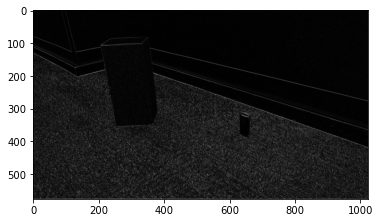

In [248]:
plt.imshow(cv2.cvtColor(hbv,cv2.COLOR_GRAY2RGB))

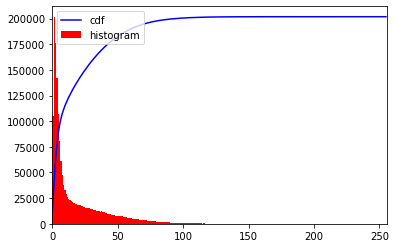

In [249]:
make_hist(cv2.cvtColor(hbv,cv2.COLOR_GRAY2RGB),['b','r'], ('cdf','histogram'),plt)